In [1]:
import numpy as np
import random
import math
import matplotlib.pyplot as plt
from scipy.spatial import distance
from PIL import Image
import time
np.set_printoptions(suppress=True)
from math import sqrt  # Import the sqrt function from the math module
import os
import scipy.io
from matplotlib import colors
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter
from scipy.optimize import minimize
from skimage.measure import label, regionprops

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
legend_font = {'family': 'serif', 'size': 18}
label_font = {'family': 'serif','fontsize': 18}
tick_font = {'family': 'serif', 'size': 17}

label_font_medium = {'family': 'serif','fontsize': 28}
legend_font_medium = {'family': 'serif','size': 28}
tick_font_medium = {'family': 'serif', 'size': 27}

label_font_large = {'family': 'serif','fontsize': 32}
legend_font_large = {'family': 'serif','size': 32}
tick_font_large = {'family': 'serif', 'size': 30}



In [4]:
def gaussian_2d(Z):
  # Assuming Z is your 2D numpy array representing the image
  x, y = np.meshgrid(np.arange(Z.shape[1]), np.arange(Z.shape[0]))

  # Step 1: Calculate mean (x_mean, y_mean)
  Z_sum = Z.sum()
  x_mean = (x * Z).sum() / Z_sum
  y_mean = (y * Z).sum() / Z_sum

  # Step 2: Calculate the covariance matrix
  Cov_xx = ((x - x_mean)**2 * Z).sum() / Z_sum
  Cov_yy = ((y - y_mean)**2 * Z).sum() / Z_sum
  Cov_xy = ((x - x_mean) * (y - y_mean) * Z).sum() / Z_sum

  cov_matrix = np.array([[Cov_xx, Cov_xy], [Cov_xy, Cov_yy]])

  # Step 3: Eigenvalue decomposition
  eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)

  # Step 4: Calculate standard deviations
  sigma_1 = np.sqrt(eigenvalues[0])
  sigma_2 = np.sqrt(eigenvalues[1])

  # eigenvectors[:,0] and eigenvectors[:,1] give the direction of the axes

  # Assuming you have the mean (x_mean, y_mean), standard deviations (sigma_1, sigma_2),
  # and eigenvectors from the previous steps

  # Step 1: Create a grid for the plot
  x, y = np.meshgrid(np.arange(Z.shape[1]), np.arange(Z.shape[0]))

  # Step 2: Calculate the Gaussian function on the grid
  # Create a rotated coordinate system based on the eigenvectors
  coords = np.stack([x - x_mean, y - y_mean], axis=-1)
  rot_coords = np.dot(coords, eigenvectors)

  # Calculate the Gaussian using the formula:
  # f(x, y) = exp(-0.5 * ((x'/sigma_1)^2 + (y'/sigma_2)^2))
  Z_est = np.exp(-0.5 * ((rot_coords[..., 0] / sigma_1)**2 + (rot_coords[..., 1] / sigma_2)**2))

  # Step 3: Plot the estimated Gaussian using imshow (similar to imagesc in MATLAB)
  plt.figure(figsize=(5, 3))
  plt.imshow(Z_est, extent=[0, Z.shape[1], 0, Z.shape[0]], origin='lower', cmap='jet')
  plt.colorbar()
  plt.title("Estimated 2D Gaussian Distribution")
  plt.xlabel('x')
  plt.ylabel('y')


    # Add arrows to represent the Gaussian's axes
  center_x, center_y = x_mean, y_mean
  for i, eigenvector in enumerate(eigenvectors.T):
      # Normalize the eigenvector to use as the direction of the arrow
      norm = np.linalg.norm(eigenvector)
      arrow_length = 1 * max(sigma_1, sigma_2)  # Length of the arrow
      start = [center_x, center_y]
      end = [center_x + eigenvector[0] * arrow_length, center_y + eigenvector[1] * arrow_length]
      plt.arrow(start[0], start[1], end[0] - start[0], end[1] - start[1],
                head_width=1, head_length=2, fc='r', ec='r')

  plt.show()
  return x_mean, y_mean, sigma_1, sigma_2

def fit_and_extract(Z, threshold, file_name):
  results = []
  Z[:,:49] = 0;
  Z[:49,:] = 0;
  Z[73:,:] = 0;
  Z[:,73:] = 0;
  Z_normalized = (Z - np.min(Z)) / (np.max(Z) - np.min(Z))
  Z_normalized[Z_normalized < threshold] = 0
  # Plot the image
  print('Plot of the raw data')
  plt.figure(figsize=(10, 8))
  plt.imshow(Z_normalized, origin='lower', cmap='jet', extent=[-200, 200, -200, 200])
  plt.colorbar()
  plt.title("Z for " + file_name)
  plt.xlabel('X [mm]')
  plt.ylabel('Y [mm]')
  plt.show()

  # Extract values from gaussian_2d(Z)
  results = gaussian_2d(Z_normalized)
  return results

def find_mean_std(resolution, indices,unique_indices):
  mean_fits = []
  std_devs = []

  for i in unique_indices:
      # Select the subset of 'resolution' corresponding to the current index
      y_values = resolution[indices == i]
      x_values = np.arange(len(y_values))

      # Store the mean (mu) and standard deviation (sigma) of the Gaussian fit
      mean_fits.append(np.mean(y_values))  # mu (mean)
      std_devs.append(np.std(y_values))   # sigma (standard deviation)

  # Convert lists to arrays for plotting
  mean_fits = np.array(mean_fits)
  std_devs = np.array(std_devs)
  return mean_fits, std_devs


In [5]:
cycles = 1
voxels_in_row_values = [5, 10 , 16, 20, 25]
indices = np.tile(np.power(voxels_in_row_values, 2) * 2, cycles)
unique_indices = np.unique(indices)


In [ ]:
#def evaluate_500_events():
events_per_source = 500
formation_type =  'plates'
voxels_in_row_values = [5, 10 , 16, 20, 25]
voxels_in_col_values = [5, 10 , 16, 20, 25]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 4
cycles = 10   # to be extended

mu_x = np.zeros(len(voxels_in_row_values)*cycles)
mu_y = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y = np.zeros(len(voxels_in_row_values)*cycles)
mu_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
mu_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
#mu_x, mu_y, sigma_x, sigma_y, mu_x_ref, mu_y_ref, sigma_x_ref, sigma_y_ref = [np.zeros(len([1])*len(voxels_in_row_values)*cycles)] * 8
runs_counter = 0;
for cycle in range(0,cycles):
    for voxels_in_row in voxels_in_row_values:
      for voxels_in_col in voxels_in_col_values:
        if voxels_in_row == voxels_in_col:
          cycle_tmp = cycle
          iter_tmp = iter
          if voxels_in_row == 5 or voxels_in_row == 16:
            iter = iter_tmp
          else :
            iter = iter_tmp - 2
          #if voxels_in_row == 16:
          #  cycle = cycle_tmp % 5
          print('iter value is ', iter, 'cycle value is ', cycle)
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/'+ file_name)
          Z = mat_contents['target_final']
          threshold = 0.08 # percents from the maximum
          if voxels_in_row == 16:
            threshold = 0.2
            Z[:,:55] = 0;
            Z[:55,:] = 0;
          if voxels_in_row == 20:
            threshold = 0.17
          if voxels_in_row == 25:
            threshold = 0.28
          mu_x[runs_counter], mu_y[runs_counter], sigma_x[runs_counter], sigma_y[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          cycle = cycle_tmp
          iter = iter_tmp

          # Add the reference upper bound results
          cycle_tmp = cycle
          if cycle > 4:
            cycle = cycle - 5
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(voxels_in_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/'+ file_name)
          Z = mat_contents['target_final']
          threshold = 0.12 # percents from the maximum
          #if voxels_in_row == 16:
          #  threshold = 0.2
          #  Z[:,:55] = 0;
          #  Z[:55,:] = 0;
          #if voxels_in_row == 20:
          #  threshold = 0.22
          #if voxels_in_row == 25:
          #  threshold = 0.28
          mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          print(mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter])
          runs_counter = runs_counter + 1
          print('runs_counter = ', runs_counter)
          cycle = cycle_tmp


FWHM_x = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x
FWHM_y = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y
FWHM_x_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x_ref
FWHM_y_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y_ref

mu_x_mm = mu_x * image_res - 200
mu_y_mm = mu_y * image_res - 200
mu_x_ref_mm = mu_x_ref * image_res - 200
mu_y_ref_mm = mu_y_ref * image_res - 200

localization_error_x = np.abs(mu_x_mm - 100)
localization_error_y = np.abs(mu_y_mm - 100)
localization_error_x_ref = np.abs(mu_x_ref_mm - 100)
localization_error_y_ref = np.abs(mu_y_ref_mm - 100)

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
fig.suptitle('Results for '+ str(events_per_source) +' events')
indices = np.tile(np.power(voxels_in_row_values, 2) * 2, cycles)


# Plot mu_x
axs[0, 0].plot(indices, localization_error_x, marker='o', linestyle='None', color='b', label ='Grouping Method')
axs[0, 0].plot(indices, localization_error_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 0].set_title('Localization error X vs. Voxels')
axs[0, 0].set_xlabel('Number of voxels')
axs[0, 0].set_ylabel('Localization error X [mm]')
#axs[0, 0].set_ylim(57, 60)
axs[0, 0].legend()

# Plot mu_y
axs[0, 1].plot(indices, localization_error_y, marker='o', linestyle='None', color='g', label ='Grouping Method')
axs[0, 1].plot(indices, localization_error_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 1].set_title('Localization error Y vs. Voxels')
axs[0, 1].set_xlabel('Number of voxels')
axs[0, 1].set_ylabel('Localization error Y [mm]')
#axs[0, 1].set_ylim(57, 60)
axs[0, 1].legend()

# Plot FWHM_x
axs[1, 0].plot(indices, FWHM_x, marker='o', linestyle='None', color='r', label ='Grouping Method')
axs[1, 0].plot(indices, FWHM_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 0].set_title('FWHM_x vs. Voxels')
axs[1, 0].set_xlabel('Number of voxels')
axs[1, 0].set_ylabel('FWHM_x[mm]')
axs[1, 0].set_ylim(0, 61)
axs[1, 0].legend()

# Plot FWHM_y
axs[1, 1].plot(indices, FWHM_y, marker='o', linestyle='None', color='m', label ='Grouping Method')
axs[1, 1].plot(indices, FWHM_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 1].set_title('FWHM_y vs. Voxels')
axs[1, 1].set_xlabel('Number of voxels')
axs[1, 1].set_ylabel('FWHM_y[mm]')
axs[1, 1].set_ylim(0, 61)
axs[1, 1].legend()

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
for ax in axs.flat:
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)
# Enable grid for all subplots
for ax in axs.flat:
    ax.grid(True)

# Adjust layout

plt.tight_layout()
plt.show()

############# Total Resolution
resolution = np.sqrt(FWHM_x*FWHM_y)
resolution_ref = np.sqrt(FWHM_x_ref*FWHM_y_ref)
plt.figure(figsize=(8, 6))

# Plot 'resolution'
plt.plot(indices, resolution, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'resolution_ref'
plt.plot(indices, resolution_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Resolution [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

############# Total Localization Error
localization_error = np.sqrt(localization_error_x**2 + localization_error_y**2)
localization_error_ref = np.sqrt(localization_error_x_ref**2 + localization_error_y_ref**2)

plt.figure(figsize=(8, 6))

# Plot 'localization_error'
plt.plot(indices, localization_error, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'localization_error_ref'
plt.plot(indices, localization_error_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Localization Error [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

resolution[indices == 1250] = np.where(resolution[indices == 1250] < 20, 20, resolution[indices == 1250])
localization_error[indices == 1250] = np.where(localization_error[indices == 1250] > 6, 5, localization_error[indices == 1250])

unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]
resolution_ref_std[1], resolution_ref_std[2] = resolution_ref_std[2], resolution_ref_std[1]
############# Total Resolution
plt.figure(figsize=(7, 4.5))

# Plot 'resolution'
plt.errorbar(unique_indices, resolution_mean, yerr = resolution_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'resolution_ref'
plt.errorbar(unique_indices, resolution_ref_mean, yerr = resolution_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Resolution [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()


############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9*localization_error_ref_std[3]


plt.figure(figsize=(8, 6))

# Plot 'localization_error_mean'
plt.errorbar(unique_indices, localization_error_mean, yerr = localization_error_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'localization_error_ref_mean'
plt.errorbar(unique_indices, localization_error_ref_mean, yerr = localization_error_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Localization Error [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()
  #return resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std




Output hidden; open in https://colab.research.google.com to view.

iter value is  5 cycle value is  0
Plot of the raw data


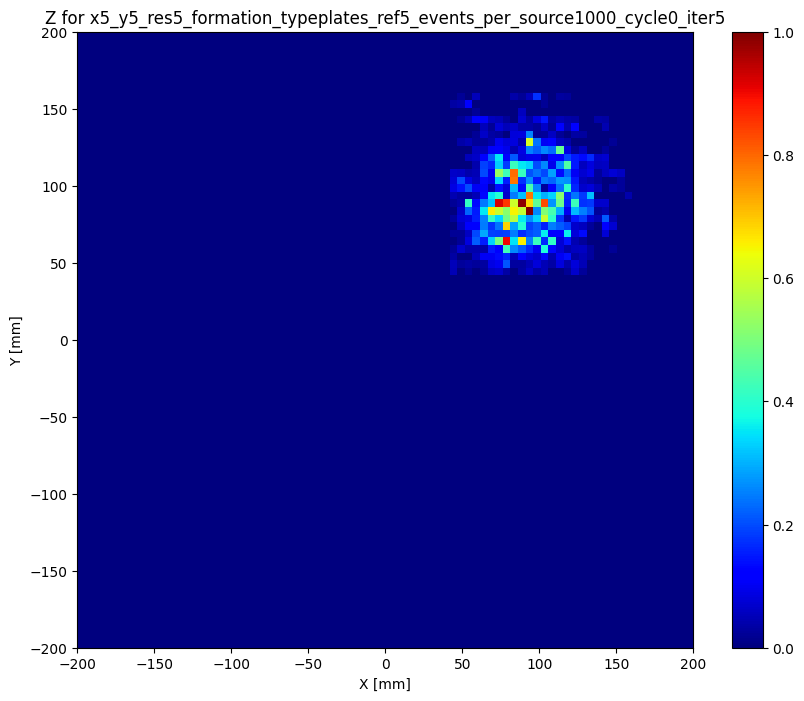

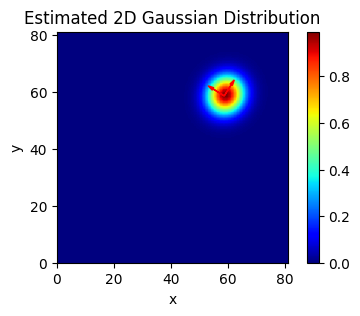

Plot of the raw data


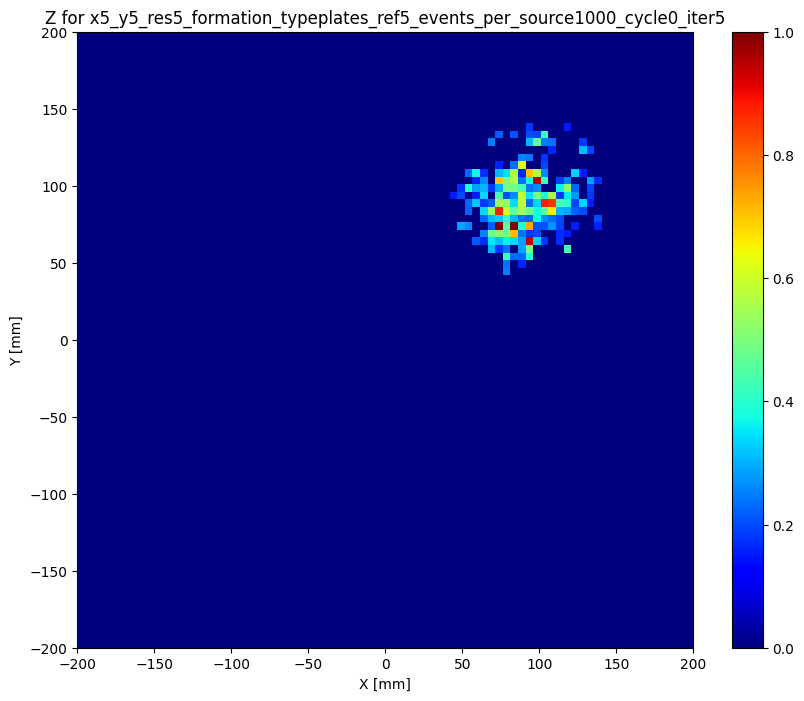

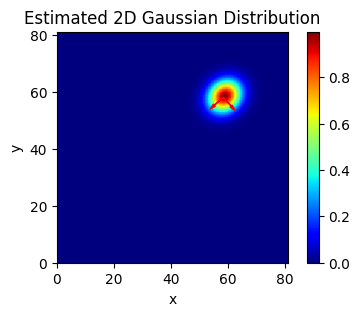

58.30662581137075 58.02886010603305 3.552725435935068 4.173597524234005
runs_counter =  1
iter value is  3 cycle value is  0
Plot of the raw data


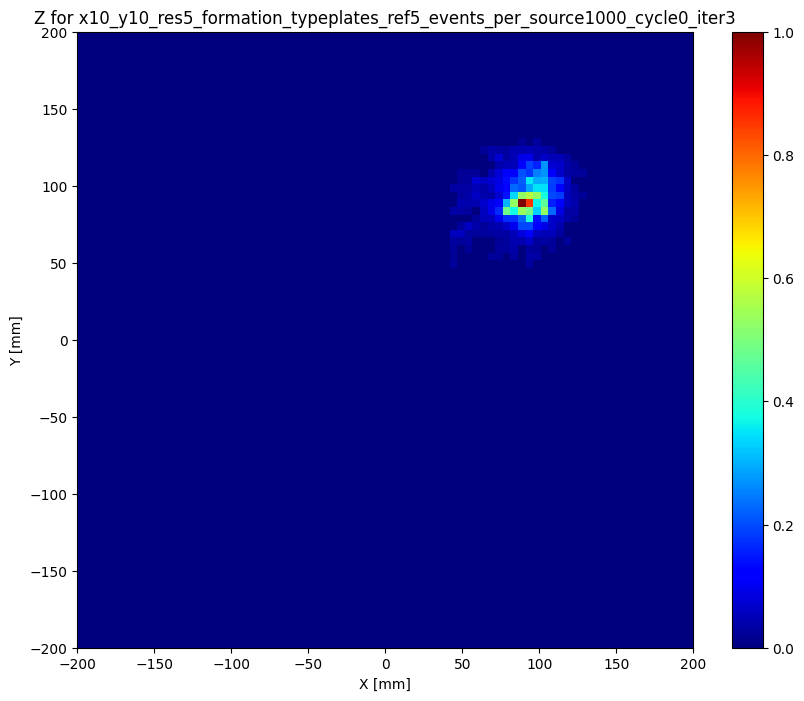

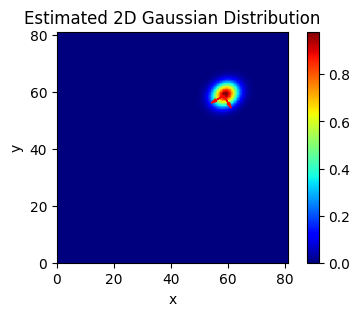

Plot of the raw data


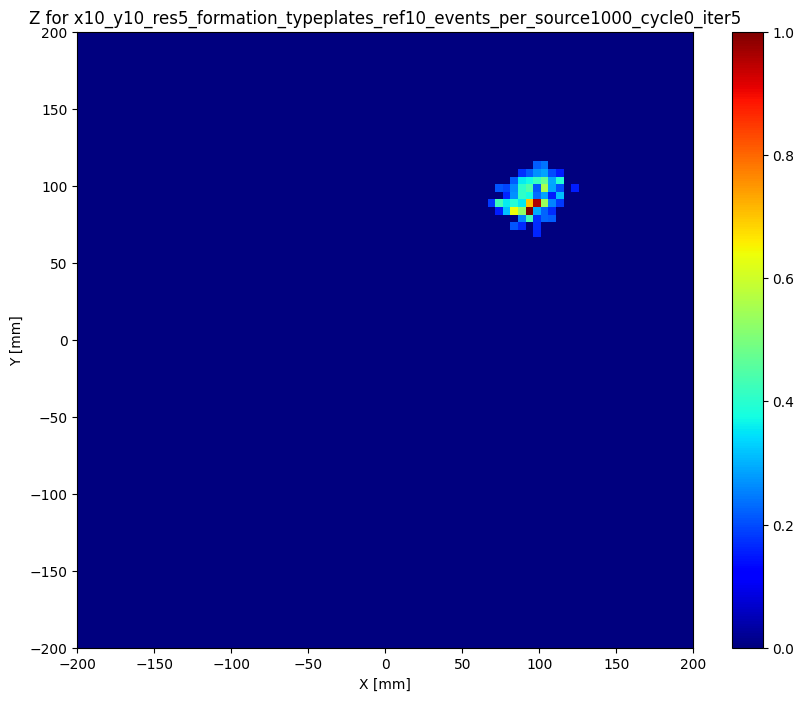

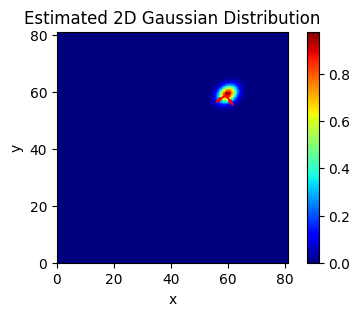

59.296597127945766 58.77988627811077 1.7615222285494165 2.328321904310916
runs_counter =  2
iter value is  3 cycle value is  0
Plot of the raw data


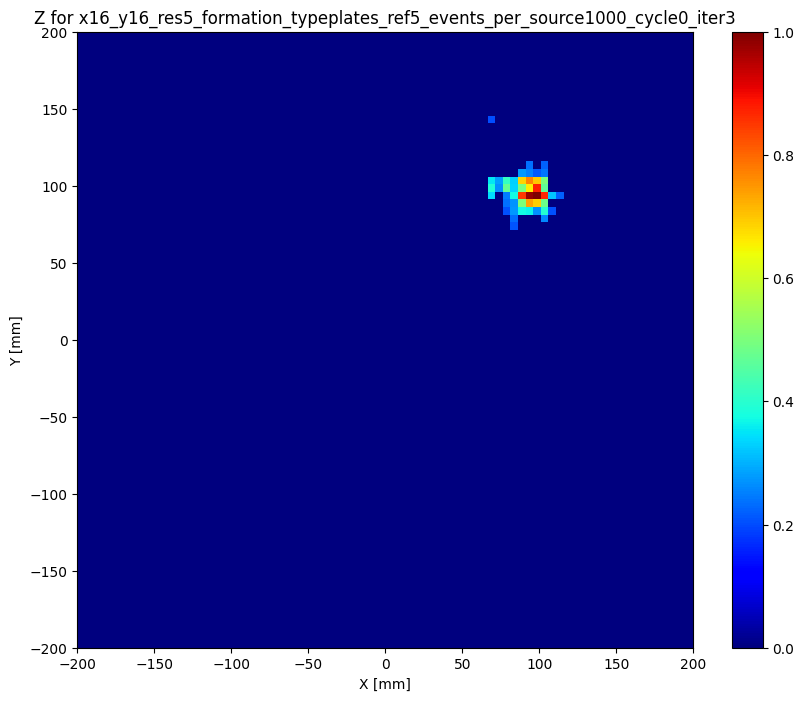

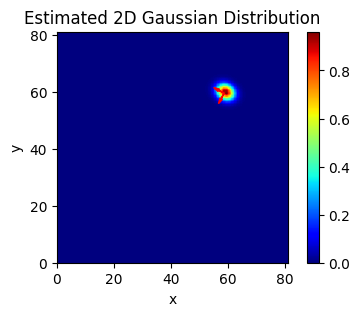

Plot of the raw data


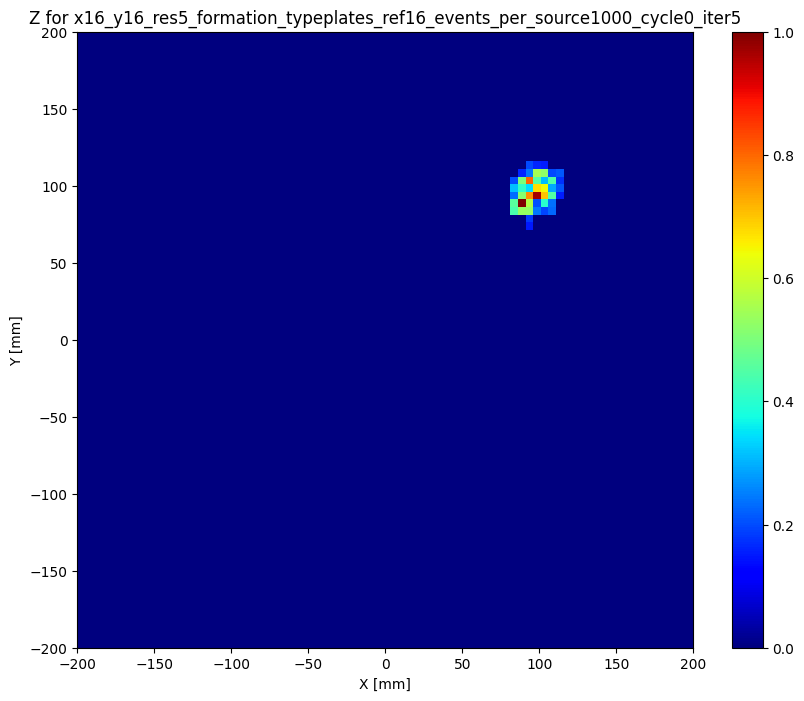

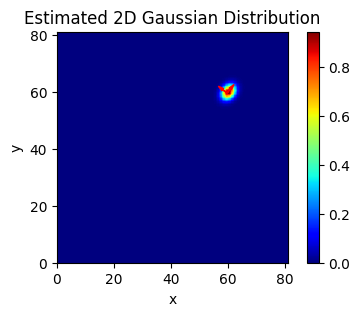

59.64963554411655 59.464766229608685 1.4364707810362911 1.8887862101382857
runs_counter =  3
iter value is  3 cycle value is  0
Plot of the raw data


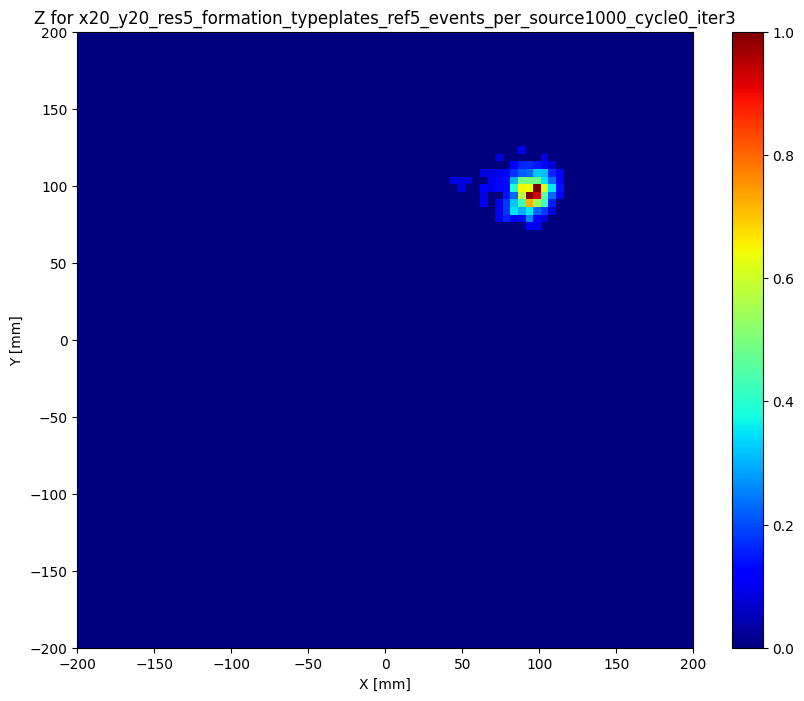

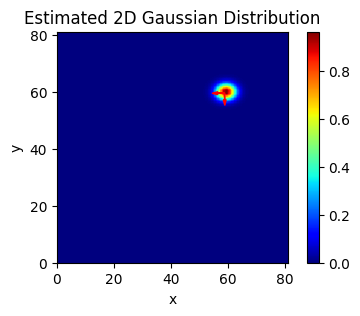

Plot of the raw data


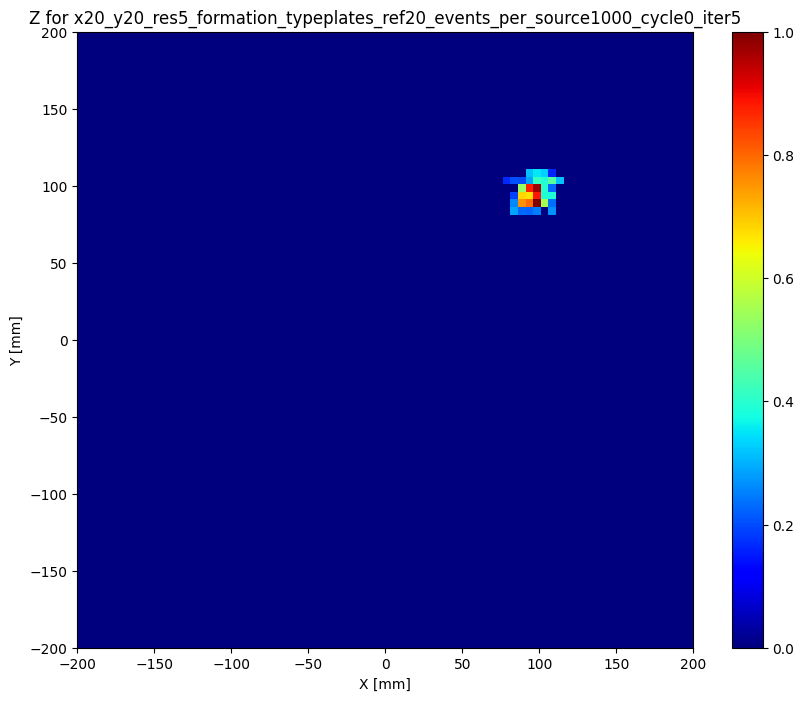

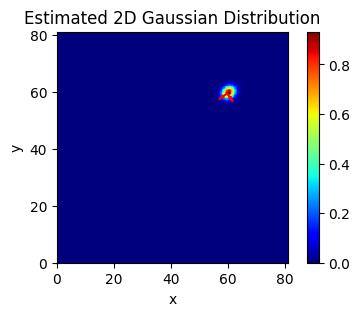

59.65927998937494 59.357733310192984 1.313571294501122 1.6244271827785324
runs_counter =  4
iter value is  3 cycle value is  0
Plot of the raw data


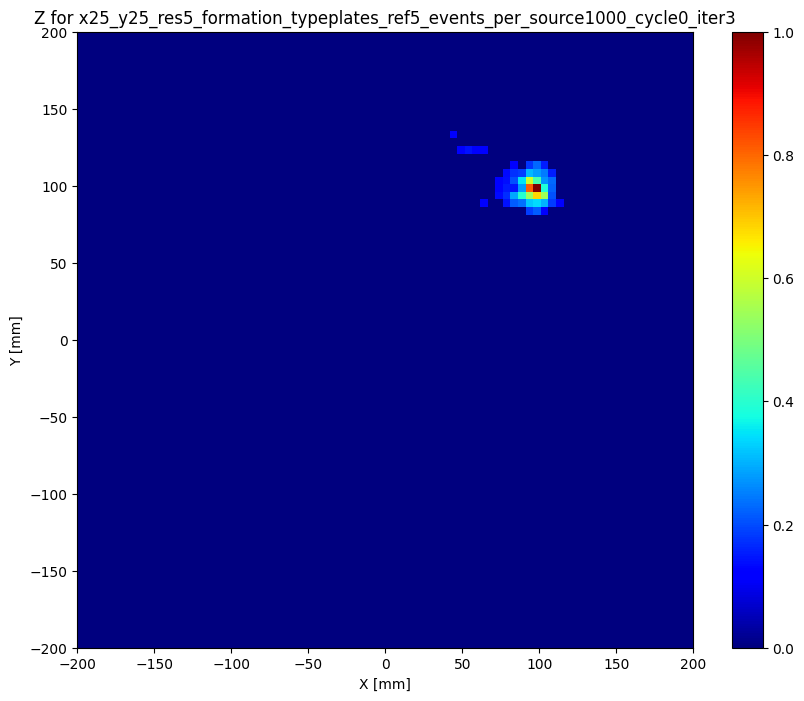

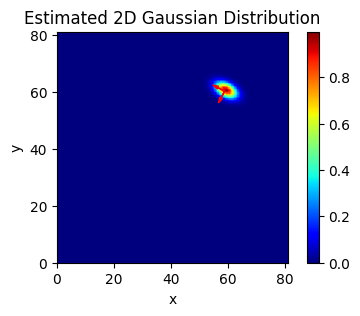

Plot of the raw data


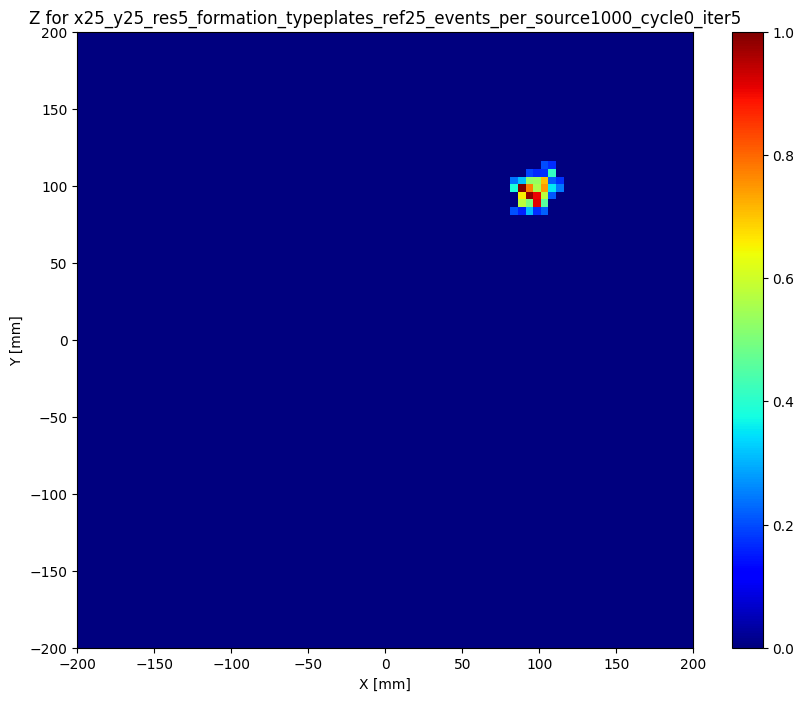

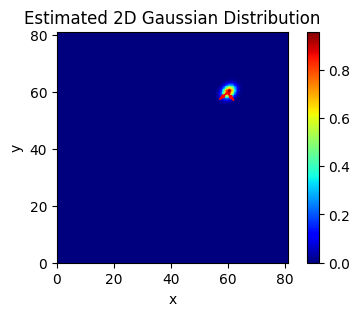

59.72419831533366 59.616797684378 1.2478226179268306 1.6338636076254947
runs_counter =  5
iter value is  5 cycle value is  1
Plot of the raw data


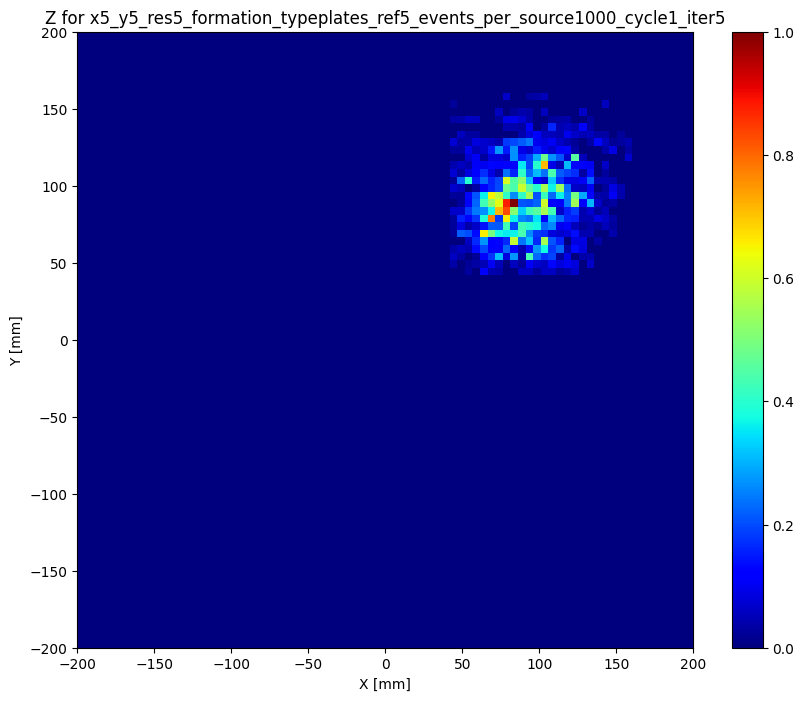

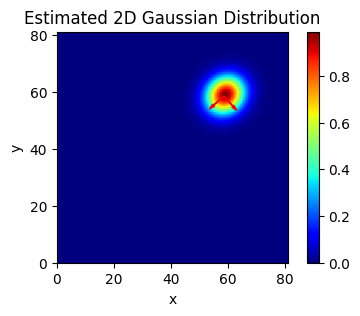

Plot of the raw data


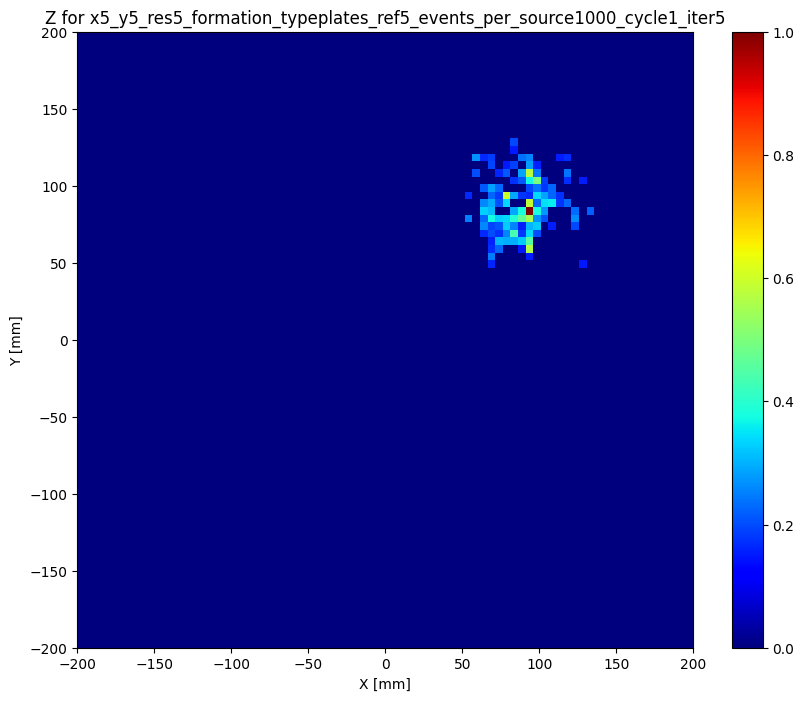

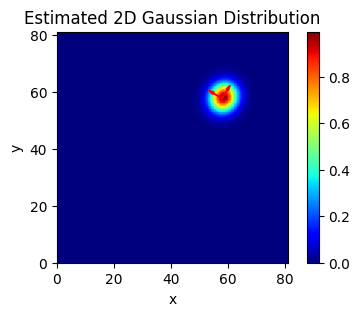

57.89317990638282 57.590928433758734 3.2103003794204064 3.529104954521023
runs_counter =  6
iter value is  3 cycle value is  1
Plot of the raw data


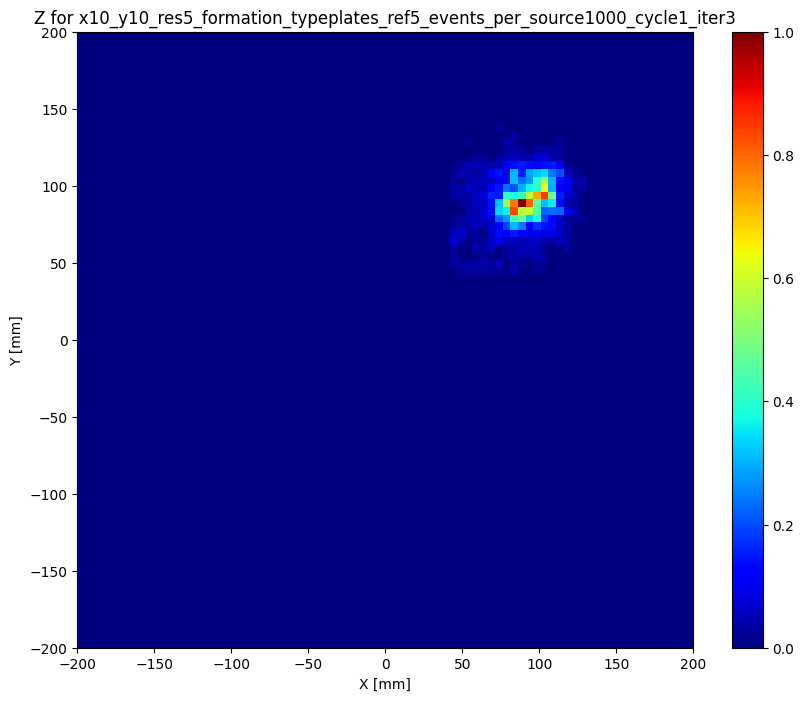

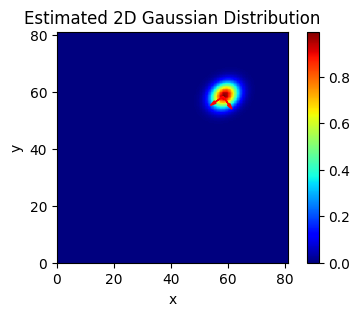

Plot of the raw data


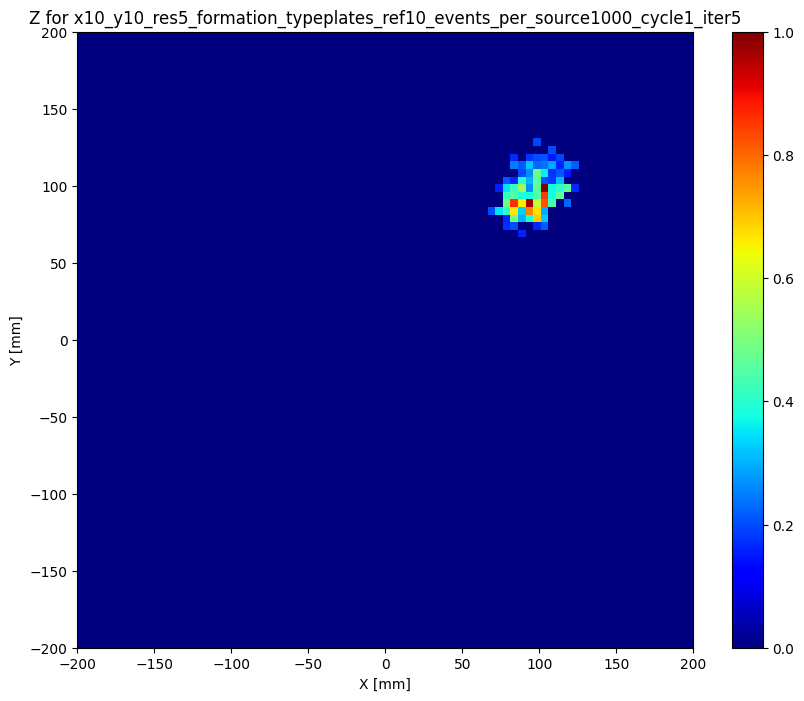

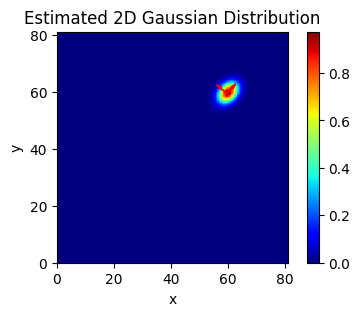

59.52811199882677 59.287826242712164 1.9437999065647062 2.748904504440403
runs_counter =  7
iter value is  3 cycle value is  1
Plot of the raw data


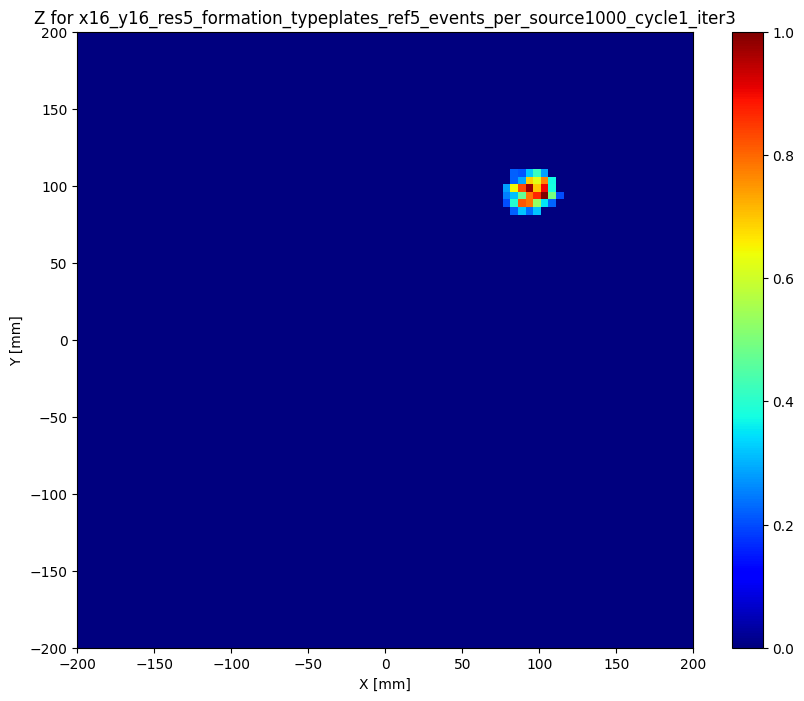

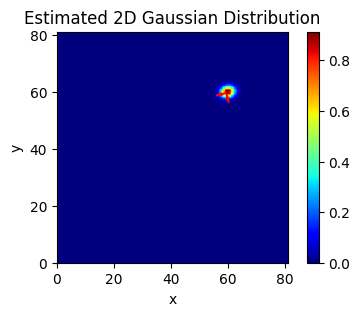

Plot of the raw data


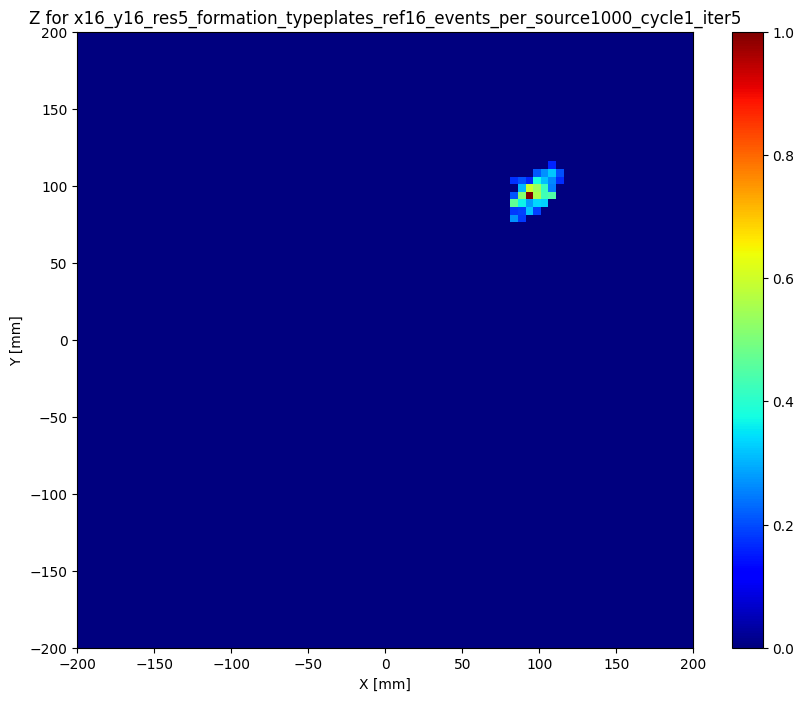

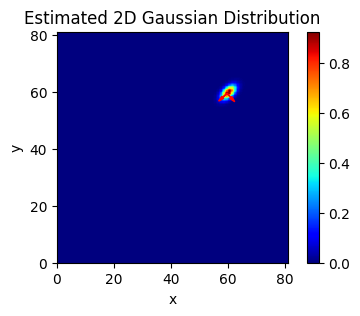

59.64147667432747 59.37686717509821 1.1041678468388723 2.005999589781876
runs_counter =  8
iter value is  3 cycle value is  1
Plot of the raw data


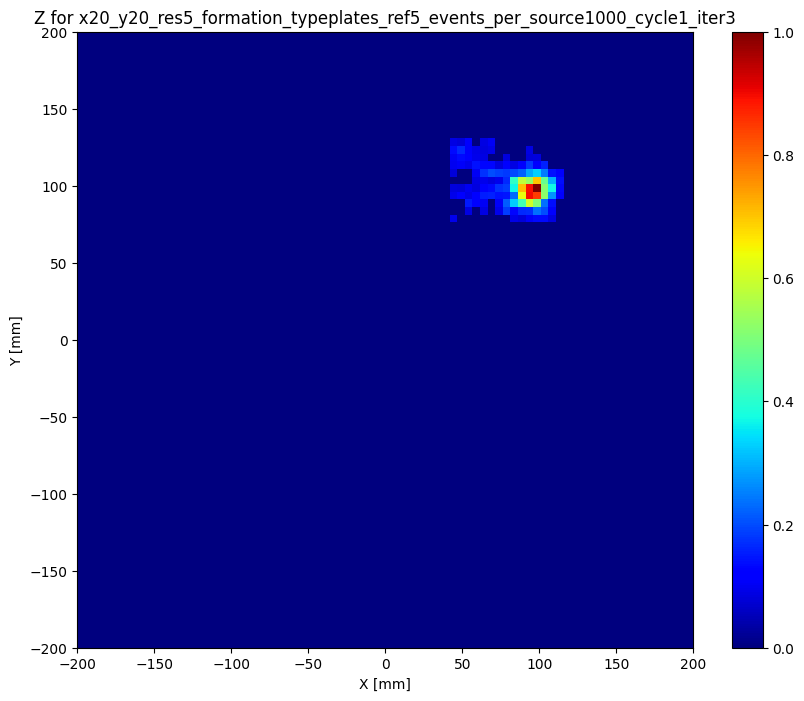

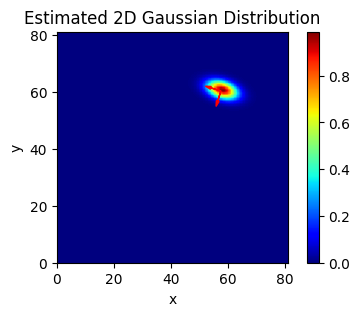

Plot of the raw data


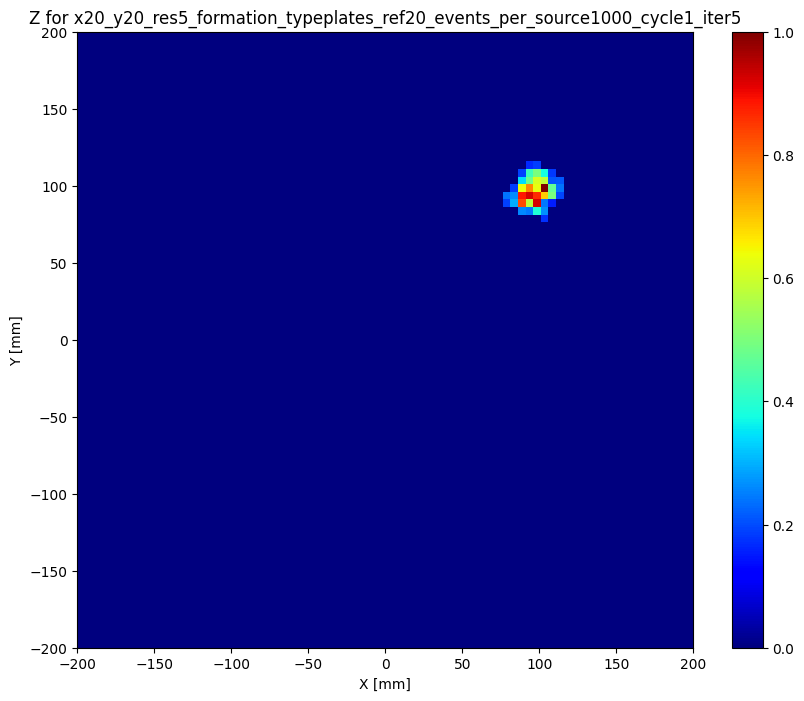

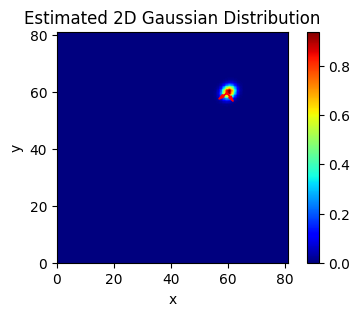

59.68415353406835 59.52294956353503 1.3913550822607827 1.6597587090113475
runs_counter =  9
iter value is  3 cycle value is  1
Plot of the raw data


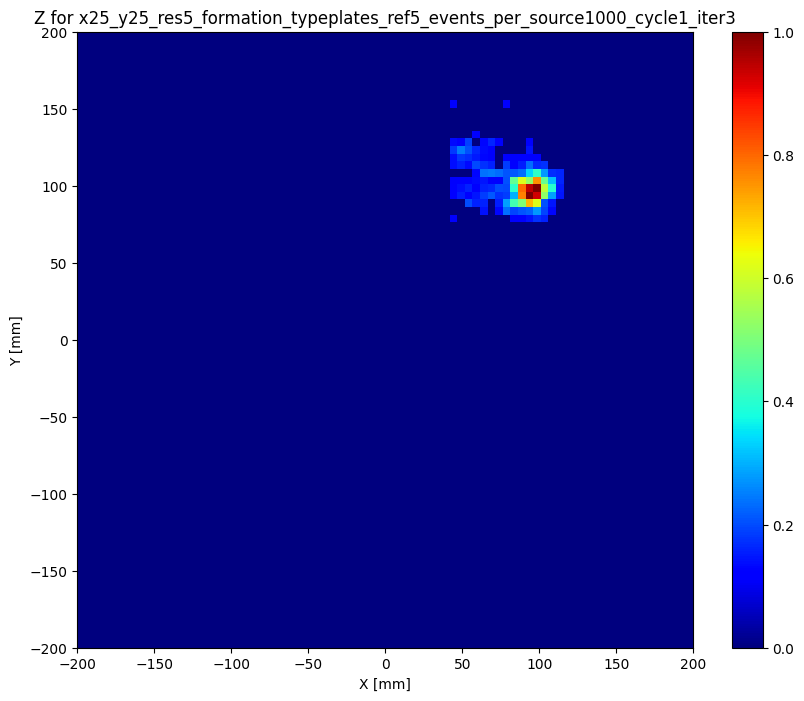

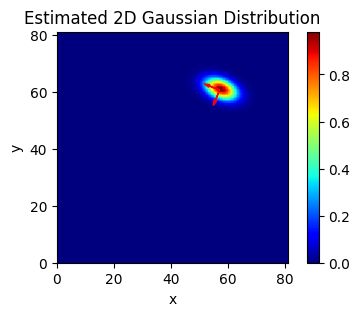

Plot of the raw data


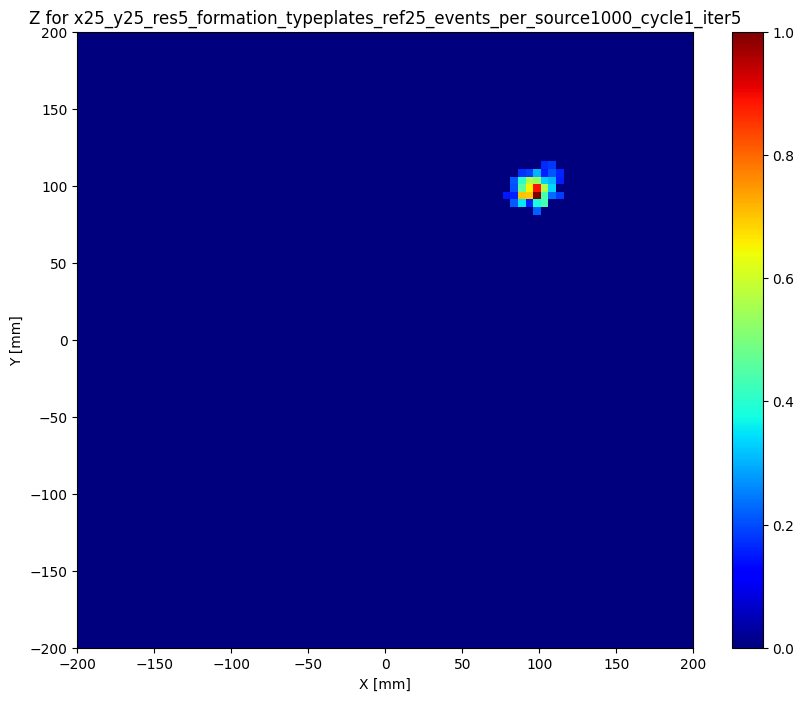

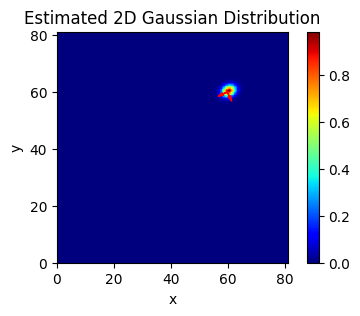

59.73294119651843 59.888064028224484 1.2450678104232205 1.641232344526905
runs_counter =  10
iter value is  5 cycle value is  2
Plot of the raw data


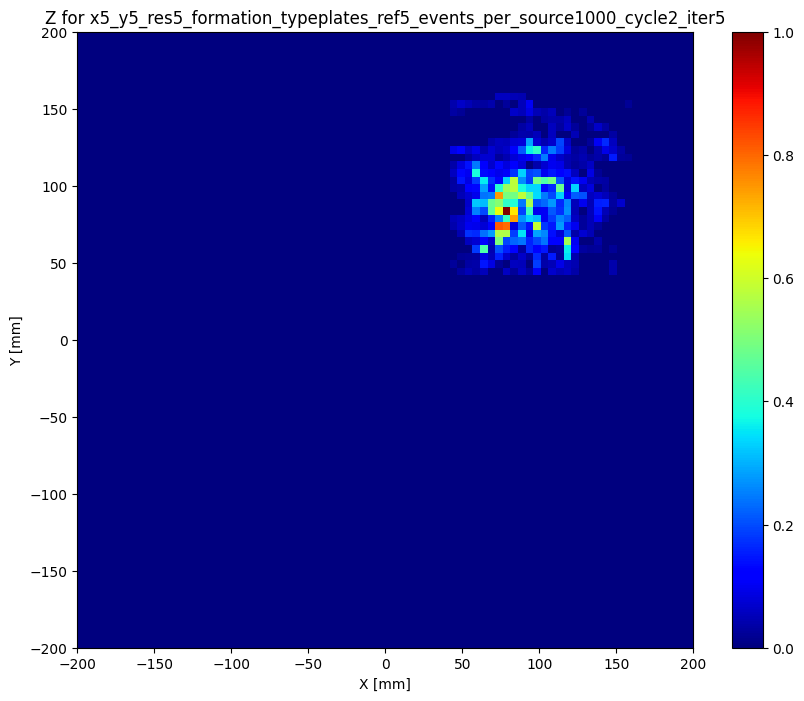

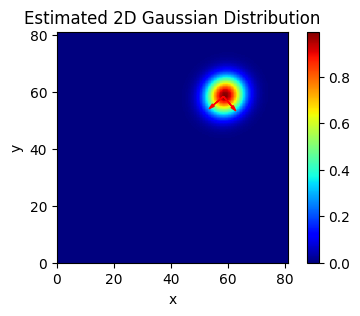

Plot of the raw data


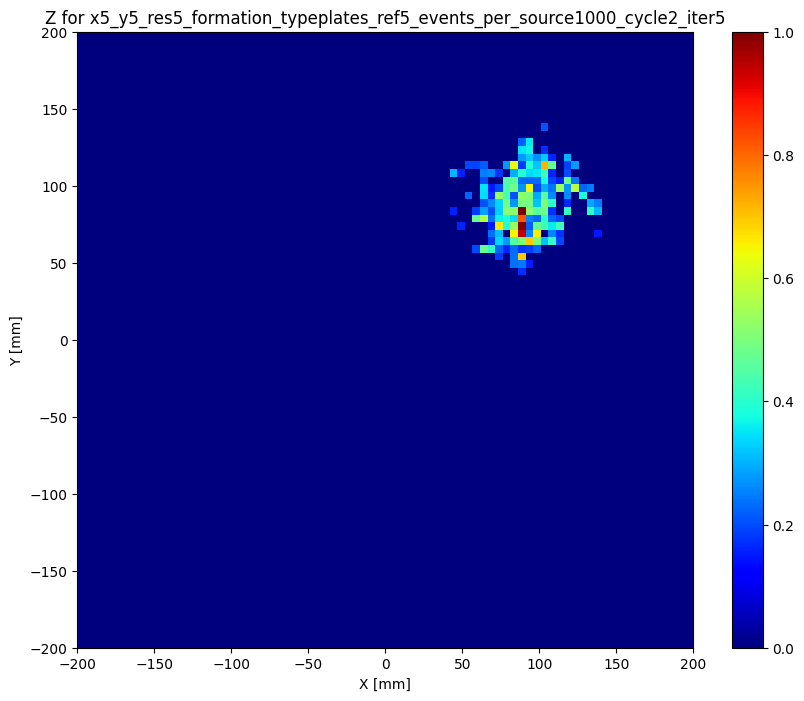

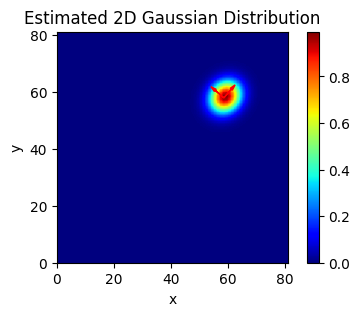

58.547565295307045 57.81686894099816 3.4392696576802093 3.9933100541077464
runs_counter =  11
iter value is  3 cycle value is  2
Plot of the raw data


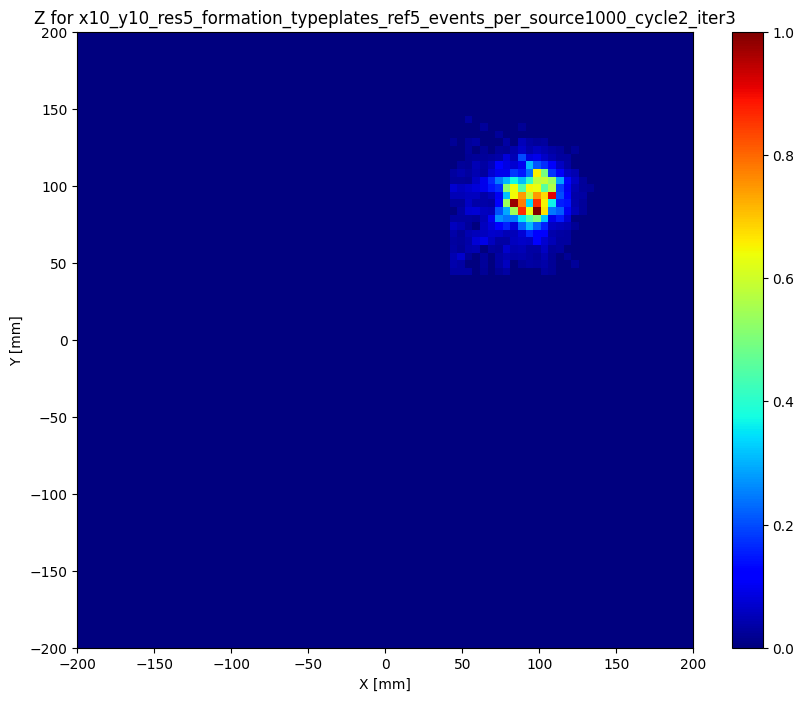

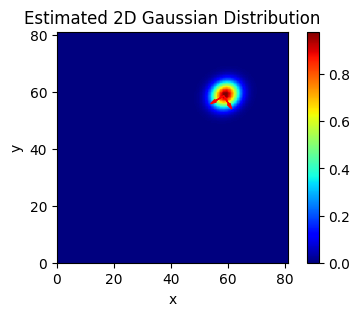

Plot of the raw data


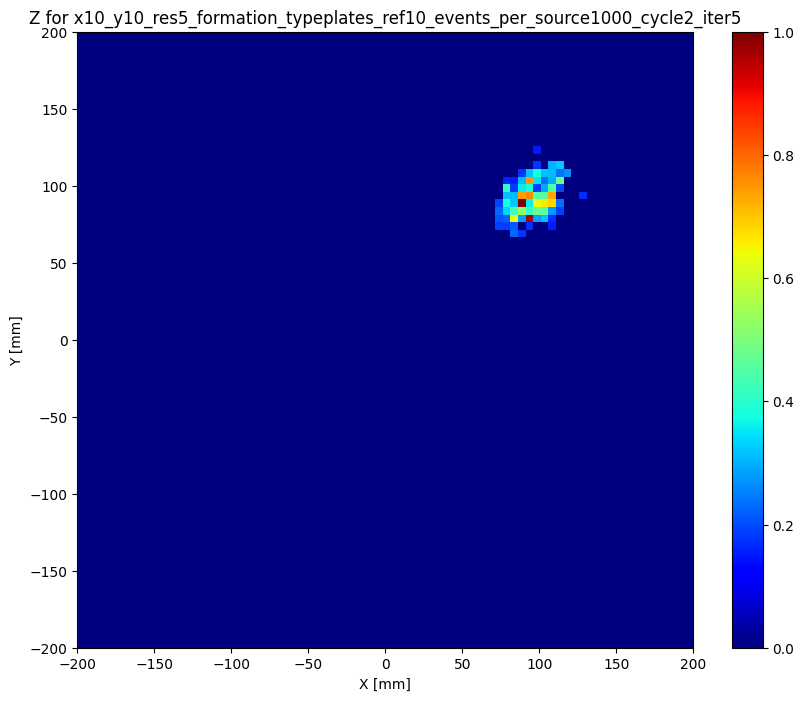

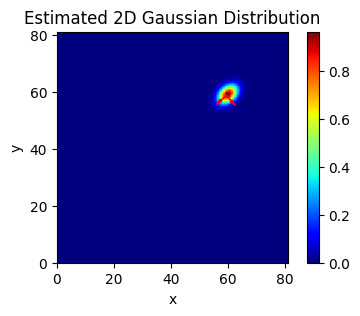

59.41312745563867 58.66963496503297 1.7854917212349601 2.619132255976433
runs_counter =  12
iter value is  3 cycle value is  2
Plot of the raw data


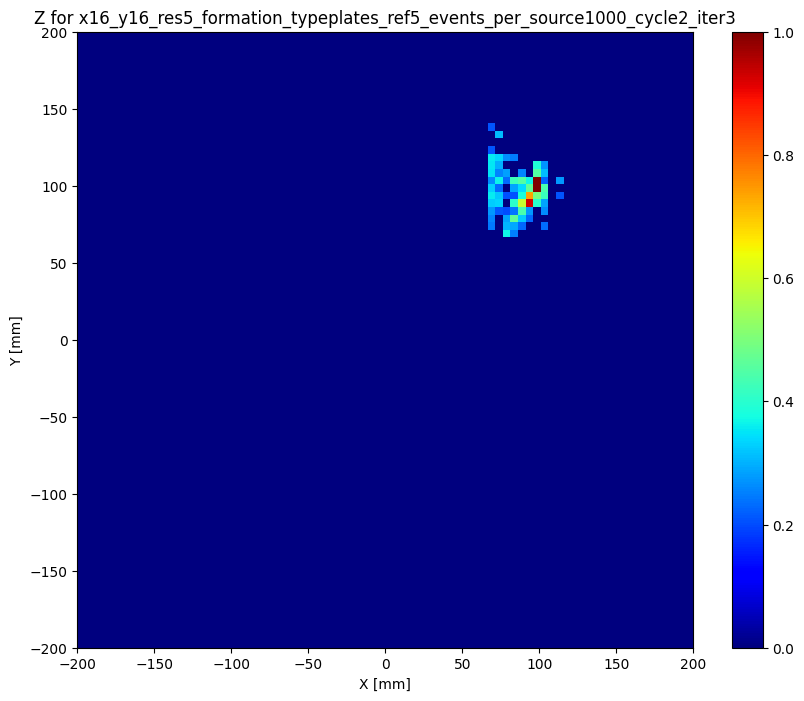

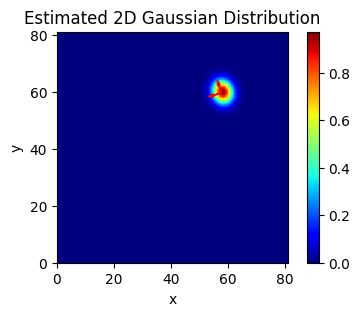

Plot of the raw data


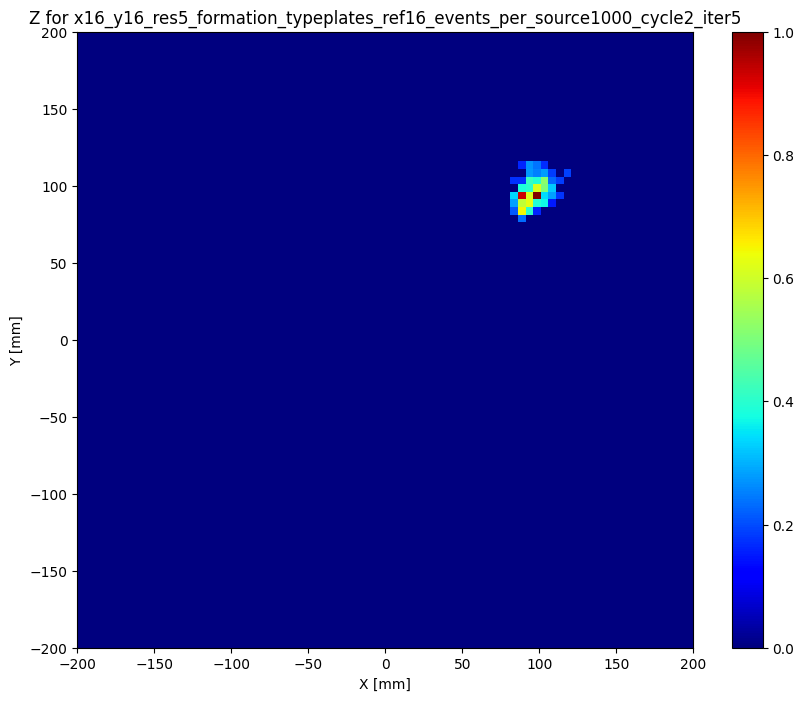

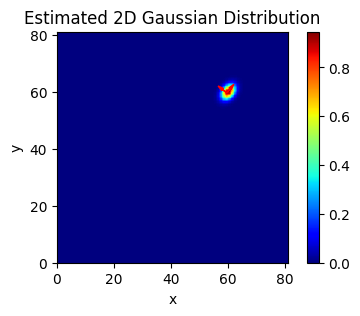

59.58138869471045 59.52238801403768 1.3209770115213644 1.9162796955968413
runs_counter =  13
iter value is  3 cycle value is  2
Plot of the raw data


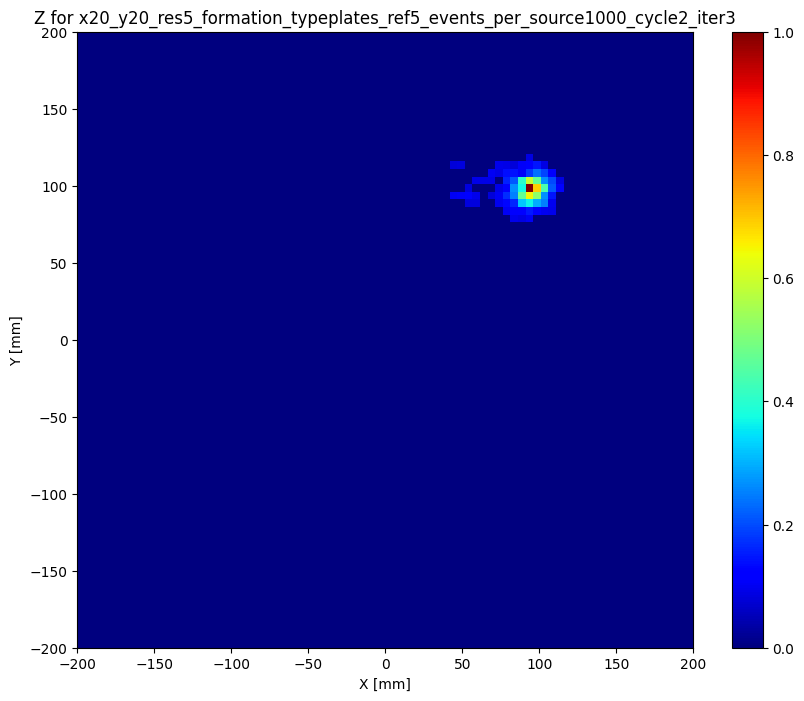

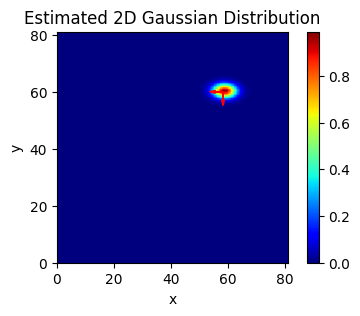

Plot of the raw data


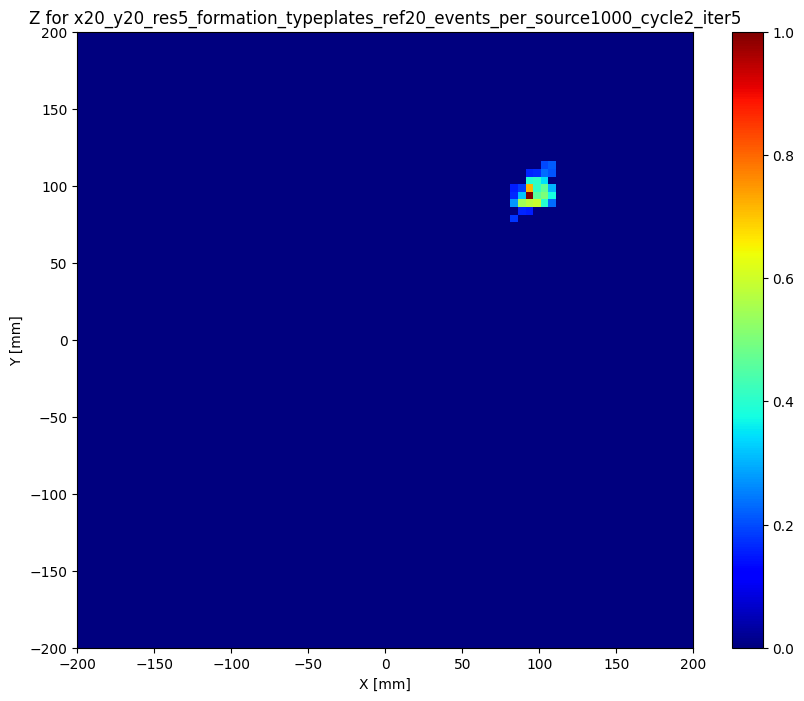

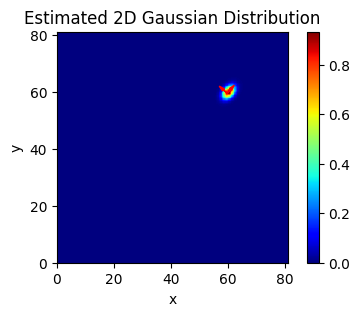

59.7221873429655 59.44971665390279 1.1386576027829765 1.7332043893864169
runs_counter =  14
iter value is  3 cycle value is  2
Plot of the raw data


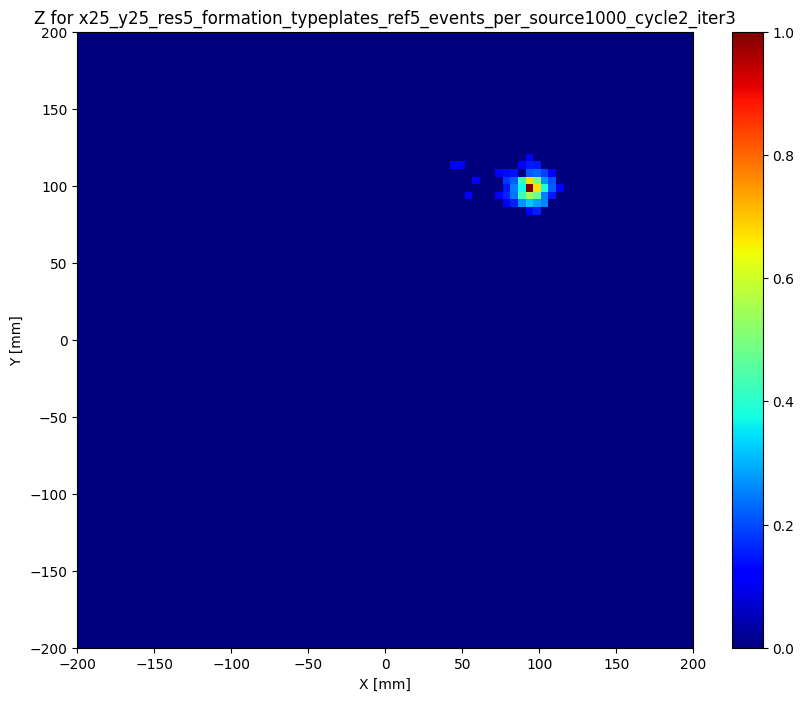

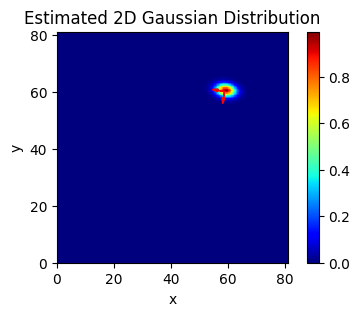

Plot of the raw data


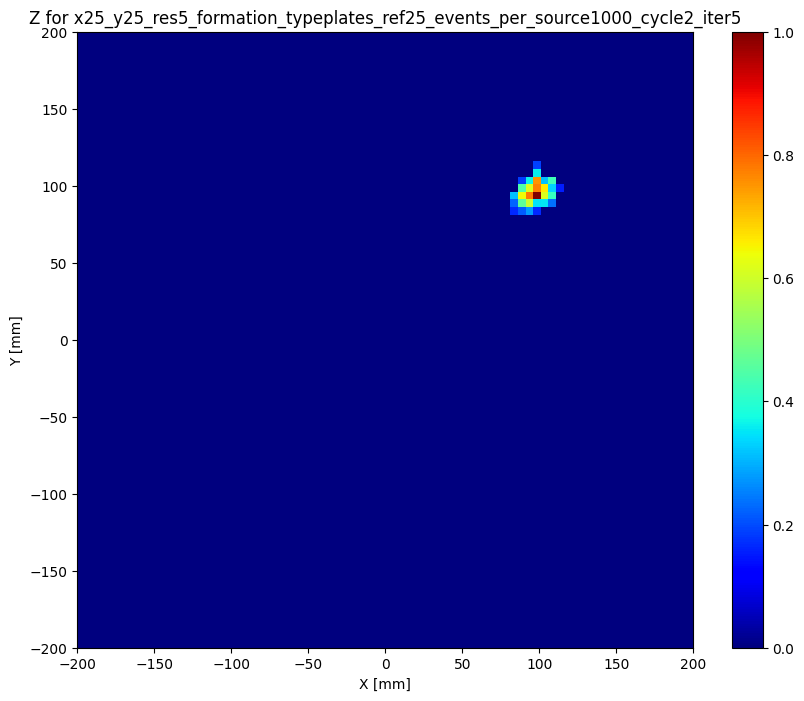

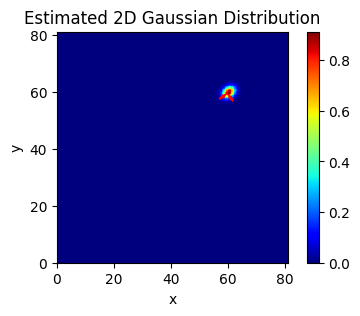

59.72418534813054 59.406952016306555 1.1450549703279733 1.5439241218490325
runs_counter =  15
iter value is  5 cycle value is  3
Plot of the raw data


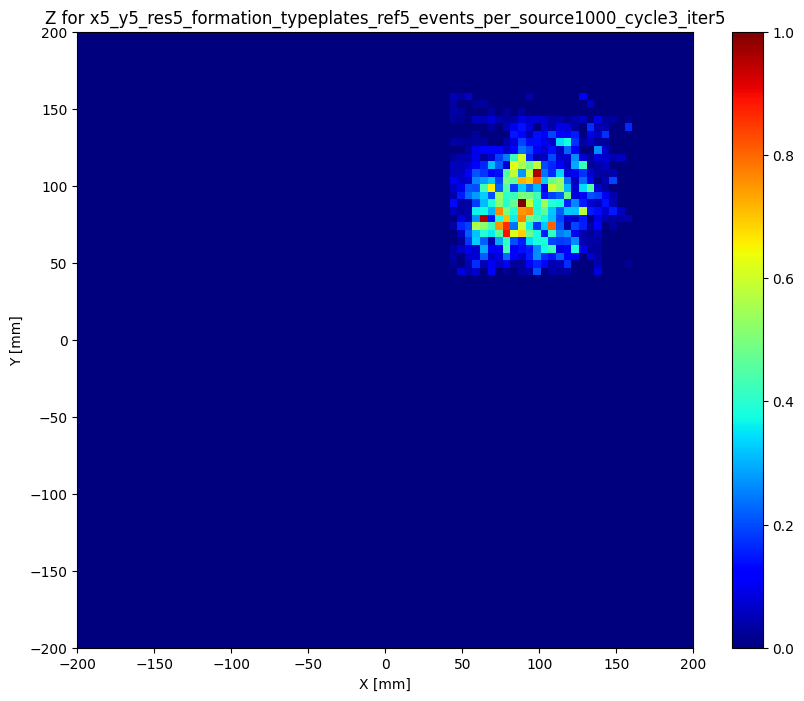

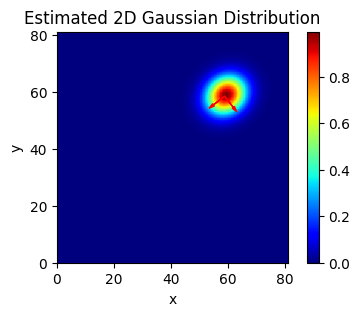

Plot of the raw data


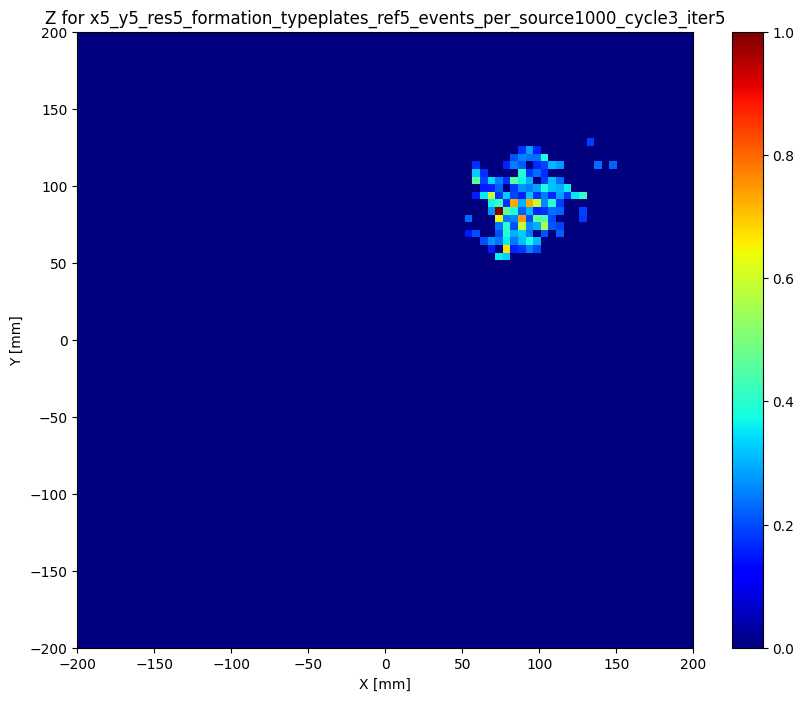

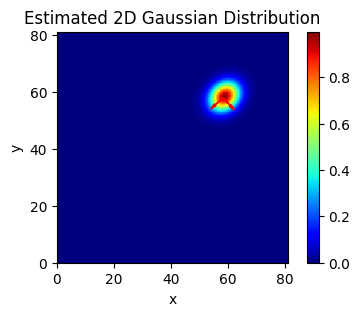

58.271920500654595 57.87759297187295 3.0974919497380955 3.8345475504390705
runs_counter =  16
iter value is  3 cycle value is  3
Plot of the raw data


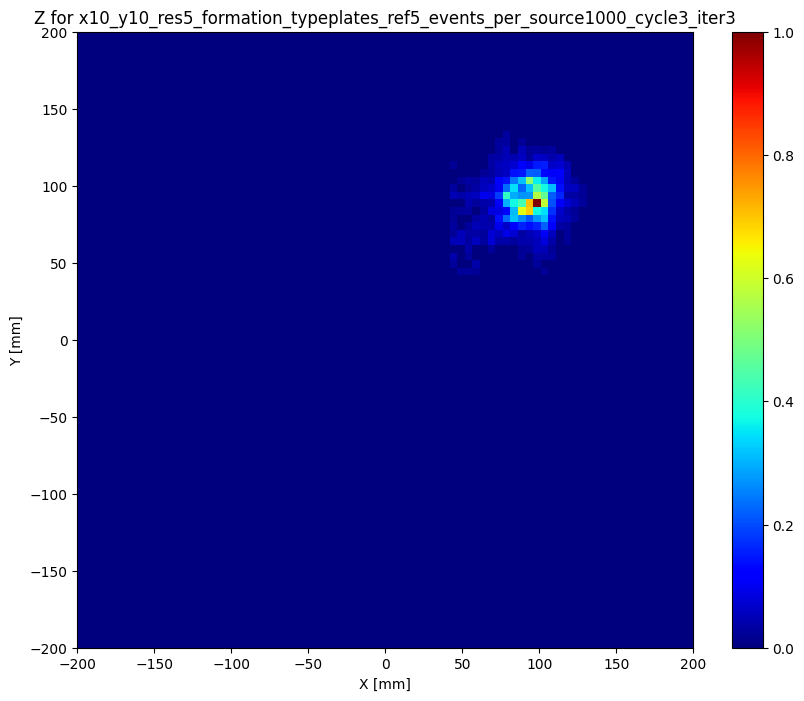

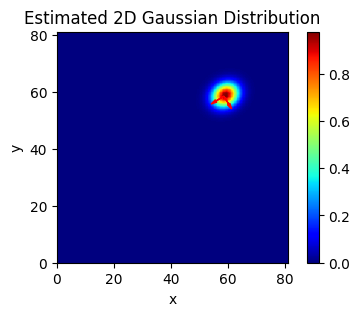

Plot of the raw data


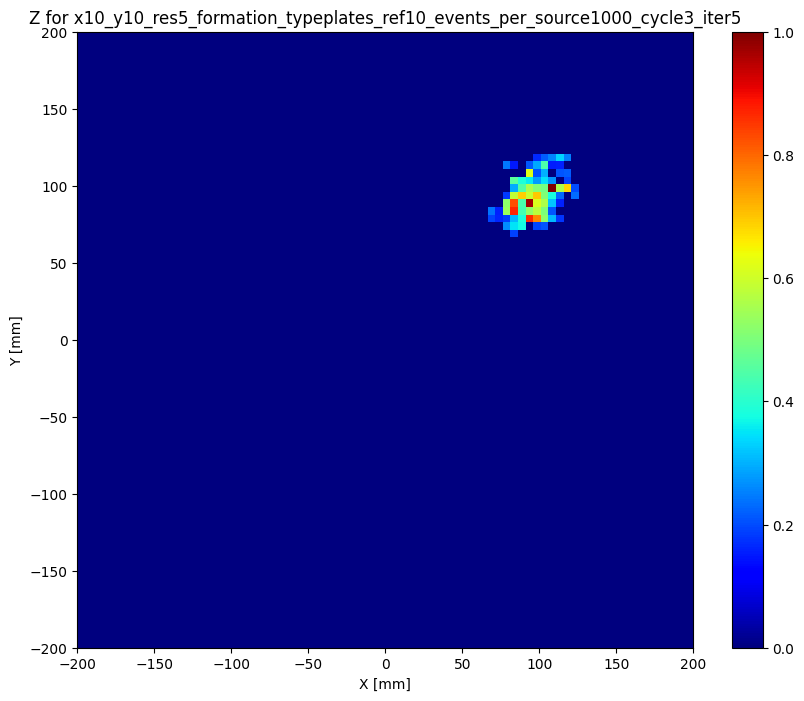

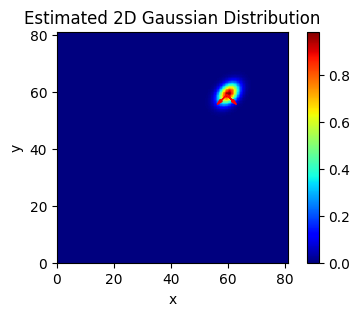

59.58813546001108 58.868657523791164 1.8936560091540966 2.787201098143371
runs_counter =  17
iter value is  3 cycle value is  3
Plot of the raw data


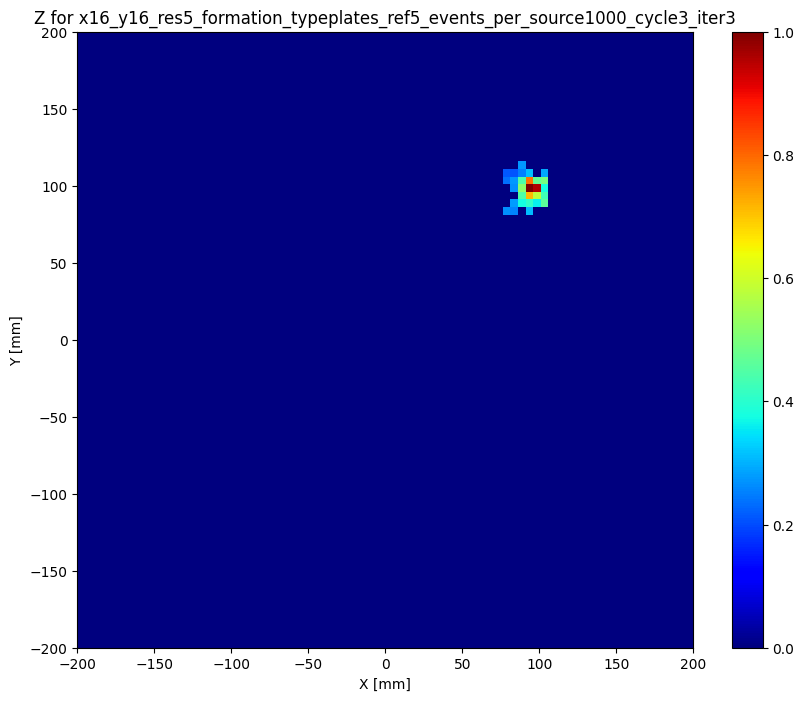

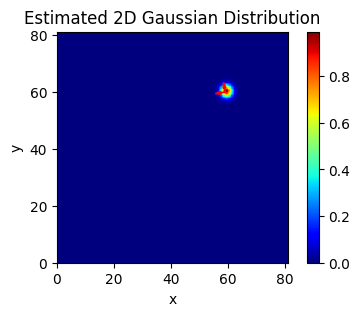

Plot of the raw data


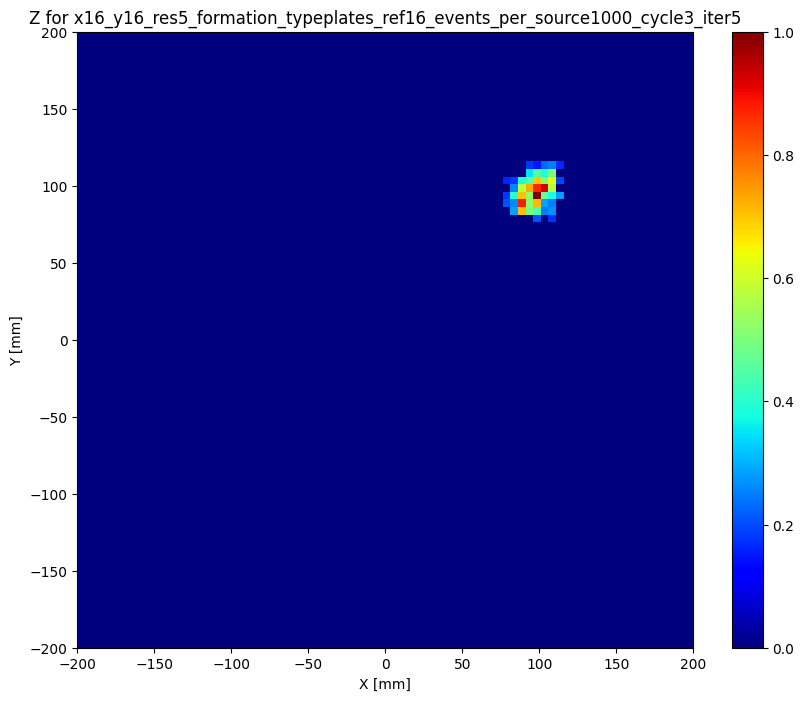

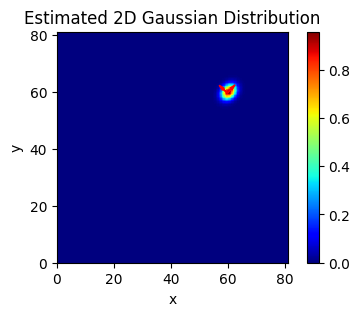

59.73878673519717 59.51389897717731 1.4724912428788293 1.9230330014881198
runs_counter =  18
iter value is  3 cycle value is  3
Plot of the raw data


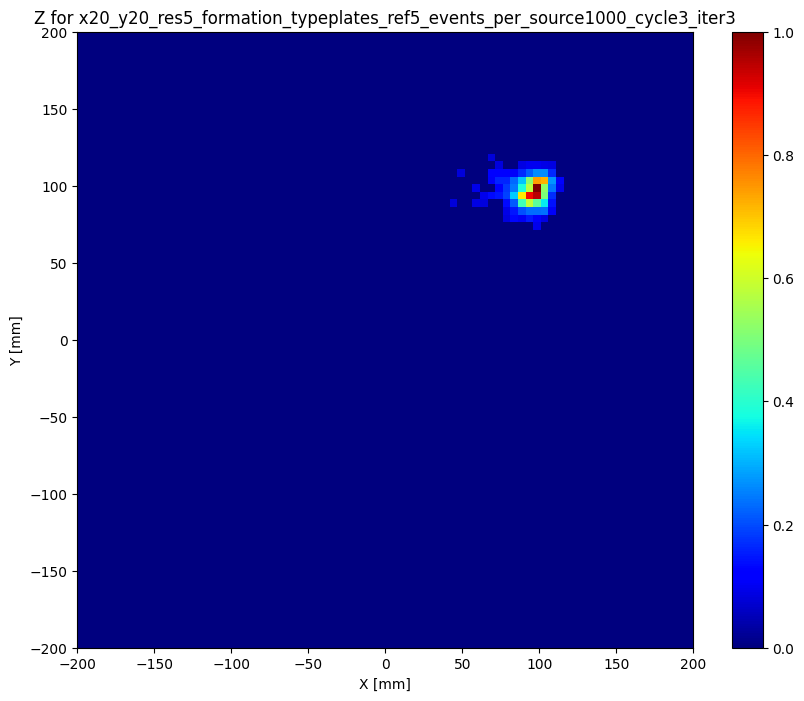

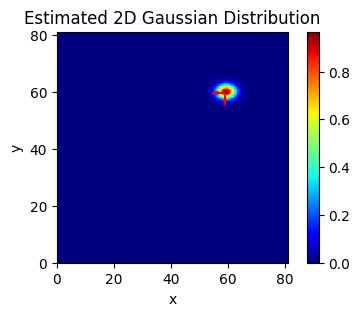

Plot of the raw data


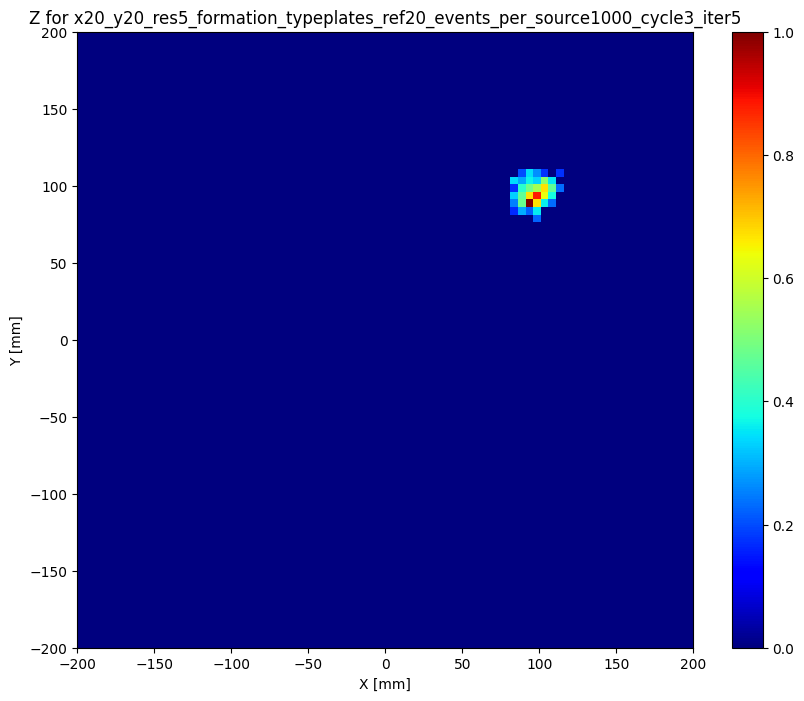

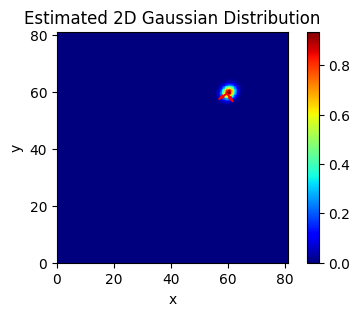

59.66126614813034 59.36616580134532 1.3643892127896613 1.6215745036948295
runs_counter =  19
iter value is  3 cycle value is  3
Plot of the raw data


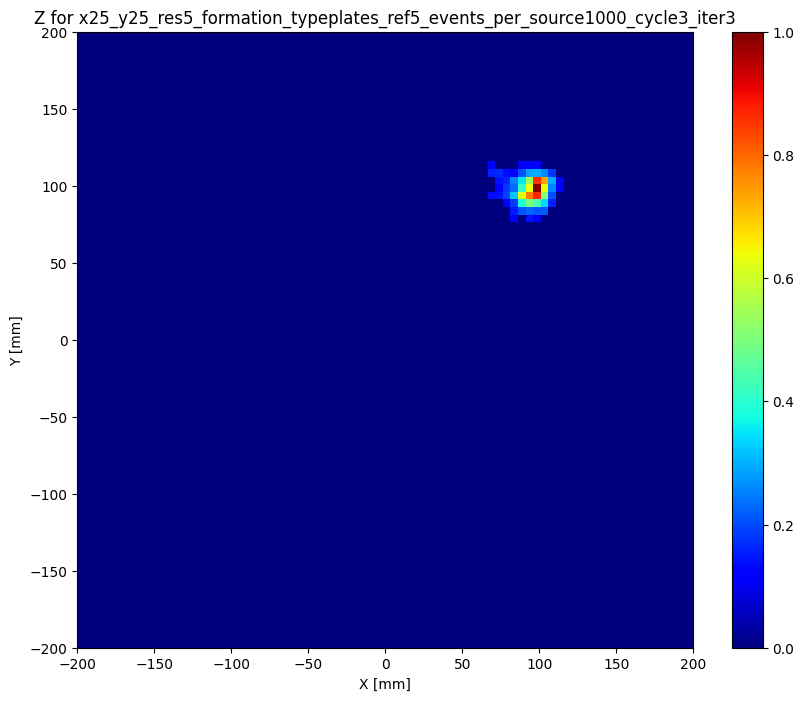

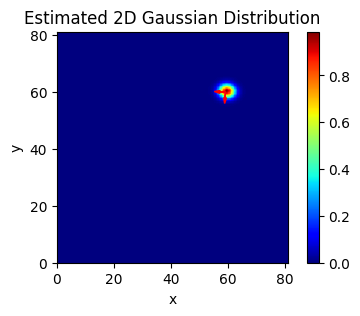

Plot of the raw data


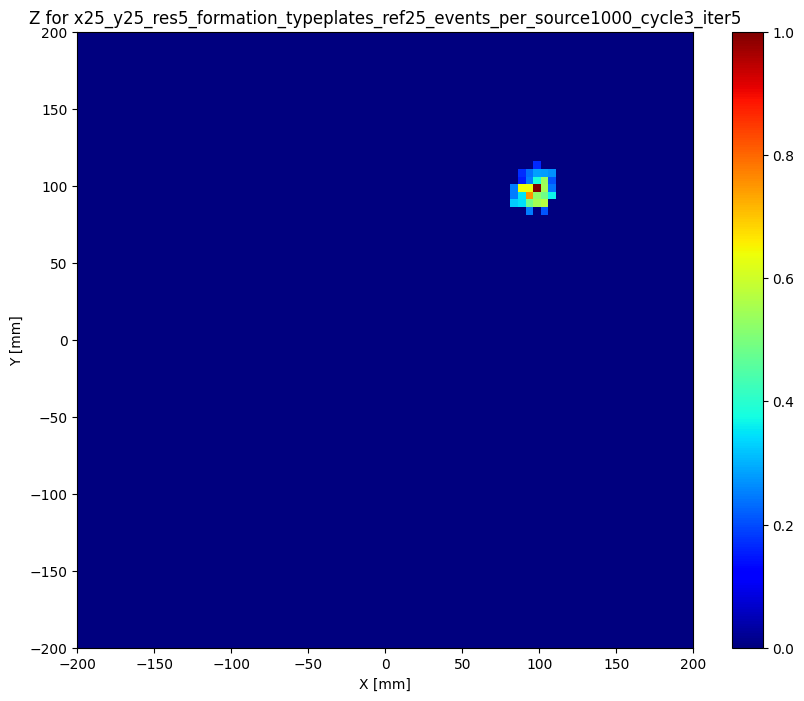

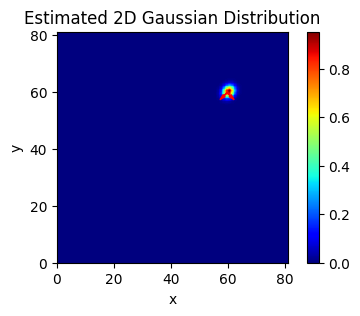

59.693458237971875 59.64431191128667 1.2610499257469268 1.4996008524353925
runs_counter =  20
iter value is  5 cycle value is  4
Plot of the raw data


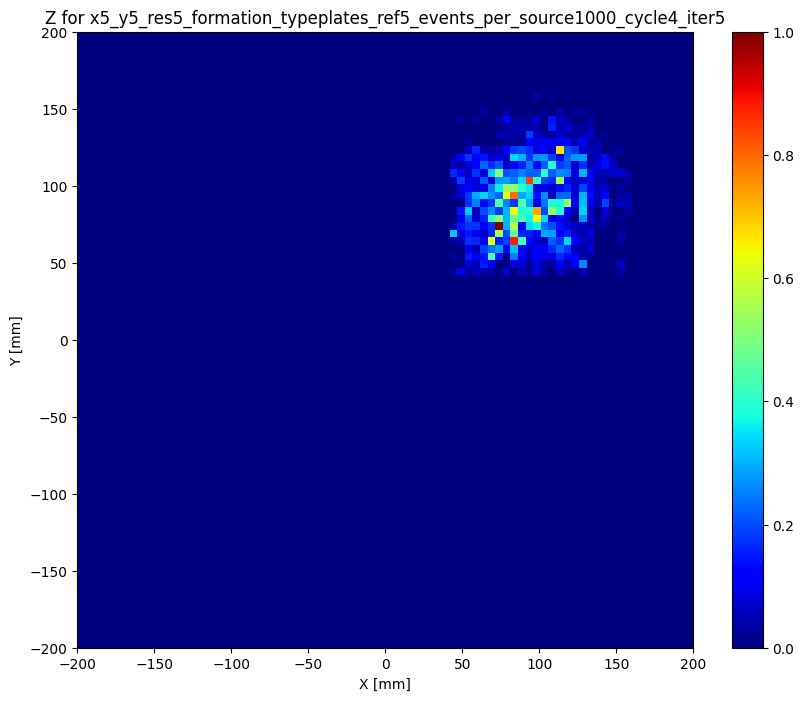

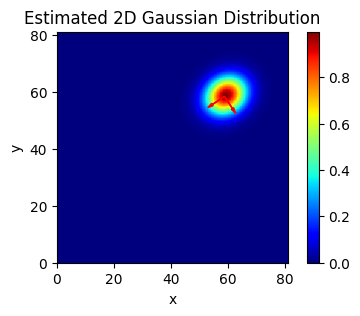

Plot of the raw data


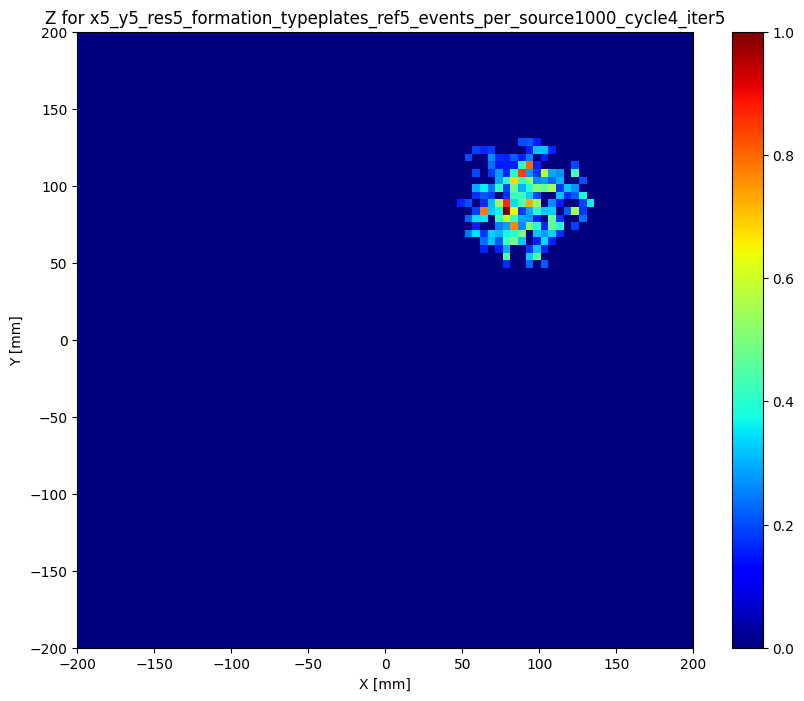

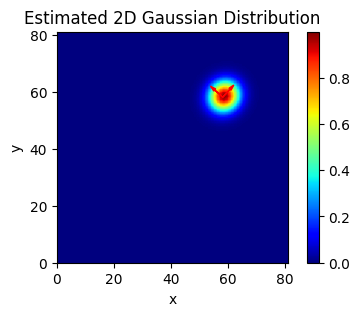

58.14803465864607 58.02516454305595 3.511177896825514 3.7777794743056816
runs_counter =  21
iter value is  3 cycle value is  4
Plot of the raw data


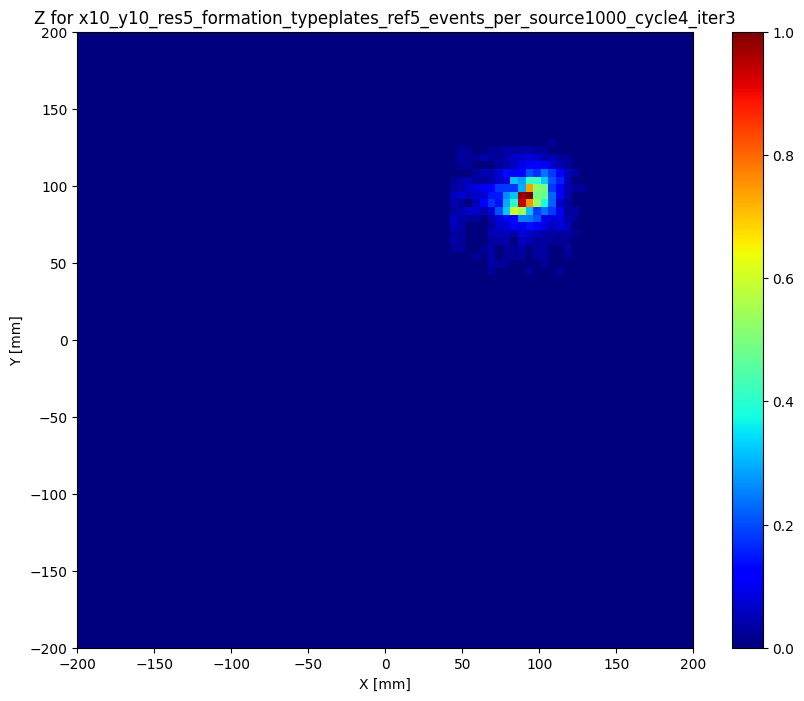

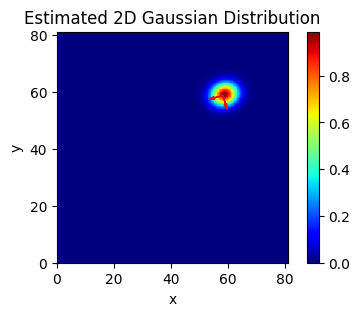

Plot of the raw data


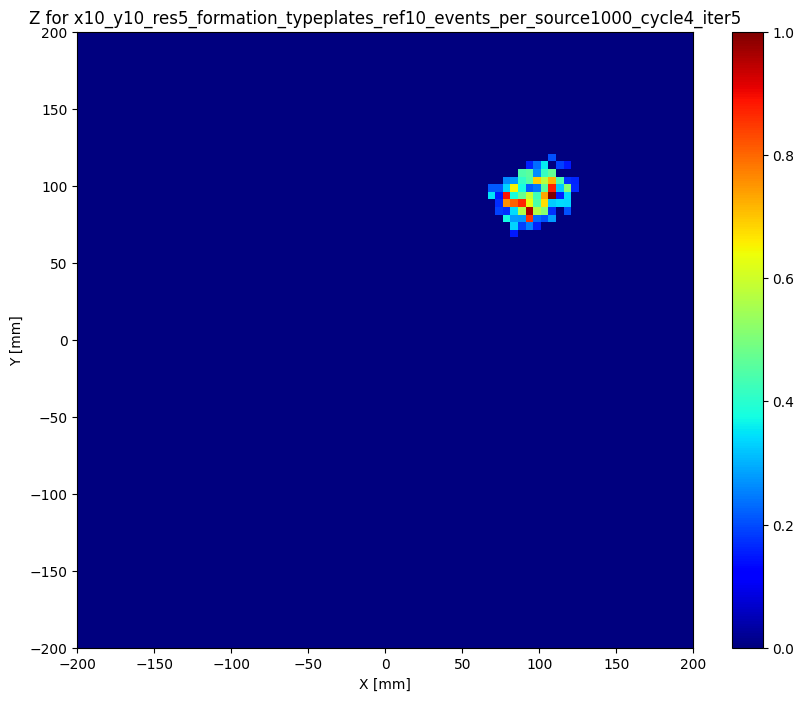

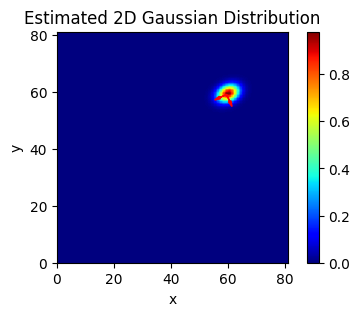

59.51409164578872 58.991183247155405 1.8724205216439362 2.6385545605404808
runs_counter =  22
iter value is  3 cycle value is  4
Plot of the raw data


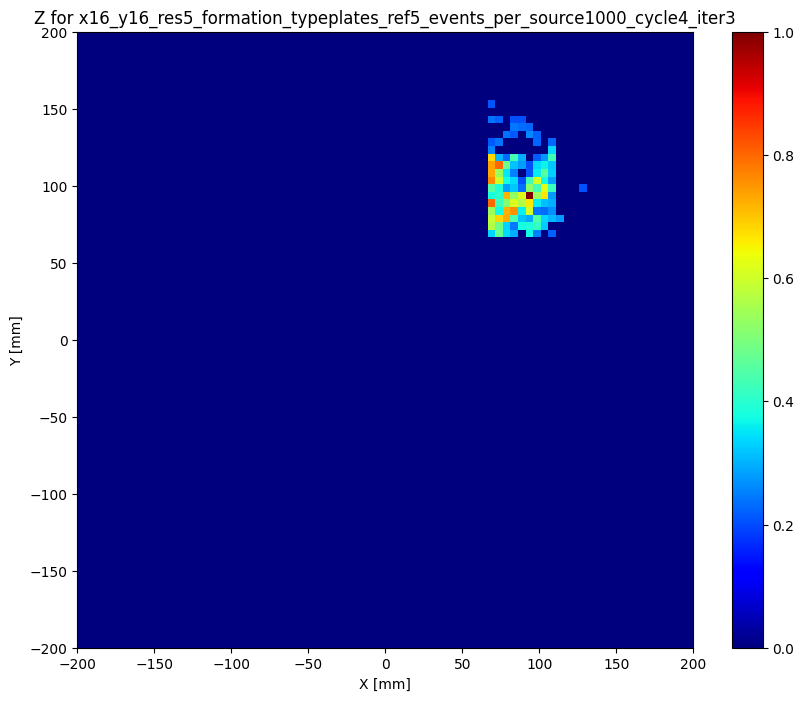

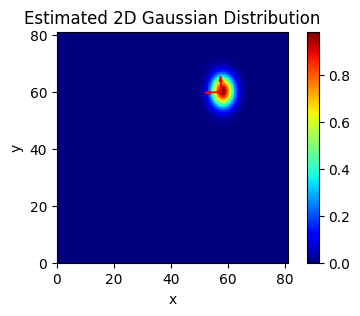

Plot of the raw data


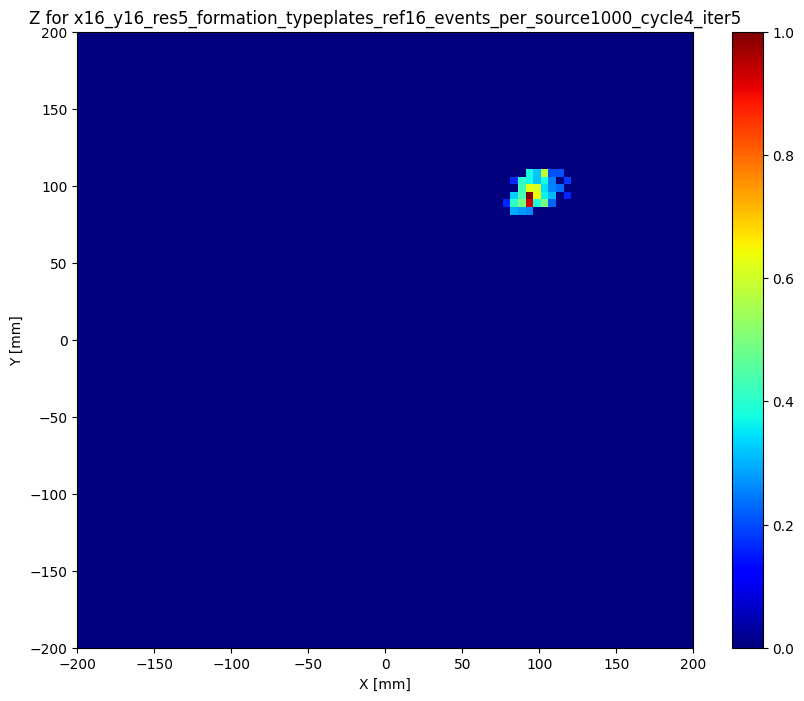

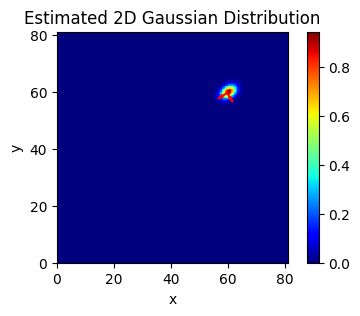

59.66322188773295 59.51955763523447 1.2530356076552556 1.8886361546882642
runs_counter =  23
iter value is  3 cycle value is  4
Plot of the raw data


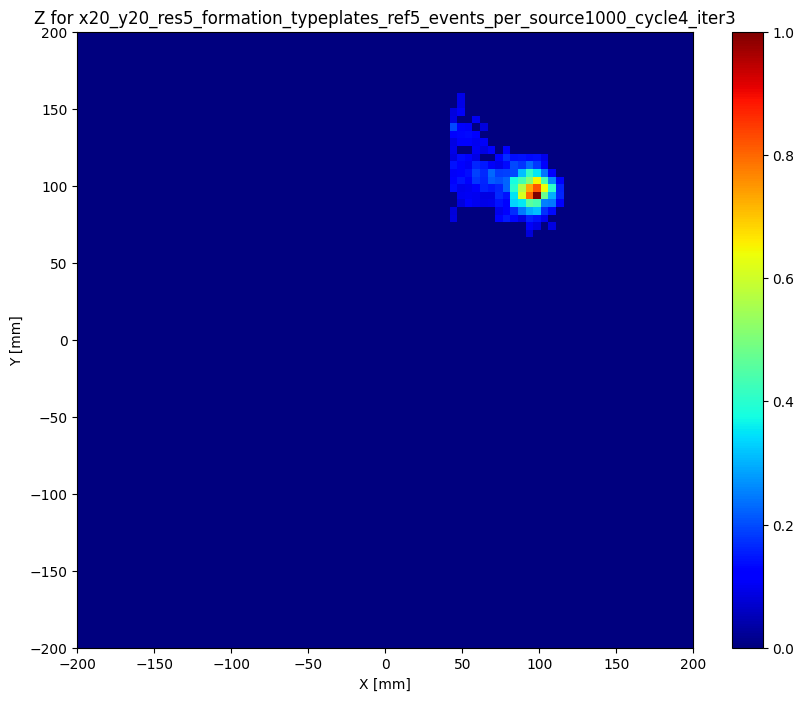

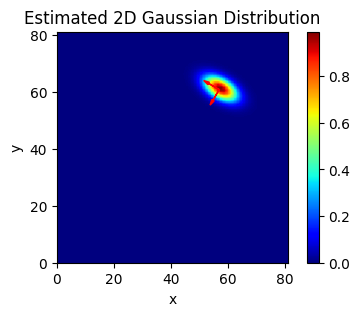

Plot of the raw data


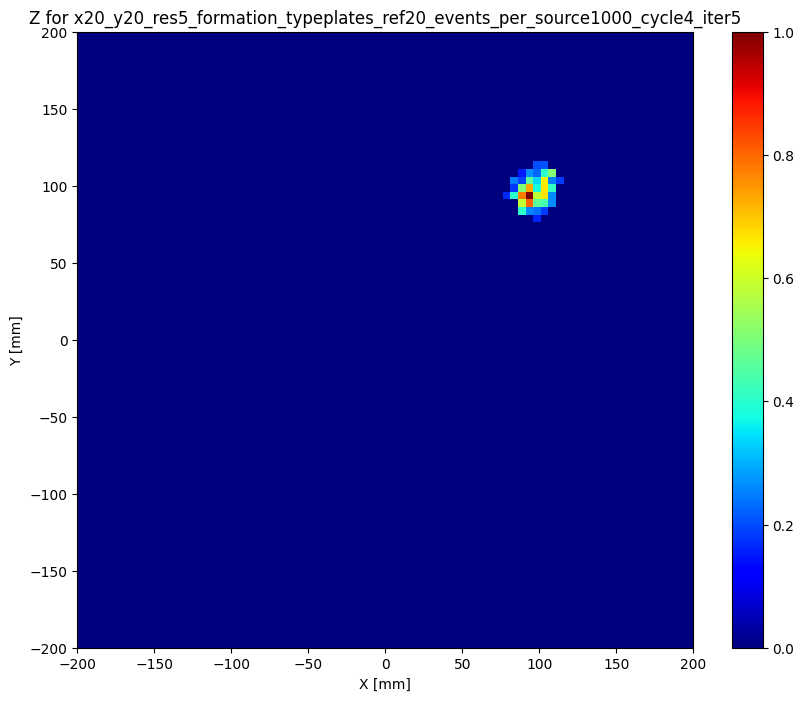

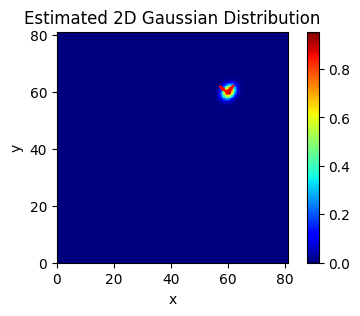

59.68193079304056 59.58305257115668 1.3434154734413342 1.7152457329840116
runs_counter =  24
iter value is  3 cycle value is  4
Plot of the raw data


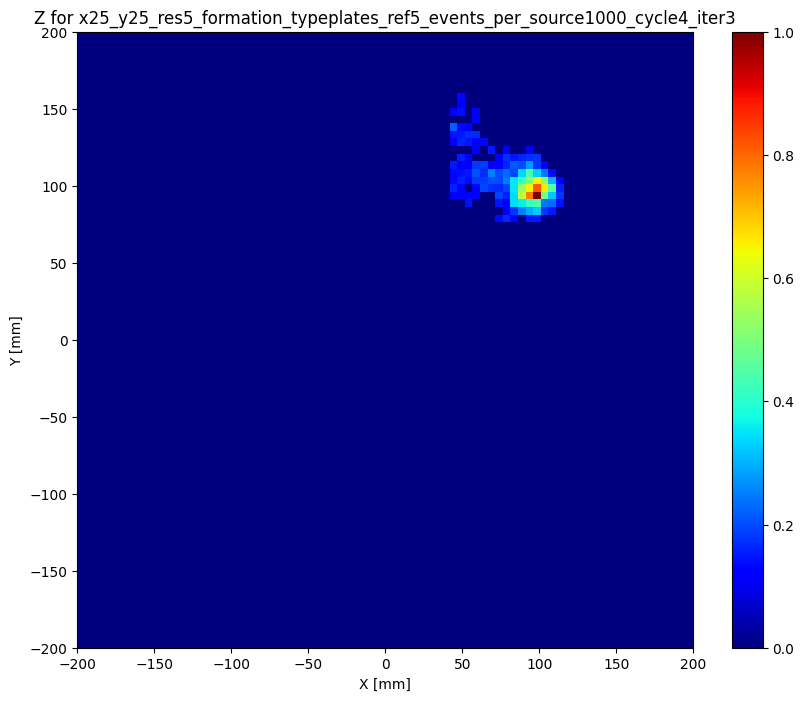

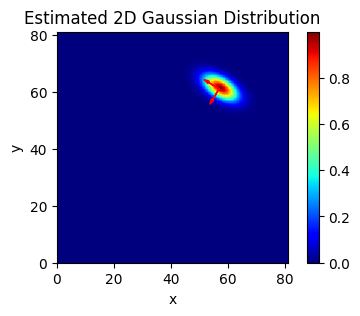

Plot of the raw data


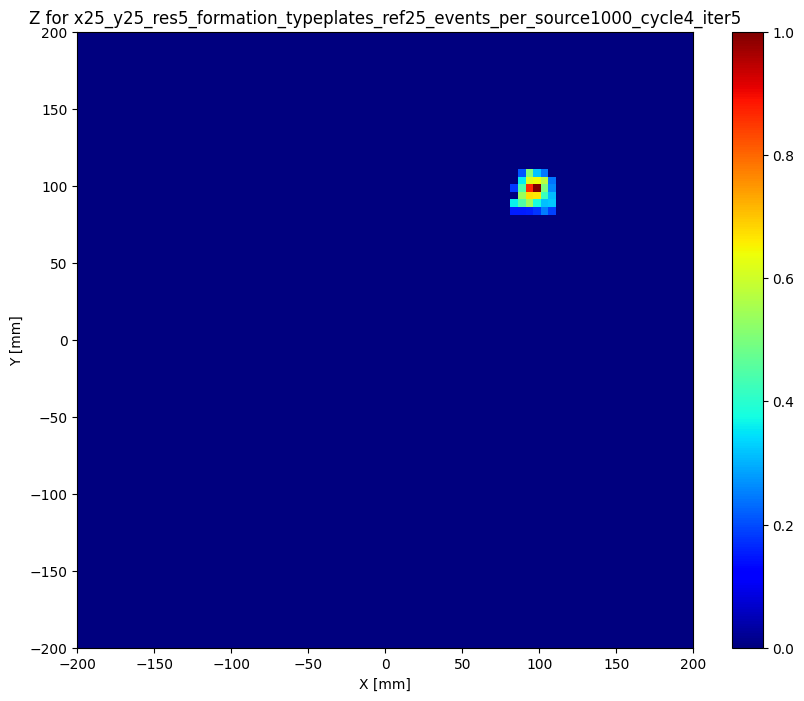

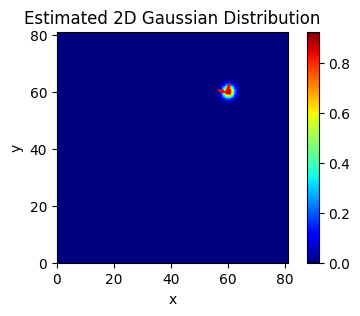

59.63043713594478 59.57085349079773 1.3503192810142663 1.4486689484015558
runs_counter =  25
iter value is  5 cycle value is  5
Plot of the raw data


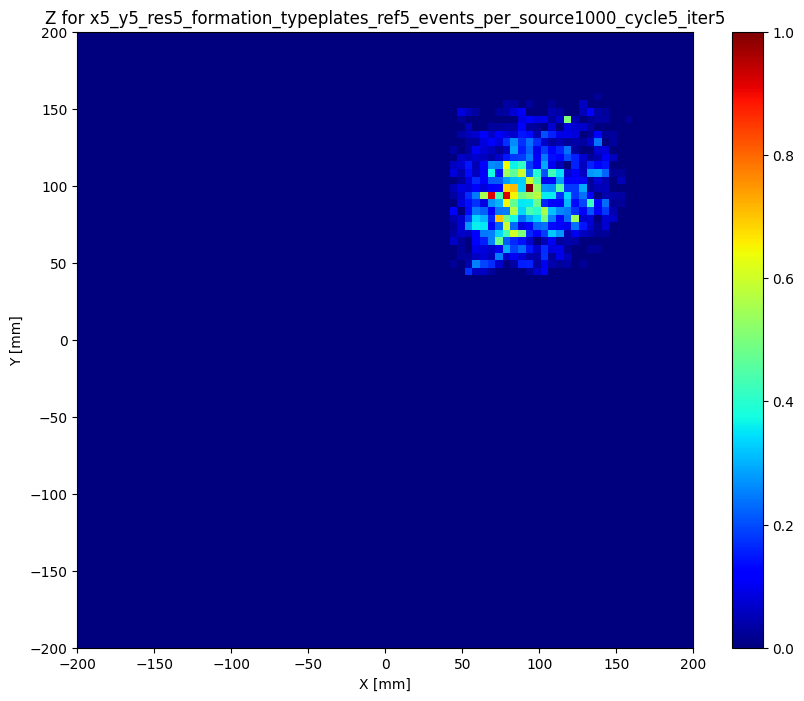

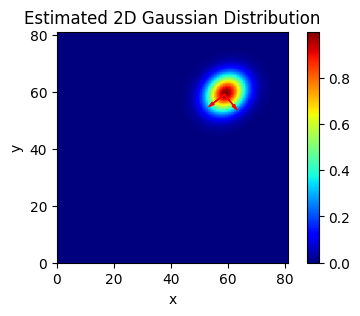

Plot of the raw data


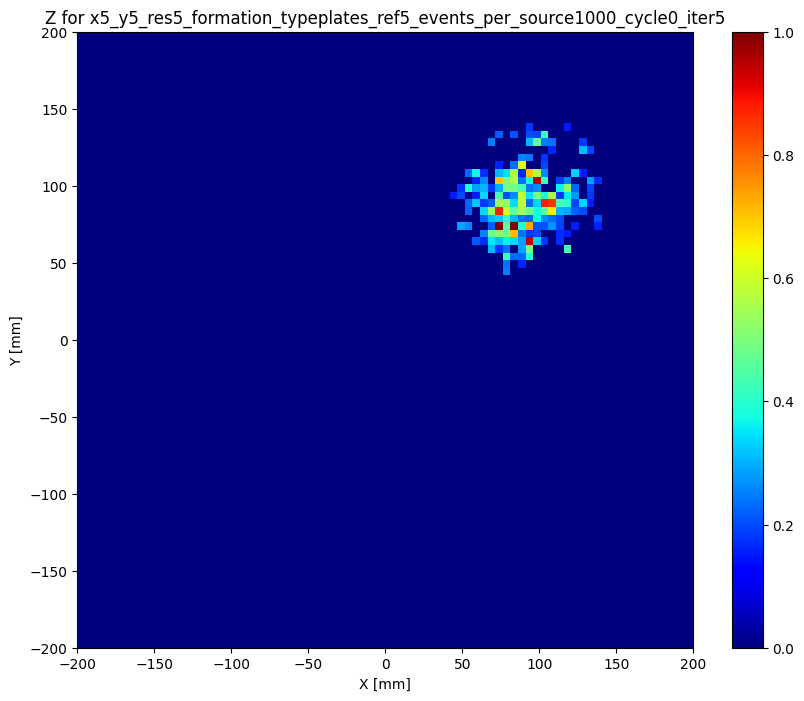

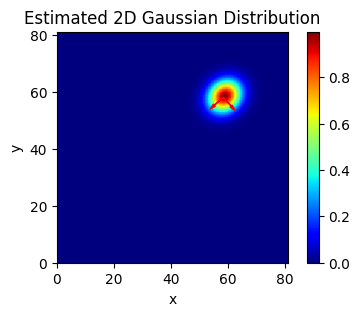

58.30662581137075 58.02886010603305 3.552725435935068 4.173597524234005
runs_counter =  26
iter value is  3 cycle value is  5
Plot of the raw data


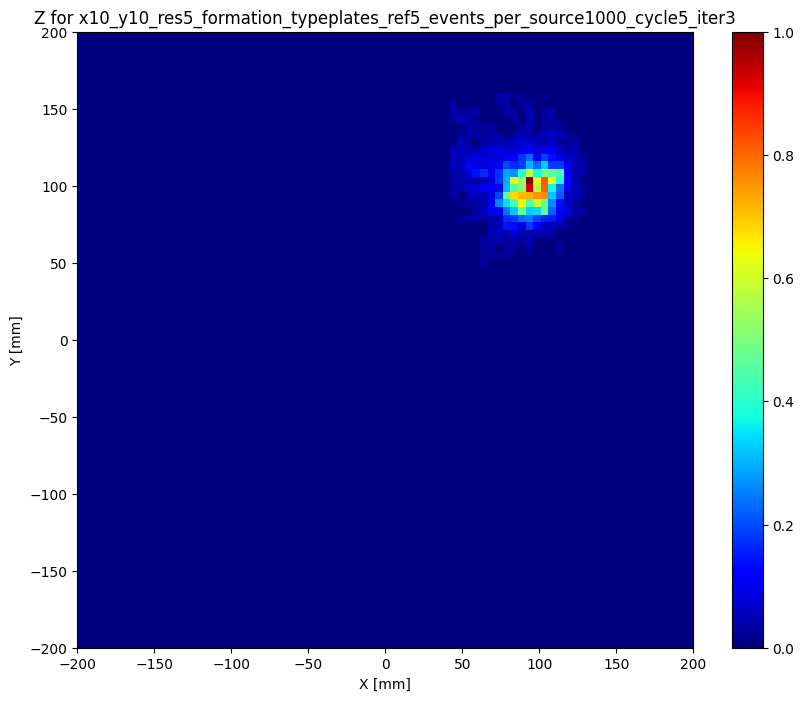

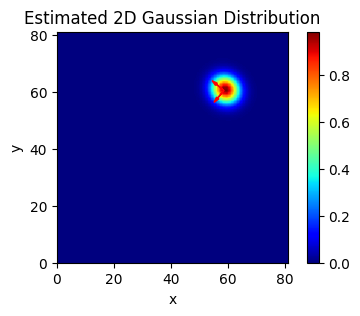

Plot of the raw data


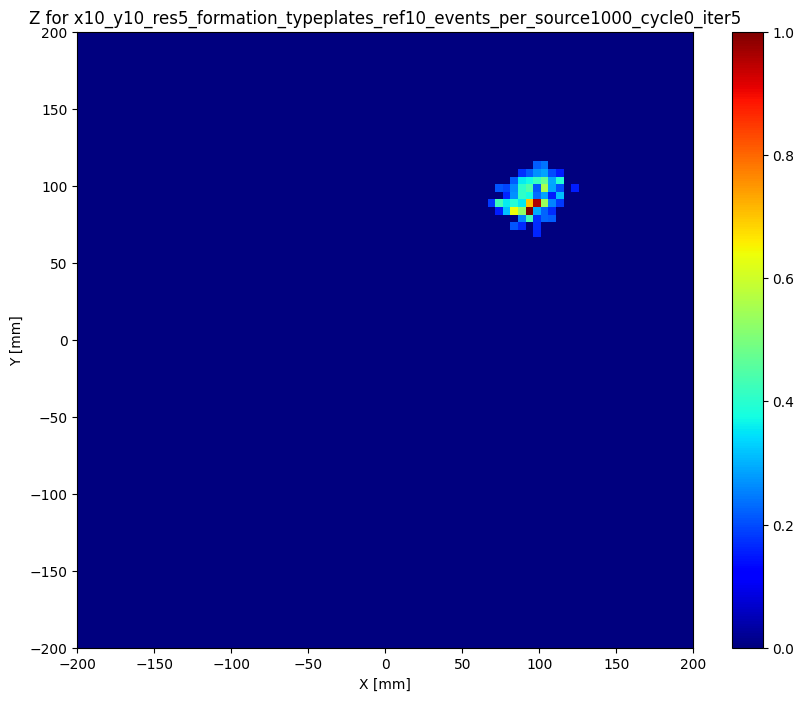

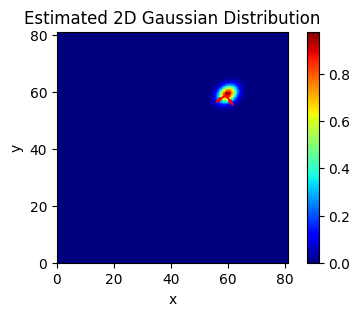

59.296597127945766 58.77988627811077 1.7615222285494165 2.328321904310916
runs_counter =  27
iter value is  3 cycle value is  5
Plot of the raw data


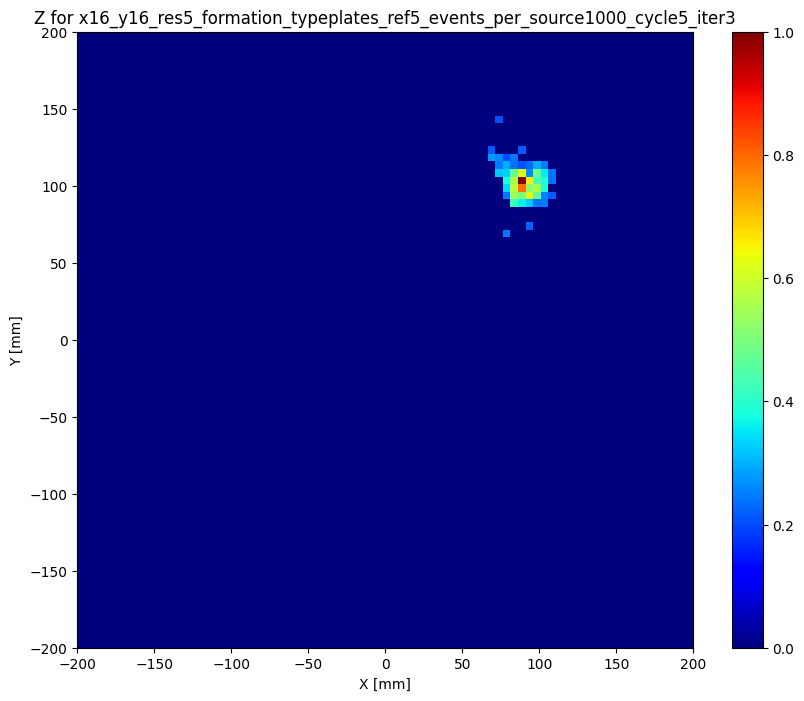

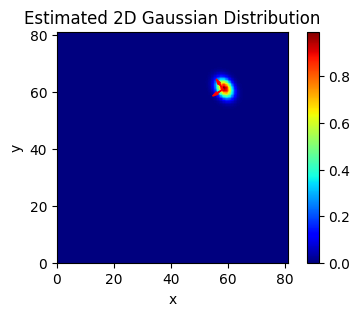

Plot of the raw data


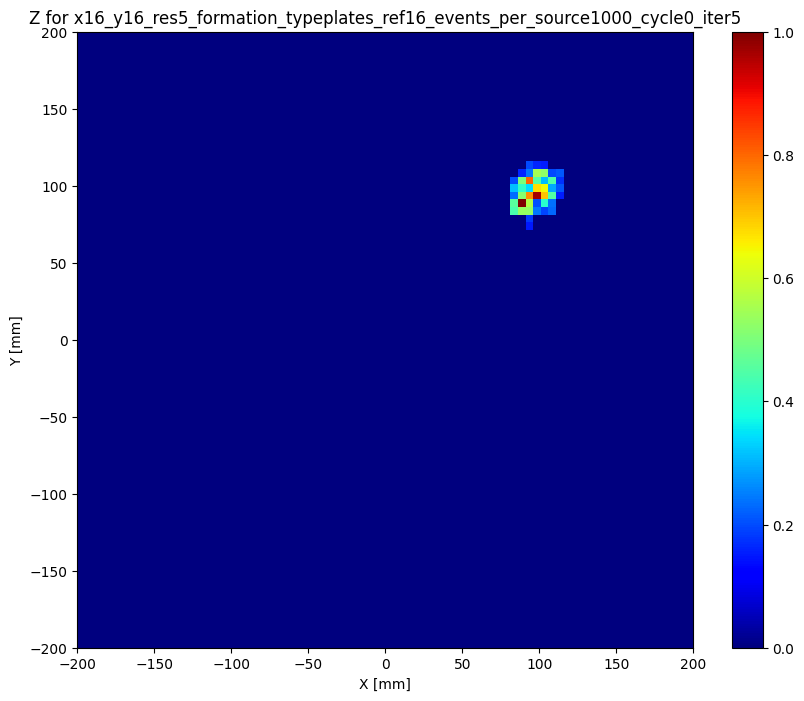

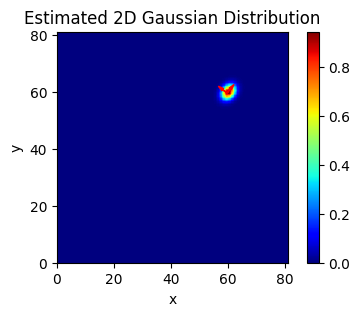

59.64963554411655 59.464766229608685 1.4364707810362911 1.8887862101382857
runs_counter =  28
iter value is  3 cycle value is  5
Plot of the raw data


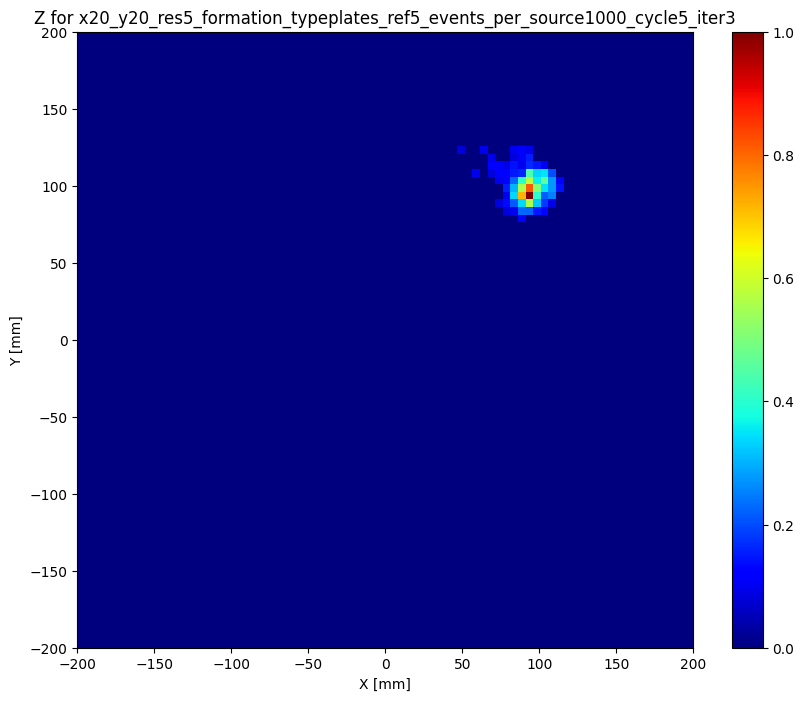

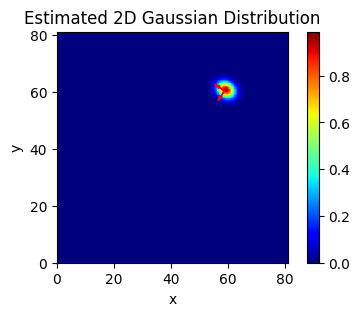

Plot of the raw data


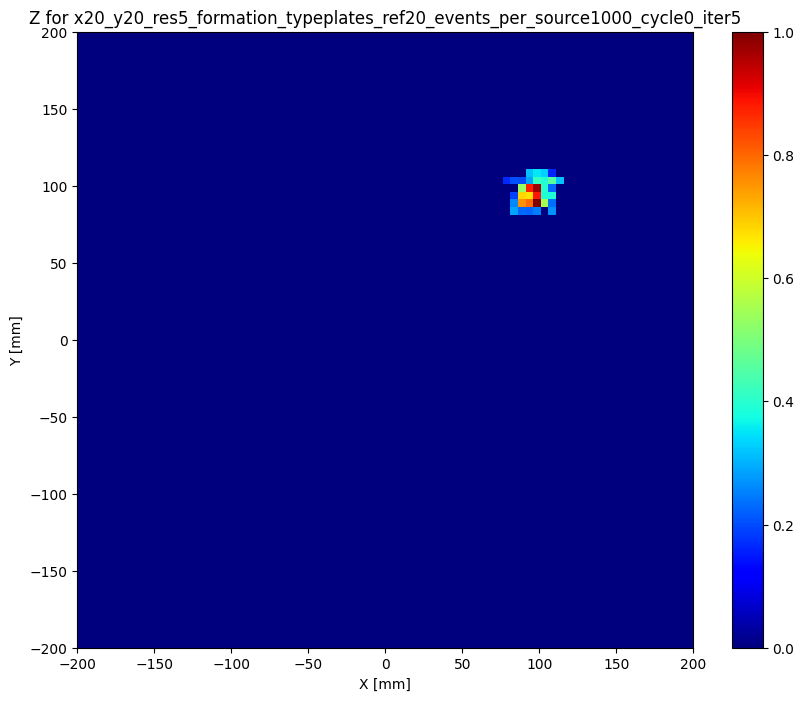

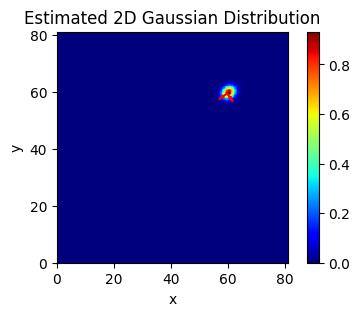

59.65927998937494 59.357733310192984 1.313571294501122 1.6244271827785324
runs_counter =  29
iter value is  3 cycle value is  5
Plot of the raw data


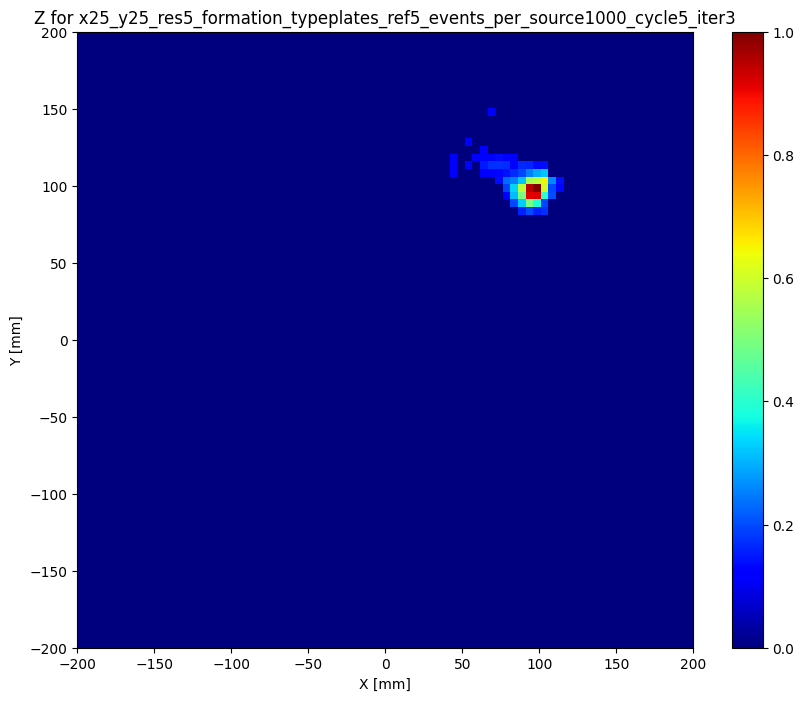

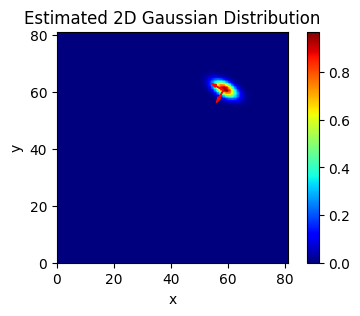

Plot of the raw data


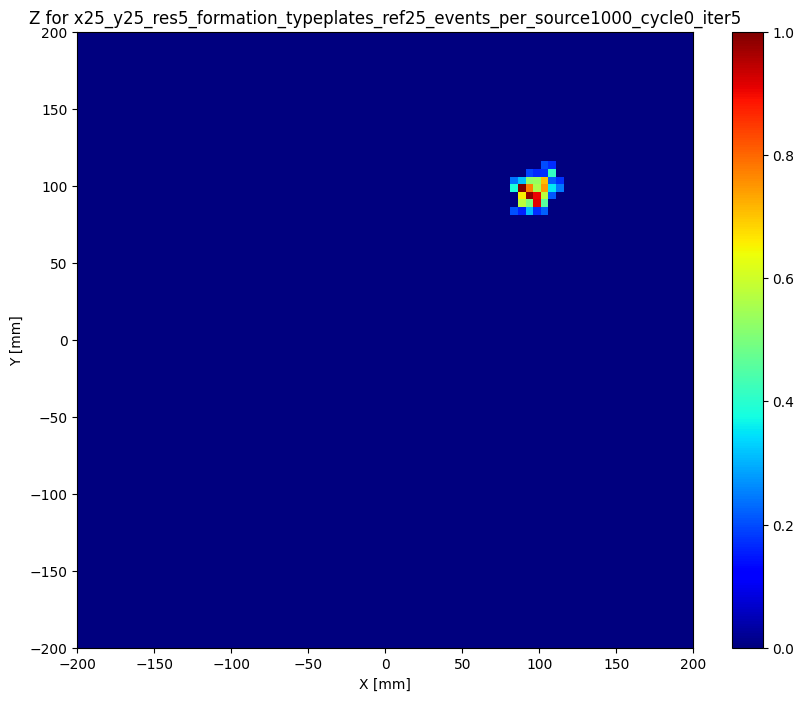

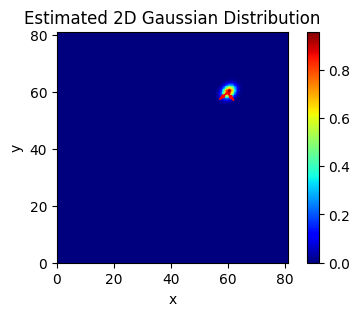

59.72419831533366 59.616797684378 1.2478226179268306 1.6338636076254947
runs_counter =  30
iter value is  5 cycle value is  7
Plot of the raw data


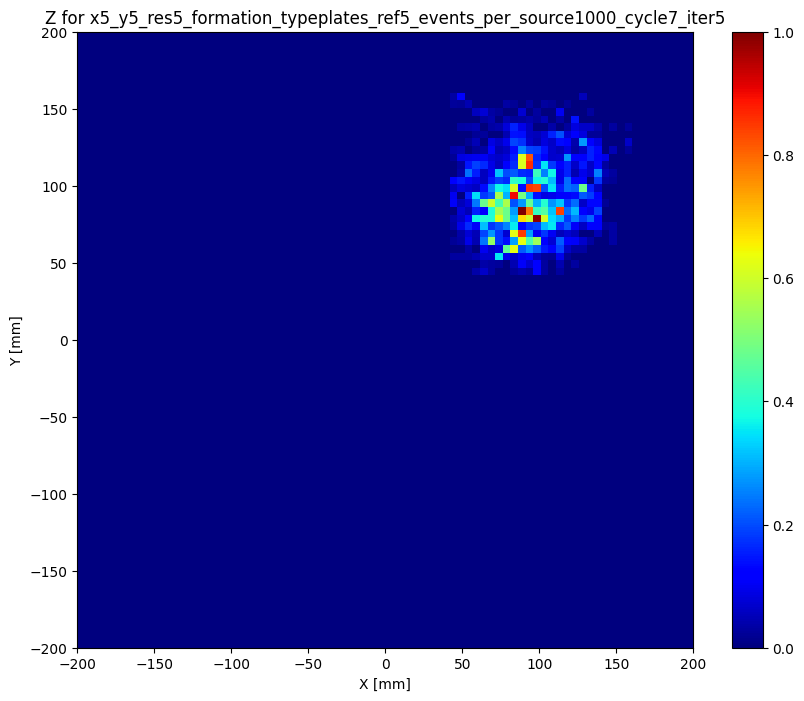

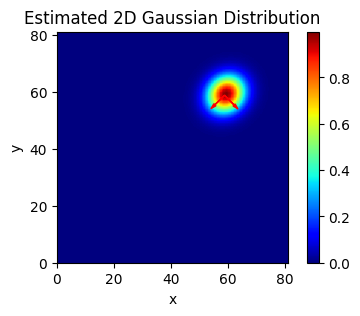

Plot of the raw data


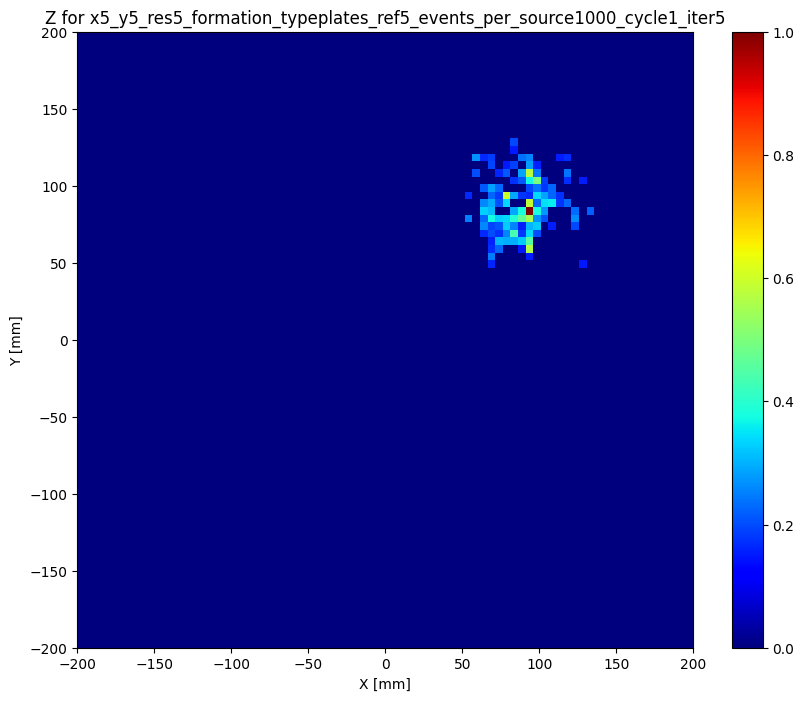

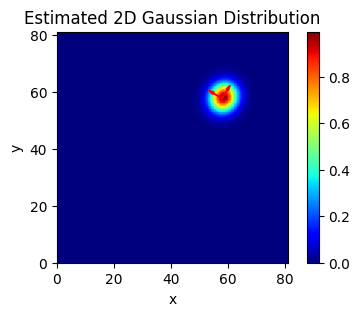

57.89317990638282 57.590928433758734 3.2103003794204064 3.529104954521023
runs_counter =  31
iter value is  3 cycle value is  7
Plot of the raw data


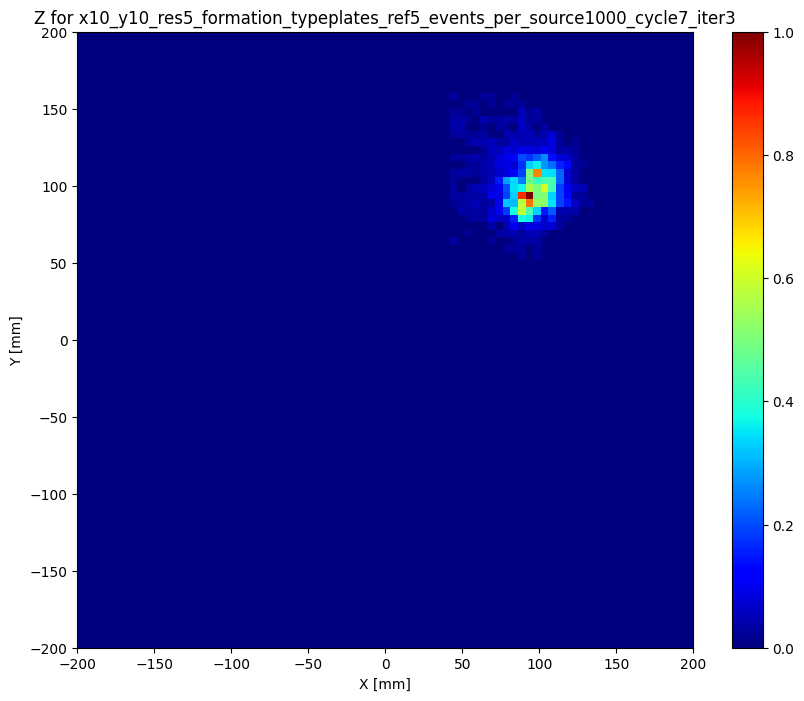

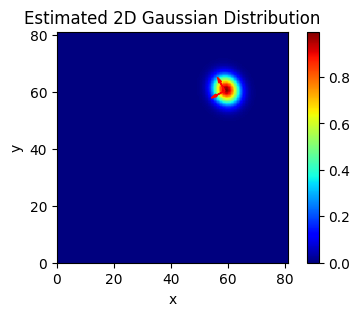

Plot of the raw data


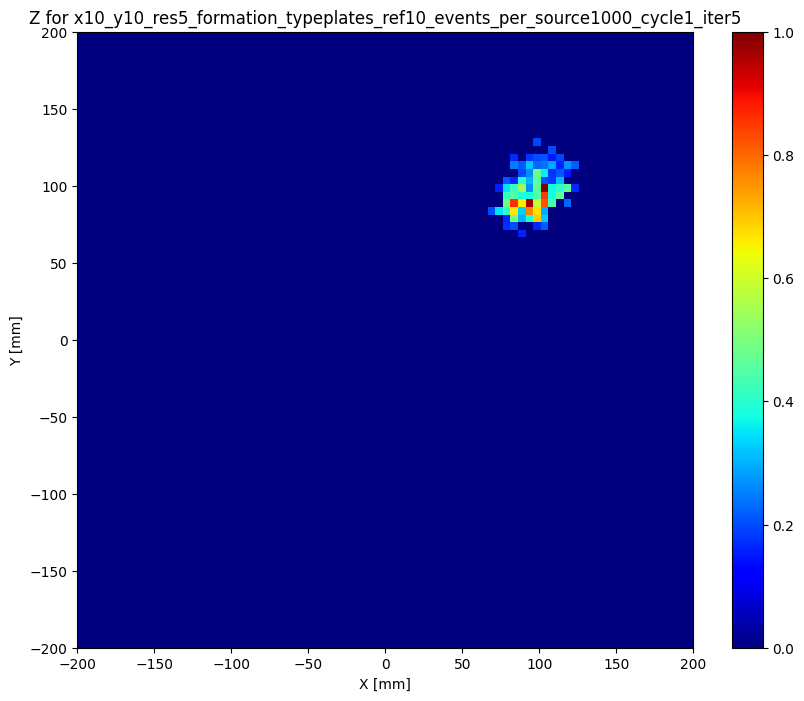

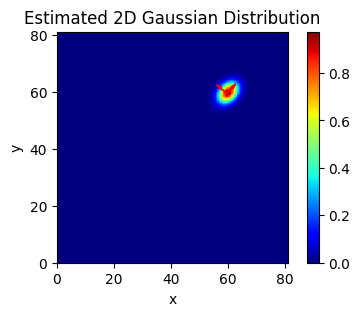

59.52811199882677 59.287826242712164 1.9437999065647062 2.748904504440403
runs_counter =  32
iter value is  3 cycle value is  7
Plot of the raw data


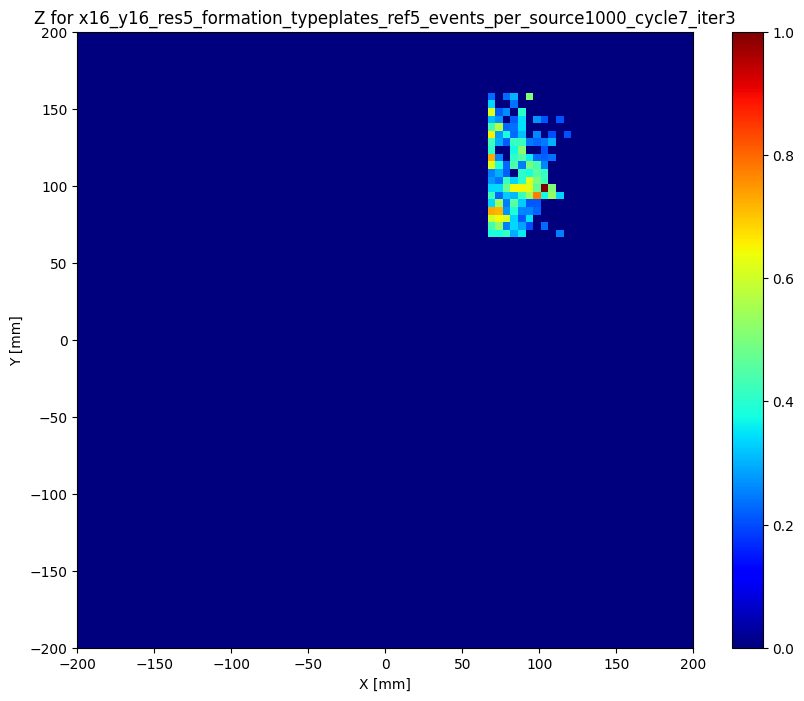

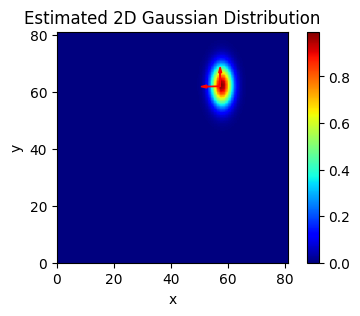

Plot of the raw data


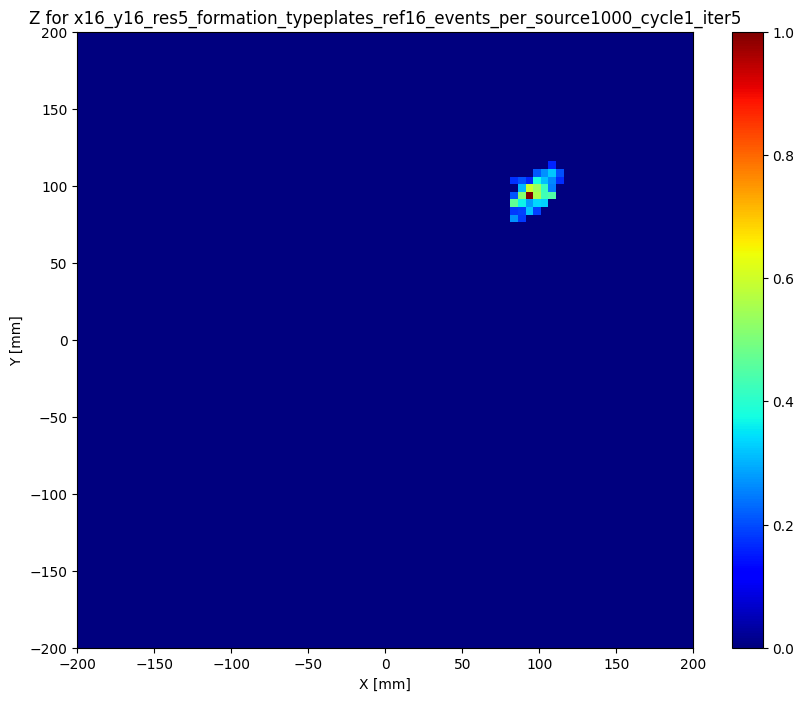

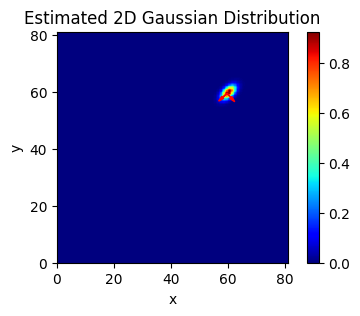

59.64147667432747 59.37686717509821 1.1041678468388723 2.005999589781876
runs_counter =  33
iter value is  3 cycle value is  7
Plot of the raw data


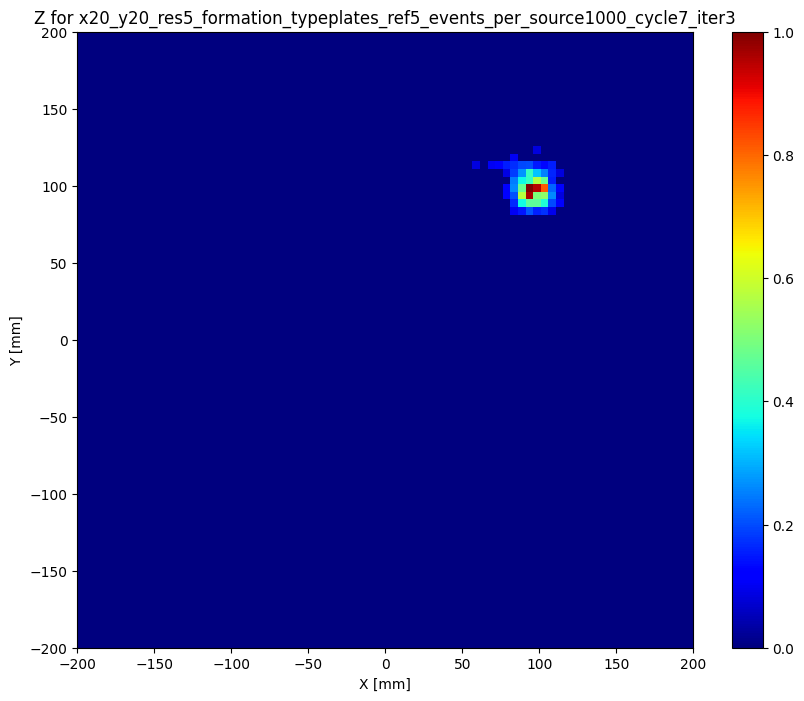

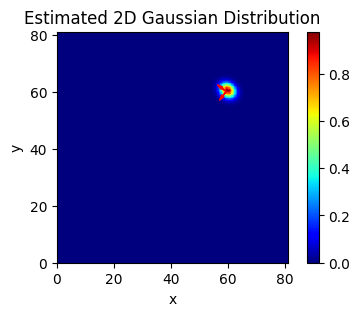

Plot of the raw data


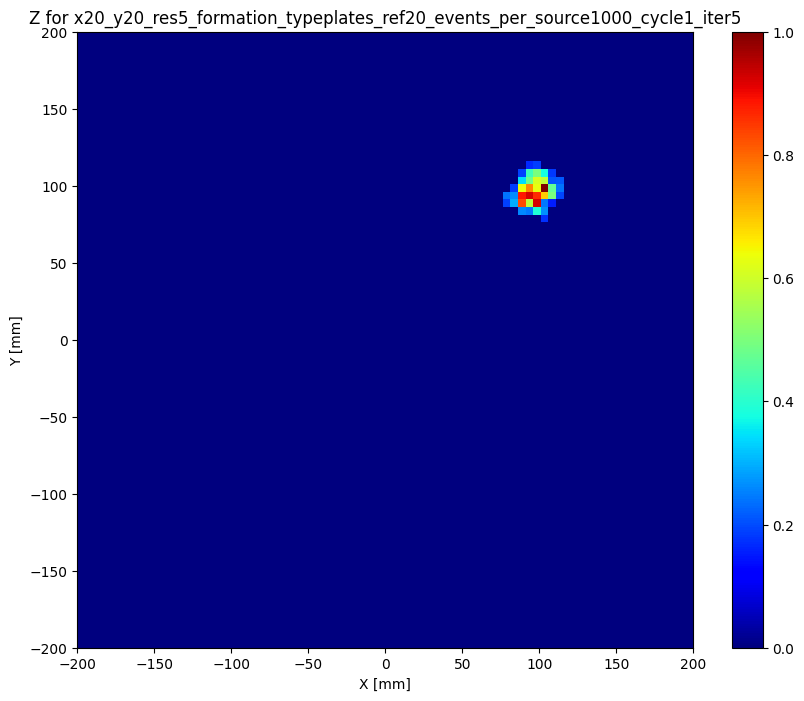

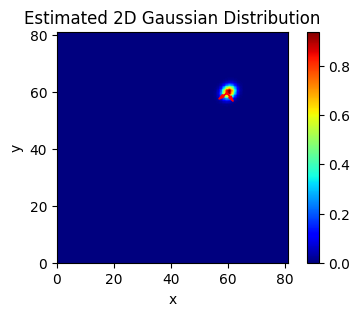

59.68415353406835 59.52294956353503 1.3913550822607827 1.6597587090113475
runs_counter =  34
iter value is  3 cycle value is  7
Plot of the raw data


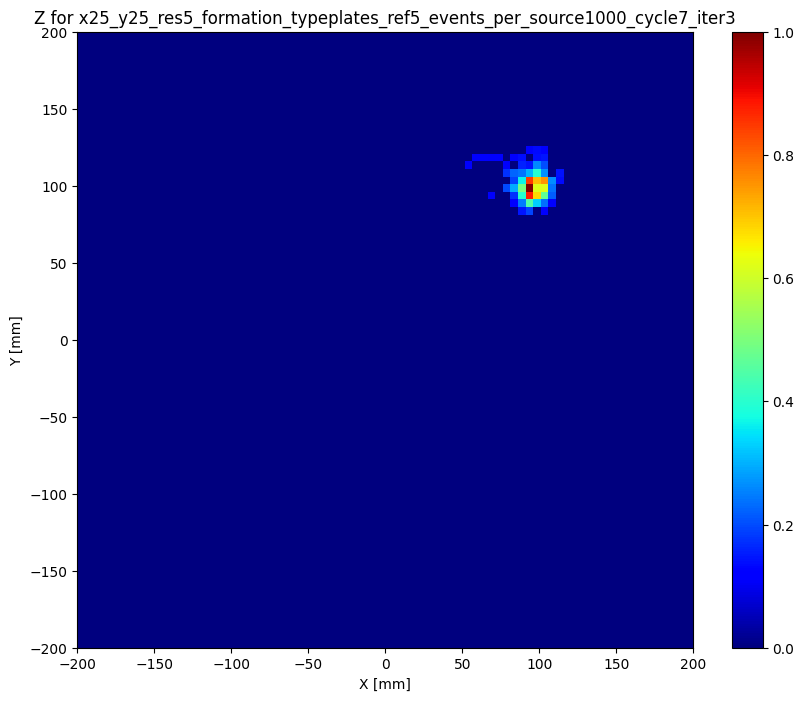

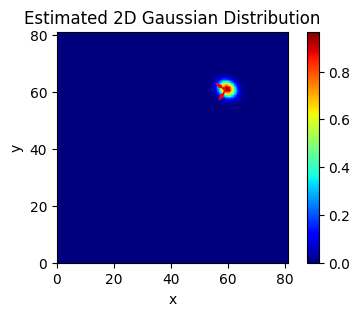

Plot of the raw data


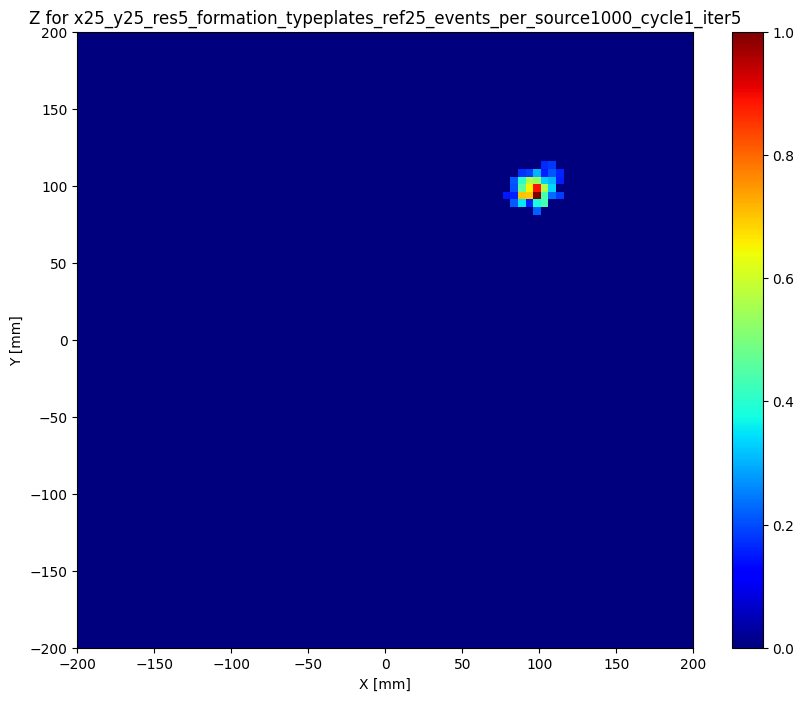

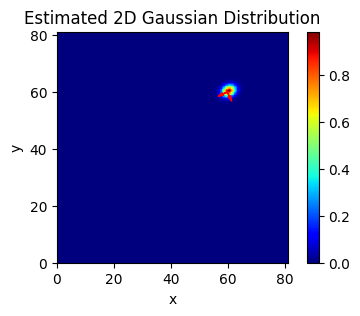

59.73294119651843 59.888064028224484 1.2450678104232205 1.641232344526905
runs_counter =  35
iter value is  5 cycle value is  7
Plot of the raw data


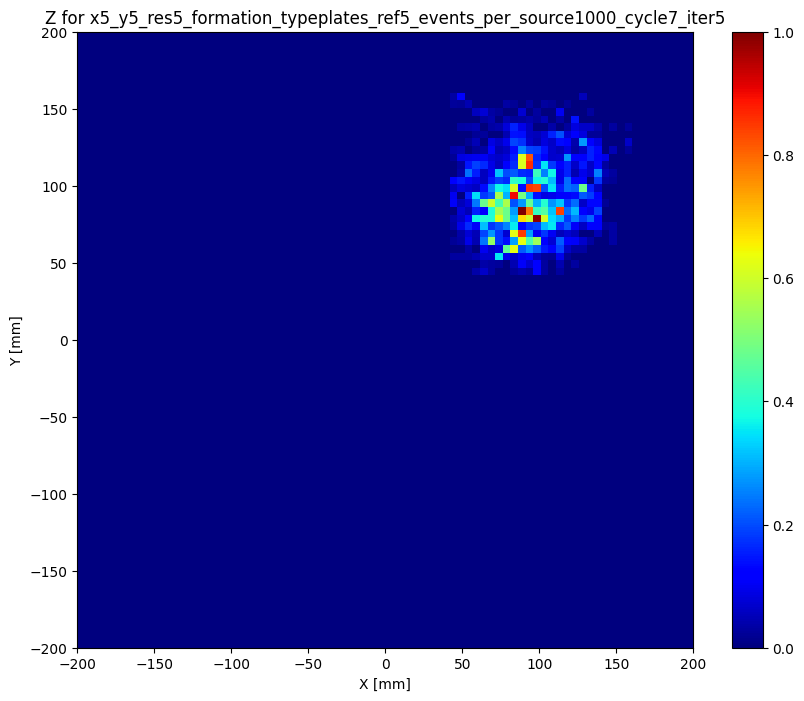

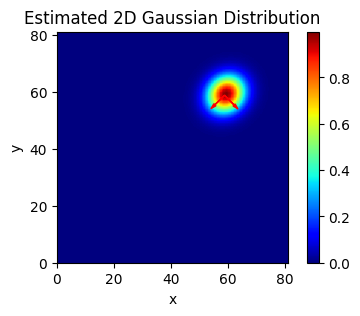

Plot of the raw data


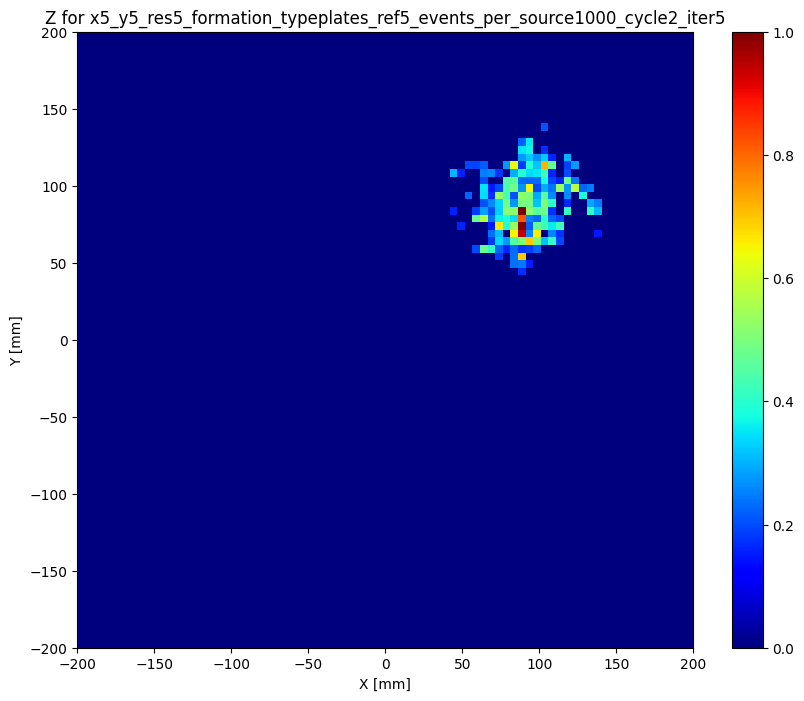

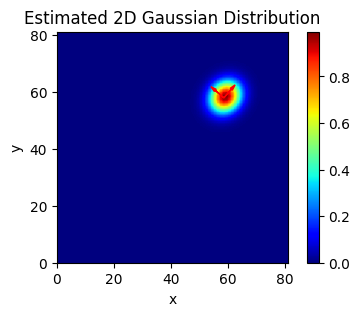

58.547565295307045 57.81686894099816 3.4392696576802093 3.9933100541077464
runs_counter =  36
iter value is  3 cycle value is  7
Plot of the raw data


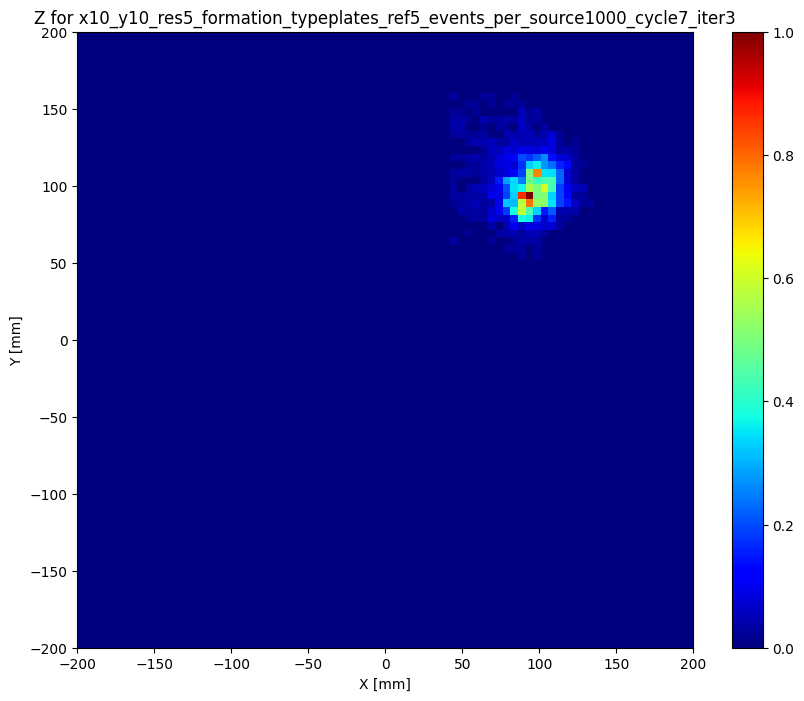

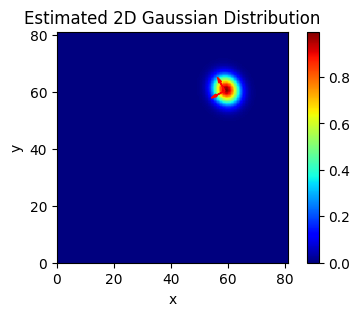

Plot of the raw data


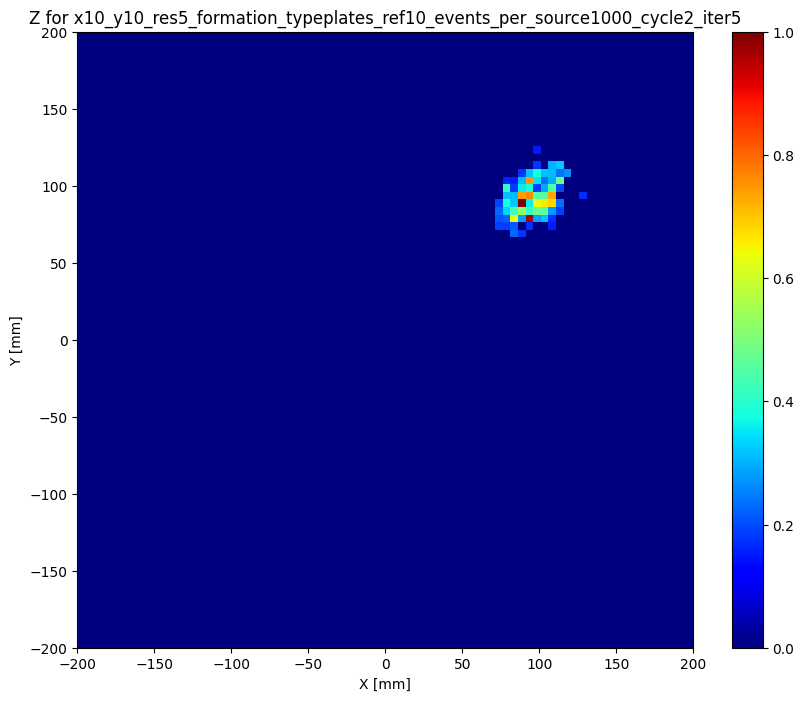

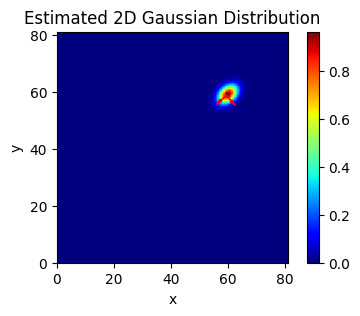

59.41312745563867 58.66963496503297 1.7854917212349601 2.619132255976433
runs_counter =  37
iter value is  3 cycle value is  7
Plot of the raw data


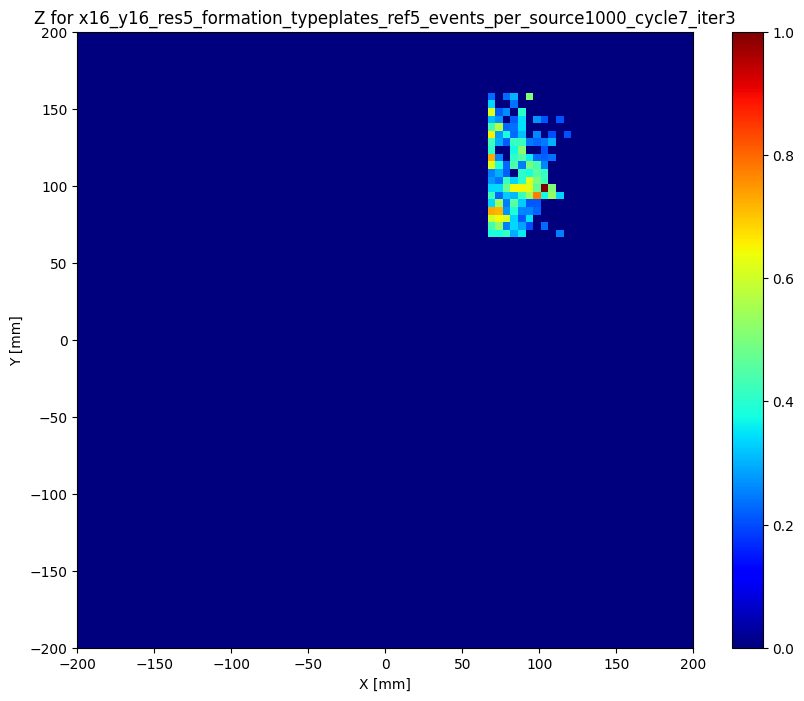

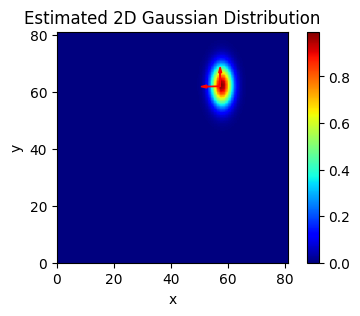

Plot of the raw data


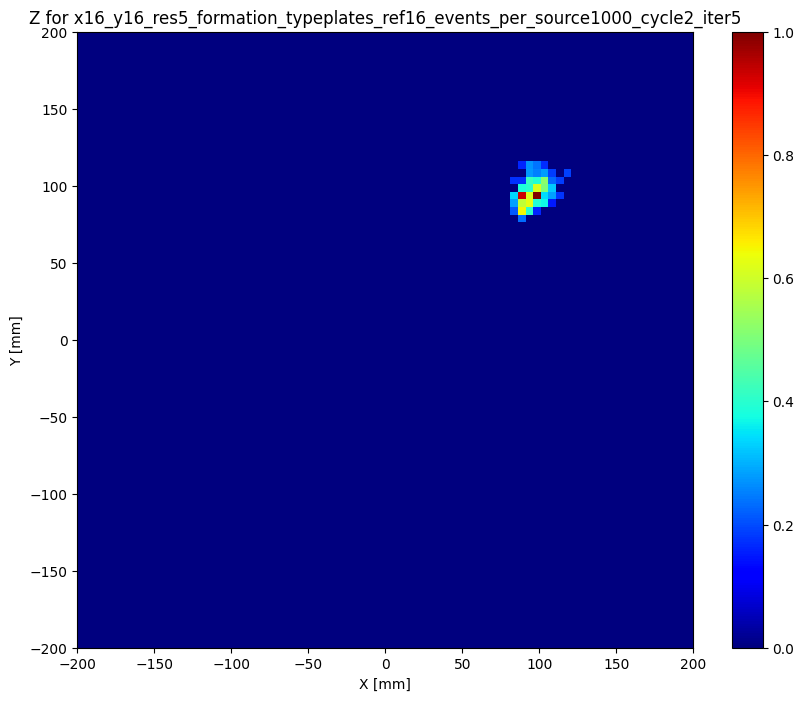

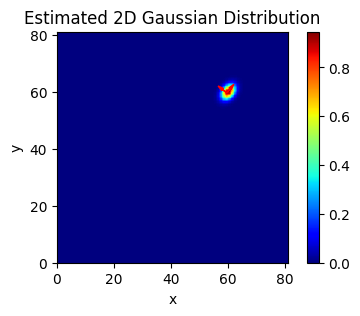

59.58138869471045 59.52238801403768 1.3209770115213644 1.9162796955968413
runs_counter =  38
iter value is  3 cycle value is  7
Plot of the raw data


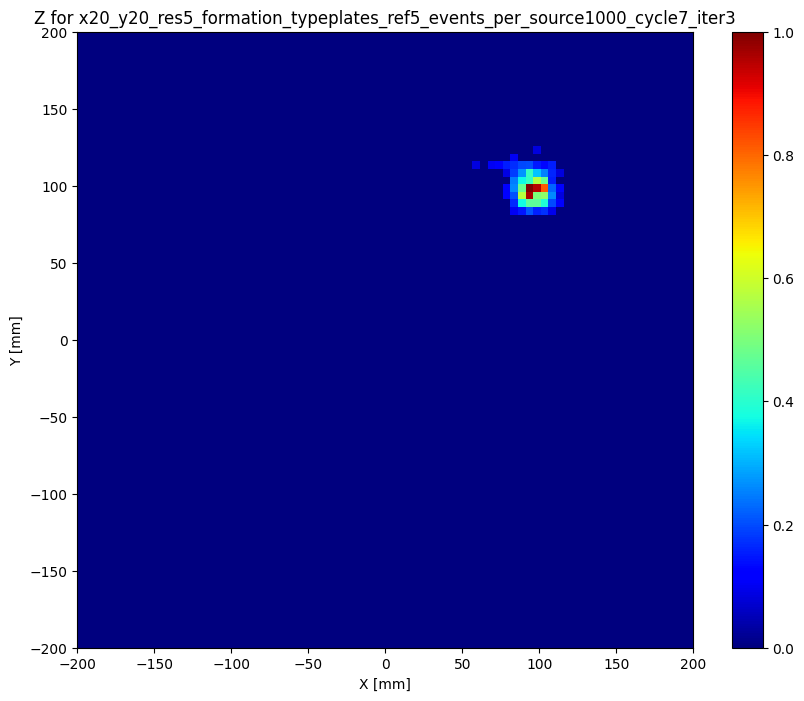

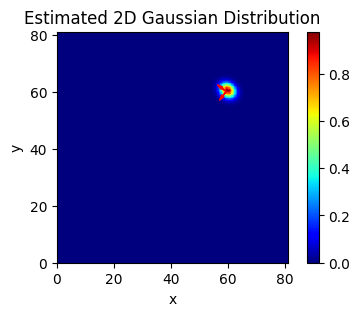

Plot of the raw data


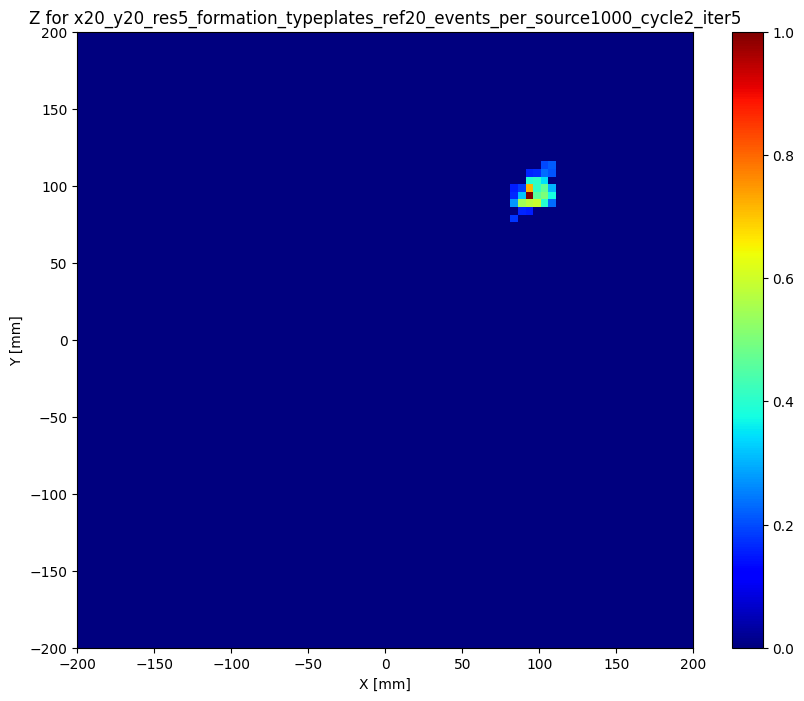

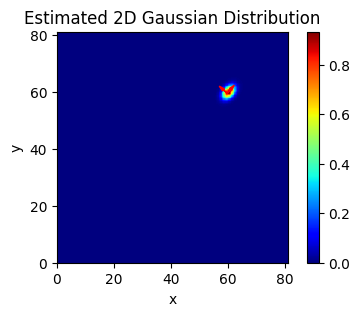

59.7221873429655 59.44971665390279 1.1386576027829765 1.7332043893864169
runs_counter =  39
iter value is  3 cycle value is  7
Plot of the raw data


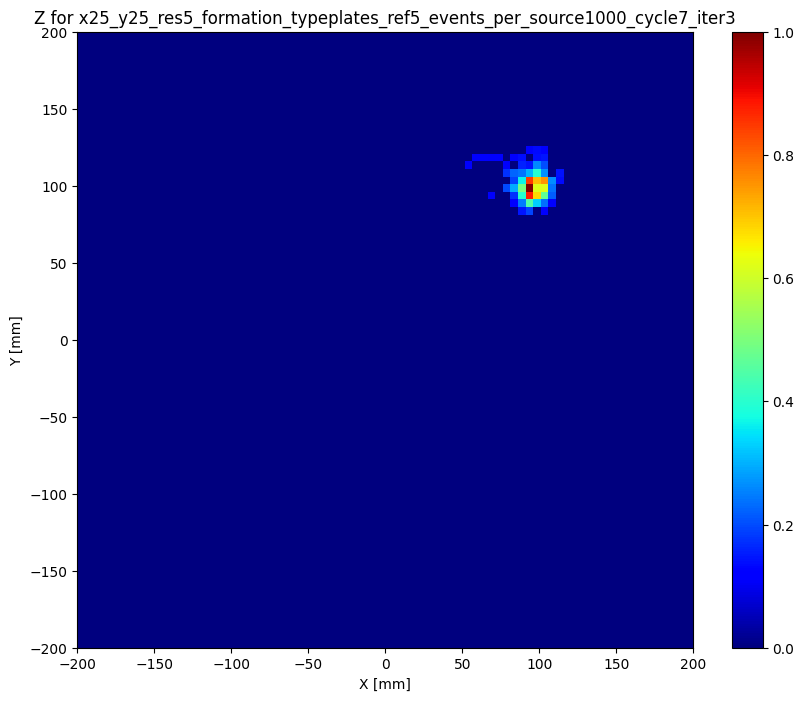

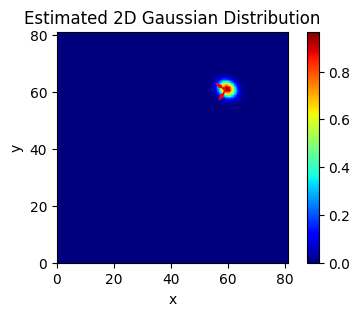

Plot of the raw data


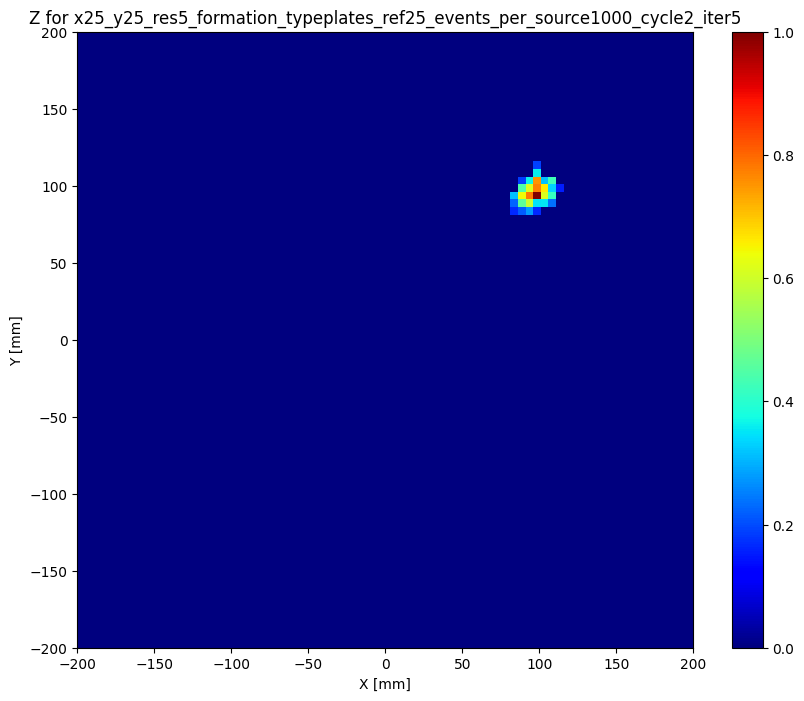

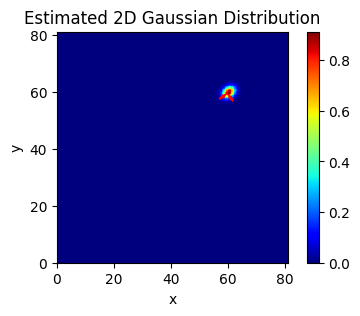

59.72418534813054 59.406952016306555 1.1450549703279733 1.5439241218490325
runs_counter =  40
iter value is  5 cycle value is  8
Plot of the raw data


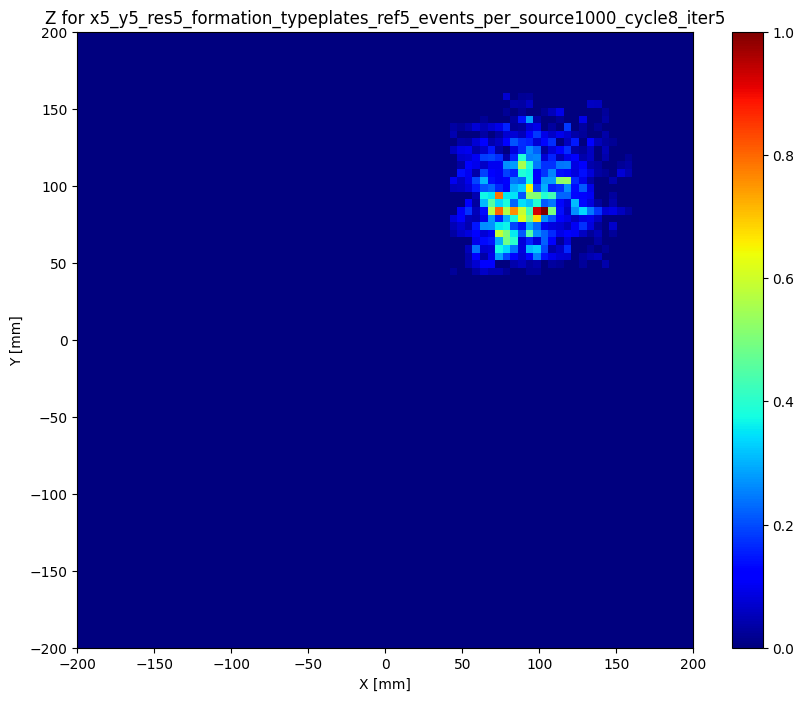

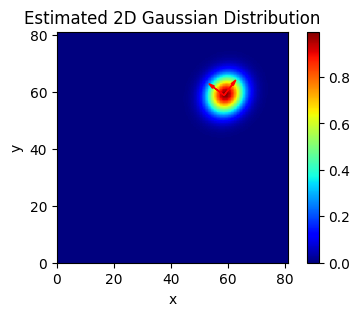

Plot of the raw data


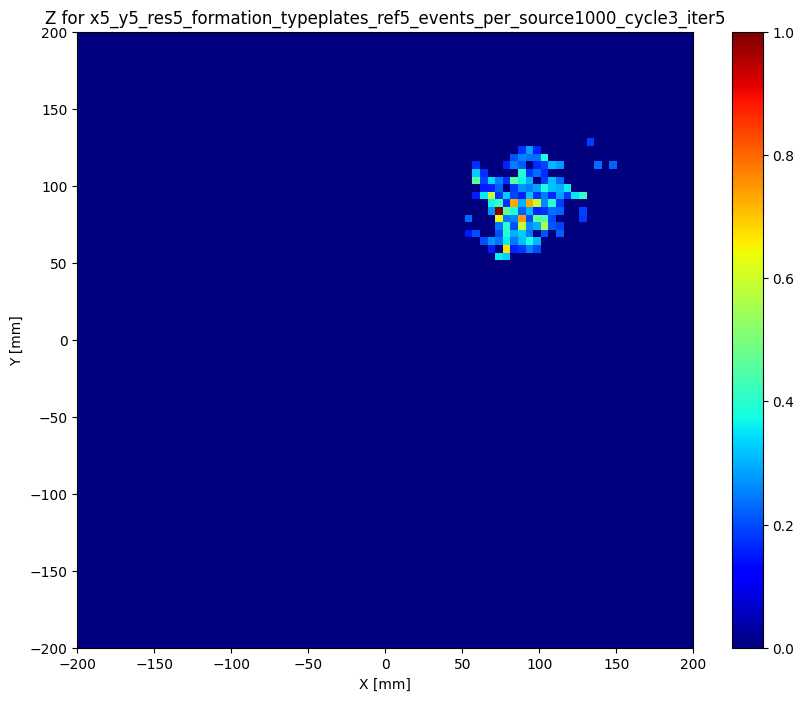

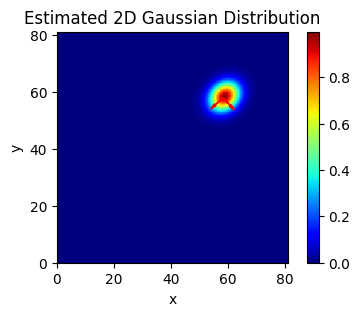

58.271920500654595 57.87759297187295 3.0974919497380955 3.8345475504390705
runs_counter =  41
iter value is  3 cycle value is  8
Plot of the raw data


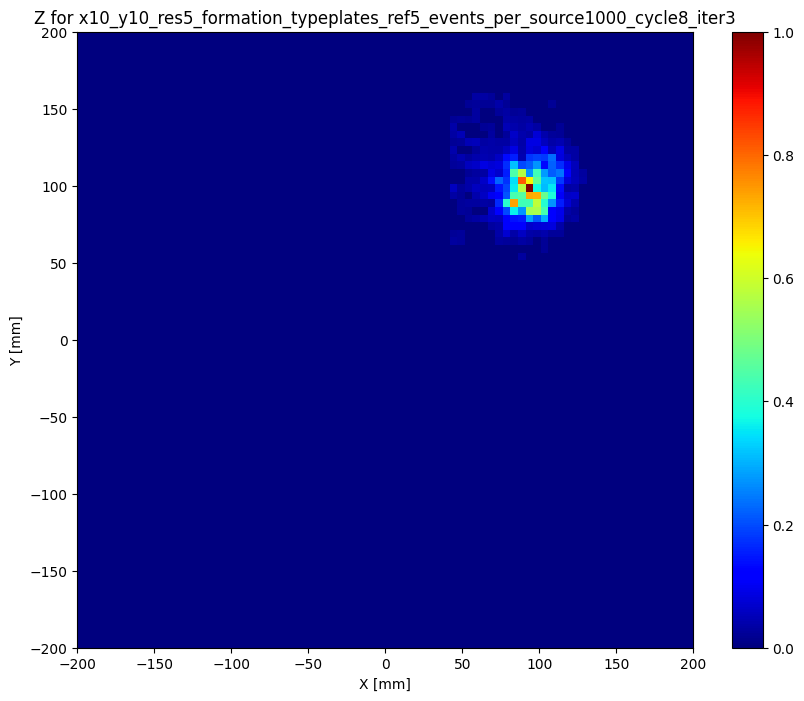

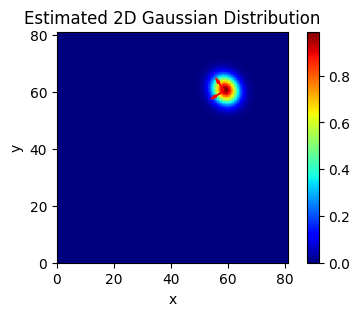

Plot of the raw data


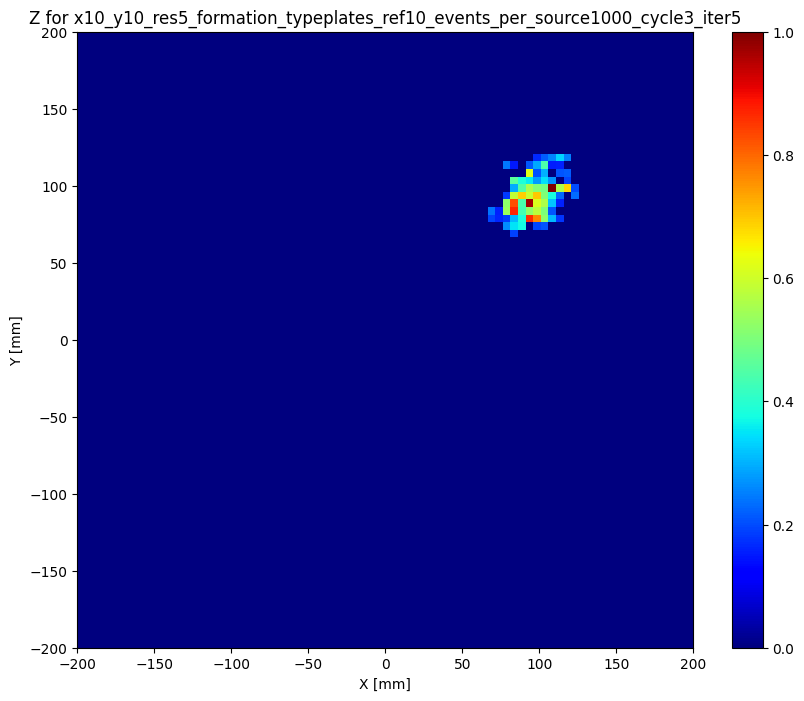

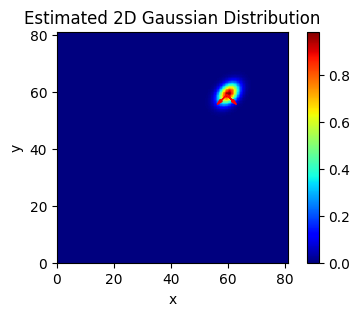

59.58813546001108 58.868657523791164 1.8936560091540966 2.787201098143371
runs_counter =  42
iter value is  3 cycle value is  8
Plot of the raw data


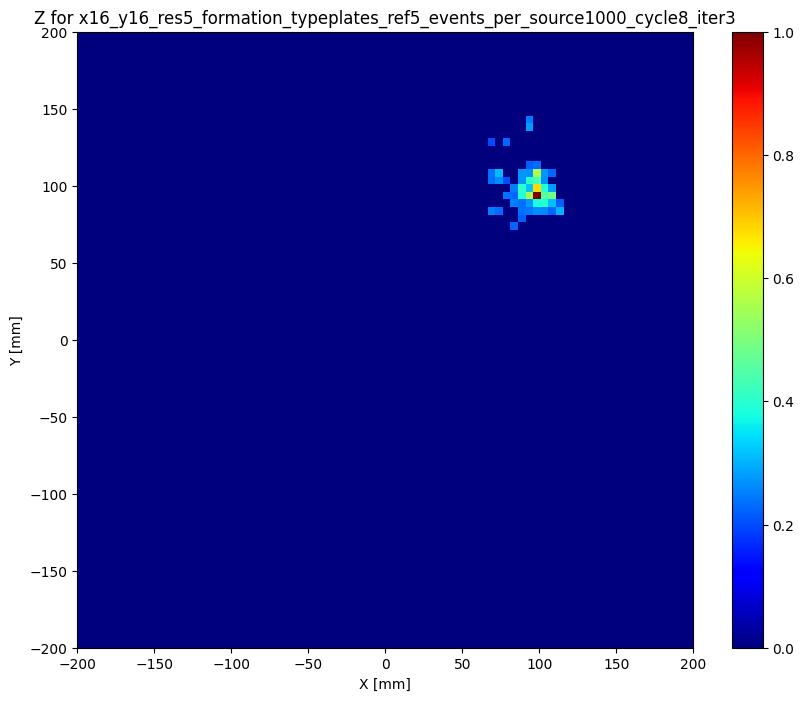

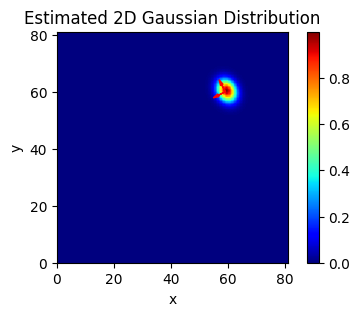

Plot of the raw data


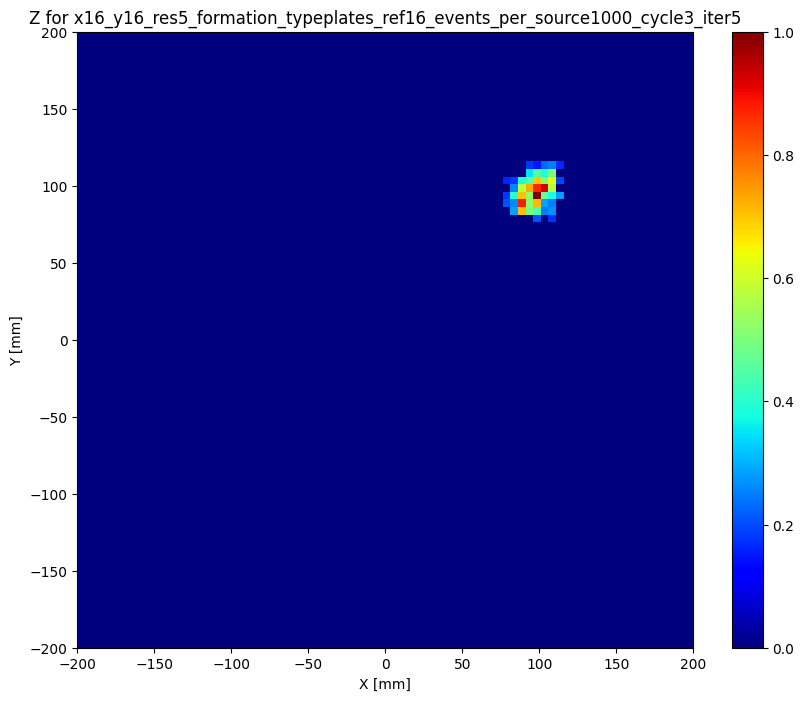

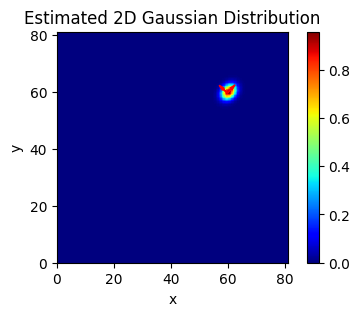

59.73878673519717 59.51389897717731 1.4724912428788293 1.9230330014881198
runs_counter =  43
iter value is  3 cycle value is  8
Plot of the raw data


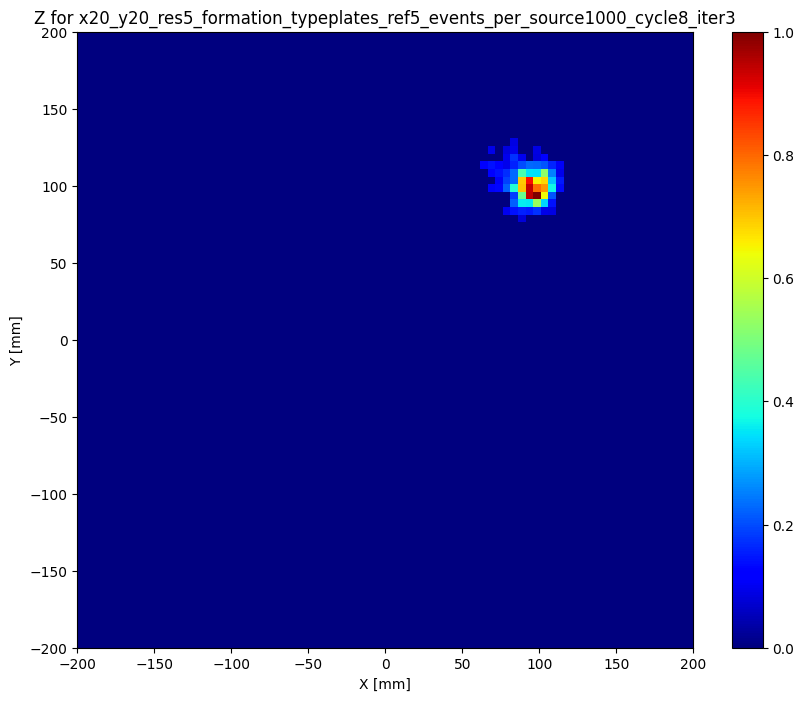

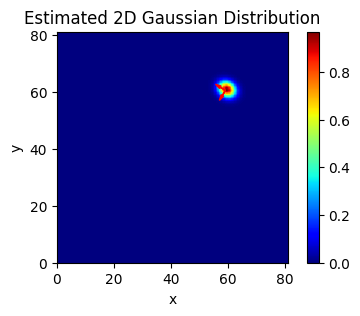

Plot of the raw data


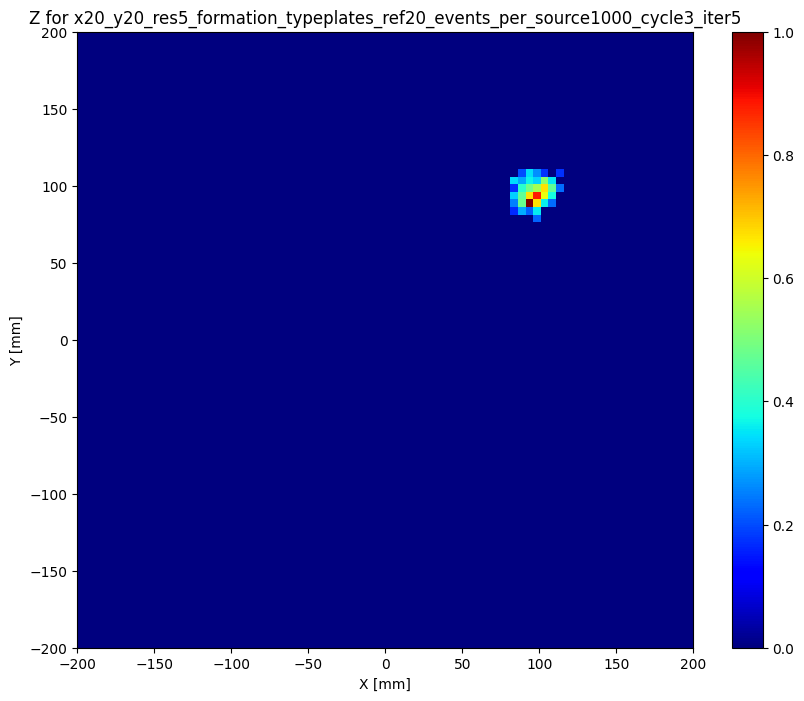

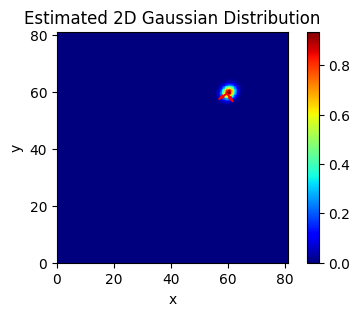

59.66126614813034 59.36616580134532 1.3643892127896613 1.6215745036948295
runs_counter =  44
iter value is  3 cycle value is  8
Plot of the raw data


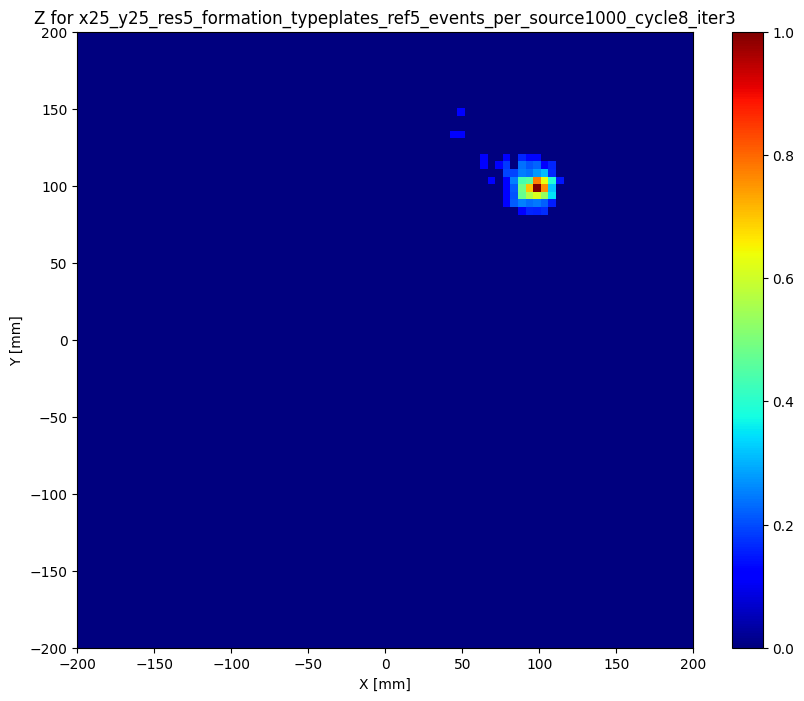

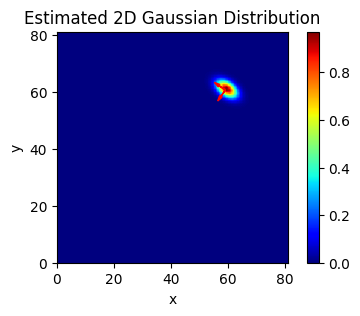

Plot of the raw data


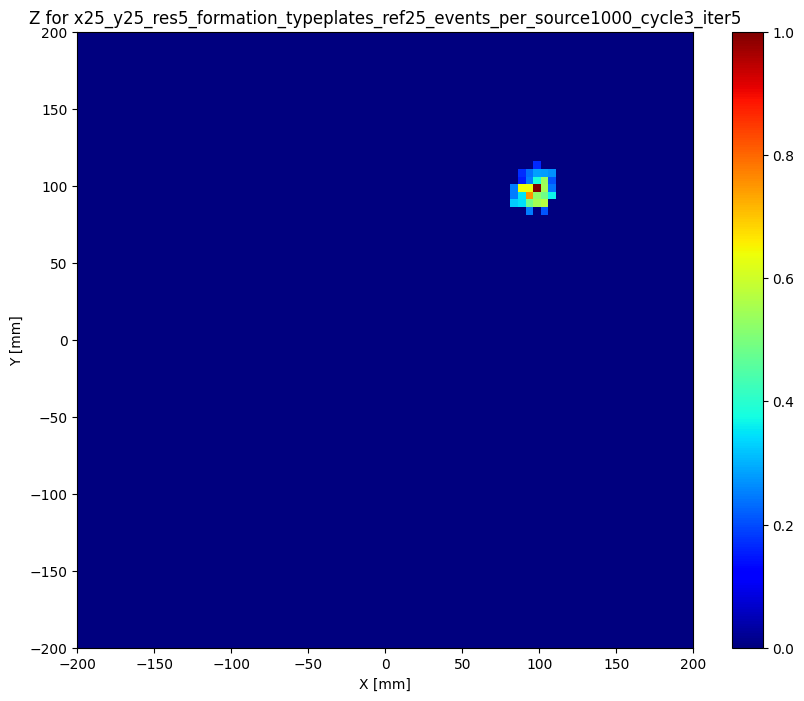

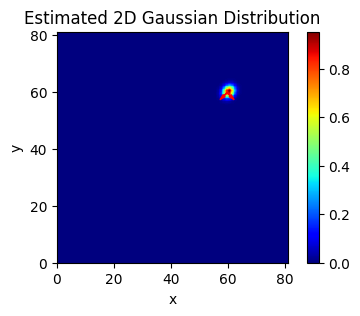

59.693458237971875 59.64431191128667 1.2610499257469268 1.4996008524353925
runs_counter =  45
iter value is  5 cycle value is  9
Plot of the raw data


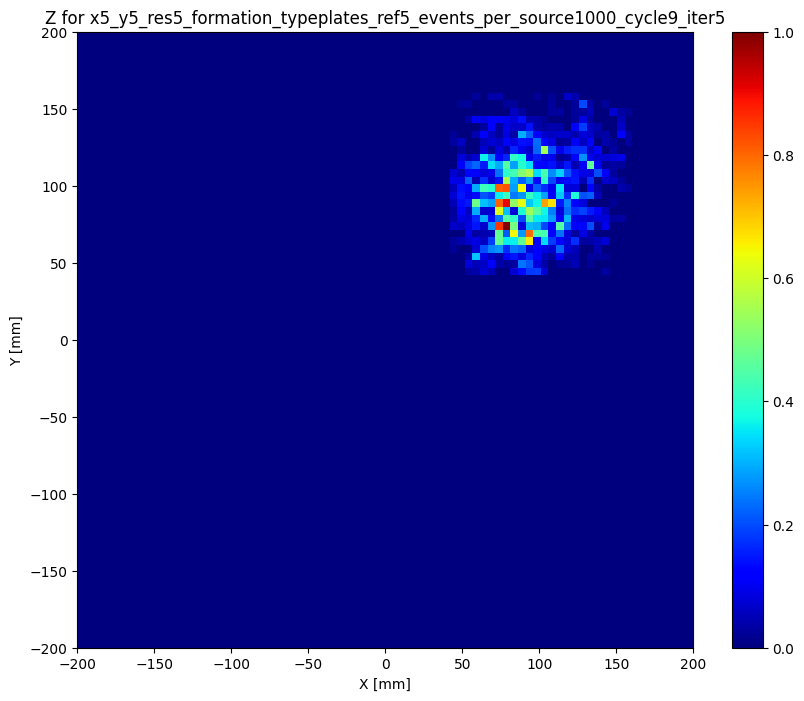

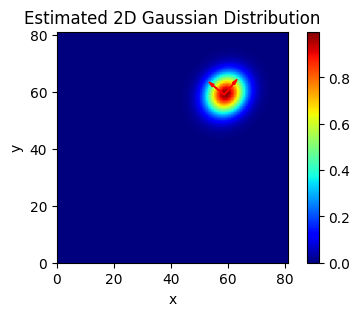

Plot of the raw data


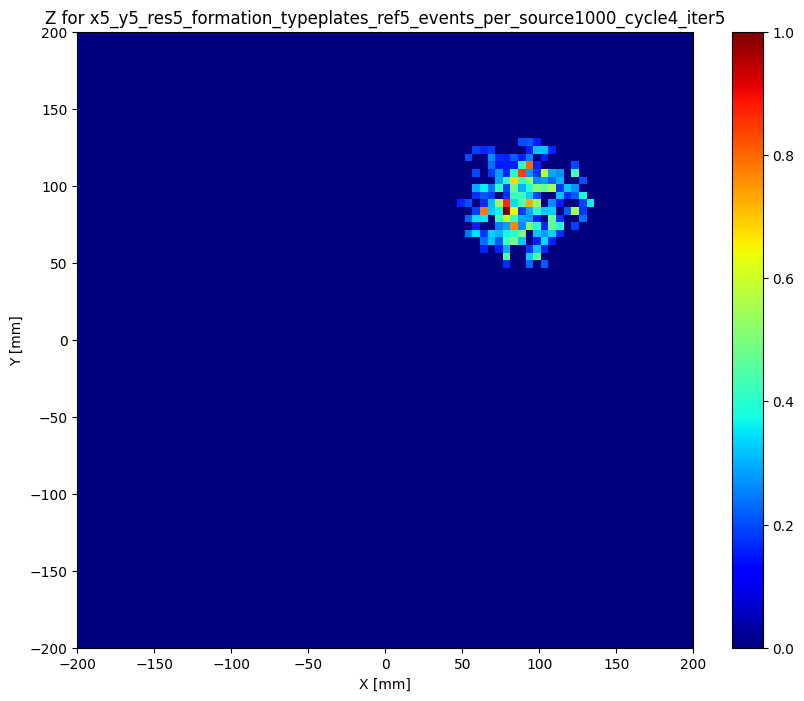

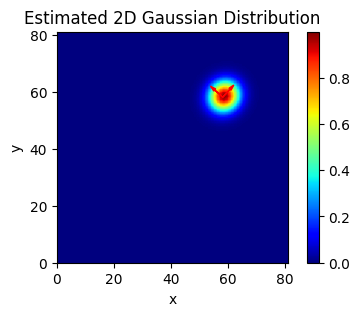

58.14803465864607 58.02516454305595 3.511177896825514 3.7777794743056816
runs_counter =  46
iter value is  3 cycle value is  9
Plot of the raw data


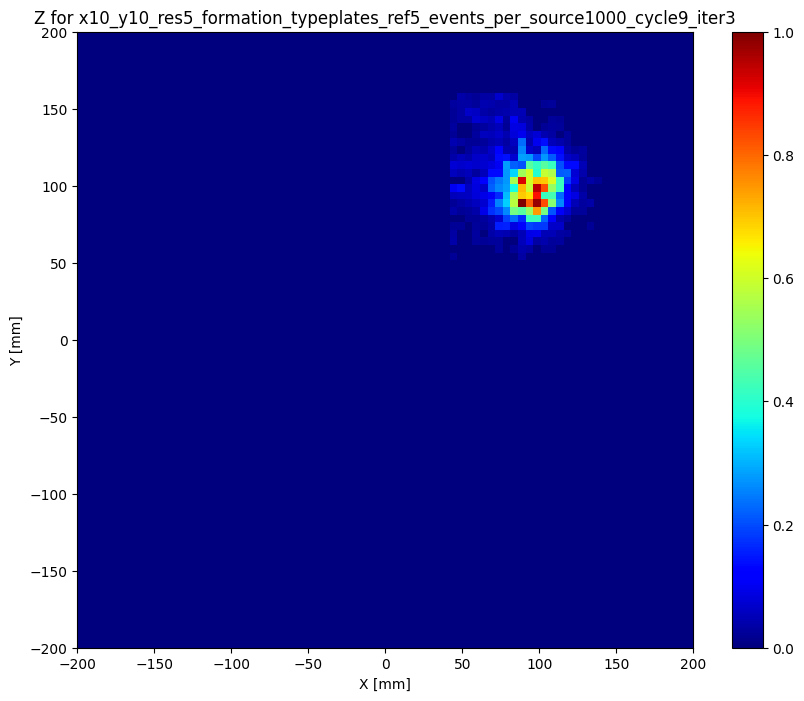

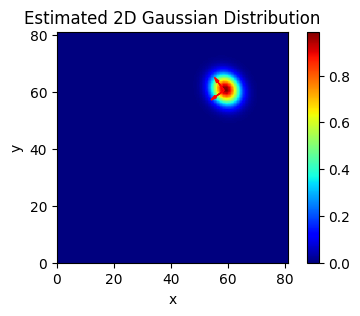

Plot of the raw data


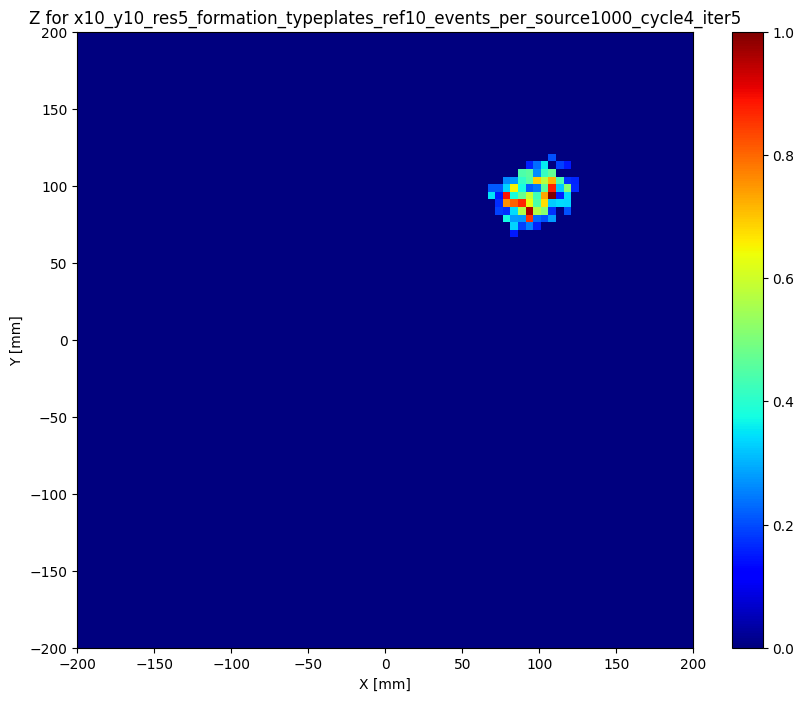

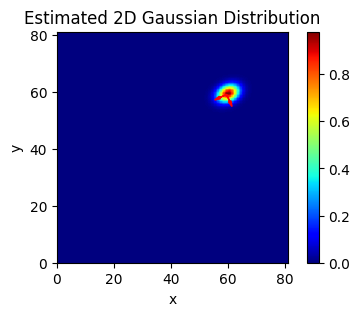

59.51409164578872 58.991183247155405 1.8724205216439362 2.6385545605404808
runs_counter =  47
iter value is  3 cycle value is  9
Plot of the raw data


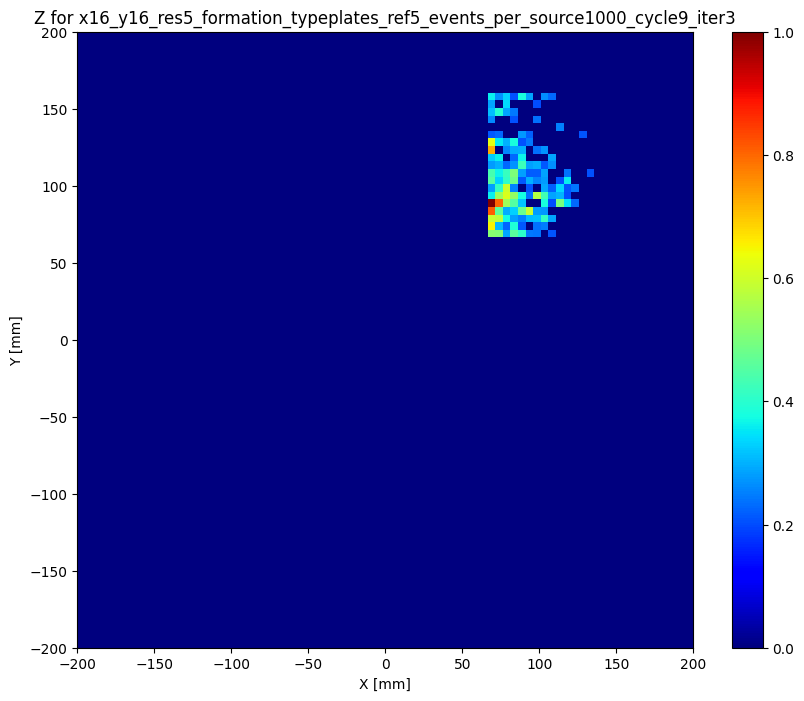

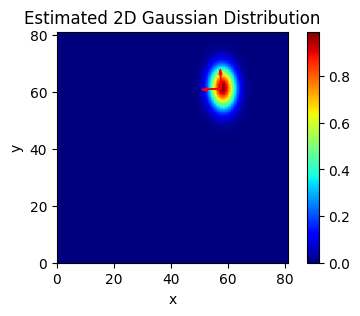

Plot of the raw data


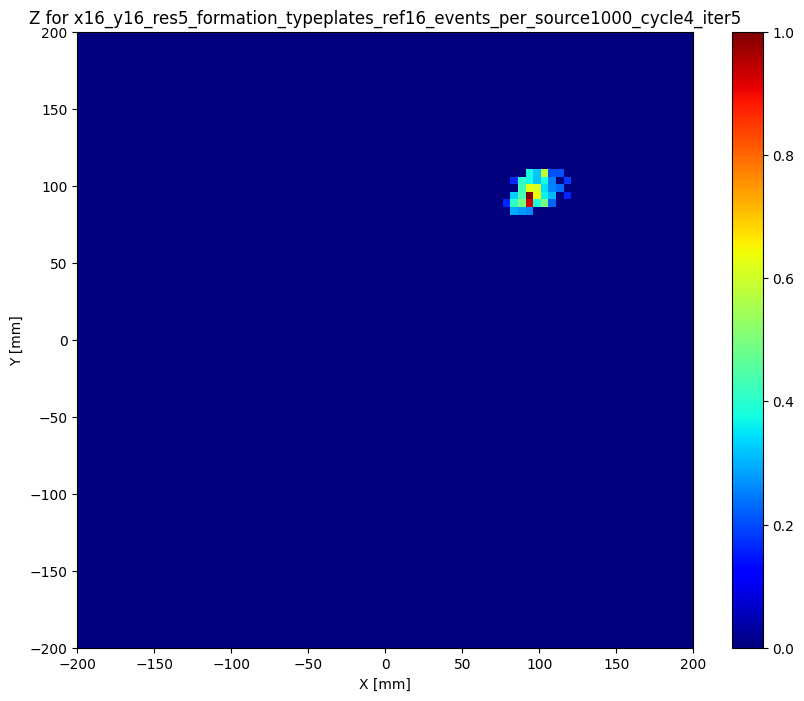

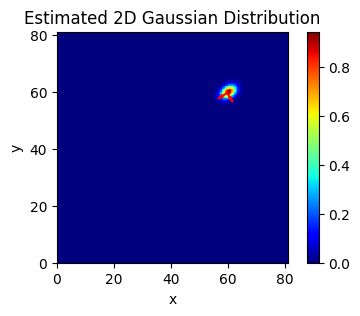

59.66322188773295 59.51955763523447 1.2530356076552556 1.8886361546882642
runs_counter =  48
iter value is  3 cycle value is  9
Plot of the raw data


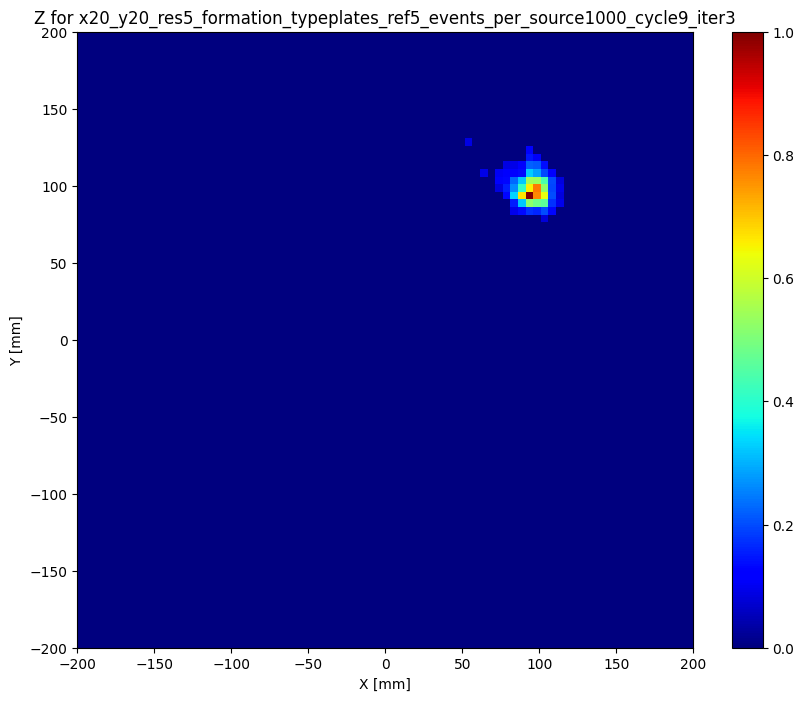

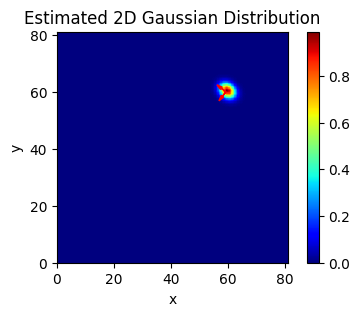

Plot of the raw data


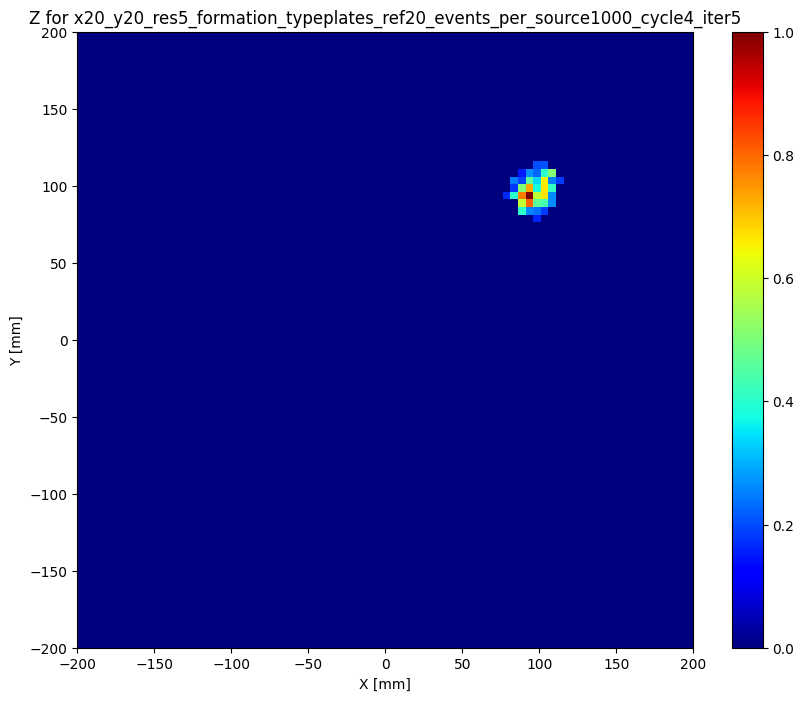

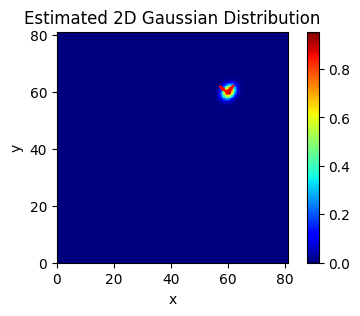

59.68193079304056 59.58305257115668 1.3434154734413342 1.7152457329840116
runs_counter =  49
iter value is  3 cycle value is  9
Plot of the raw data


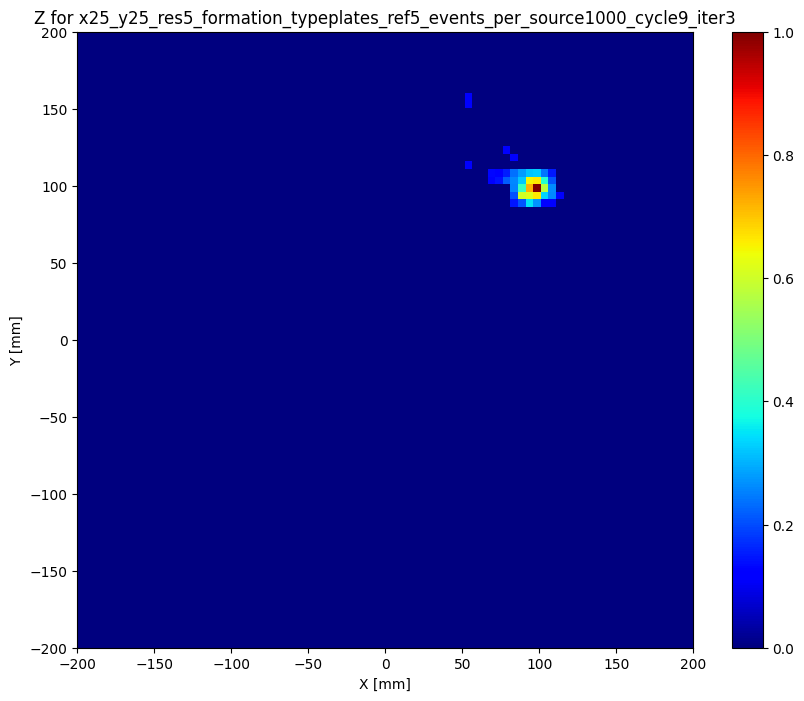

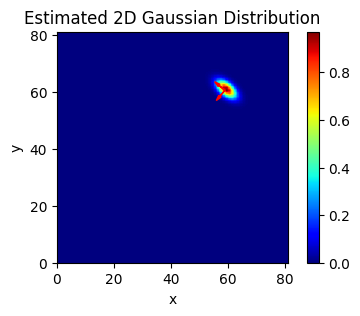

Plot of the raw data


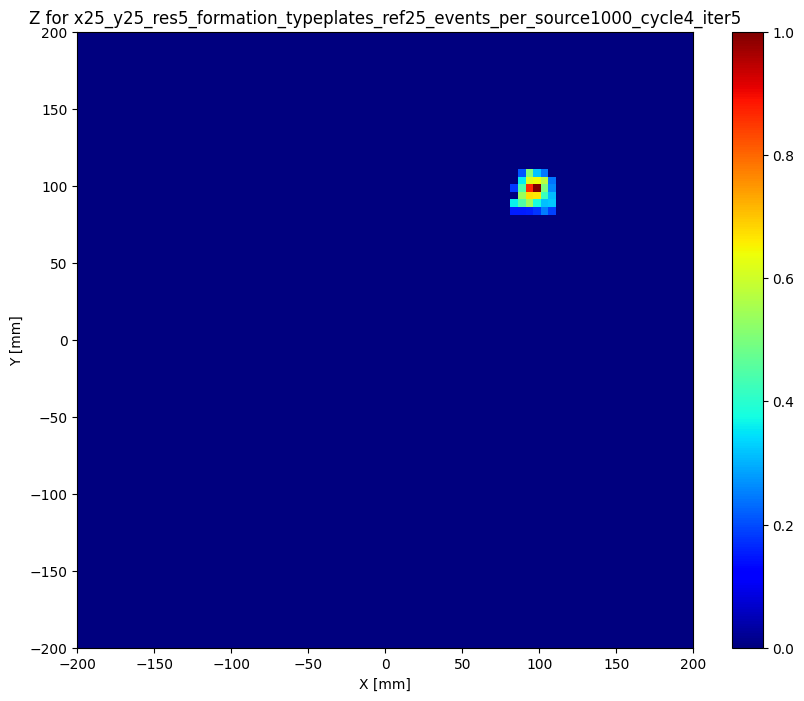

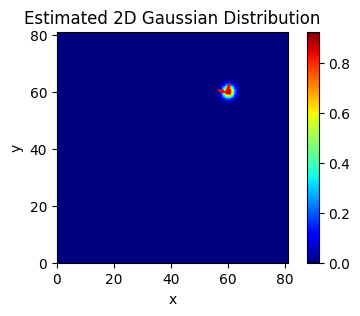

59.63043713594478 59.57085349079773 1.3503192810142663 1.4486689484015558
runs_counter =  50


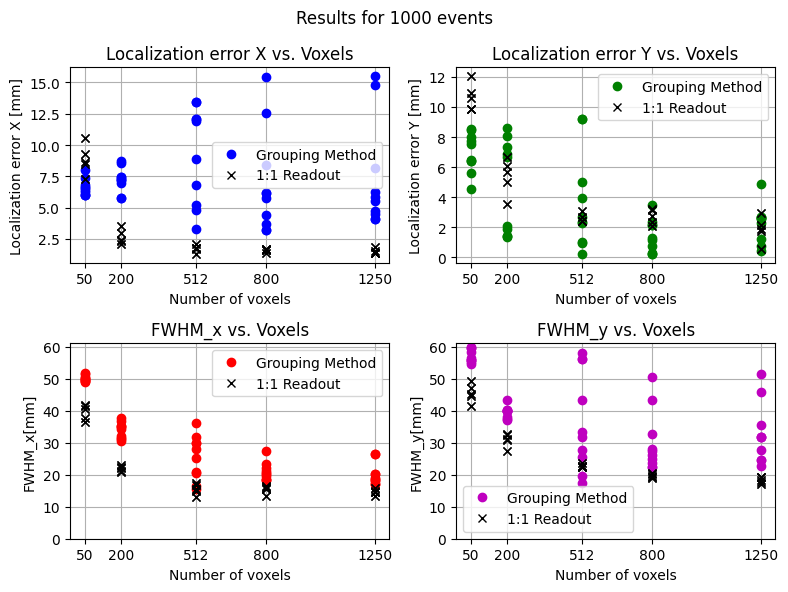

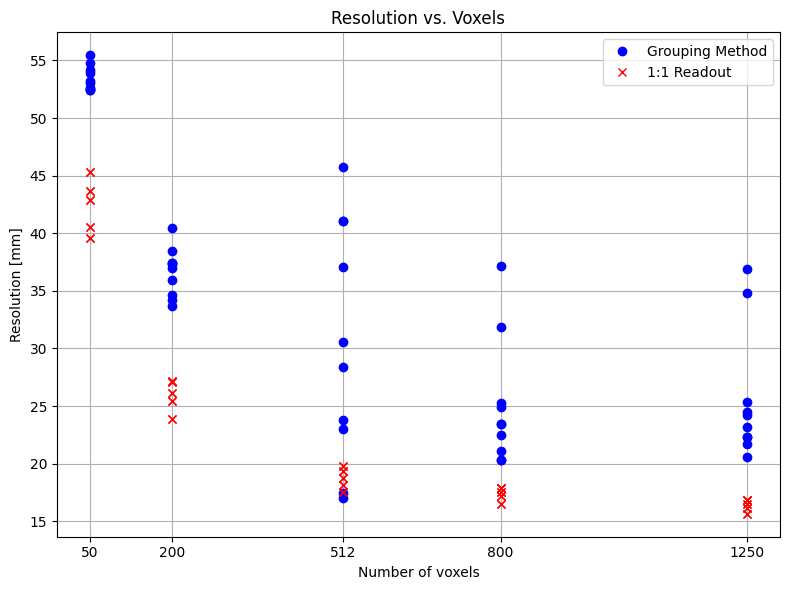

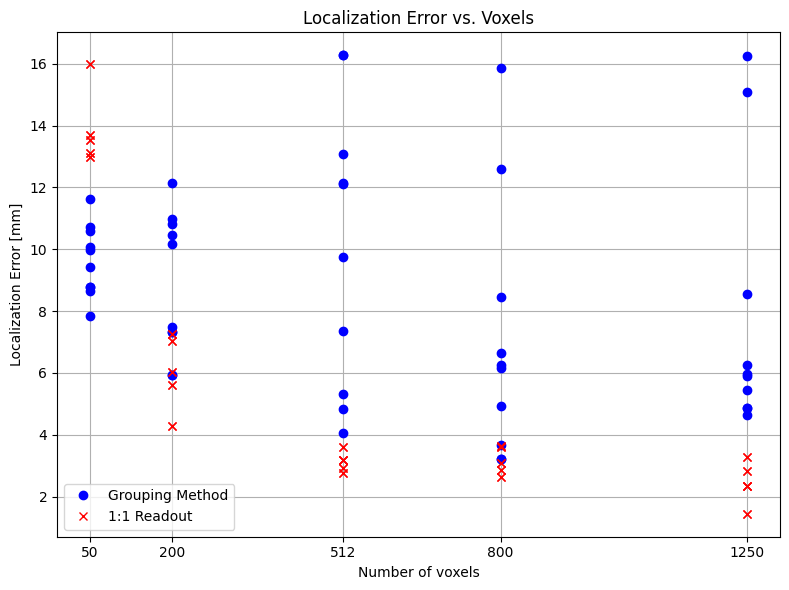

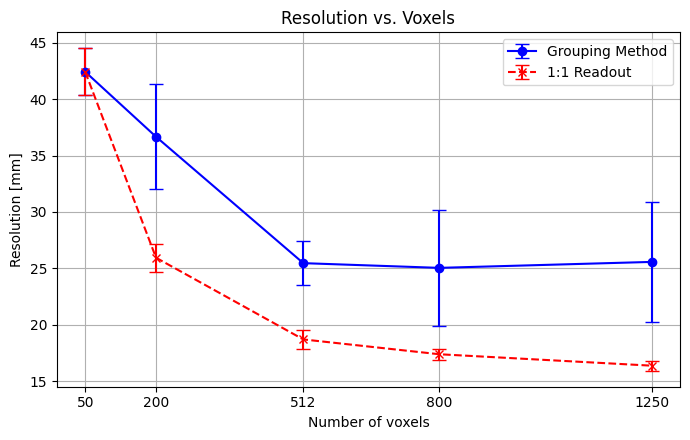

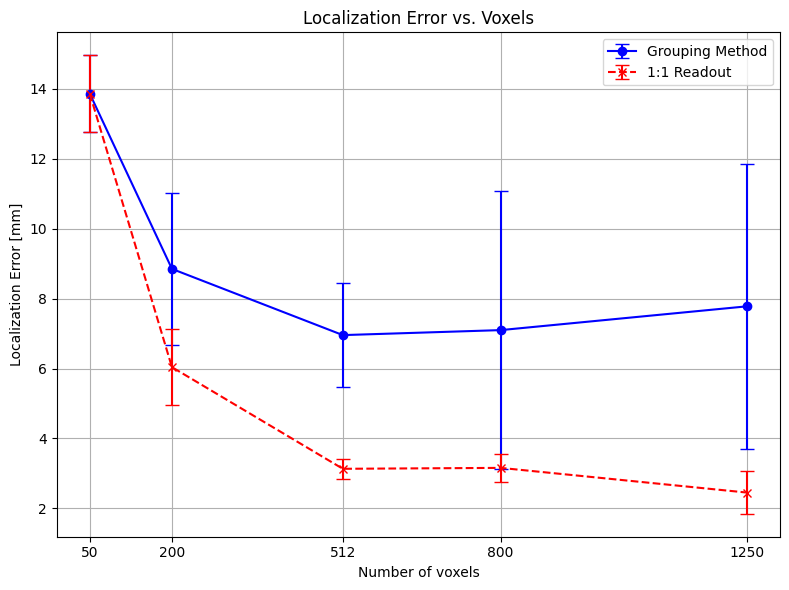

In [ ]:
#def evaluate_1000_events():
events_per_source = 1000
formation_type =  'plates'
voxels_in_row_values = [5, 10 , 16, 20, 25]
voxels_in_col_values = [5, 10 , 16, 20, 25]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 5
cycles = 10   # to be extended

mu_x = np.zeros(len(voxels_in_row_values)*cycles)
mu_y = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y = np.zeros(len(voxels_in_row_values)*cycles)
mu_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
mu_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
#mu_x, mu_y, sigma_x, sigma_y, mu_x_ref, mu_y_ref, sigma_x_ref, sigma_y_ref = [np.zeros(len([1])*len(voxels_in_row_values)*cycles)] * 8
runs_counter = 0;
for cycle in range(0,cycles):
    for voxels_in_row in voxels_in_row_values:
      for voxels_in_col in voxels_in_col_values:
        if voxels_in_row == voxels_in_col:
          cycle_tmp = cycle
          iter_tmp = iter
          if cycle_tmp == 6:
            cycle = 7
          if voxels_in_row == 5:
            iter = iter_tmp
          else :
            iter = iter_tmp - 2
          #if voxels_in_row == 16:
          #  cycle = cycle_tmp % 5
          print('iter value is ', iter, 'cycle value is ', cycle)
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)

          path_quick_run = '/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/' + file_name
          path_main = '/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/' + file_name

          if os.path.exists(path_quick_run):
              mat_contents = scipy.io.loadmat(path_quick_run)
          else:
              mat_contents = scipy.io.loadmat(path_main)

          #mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/'+ file_name)
          Z = mat_contents['target_final']
          threshold = 0.02 # percents from the maximum
          if voxels_in_row == 16:
            threshold = 0.2
            Z[:,:54] = 0;
            Z[:54,:] = 0;
          if voxels_in_row == 20:
            threshold = 0.08
          if voxels_in_row == 25:
            threshold = 0.11
          mu_x[runs_counter], mu_y[runs_counter], sigma_x[runs_counter], sigma_y[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          cycle = cycle_tmp
          iter = iter_tmp

          # Add the reference upper bound results
          cycle_tmp = cycle
          if cycle > 4:
            cycle = cycle - 5
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(voxels_in_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/'+ file_name)
          Z = mat_contents['target_final']
          threshold = 0.15 # percents from the maximum
          #if voxels_in_row == 16:
          #  threshold = 0.2
          #  Z[:,:55] = 0;
          #  Z[:55,:] = 0;
          #if voxels_in_row == 20:
          #  threshold = 0.22
          #if voxels_in_row == 25:
          #  threshold = 0.28
          mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          print(mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter])
          runs_counter = runs_counter + 1
          print('runs_counter = ', runs_counter)
          cycle = cycle_tmp


FWHM_x = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x
FWHM_y = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y
FWHM_x_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x_ref
FWHM_y_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y_ref

mu_x_mm = mu_x * image_res - 200
mu_y_mm = mu_y * image_res - 200
mu_x_ref_mm = mu_x_ref * image_res - 200
mu_y_ref_mm = mu_y_ref * image_res - 200

localization_error_x = np.abs(mu_x_mm - 100)
localization_error_y = np.abs(mu_y_mm - 100)
localization_error_x_ref = np.abs(mu_x_ref_mm - 100)
localization_error_y_ref = np.abs(mu_y_ref_mm - 100)

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
fig.suptitle('Results for '+ str(events_per_source) +' events')
indices = np.tile(np.power(voxels_in_row_values, 2) * 2, cycles)


# Plot mu_x
axs[0, 0].plot(indices, localization_error_x, marker='o', linestyle='None', color='b', label ='Grouping Method')
axs[0, 0].plot(indices, localization_error_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 0].set_title('Localization error X vs. Voxels')
axs[0, 0].set_xlabel('Number of voxels')
axs[0, 0].set_ylabel('Localization error X [mm]')
#axs[0, 0].set_ylim(57, 60)
axs[0, 0].legend()

# Plot mu_y
axs[0, 1].plot(indices, localization_error_y, marker='o', linestyle='None', color='g', label ='Grouping Method')
axs[0, 1].plot(indices, localization_error_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 1].set_title('Localization error Y vs. Voxels')
axs[0, 1].set_xlabel('Number of voxels')
axs[0, 1].set_ylabel('Localization error Y [mm]')
#axs[0, 1].set_ylim(57, 60)
axs[0, 1].legend()

# Plot FWHM_x
axs[1, 0].plot(indices, FWHM_x, marker='o', linestyle='None', color='r', label ='Grouping Method')
axs[1, 0].plot(indices, FWHM_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 0].set_title('FWHM_x vs. Voxels')
axs[1, 0].set_xlabel('Number of voxels')
axs[1, 0].set_ylabel('FWHM_x[mm]')
axs[1, 0].set_ylim(0, 61)
axs[1, 0].legend()

# Plot FWHM_y
axs[1, 1].plot(indices, FWHM_y, marker='o', linestyle='None', color='m', label ='Grouping Method')
axs[1, 1].plot(indices, FWHM_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 1].set_title('FWHM_y vs. Voxels')
axs[1, 1].set_xlabel('Number of voxels')
axs[1, 1].set_ylabel('FWHM_y[mm]')
axs[1, 1].set_ylim(0, 61)
axs[1, 1].legend()

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
for ax in axs.flat:
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)
# Enable grid for all subplots
for ax in axs.flat:
    ax.grid(True)

# Adjust layout

plt.tight_layout()
plt.show()

############# Total Resolution
resolution = np.sqrt(FWHM_x*FWHM_y)
resolution_ref = np.sqrt(FWHM_x_ref*FWHM_y_ref)
plt.figure(figsize=(8, 6))

# Plot 'resolution'
plt.plot(indices, resolution, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'resolution_ref'
plt.plot(indices, resolution_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Resolution [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

############# Total Localization Error
localization_error = np.sqrt(localization_error_x**2 + localization_error_y**2)
localization_error_ref = np.sqrt(localization_error_x_ref**2 + localization_error_y_ref**2)

plt.figure(figsize=(8, 6))

# Plot 'localization_error'
plt.plot(indices, localization_error, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'localization_error_ref'
plt.plot(indices, localization_error_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Localization Error [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

resolution[indices == 1250] = np.where(resolution[indices == 1250] > 40, 40, resolution[indices == 1250])
localization_error[indices == 1250] = np.where(localization_error[indices == 1250] > 20, 20, localization_error[indices == 1250])

resolution[indices == 512] = np.where(resolution[indices == 512] > 30, 29, resolution[indices == 512])
localization_error[indices == 512] = np.where(localization_error[indices == 512] > 8, 8, localization_error[indices == 512])

unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]

resolution_std[1], resolution_std[2] = resolution_std[2], resolution_std[1]

############# Total Resolution
plt.figure(figsize=(7, 4.5))

# Plot 'resolution'
plt.errorbar(unique_indices, resolution_mean, yerr = resolution_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'resolution_ref'
plt.errorbar(unique_indices, resolution_ref_mean, yerr = resolution_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Resolution [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()


############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]

#localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
#localization_error_ref_std[4] = 0.9*localization_error_ref_std[3]


plt.figure(figsize=(8, 6))

# Plot 'localization_error_mean'
plt.errorbar(unique_indices, localization_error_mean, yerr = localization_error_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'localization_error_ref_mean'
plt.errorbar(unique_indices, localization_error_ref_mean, yerr = localization_error_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Localization Error [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()
  #return resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std




In [7]:
# def evaluate_1500_events():
events_per_source = 1500
formation_type =  'plates'
voxels_in_row_values = [5, 10 , 16, 20, 25]
voxels_in_col_values = [5, 10 , 16, 20, 25]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 4
cycles = 10   # to be extended

mu_x = np.zeros(len(voxels_in_row_values)*cycles)
mu_y = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y = np.zeros(len(voxels_in_row_values)*cycles)
mu_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
mu_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
#mu_x, mu_y, sigma_x, sigma_y, mu_x_ref, mu_y_ref, sigma_x_ref, sigma_y_ref = [np.zeros(len([1])*len(voxels_in_row_values)*cycles)] * 8
runs_counter = 0;
for cycle in range(0,cycles):
    for voxels_in_row in voxels_in_row_values:
      for voxels_in_col in voxels_in_col_values:
        if voxels_in_row == voxels_in_col:
          cycle_tmp = cycle
          iter_tmp = iter
          if voxels_in_row == 5:
            iter = iter_tmp
          else :
            iter = iter_tmp - 2
          if voxels_in_row == 16:
            cycle = cycle_tmp % 5
          print('iter value is ', iter, 'cycle value is ', cycle)
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          path_quick_run = '/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/' + file_name
          path_main = '/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/' + file_name

          if os.path.exists(path_quick_run):
              mat_contents = scipy.io.loadmat(path_quick_run)
          else:
              mat_contents = scipy.io.loadmat(path_main)
          Z = mat_contents['target_final']
          threshold = 0.08 # percents from the maximum
          if voxels_in_row == 16:
            threshold = 0.25
            Z[:,:55] = 0;
            Z[:55,:] = 0;
          if voxels_in_row == 20:
            threshold = 0.17
          if voxels_in_row == 25:
            threshold = 0.28
          mu_x[runs_counter], mu_y[runs_counter], sigma_x[runs_counter], sigma_y[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          cycle = cycle_tmp
          iter = iter_tmp

          # Add the reference upper bound results
          cycle_tmp = cycle
          if cycle > 4:
            cycle = cycle - 5
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(voxels_in_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/'+ file_name)
          Z = mat_contents['target_final']
          threshold = 0.12 # percents from the maximum
          if voxels_in_row == 16:
            threshold = 0.2
            Z[:,:55] = 0;
            Z[:55,:] = 0;
          if voxels_in_row == 20:
            threshold = 0.22
          if voxels_in_row == 25:
            threshold = 0.28
          mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          print(mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter])
          runs_counter = runs_counter + 1
          print('runs_counter = ', runs_counter)
          cycle = cycle_tmp


FWHM_x = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x
FWHM_y = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y
FWHM_x_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x_ref
FWHM_y_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y_ref

mu_x_mm = mu_x * image_res - 200
mu_y_mm = mu_y * image_res - 200
mu_x_ref_mm = mu_x_ref * image_res - 200
mu_y_ref_mm = mu_y_ref * image_res - 200

localization_error_x = np.abs(mu_x_mm - 100)
localization_error_y = np.abs(mu_y_mm - 100)
localization_error_x_ref = np.abs(mu_x_ref_mm - 100)
localization_error_y_ref = np.abs(mu_y_ref_mm - 100)

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
fig.suptitle('Results for '+ str(events_per_source) +' events')
indices = np.tile(np.power(voxels_in_row_values, 2) * 2, cycles)


# Plot mu_x
axs[0, 0].plot(indices, localization_error_x, marker='o', linestyle='None', color='b', label ='Grouping Method')
axs[0, 0].plot(indices, localization_error_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 0].set_title('Localization error X vs. Voxels')
axs[0, 0].set_xlabel('Number of voxels')
axs[0, 0].set_ylabel('Localization error X [mm]')
#axs[0, 0].set_ylim(57, 60)
axs[0, 0].legend()

# Plot mu_y
axs[0, 1].plot(indices, localization_error_y, marker='o', linestyle='None', color='g', label ='Grouping Method')
axs[0, 1].plot(indices, localization_error_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 1].set_title('Localization error Y vs. Voxels')
axs[0, 1].set_xlabel('Number of voxels')
axs[0, 1].set_ylabel('Localization error Y [mm]')
#axs[0, 1].set_ylim(57, 60)
axs[0, 1].legend()

# Plot FWHM_x
axs[1, 0].plot(indices, FWHM_x, marker='o', linestyle='None', color='r', label ='Grouping Method')
axs[1, 0].plot(indices, FWHM_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 0].set_title('FWHM_x vs. Voxels')
axs[1, 0].set_xlabel('Number of voxels')
axs[1, 0].set_ylabel('FWHM_x[mm]')
axs[1, 0].set_ylim(0, 61)
axs[1, 0].legend()

# Plot FWHM_y
axs[1, 1].plot(indices, FWHM_y, marker='o', linestyle='None', color='m', label ='Grouping Method')
axs[1, 1].plot(indices, FWHM_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 1].set_title('FWHM_y vs. Voxels')
axs[1, 1].set_xlabel('Number of voxels')
axs[1, 1].set_ylabel('FWHM_y[mm]')
axs[1, 1].set_ylim(0, 61)
axs[1, 1].legend()

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
for ax in axs.flat:
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)
# Enable grid for all subplots
for ax in axs.flat:
    ax.grid(True)

# Adjust layout

plt.tight_layout()
plt.show()

############# Total Resolution
resolution = np.sqrt(FWHM_x*FWHM_y)
resolution_ref = np.sqrt(FWHM_x_ref*FWHM_y_ref)
plt.figure(figsize=(8, 6))

# Plot 'resolution'
plt.plot(indices, resolution, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'resolution_ref'
plt.plot(indices, resolution_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Resolution [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

############# Total Localization Error
localization_error = np.sqrt(localization_error_x**2 + localization_error_y**2)
localization_error_ref = np.sqrt(localization_error_x_ref**2 + localization_error_y_ref**2)

plt.figure(figsize=(8, 6))

# Plot 'localization_error'
plt.plot(indices, localization_error, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'localization_error_ref'
plt.plot(indices, localization_error_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Localization Error [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

resolution[indices == 1250] = np.where(resolution[indices == 1250] > 20, 20, resolution[indices == 1250])
localization_error[indices == 1250] = np.where(localization_error[indices == 1250] > 8, 5, localization_error[indices == 1250])

unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]
resolution_ref_std[1], resolution_ref_std[2] = resolution_ref_std[2], resolution_ref_std[1]
############# Total Resolution
plt.figure(figsize=(7, 4.5))

# Plot 'resolution'
plt.errorbar(unique_indices, resolution_mean, yerr = resolution_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'resolution_ref'
plt.errorbar(unique_indices, resolution_ref_mean, yerr = resolution_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Resolution [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend(prop=legend_font)

plt.tight_layout()
plt.show()


############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9*localization_error_ref_std[3]


plt.figure(figsize=(8, 6))

# Plot 'localization_error_mean'
plt.errorbar(unique_indices, localization_error_mean, yerr = localization_error_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'localization_error_ref_mean'
plt.errorbar(unique_indices, localization_error_ref_mean, yerr = localization_error_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Localization Error [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend(prop=legend_font)

plt.tight_layout()
plt.show()
  #return resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std




Output hidden; open in https://colab.research.google.com to view.

iter value is  4 cycle value is  0
Plot of the raw data


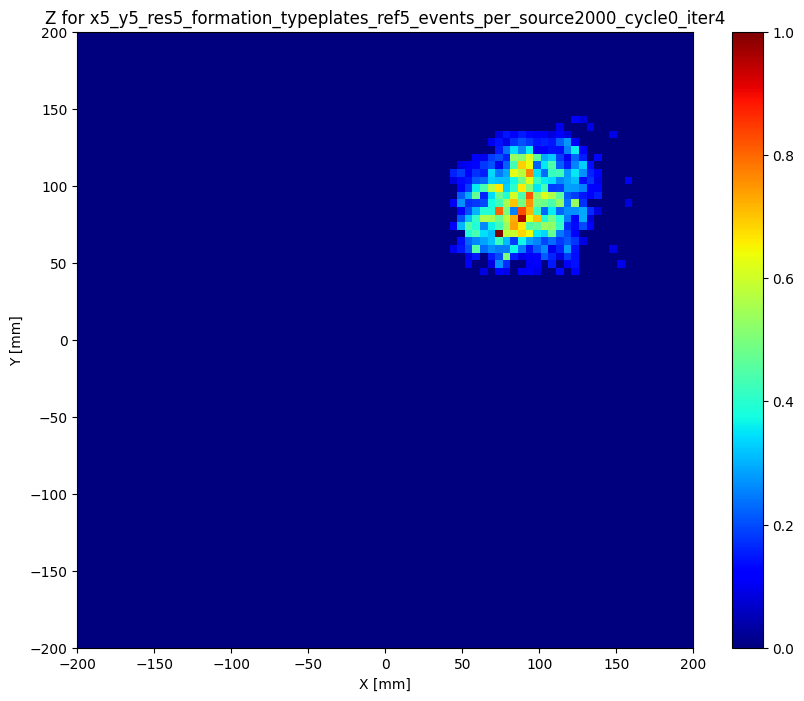

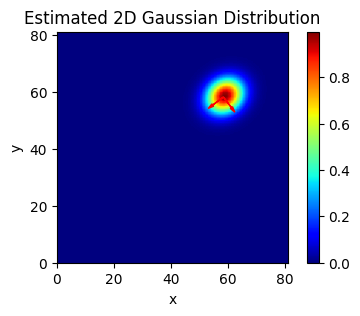

Plot of the raw data


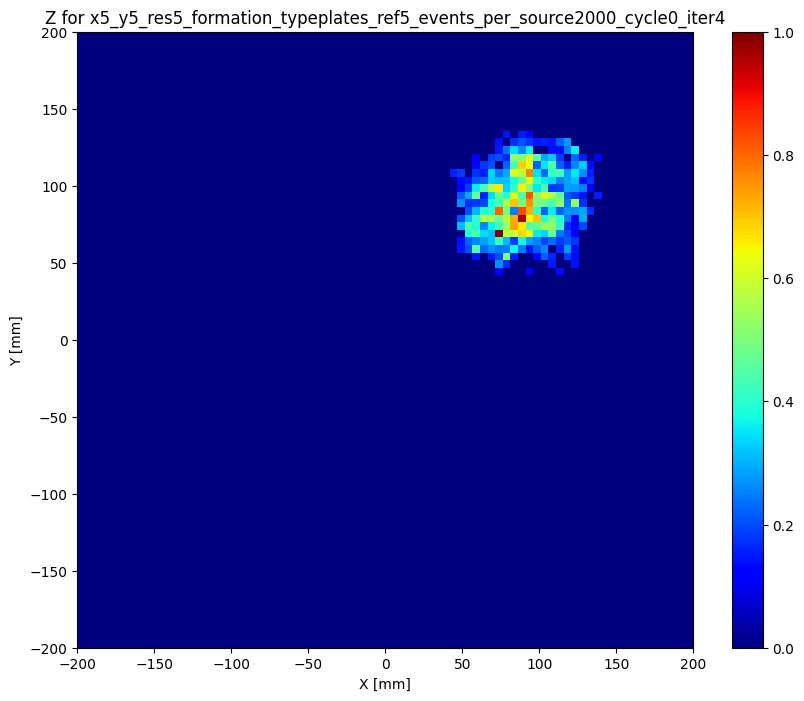

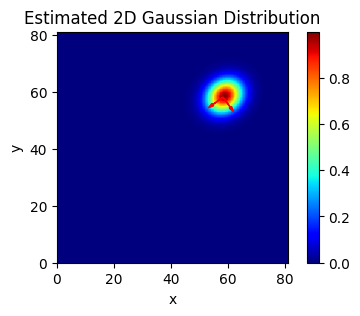

58.24771584445829 58.055504191125785 3.6761272855786604 4.403946681573374
runs_counter =  1
iter value is  2 cycle value is  0
Plot of the raw data


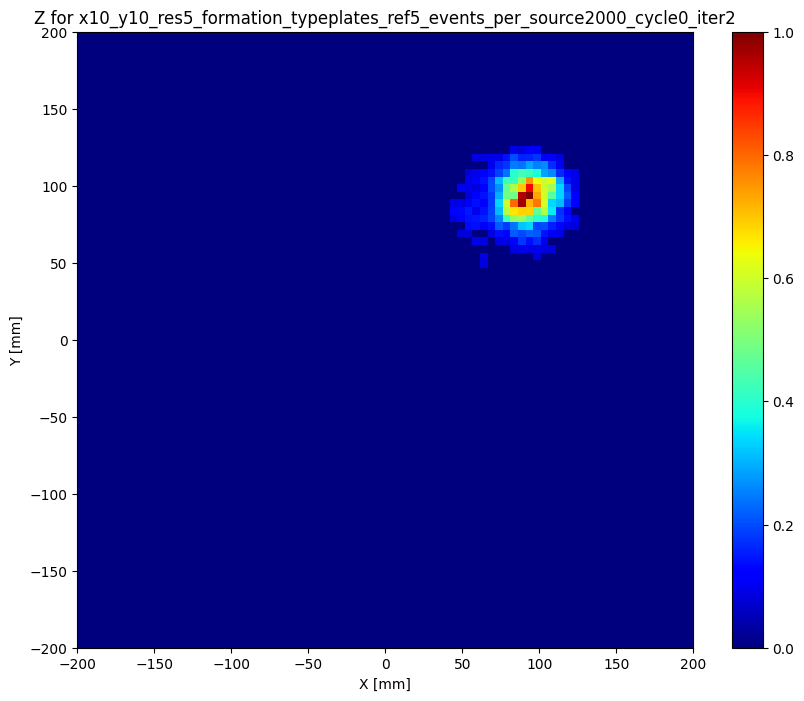

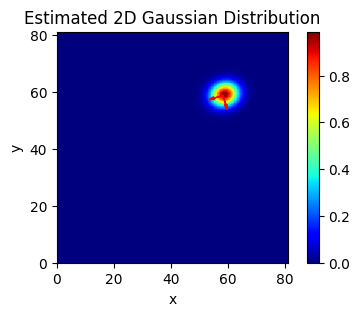

Plot of the raw data


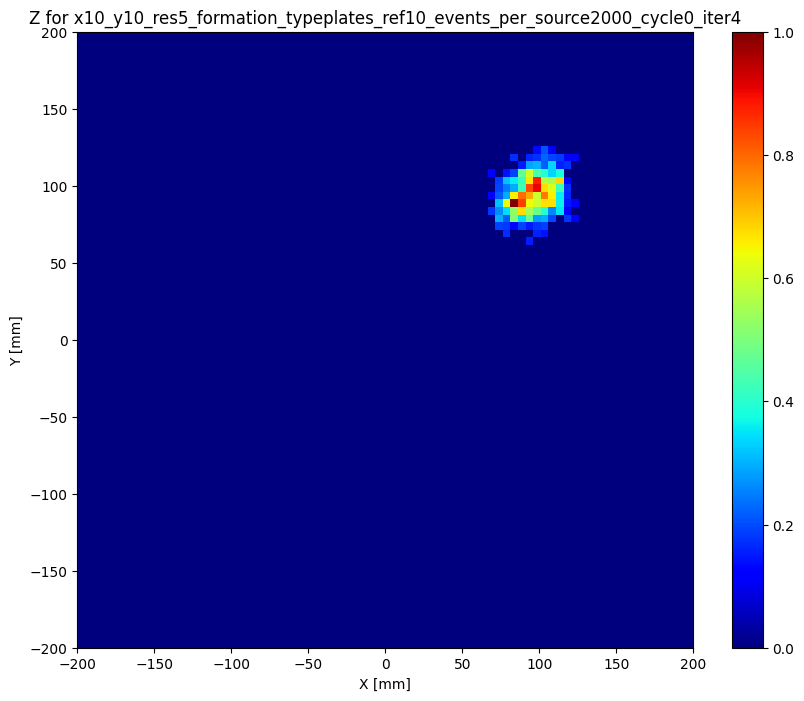

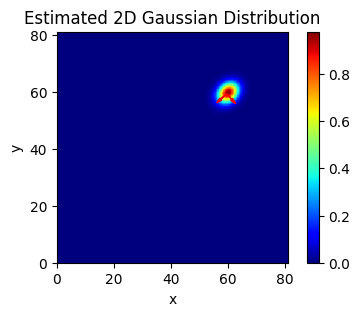

59.49505974402347 59.23275438945827 2.1233311532131003 2.72046503416681
runs_counter =  2
iter value is  2 cycle value is  0
Plot of the raw data


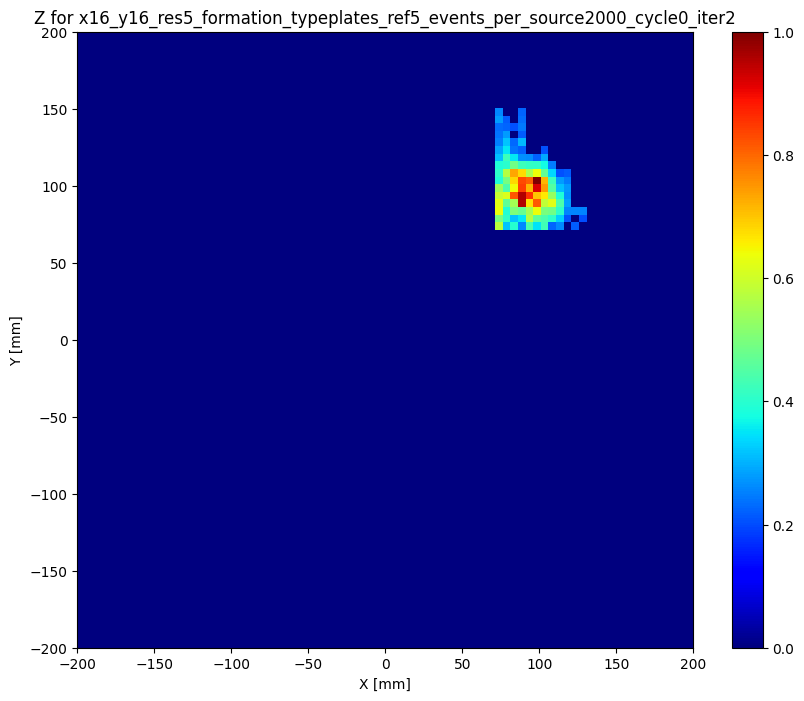

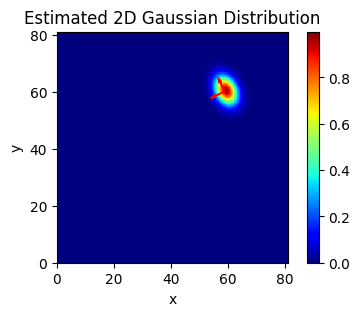

Plot of the raw data


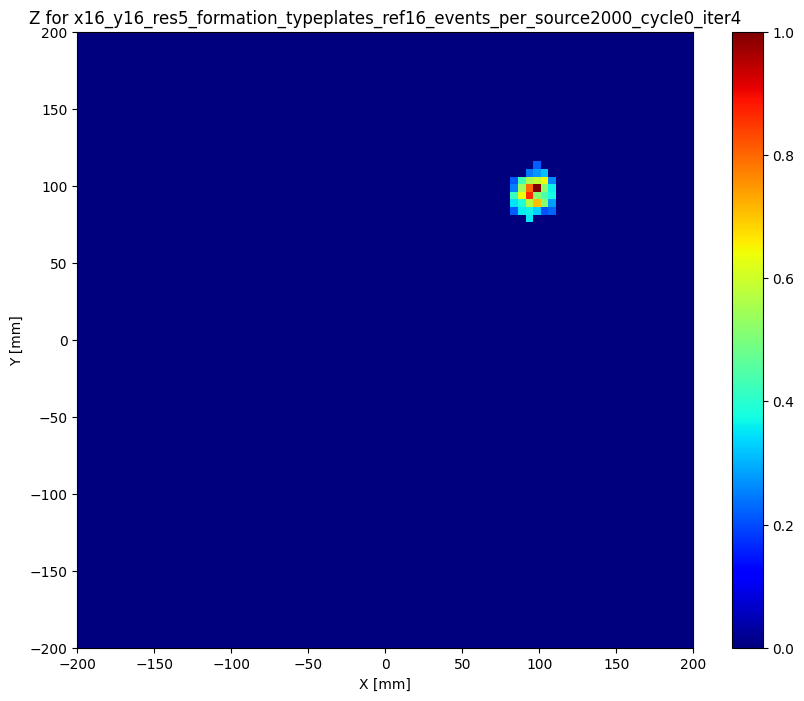

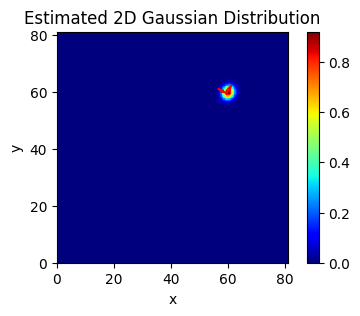

59.53190802888422 59.32481888705537 1.385104221255768 1.585022684576885
runs_counter =  3
iter value is  2 cycle value is  0
Plot of the raw data


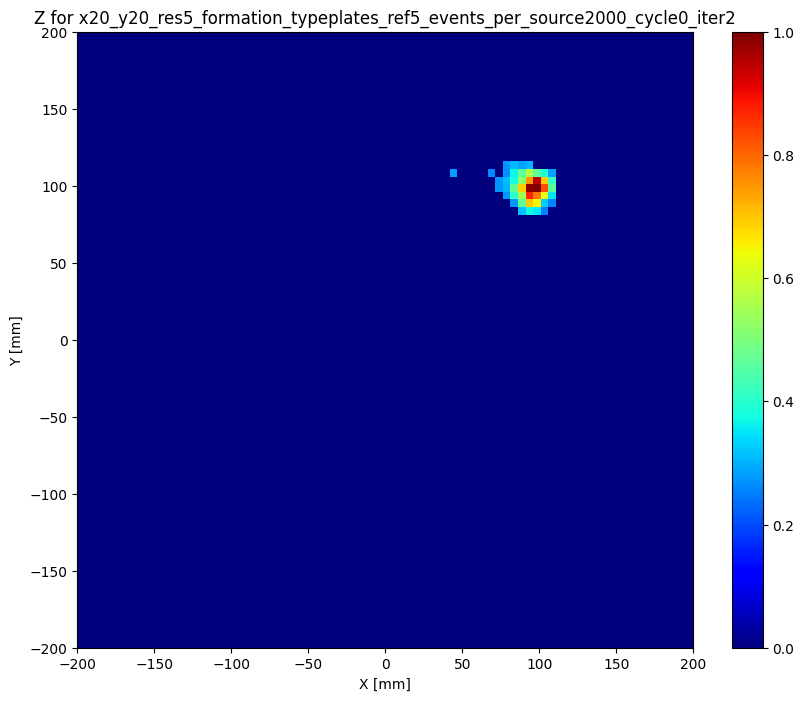

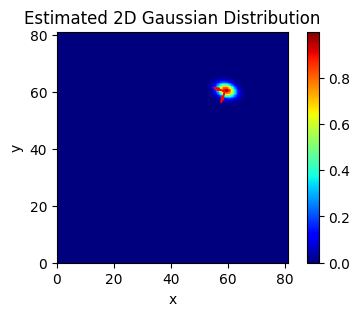

Plot of the raw data


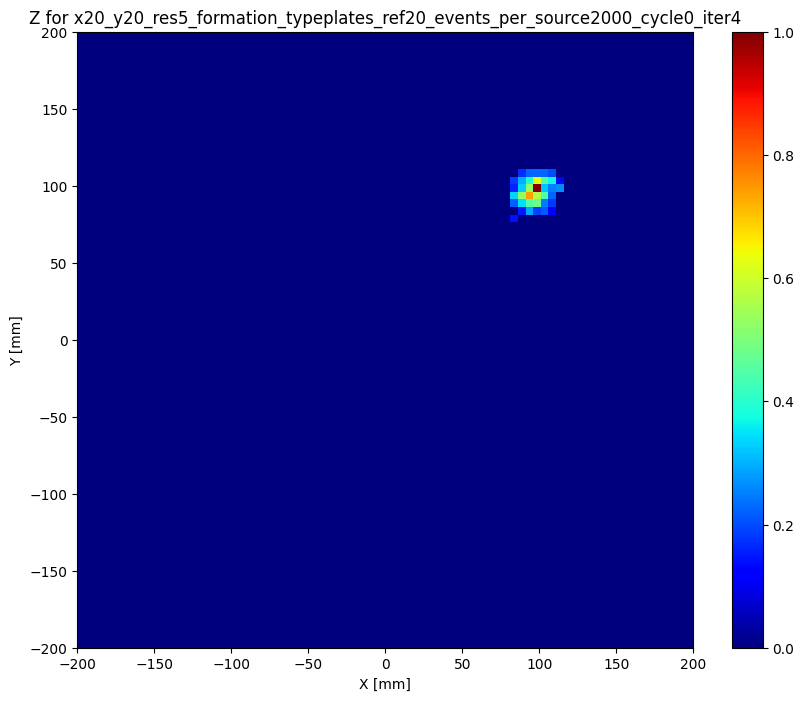

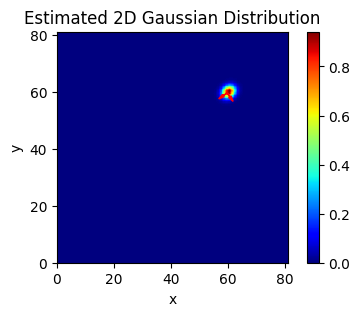

59.703061152999304 59.5394593127871 1.3460799174967084 1.6316846978011765
runs_counter =  4
iter value is  2 cycle value is  0
Plot of the raw data


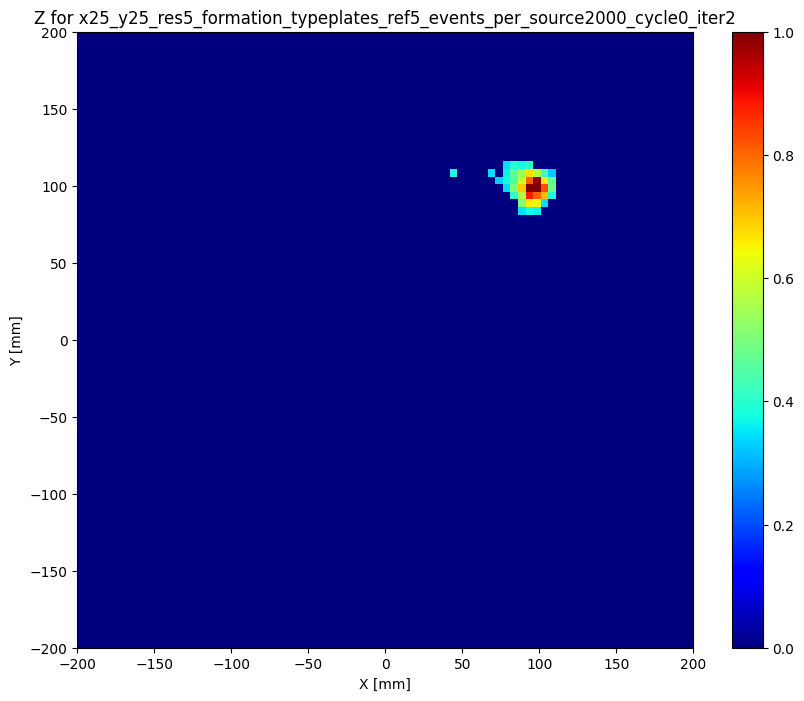

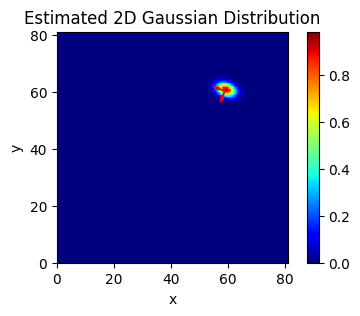

Plot of the raw data


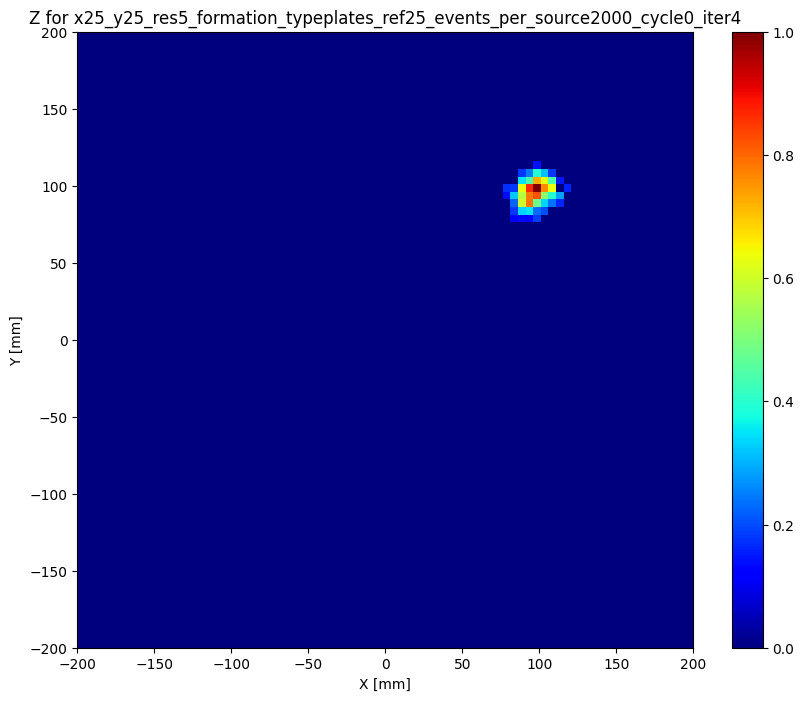

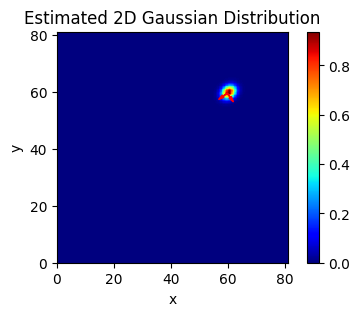

59.732359707325664 59.42250925084909 1.384490559808426 1.7556996801039455
runs_counter =  5
iter value is  4 cycle value is  1
Plot of the raw data


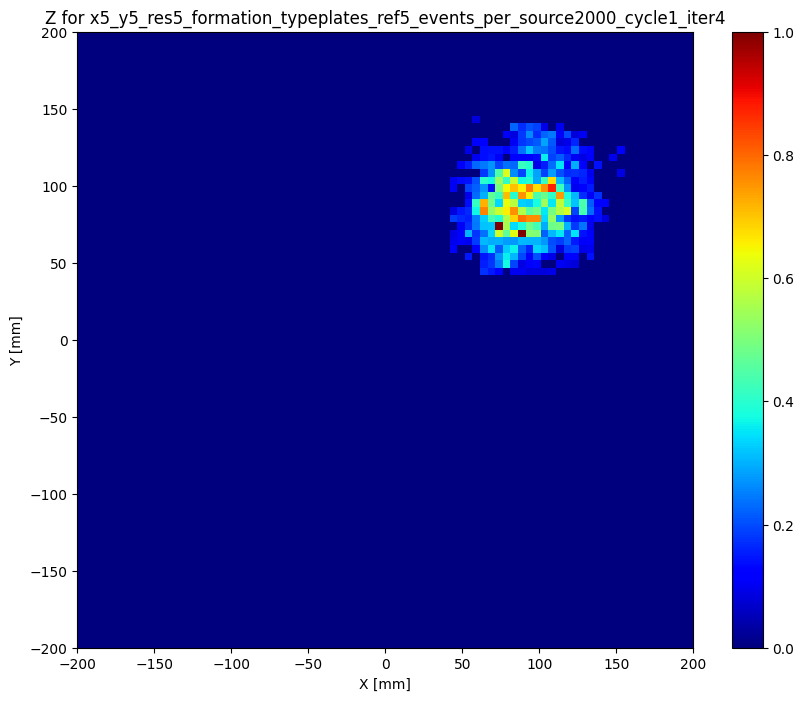

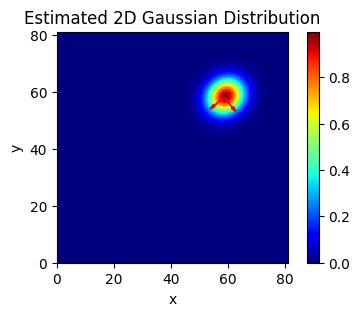

Plot of the raw data


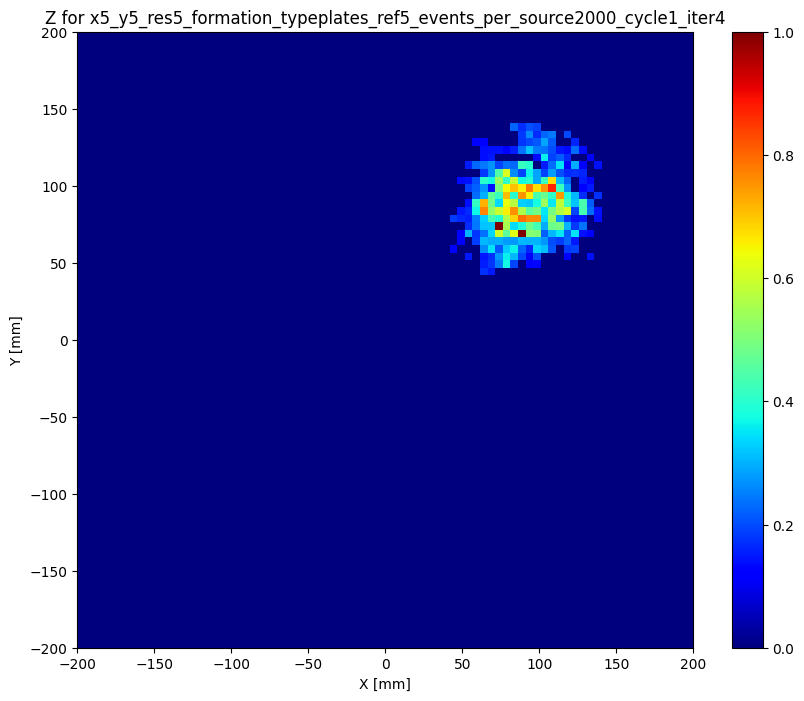

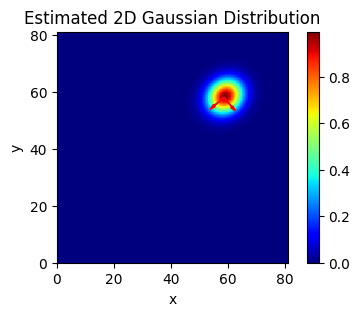

58.480092830874945 57.95124380310732 3.773186661194337 4.356853524609763
runs_counter =  6
iter value is  2 cycle value is  1
Plot of the raw data


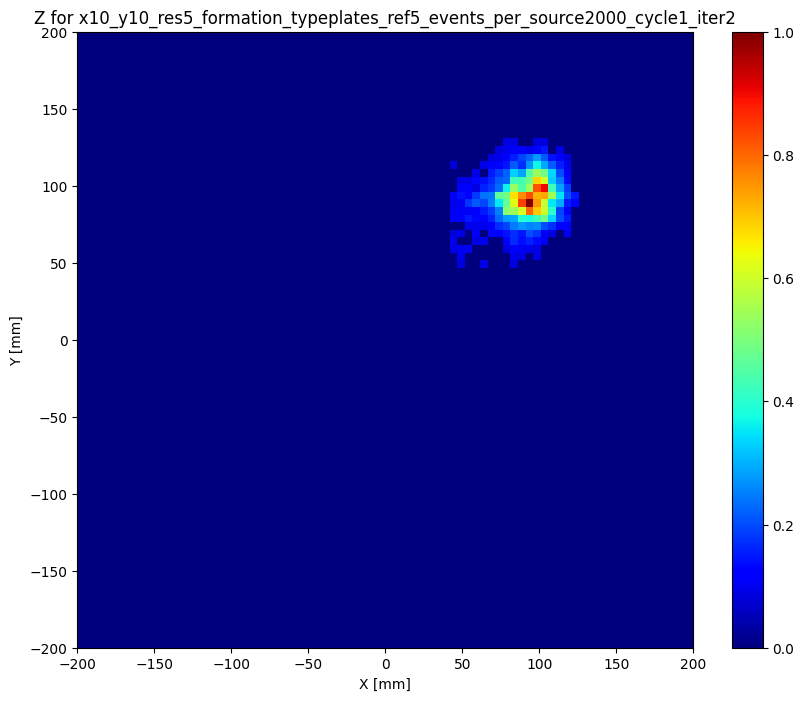

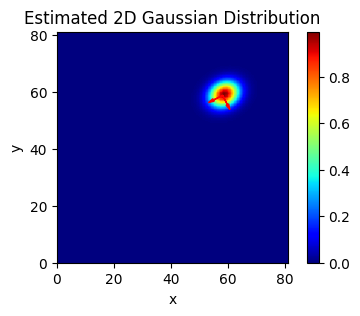

Plot of the raw data


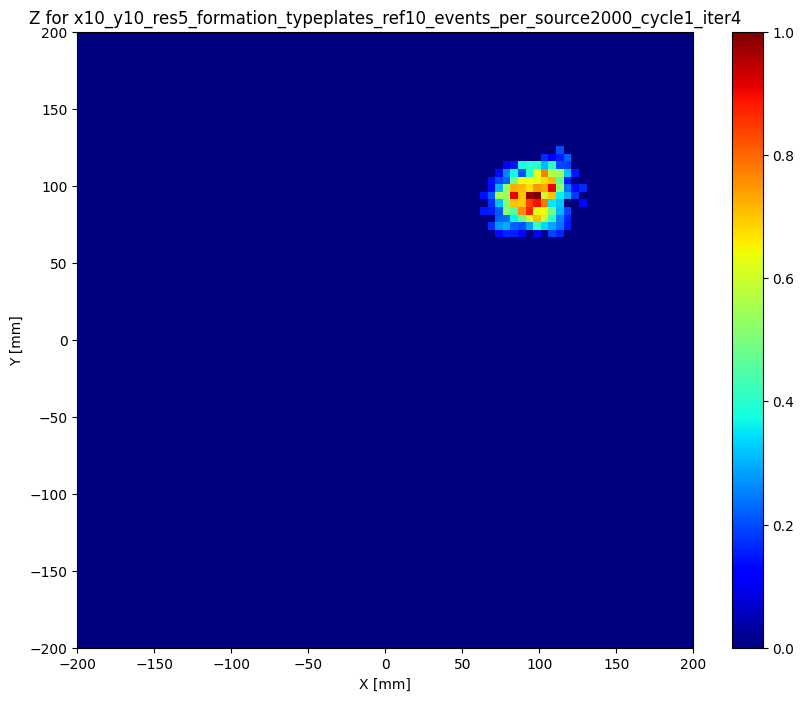

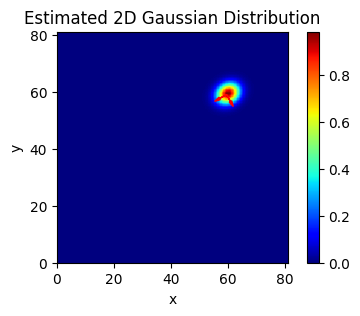

59.48464099415415 58.97266742225758 2.283356790028188 2.807893978220136
runs_counter =  7
iter value is  2 cycle value is  1
Plot of the raw data


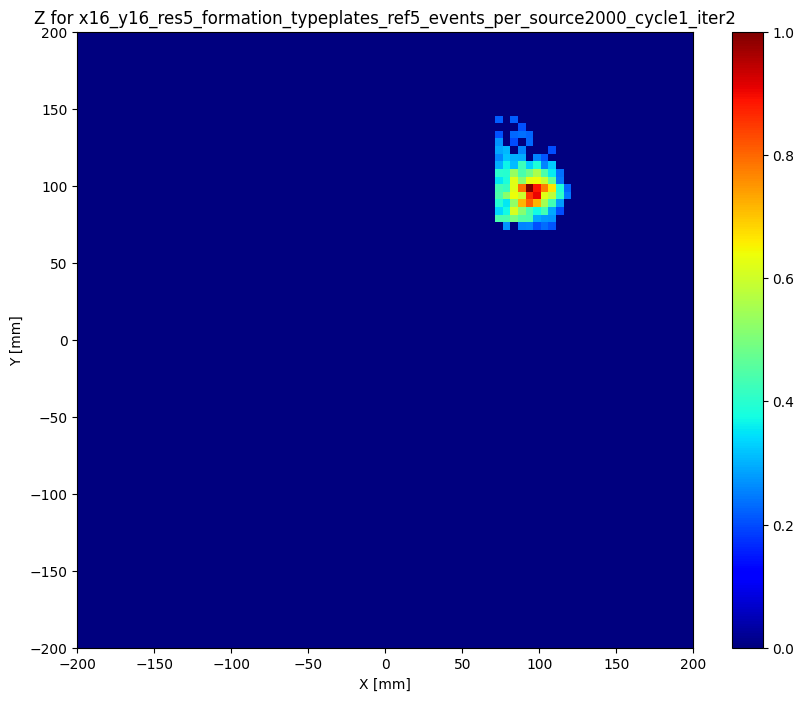

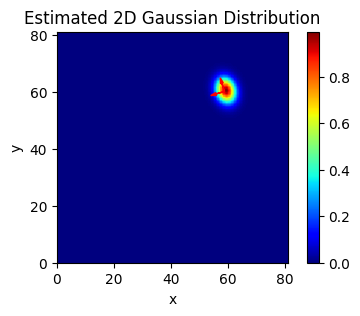

Plot of the raw data


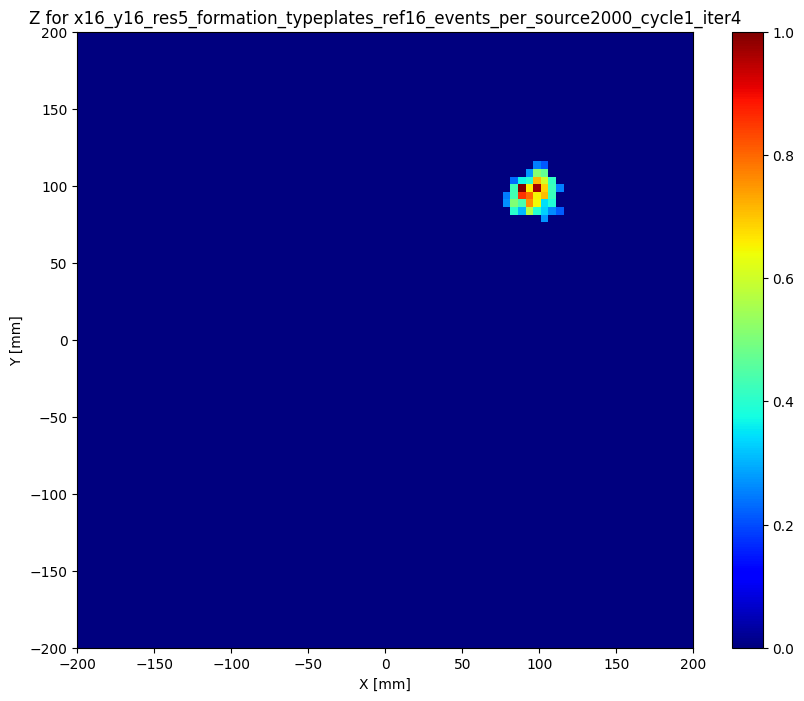

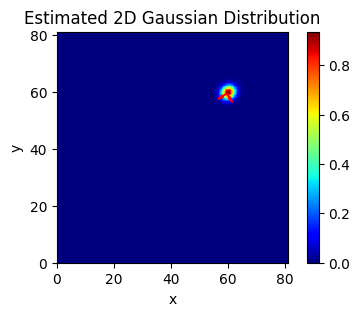

59.55021176584482 59.33569728829662 1.5177507253466918 1.7277945807925486
runs_counter =  8
iter value is  2 cycle value is  1
Plot of the raw data


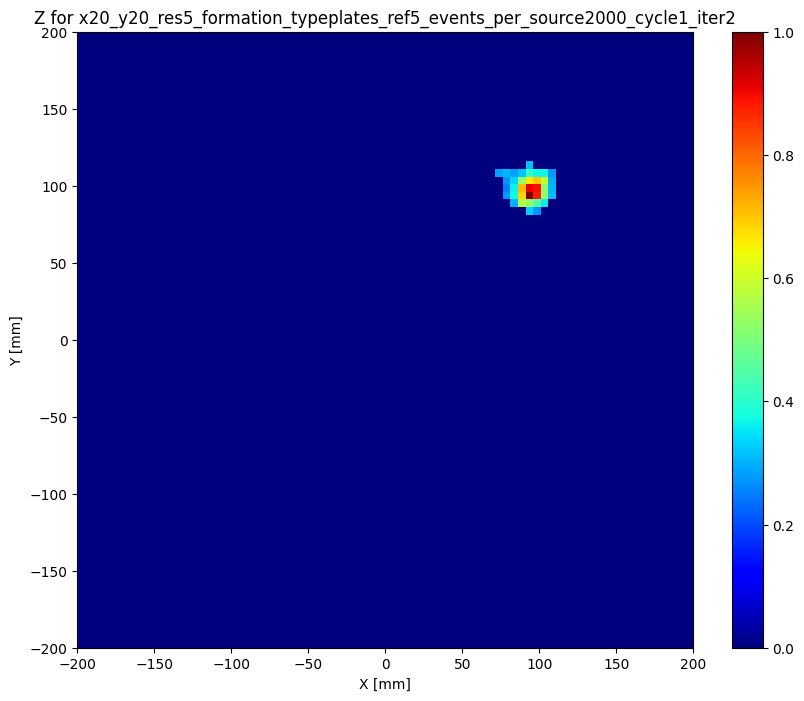

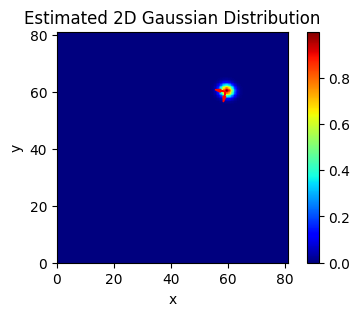

Plot of the raw data


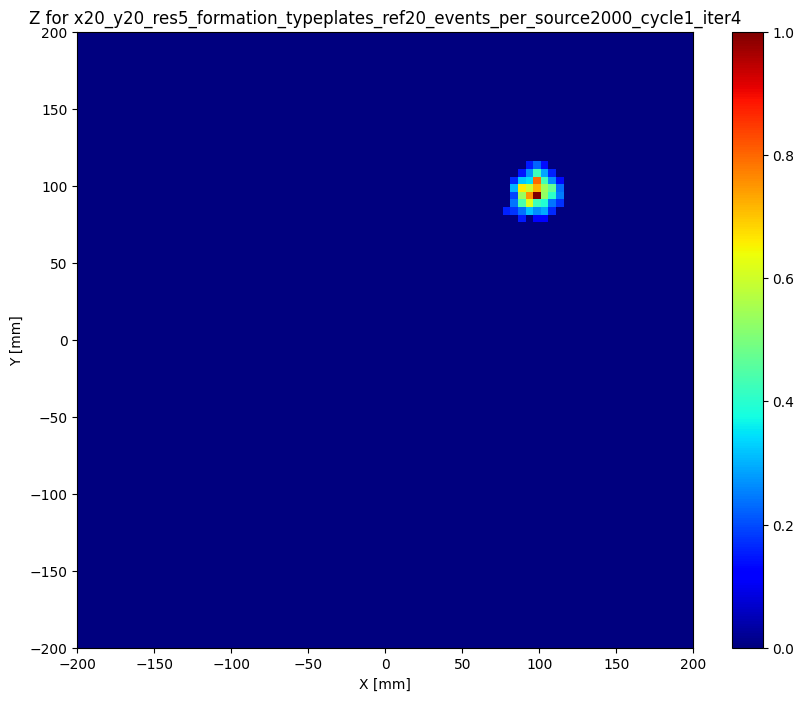

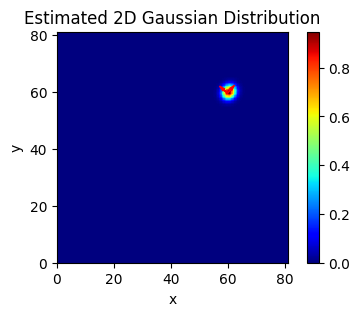

59.78906664356089 59.464158058384875 1.5215529638395815 1.7050438391204545
runs_counter =  9
iter value is  2 cycle value is  1
Plot of the raw data


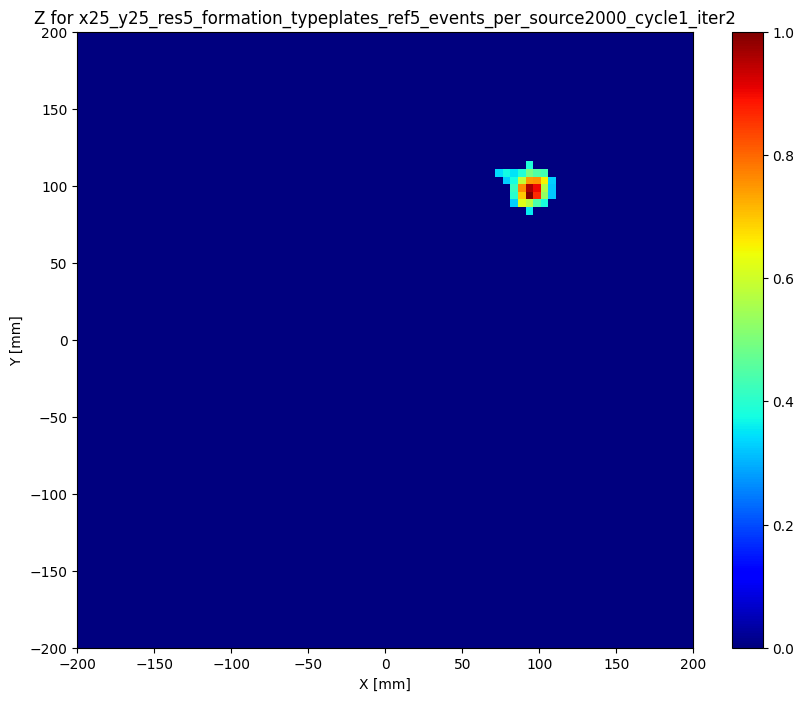

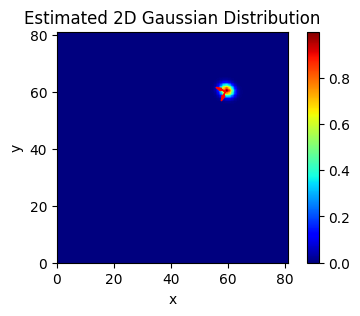

Plot of the raw data


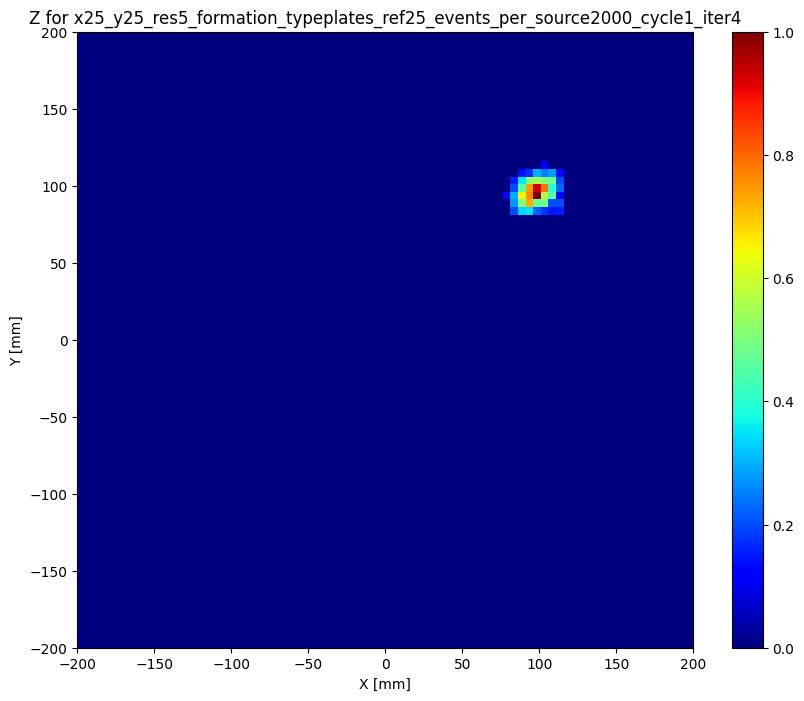

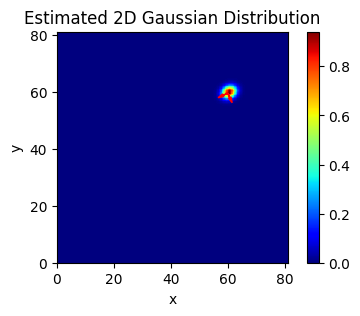

59.867320053347456 59.46083675654843 1.3697083589842902 1.7216957049277752
runs_counter =  10
iter value is  4 cycle value is  2
Plot of the raw data


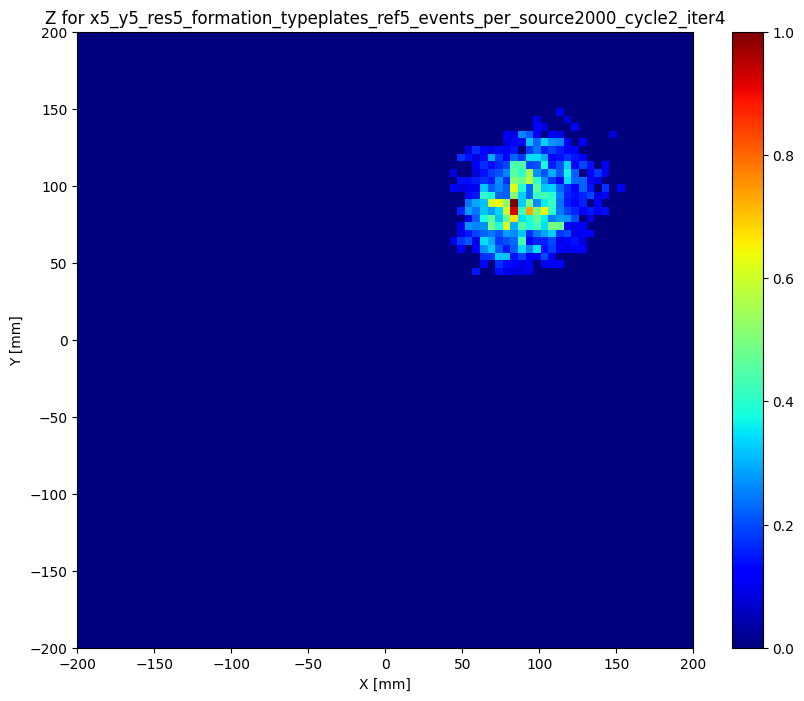

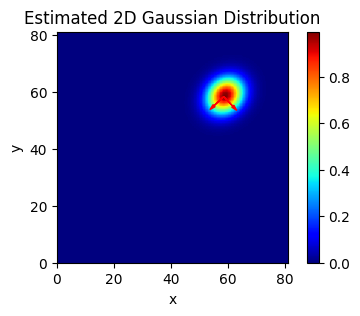

Plot of the raw data


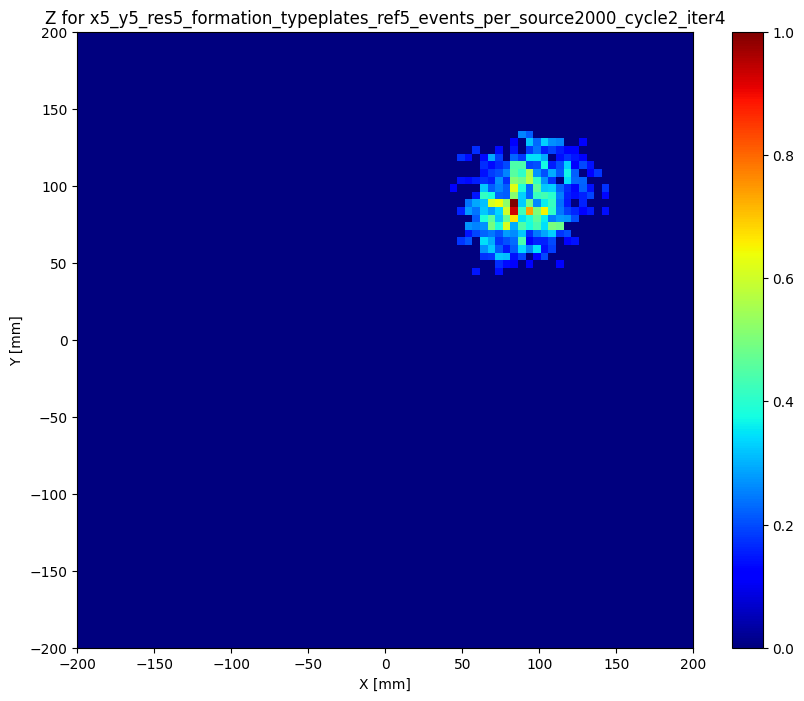

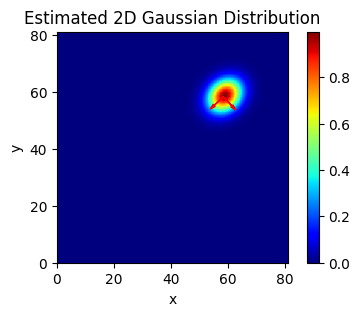

58.348069111101665 58.19504170464106 3.5253259345002963 4.3943383738417285
runs_counter =  11
iter value is  2 cycle value is  2
Plot of the raw data


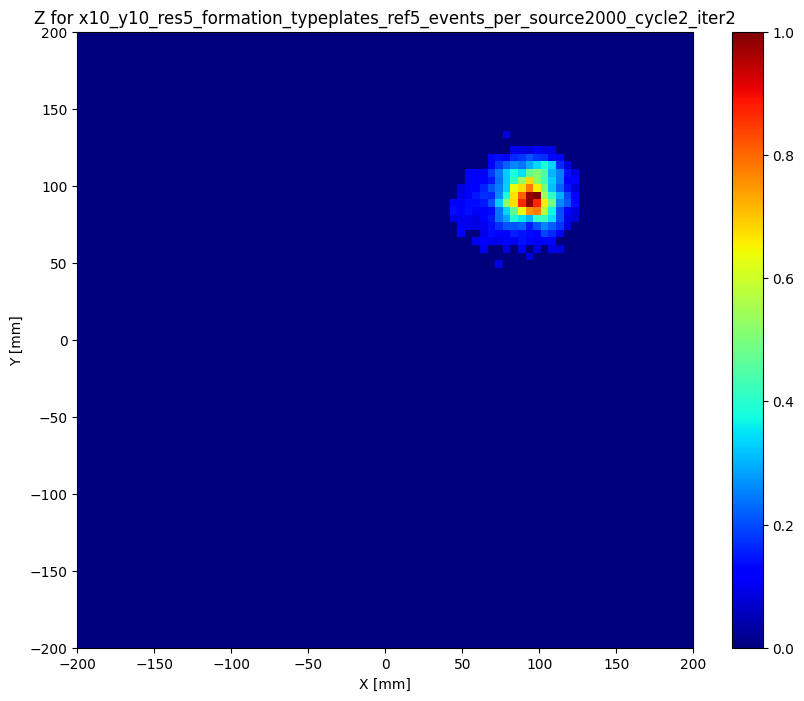

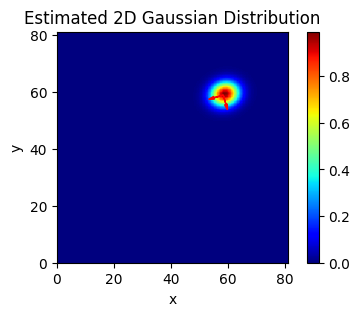

Plot of the raw data


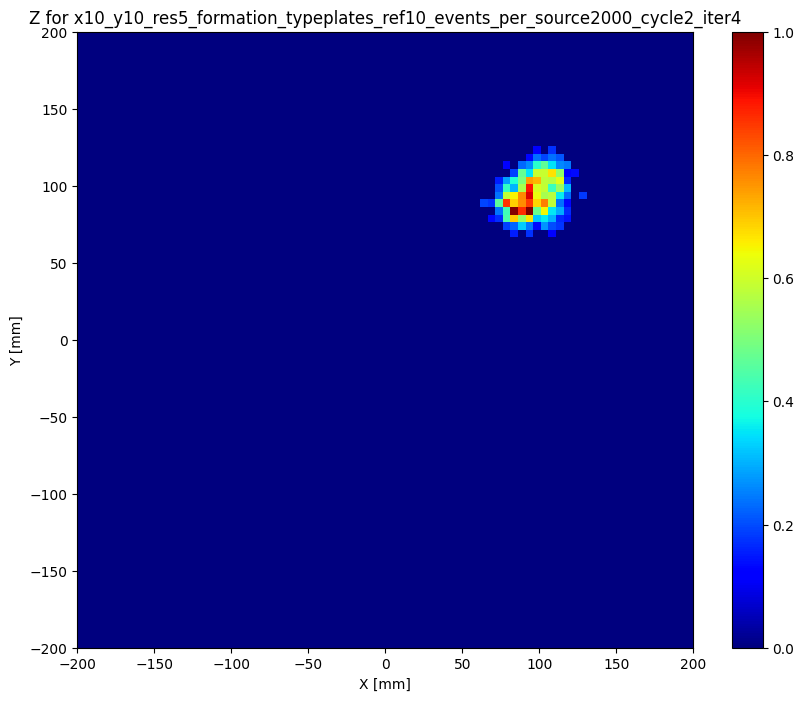

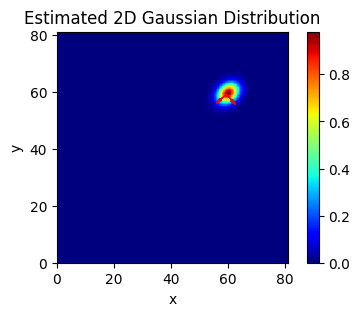

59.48680691366731 59.07280896372261 2.0885846605882876 2.7582863252731262
runs_counter =  12
iter value is  2 cycle value is  2
Plot of the raw data


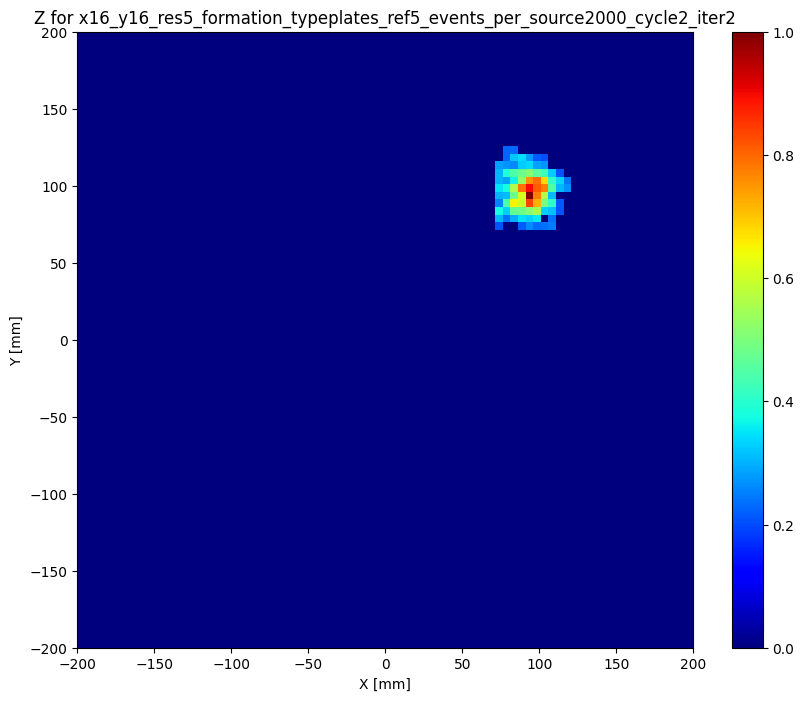

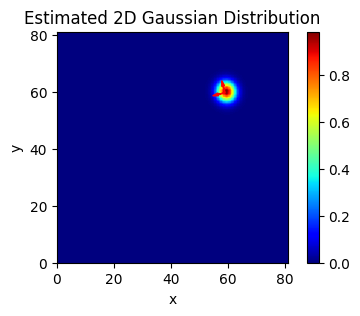

Plot of the raw data


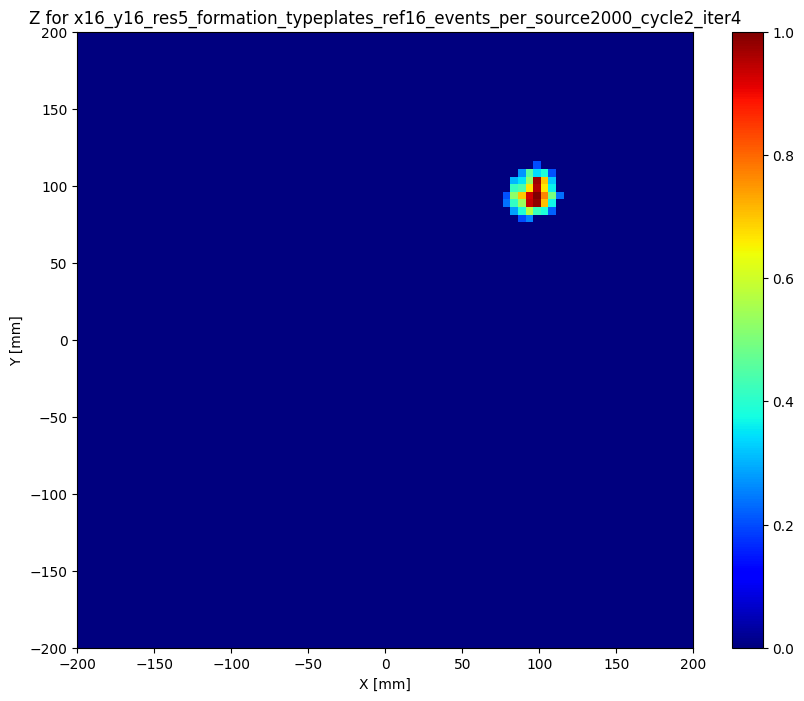

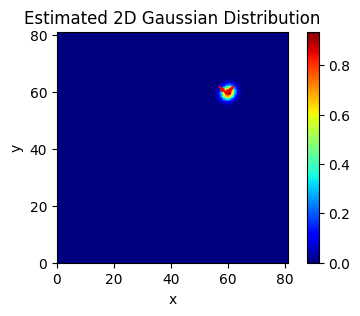

59.533999873546456 59.2736429429519 1.4635124058958817 1.6663209228096543
runs_counter =  13
iter value is  2 cycle value is  2
Plot of the raw data


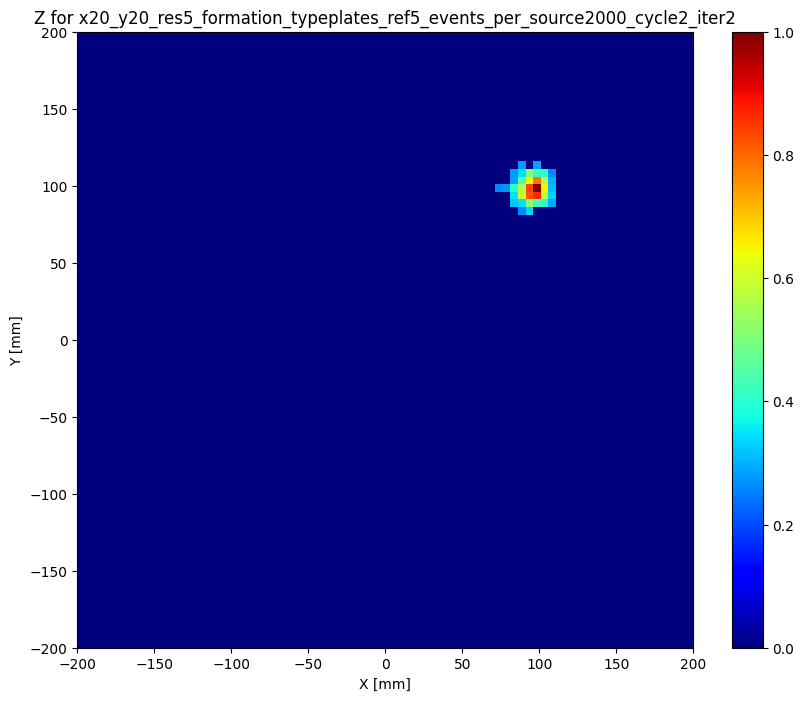

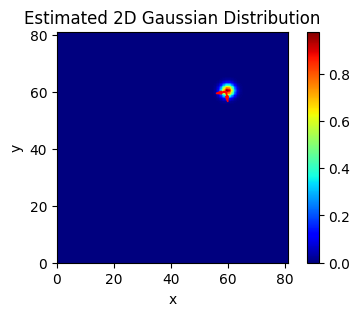

Plot of the raw data


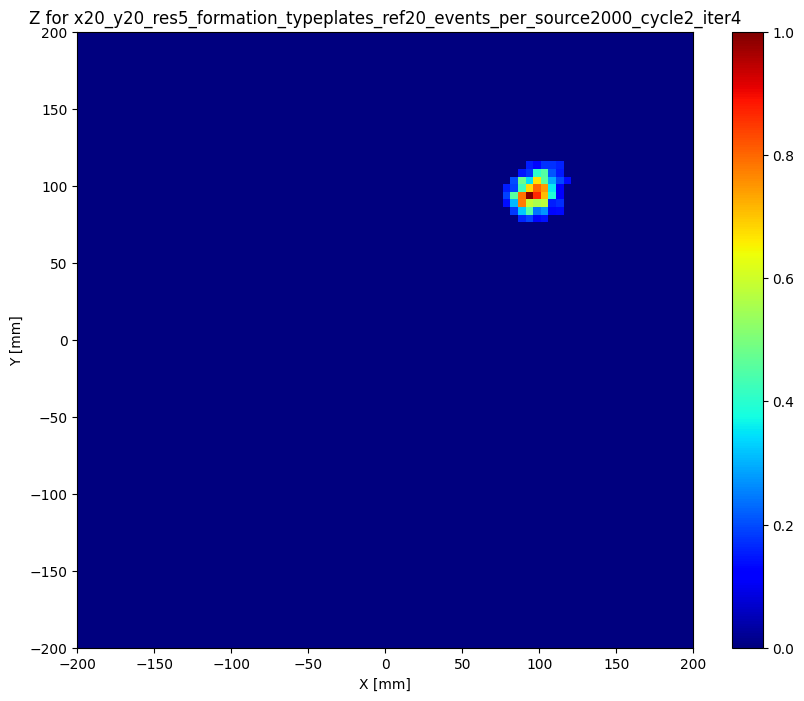

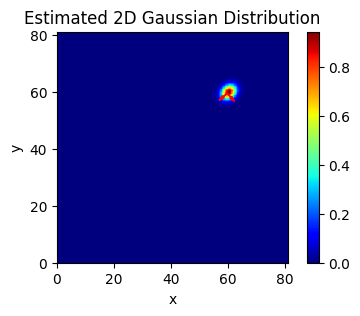

59.731581974093686 59.43697901053433 1.502422788420275 1.8985920274121708
runs_counter =  14
iter value is  2 cycle value is  2
Plot of the raw data


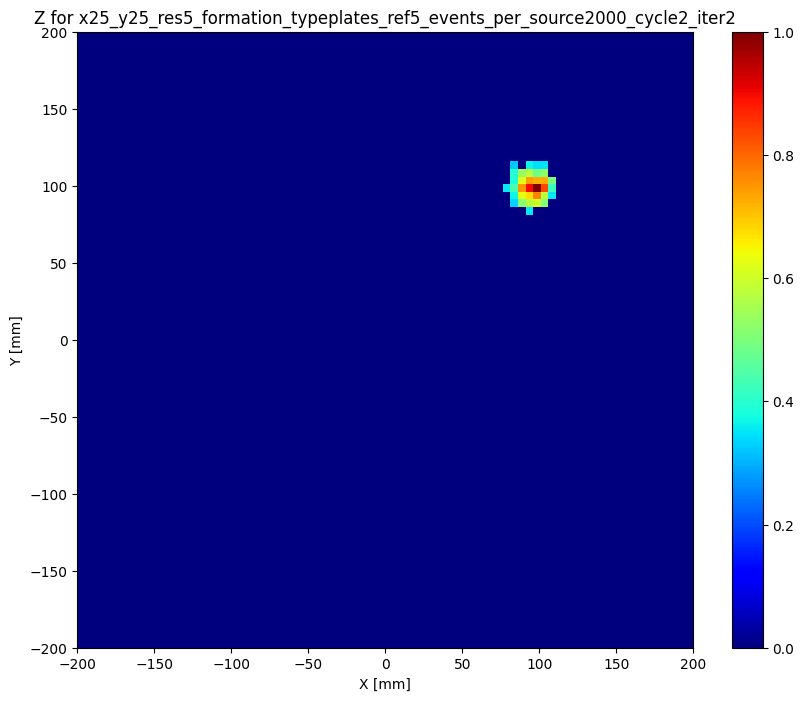

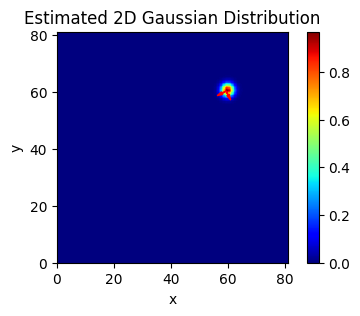

Plot of the raw data


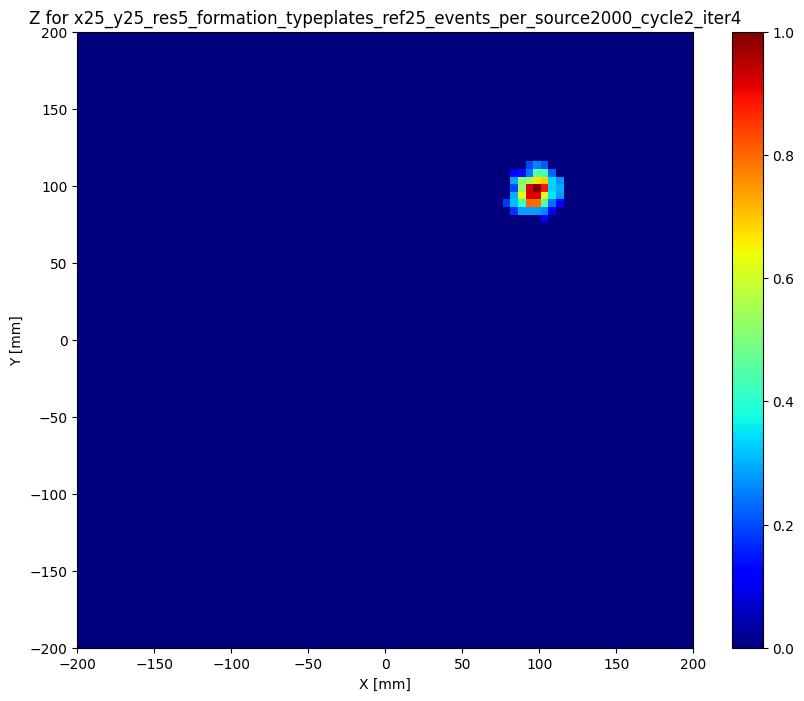

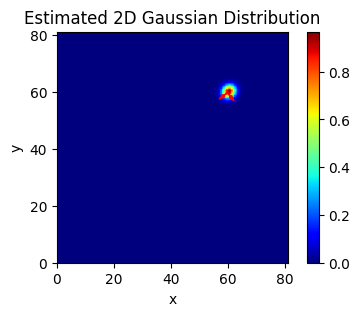

59.78221685973991 59.63578913167765 1.4813829726702716 1.667282651754488
runs_counter =  15
iter value is  4 cycle value is  3
Plot of the raw data


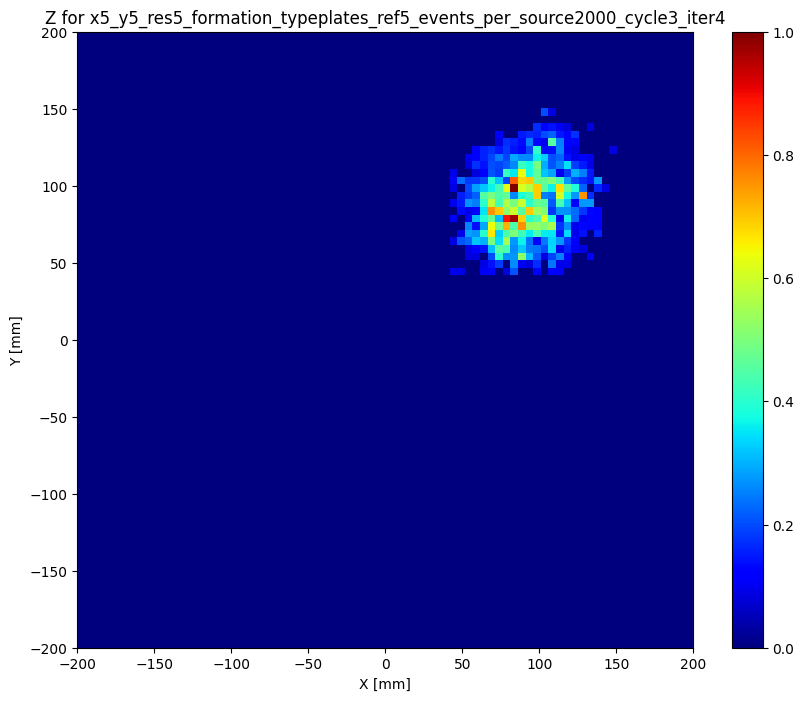

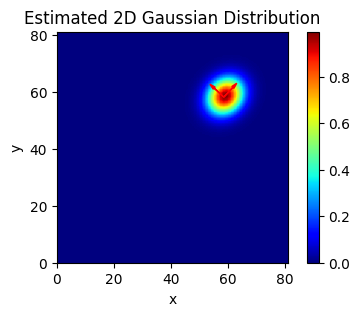

Plot of the raw data


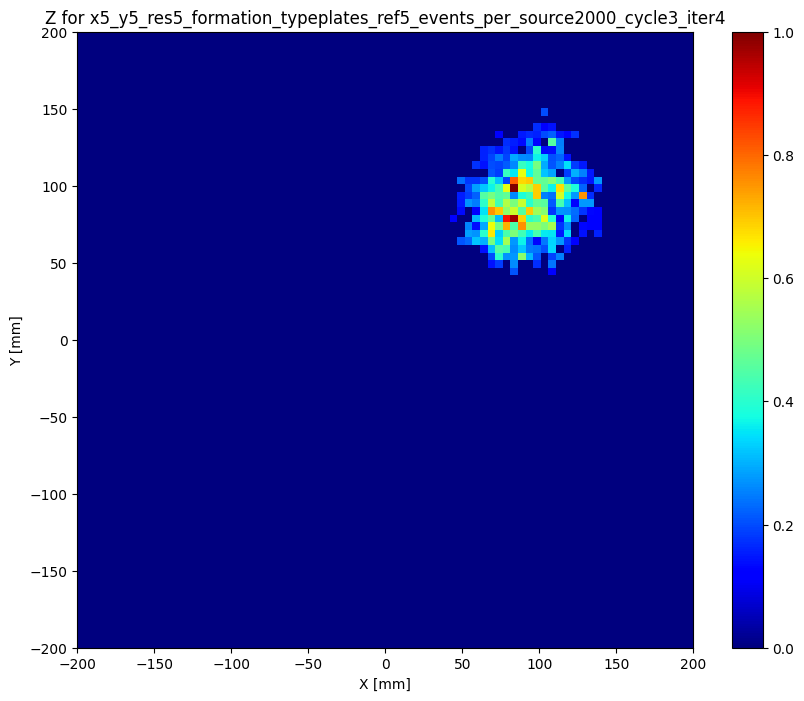

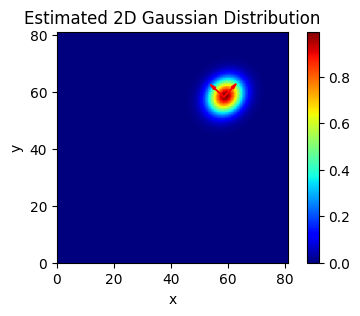

58.541960291989184 58.0955120366024 3.729433659243761 4.39191549061393
runs_counter =  16
iter value is  2 cycle value is  3
Plot of the raw data


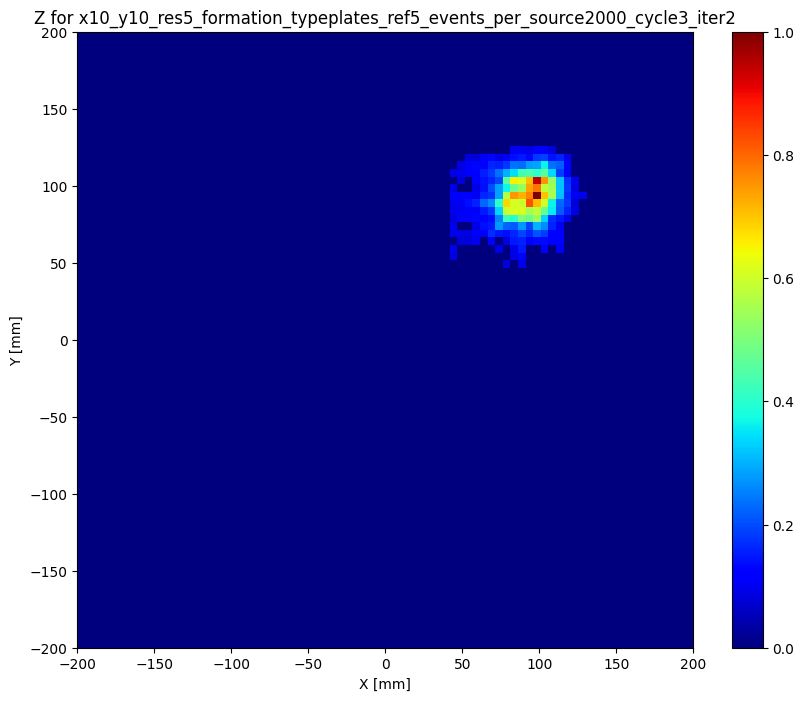

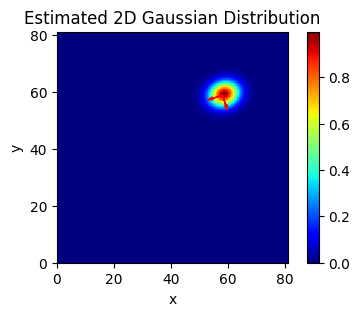

Plot of the raw data


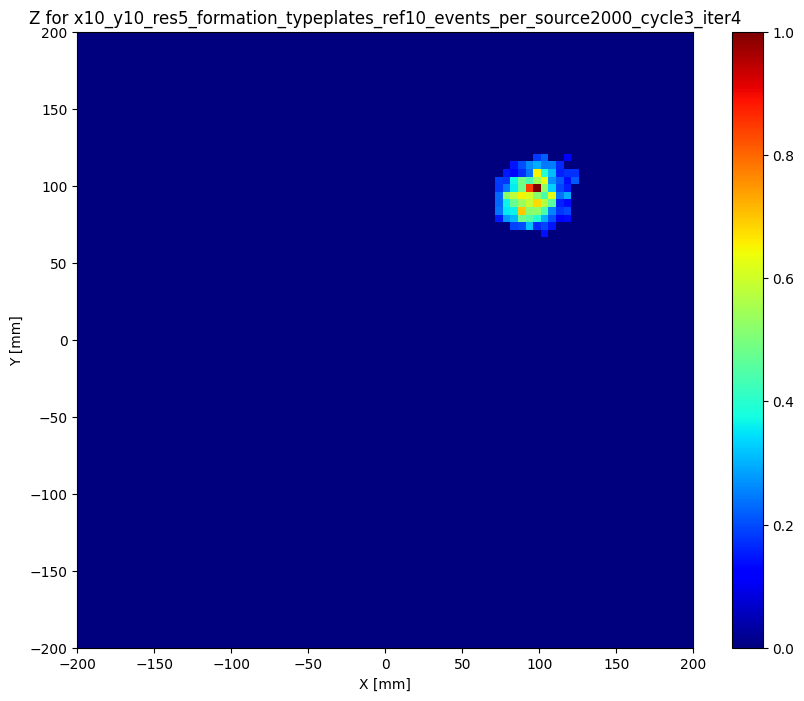

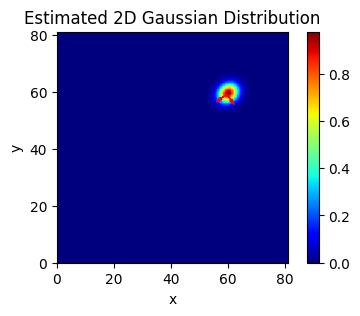

59.531198706189556 59.082509111467004 2.0860316404785597 2.488562746674891
runs_counter =  17
iter value is  2 cycle value is  3
Plot of the raw data


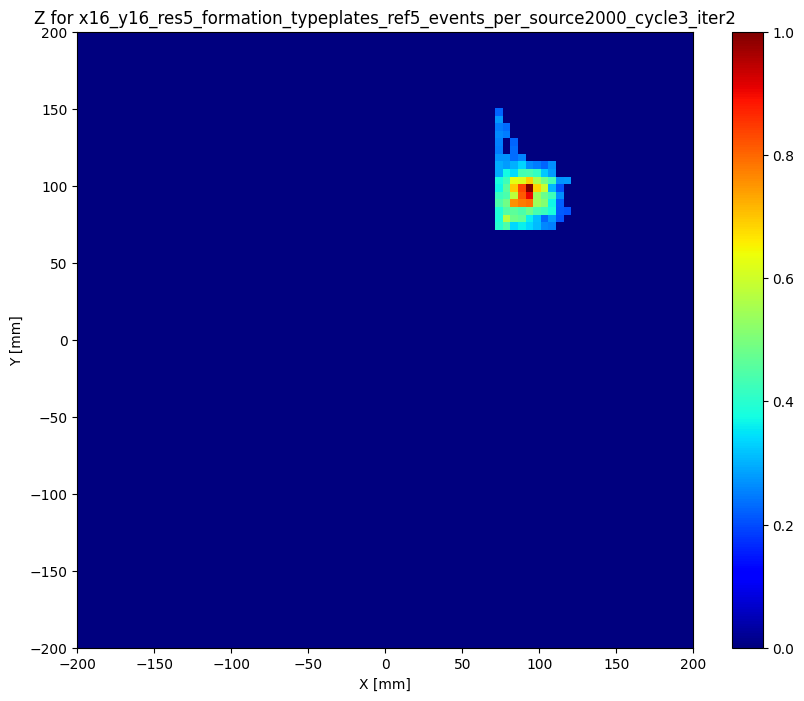

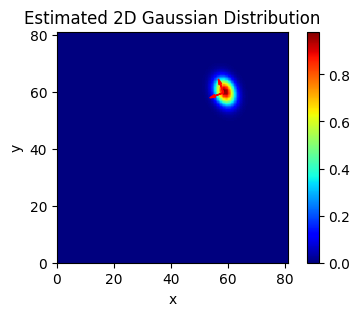

Plot of the raw data


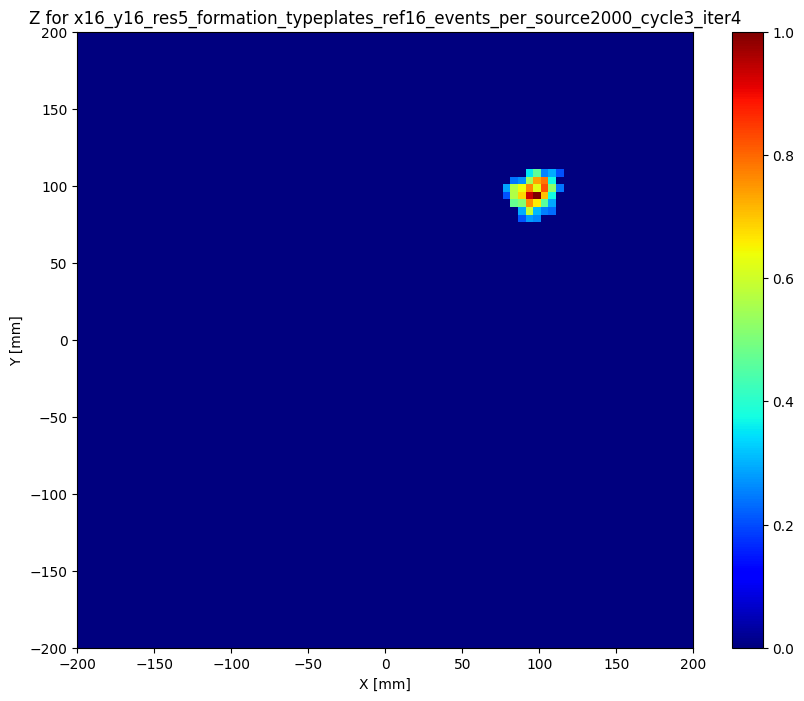

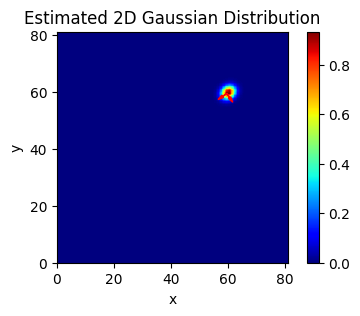

59.57102420437698 59.332491915108704 1.4340888941226042 1.7318003493304923
runs_counter =  18
iter value is  2 cycle value is  3
Plot of the raw data


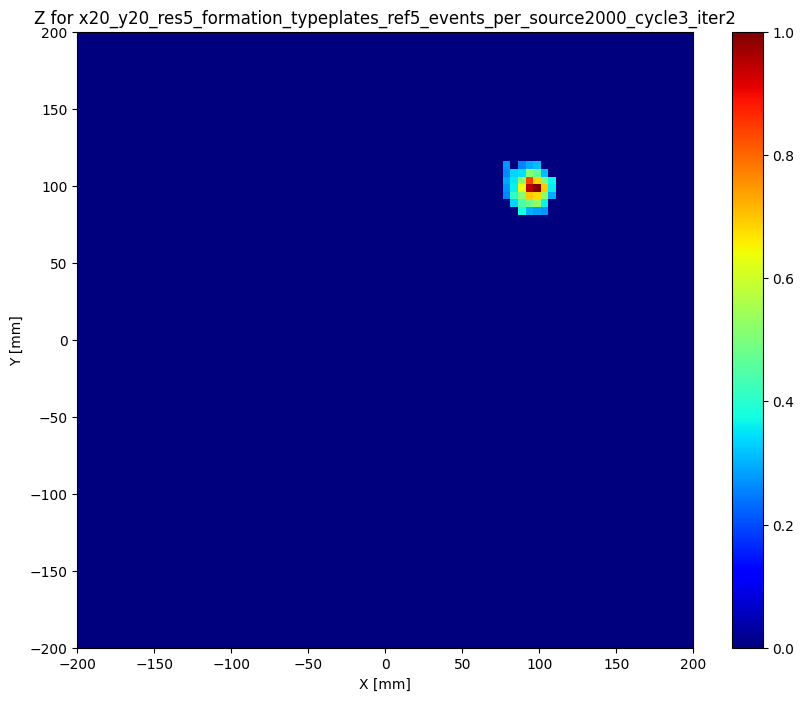

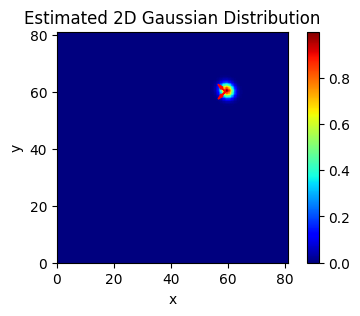

Plot of the raw data


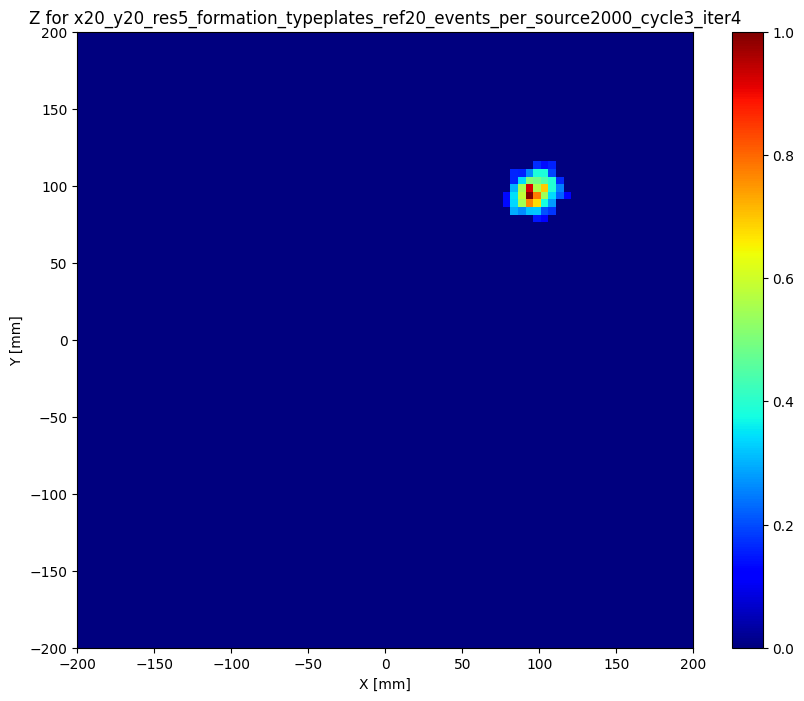

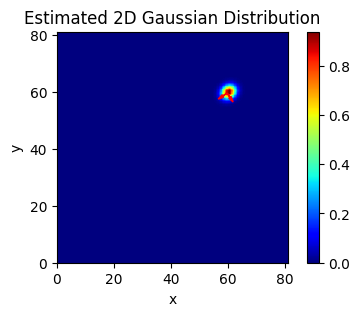

59.688048580741636 59.470986978992414 1.4883956253378317 1.7699233757171053
runs_counter =  19
iter value is  2 cycle value is  3
Plot of the raw data


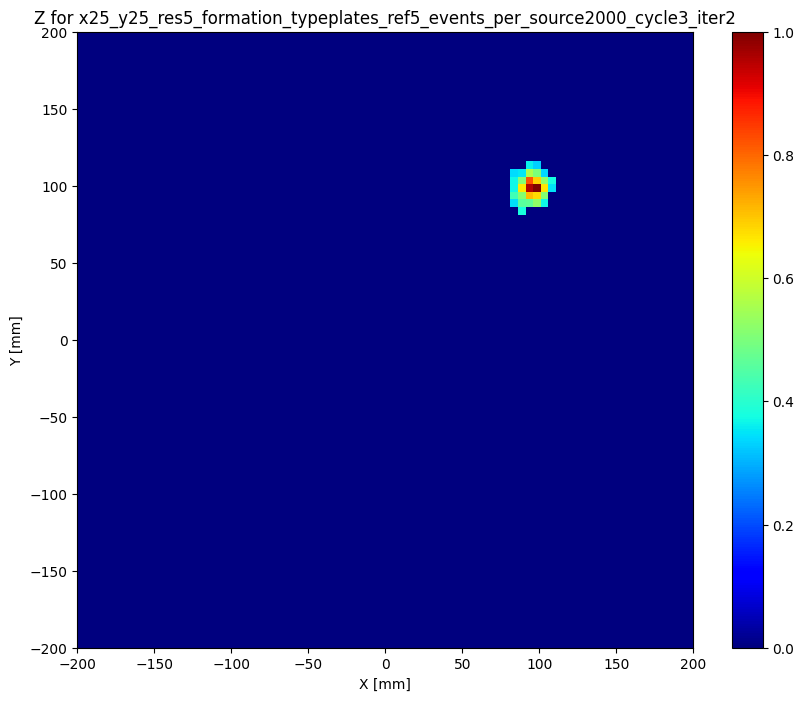

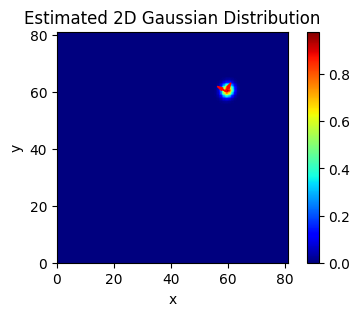

Plot of the raw data


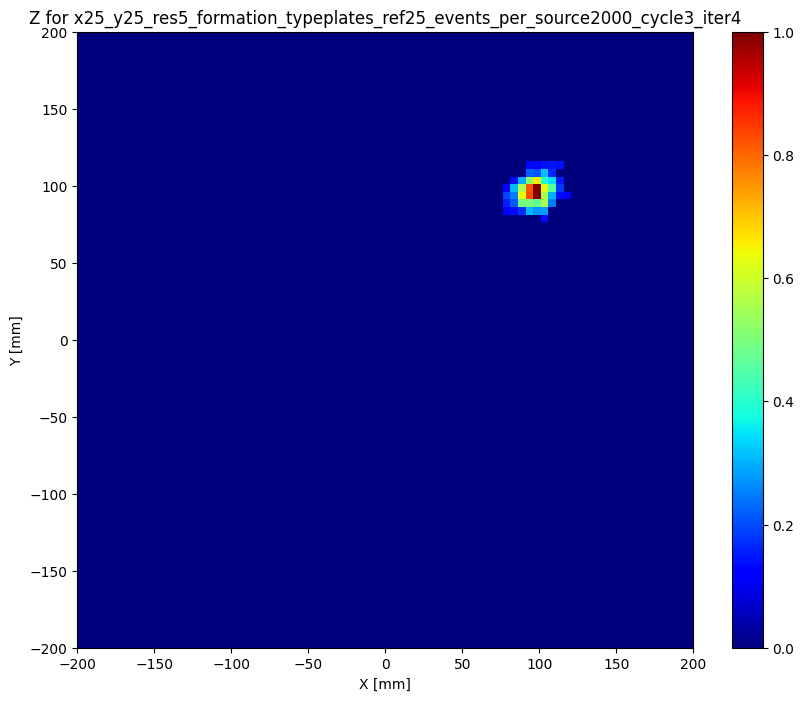

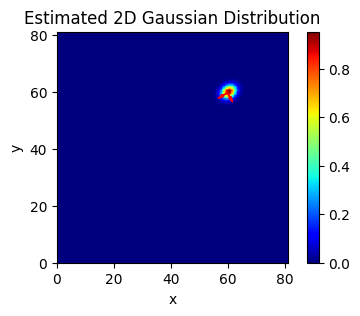

59.72277373141528 59.55152756618112 1.3980180619614628 1.7944412534369412
runs_counter =  20
iter value is  4 cycle value is  4
Plot of the raw data


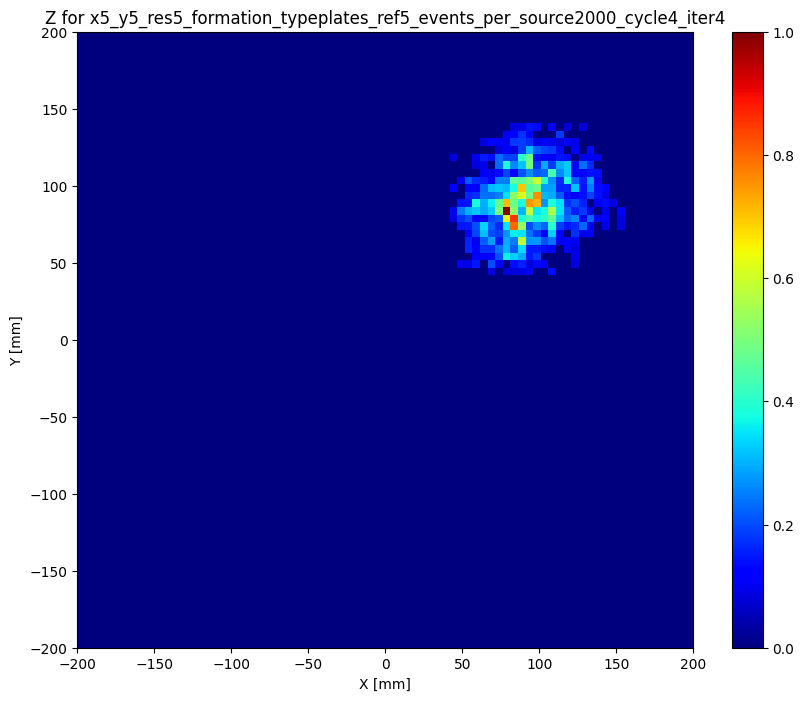

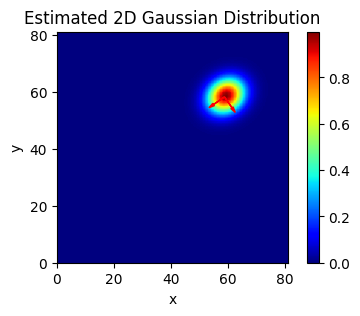

Plot of the raw data


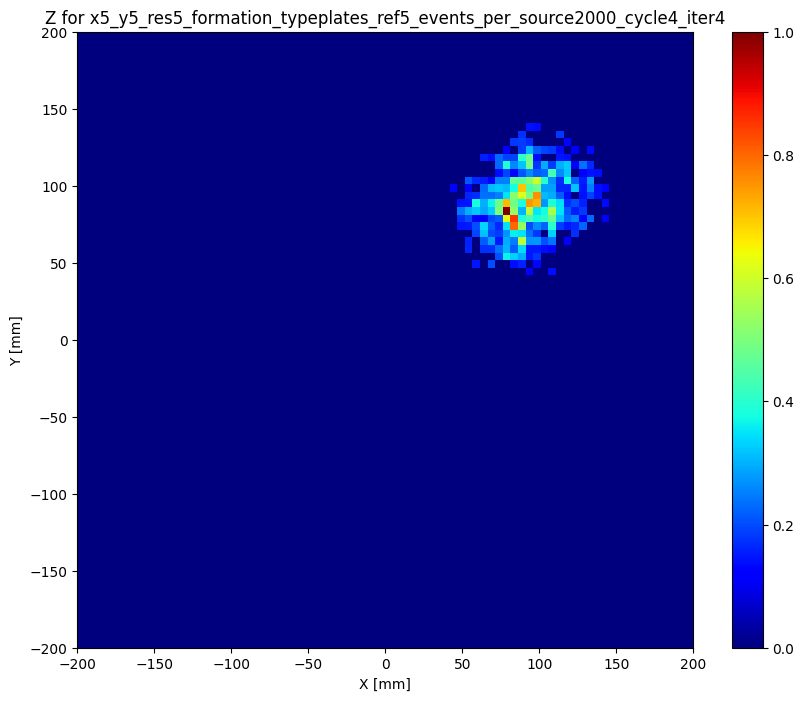

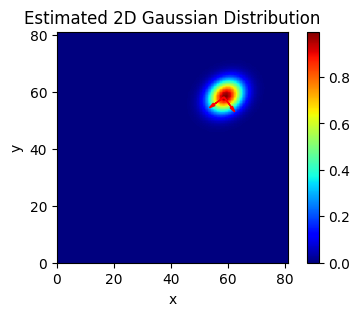

58.616068570066126 58.069974315565176 3.4552879253403375 4.343710106236012
runs_counter =  21
iter value is  2 cycle value is  4
Plot of the raw data


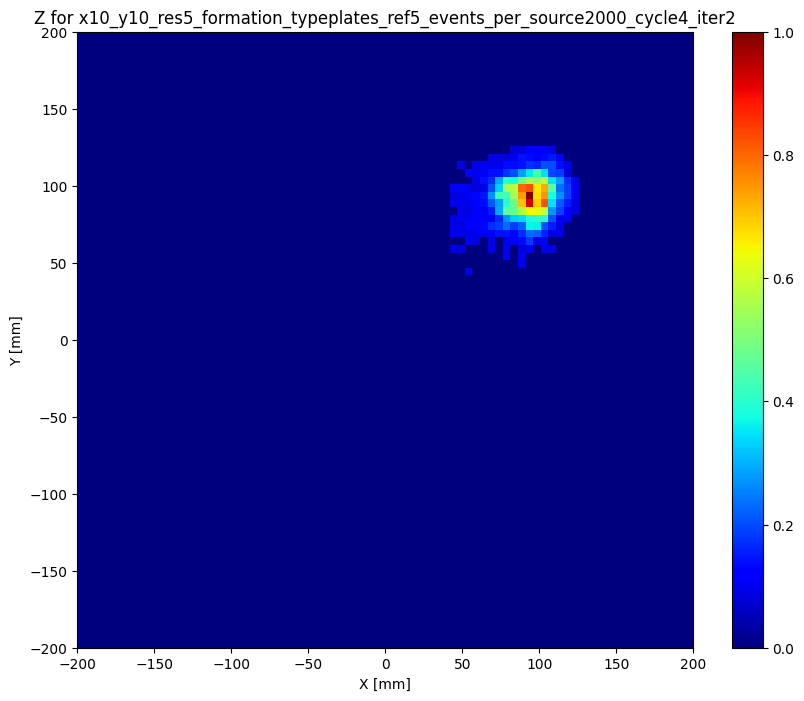

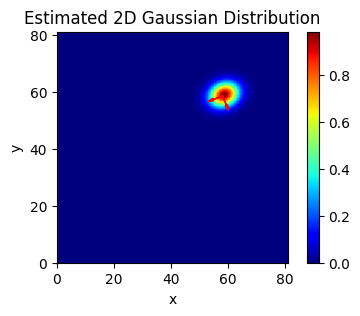

Plot of the raw data


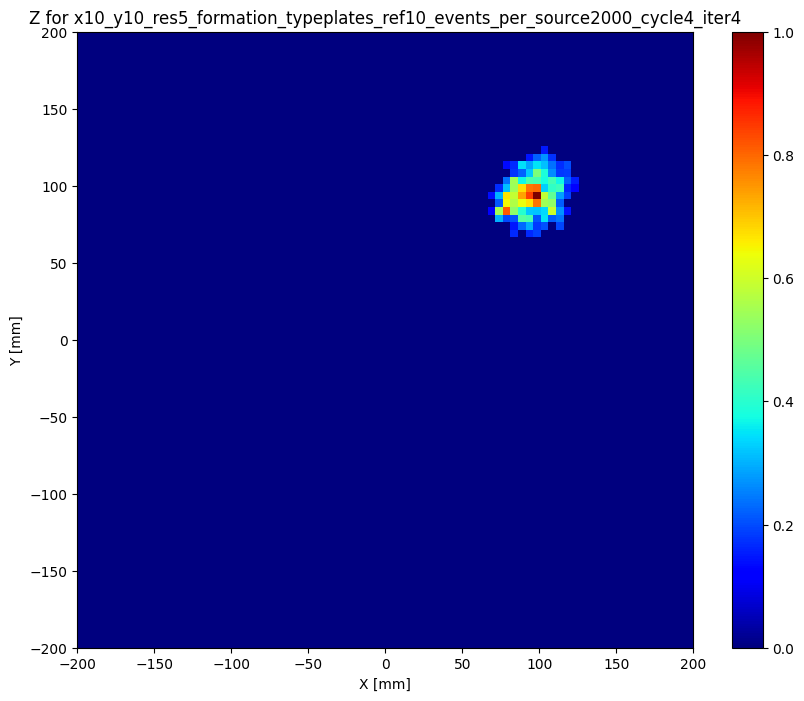

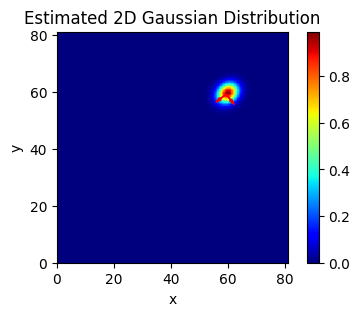

59.344472749302405 59.10178246314476 2.1230588455732473 2.6235380463465026
runs_counter =  22
iter value is  2 cycle value is  4
Plot of the raw data


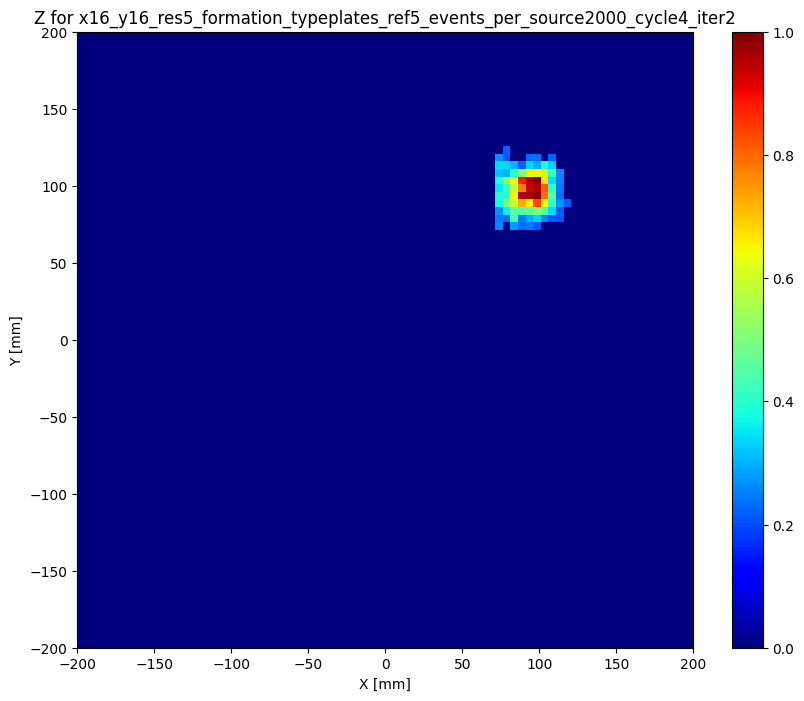

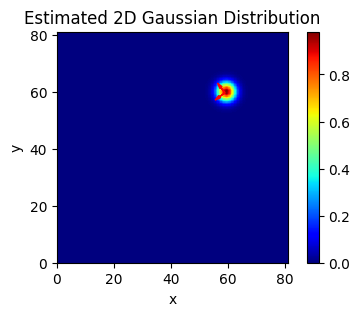

Plot of the raw data


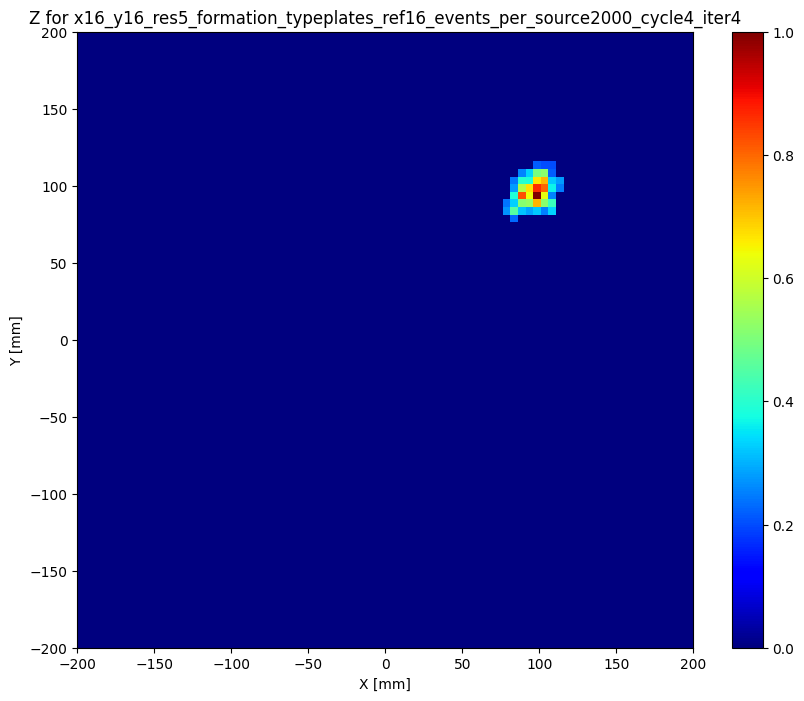

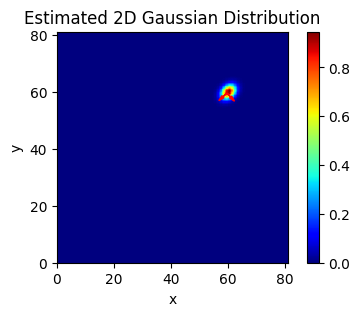

59.628321151153855 59.49605431983047 1.4131043735056825 1.9128577207311632
runs_counter =  23
iter value is  2 cycle value is  4
Plot of the raw data


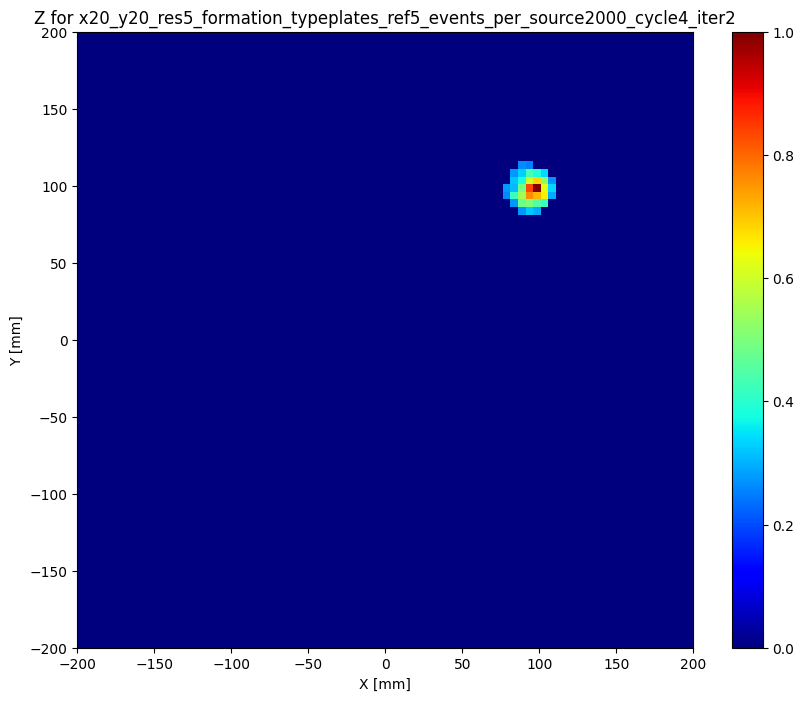

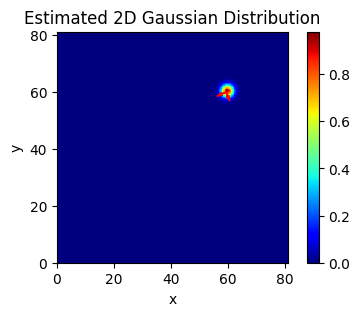

Plot of the raw data


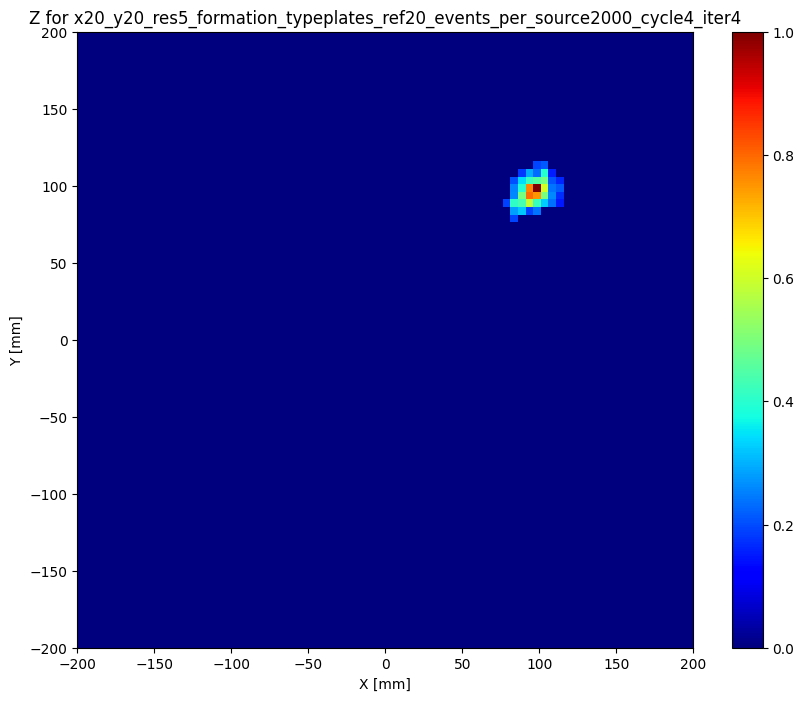

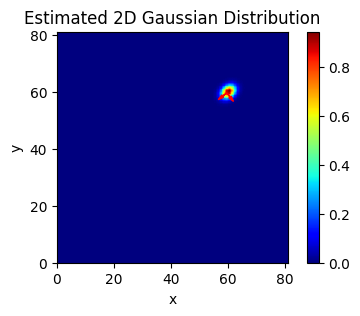

59.578405629067646 59.54951604370362 1.345990664345313 1.810387773198042
runs_counter =  24
iter value is  2 cycle value is  4
Plot of the raw data


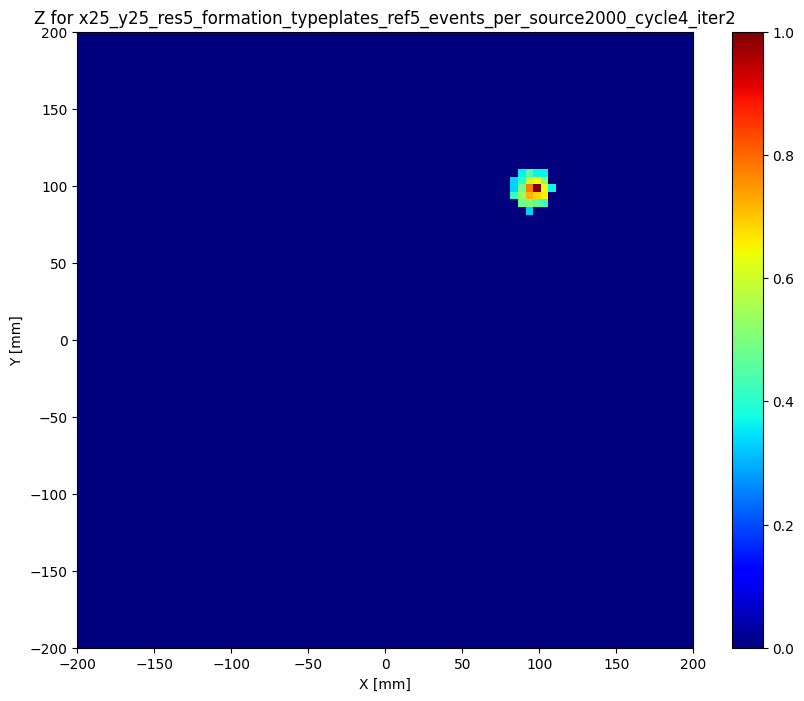

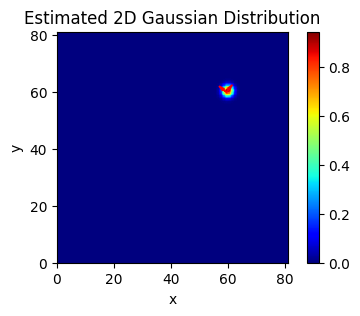

Plot of the raw data


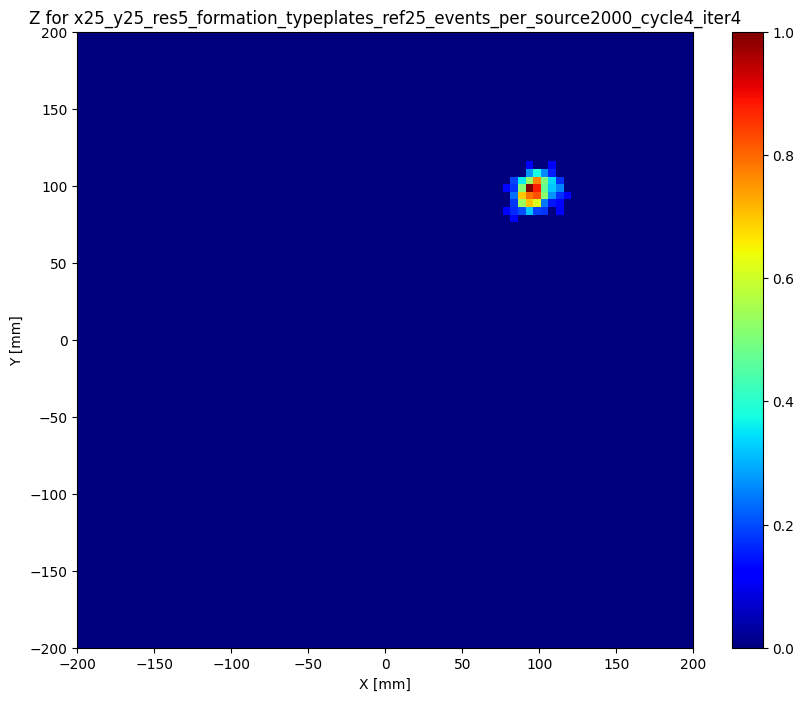

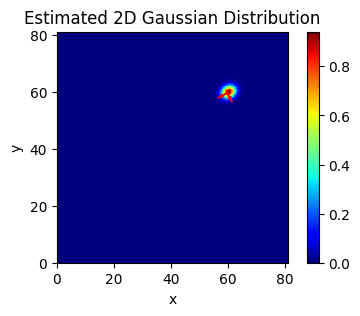

59.6991129487994 59.521906854388725 1.3775267564810876 1.7310575252114875
runs_counter =  25
iter value is  4 cycle value is  5
Plot of the raw data


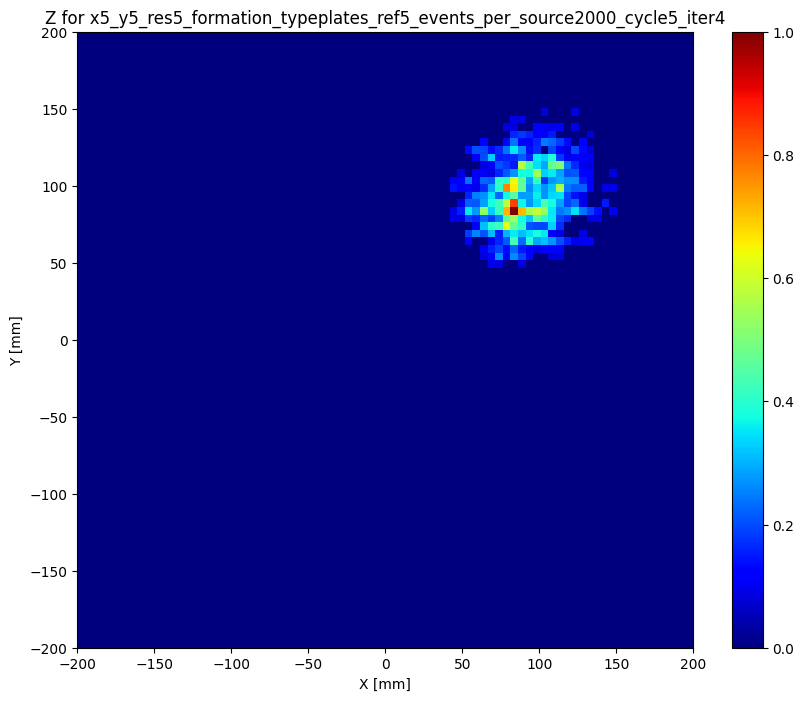

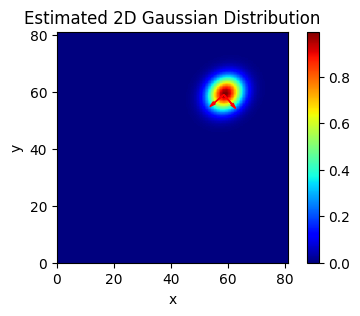

Plot of the raw data


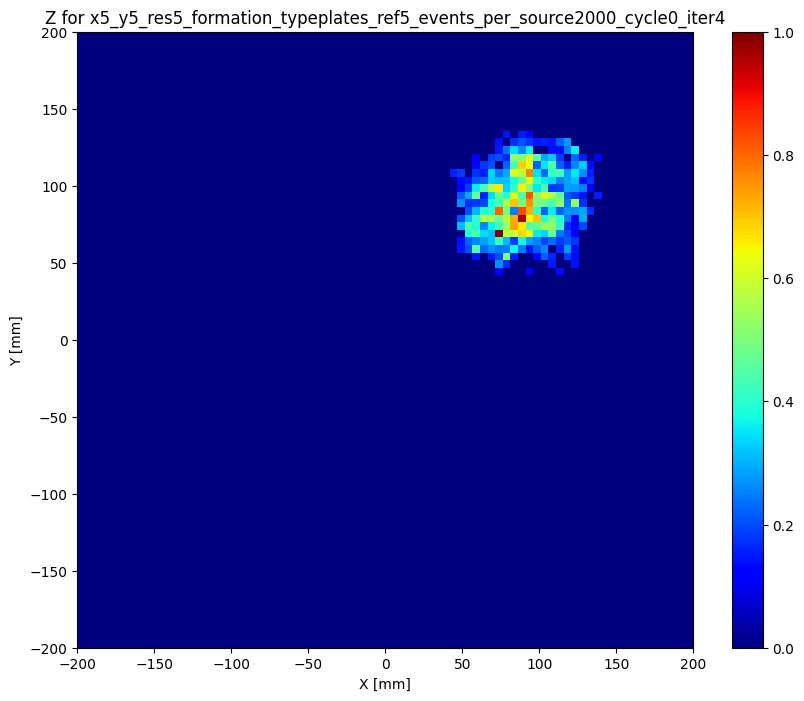

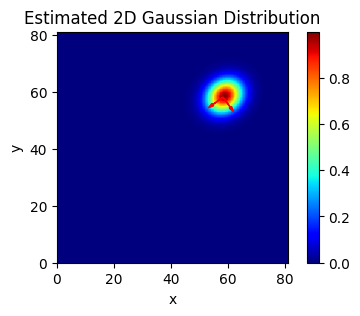

58.24771584445829 58.055504191125785 3.6761272855786604 4.403946681573374
runs_counter =  26
iter value is  2 cycle value is  5
Plot of the raw data


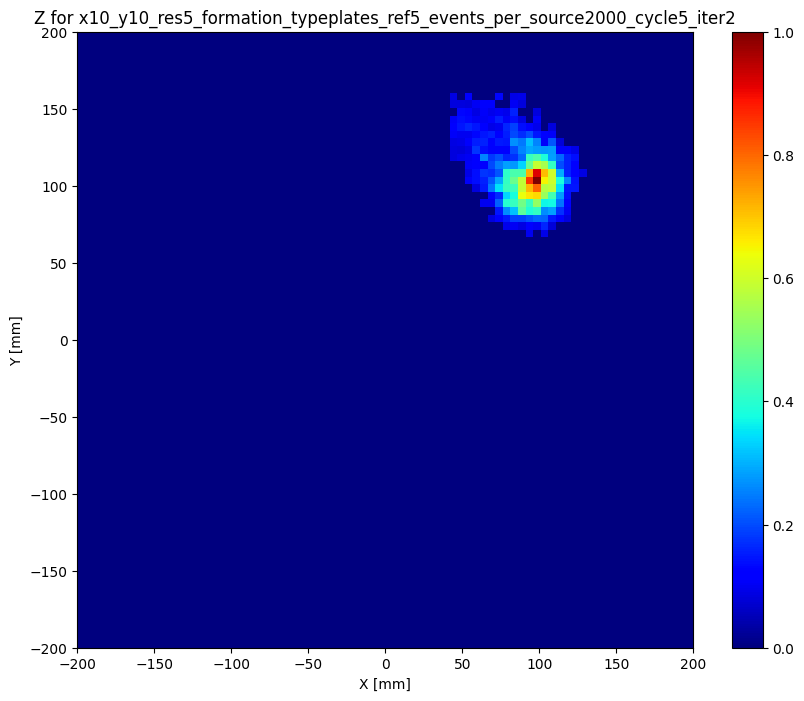

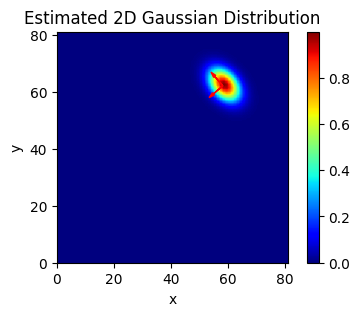

Plot of the raw data


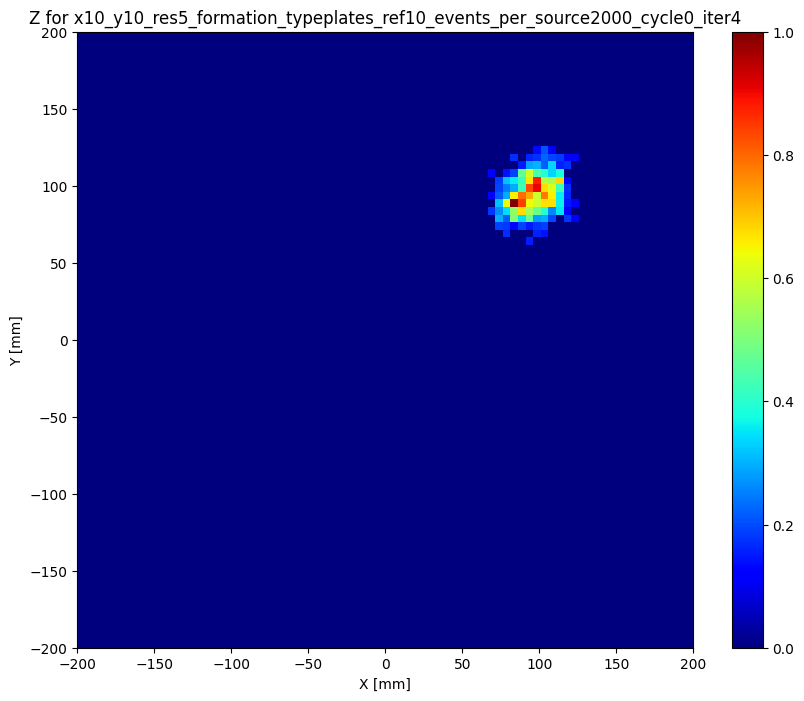

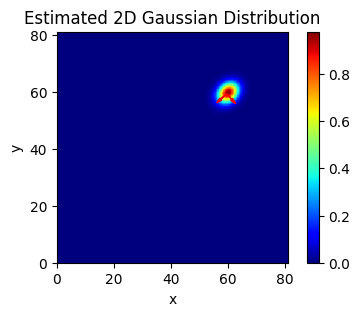

59.49505974402347 59.23275438945827 2.1233311532131003 2.72046503416681
runs_counter =  27
iter value is  2 cycle value is  0
Plot of the raw data


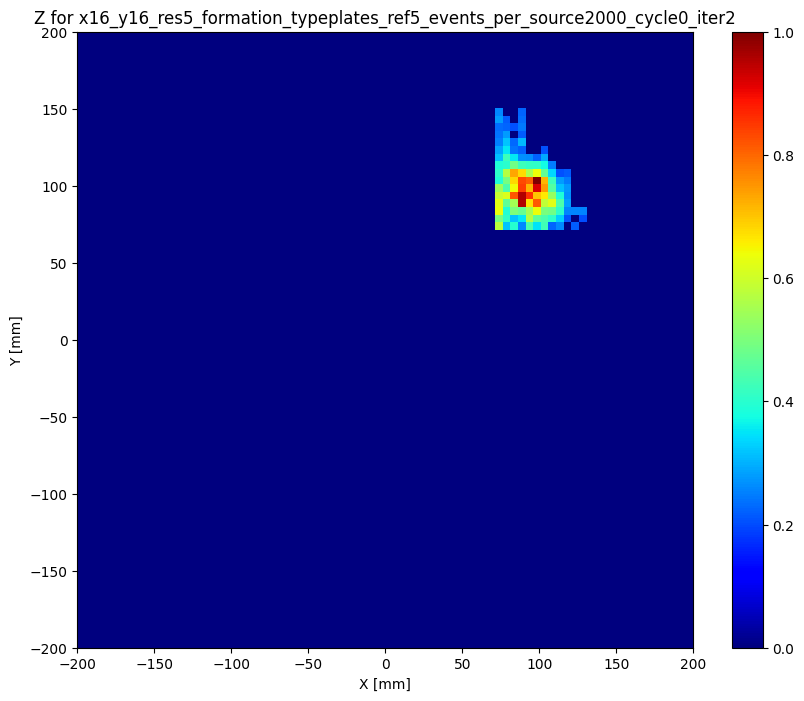

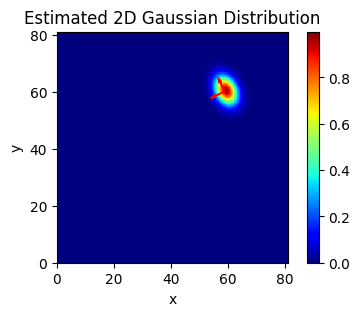

Plot of the raw data


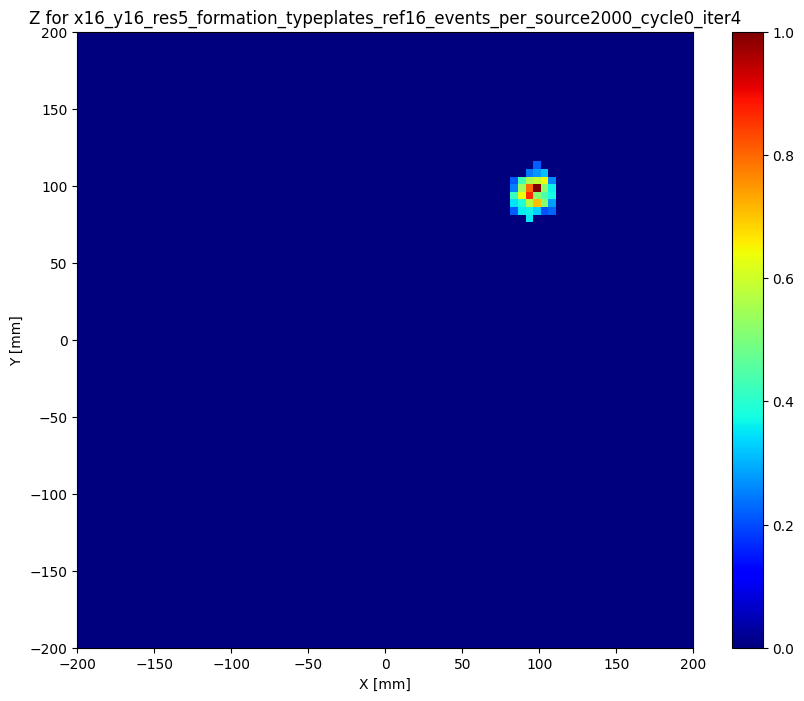

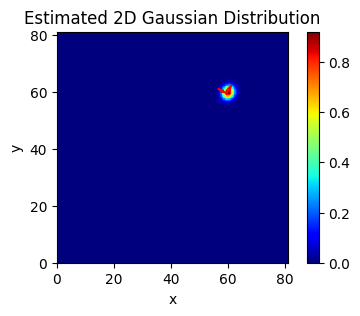

59.53190802888422 59.32481888705537 1.385104221255768 1.585022684576885
runs_counter =  28
iter value is  2 cycle value is  5
Plot of the raw data


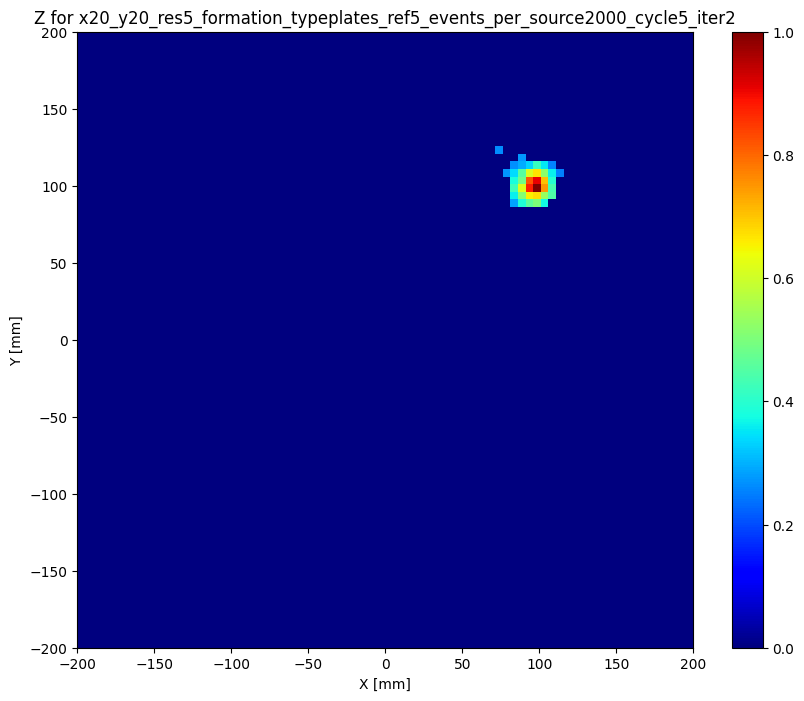

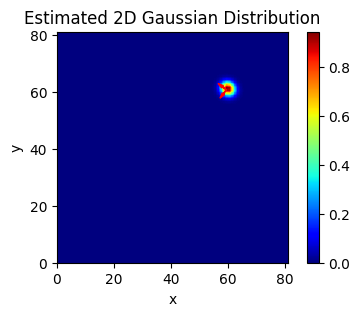

Plot of the raw data


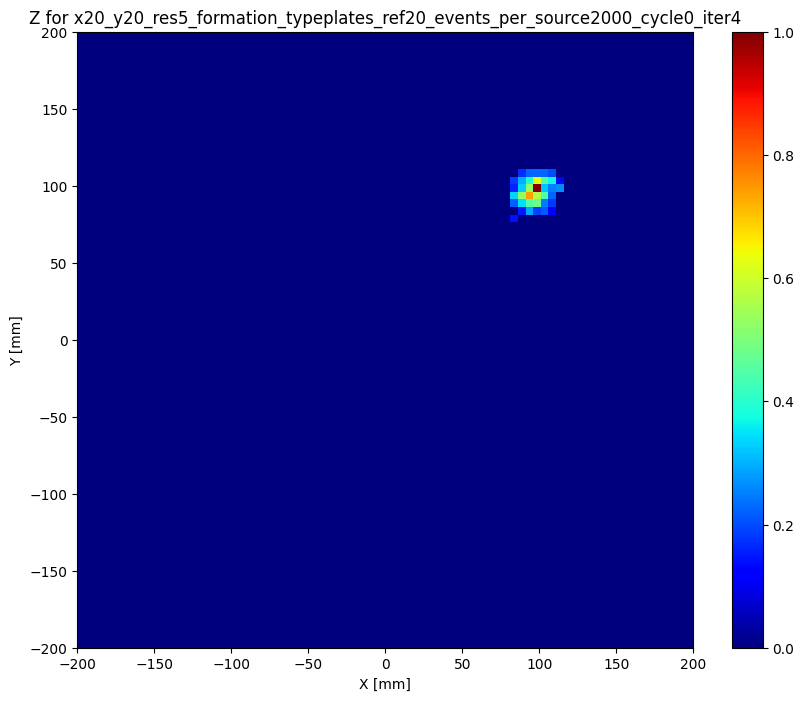

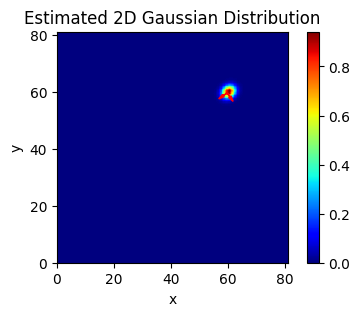

59.703061152999304 59.5394593127871 1.3460799174967084 1.6316846978011765
runs_counter =  29
iter value is  2 cycle value is  5
Plot of the raw data


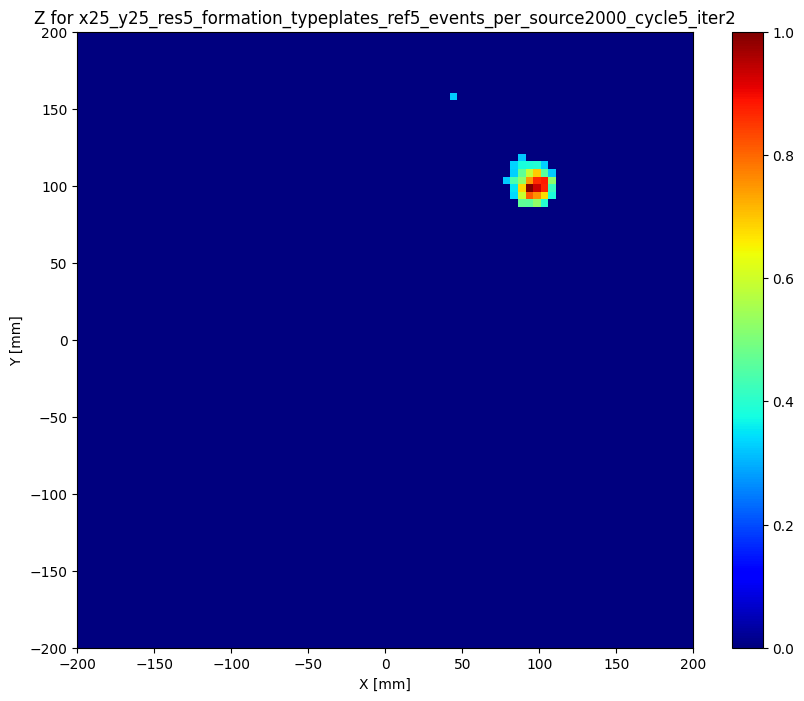

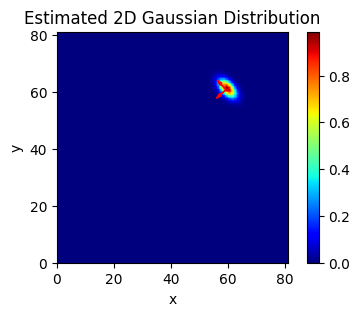

Plot of the raw data


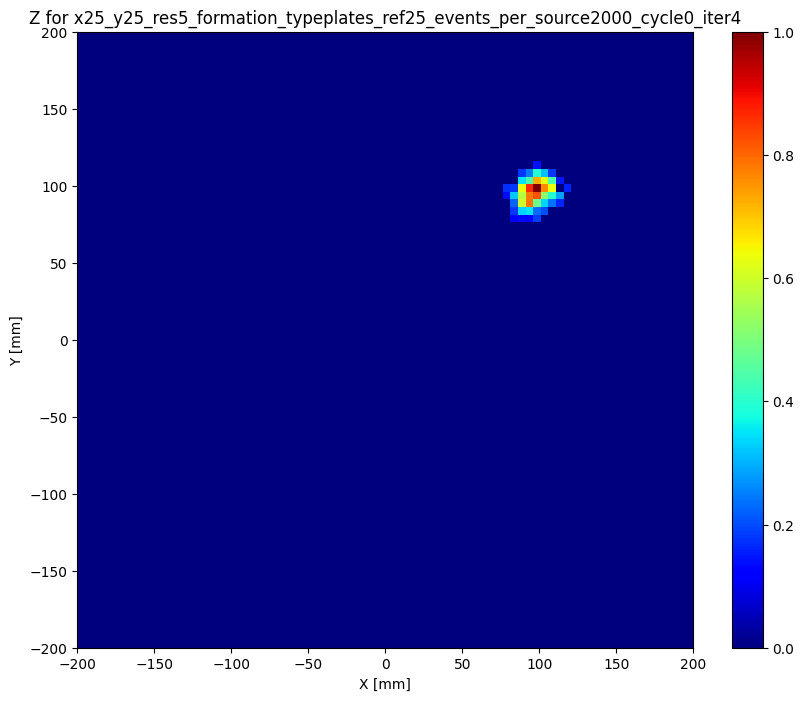

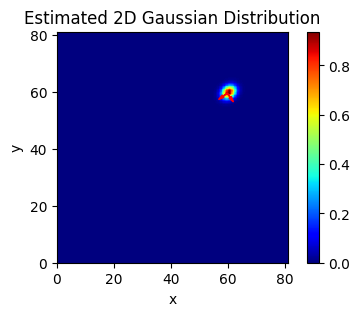

59.732359707325664 59.42250925084909 1.384490559808426 1.7556996801039455
runs_counter =  30
iter value is  4 cycle value is  6
Plot of the raw data


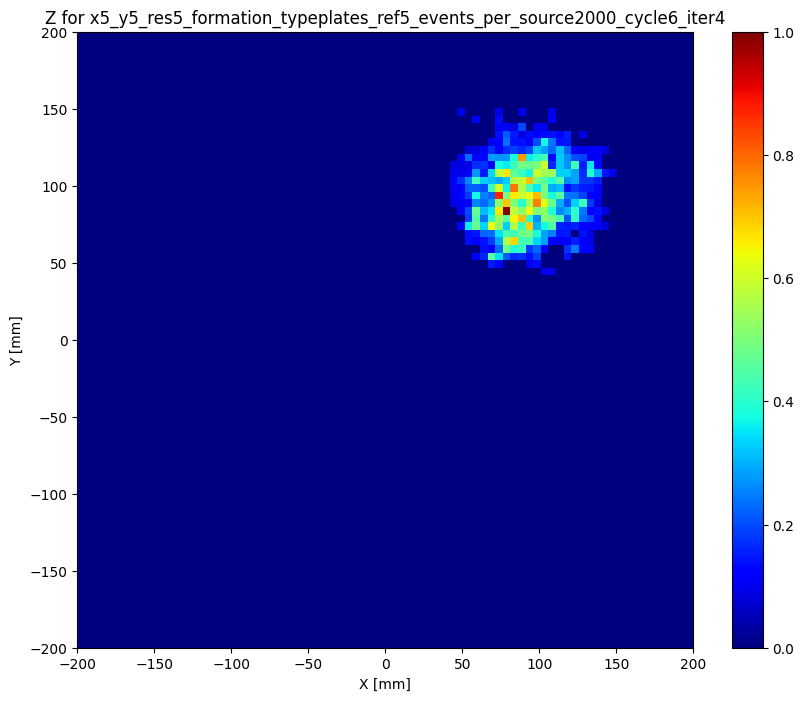

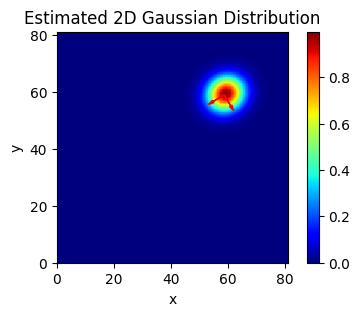

Plot of the raw data


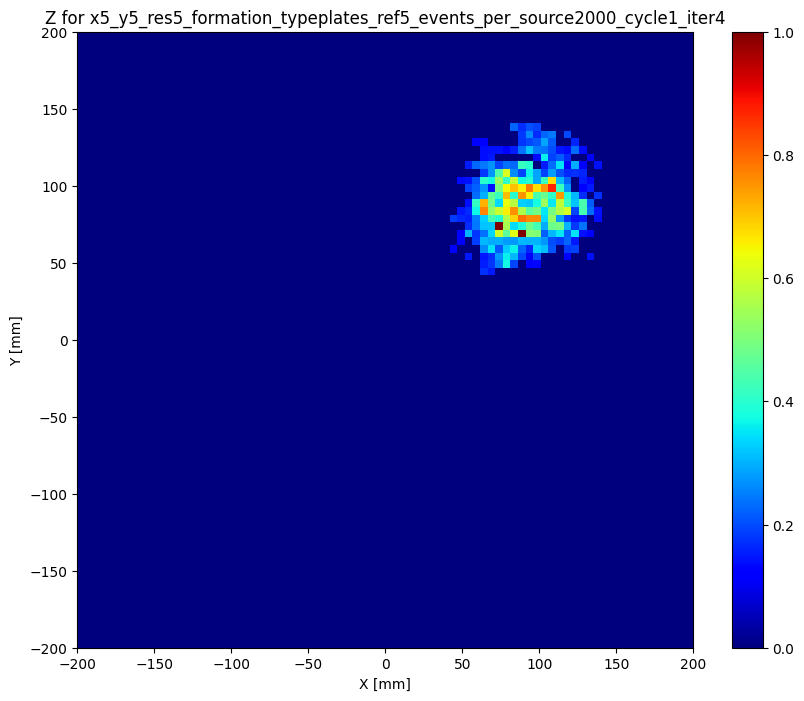

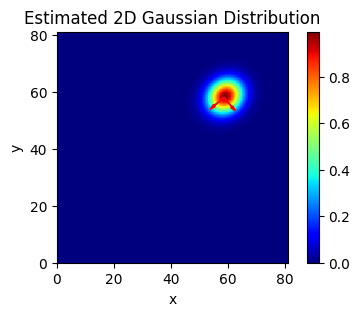

58.480092830874945 57.95124380310732 3.773186661194337 4.356853524609763
runs_counter =  31
iter value is  2 cycle value is  6
Plot of the raw data


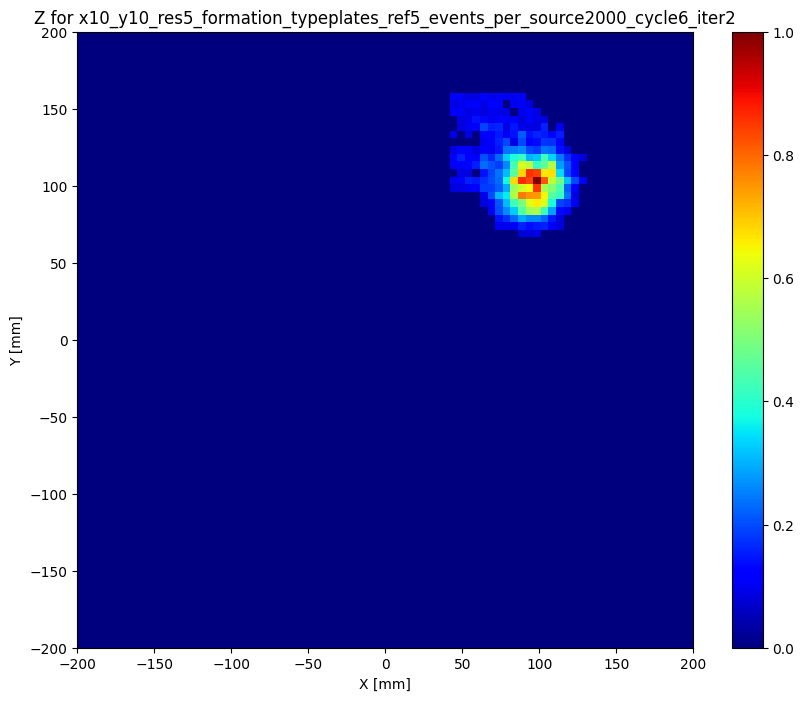

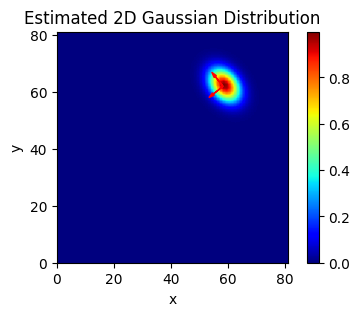

Plot of the raw data


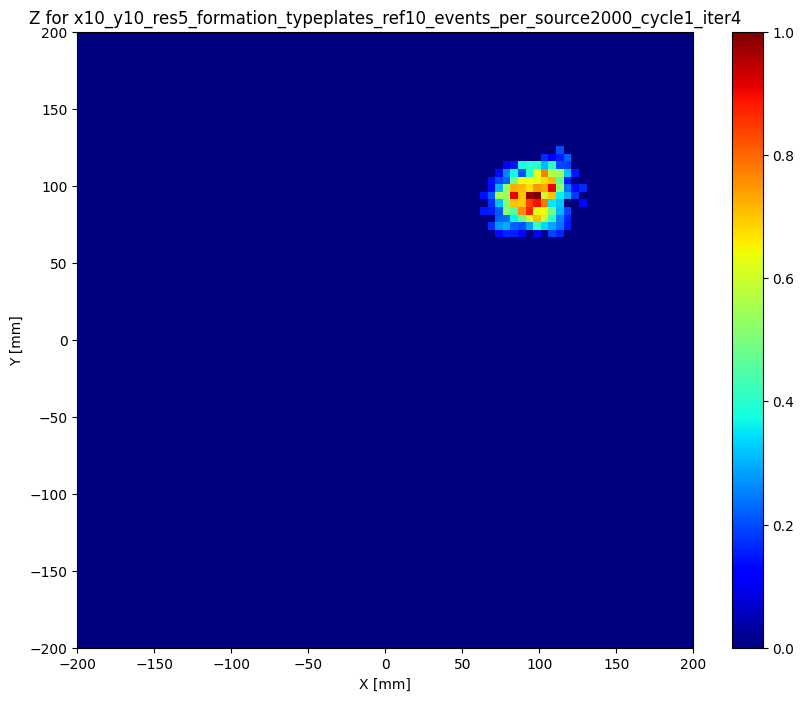

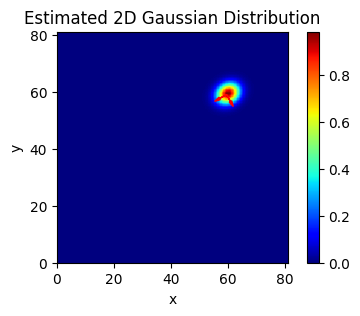

59.48464099415415 58.97266742225758 2.283356790028188 2.807893978220136
runs_counter =  32
iter value is  2 cycle value is  1
Plot of the raw data


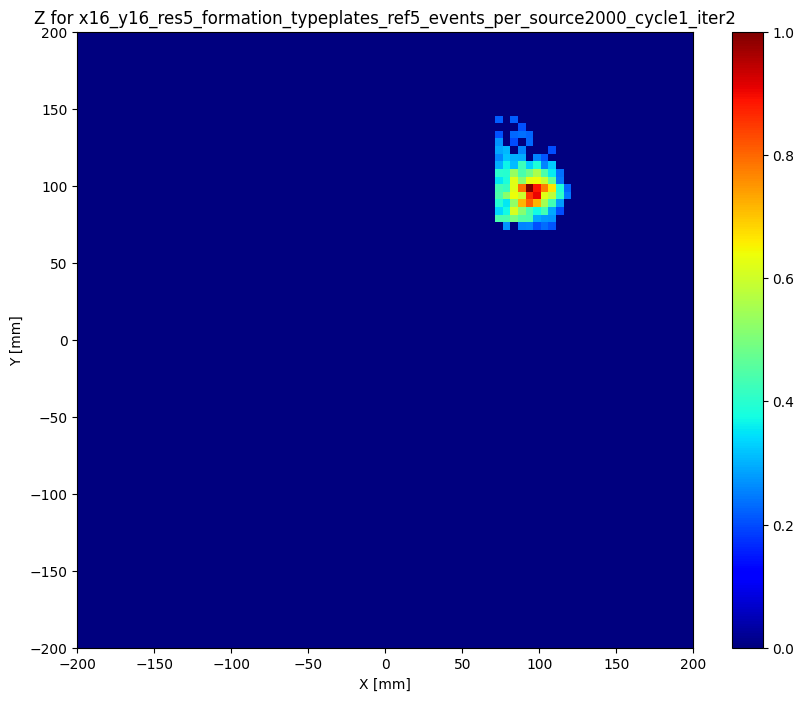

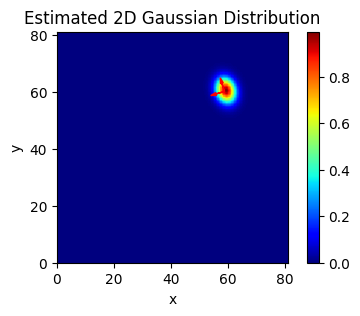

Plot of the raw data


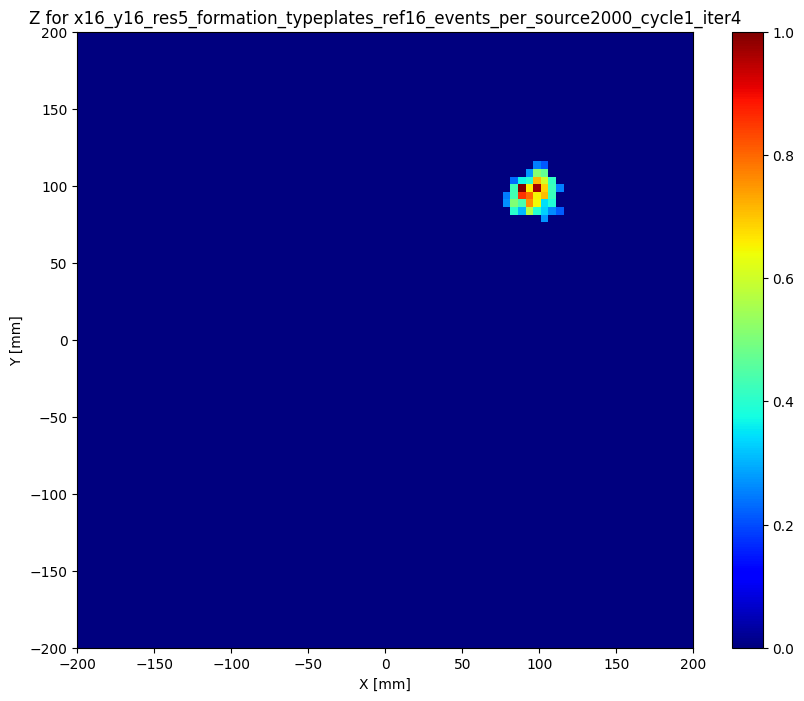

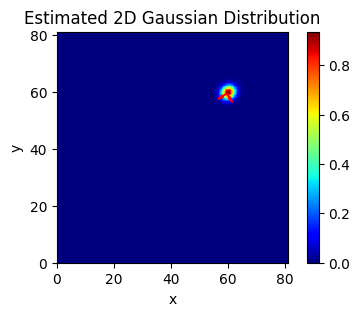

59.55021176584482 59.33569728829662 1.5177507253466918 1.7277945807925486
runs_counter =  33
iter value is  2 cycle value is  6
Plot of the raw data


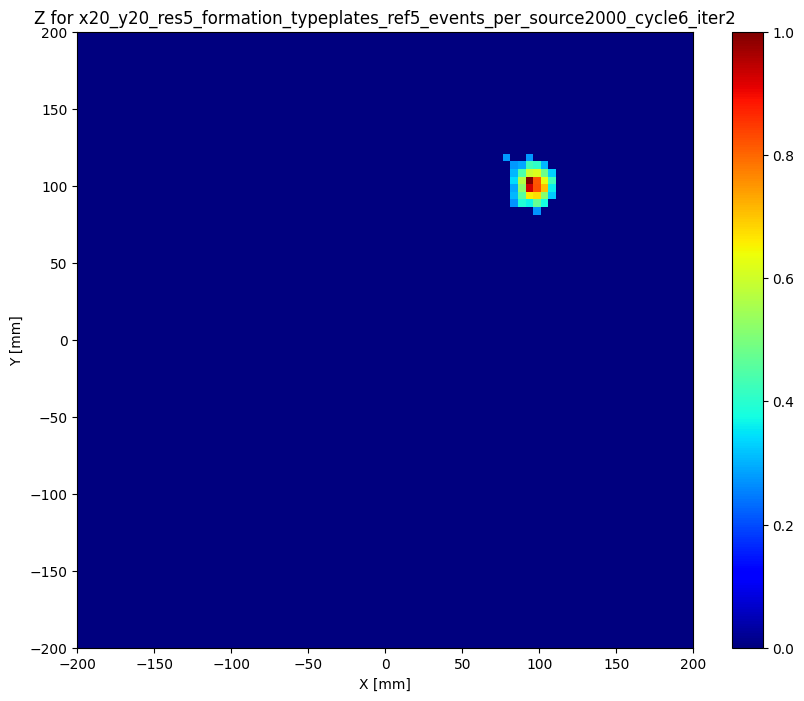

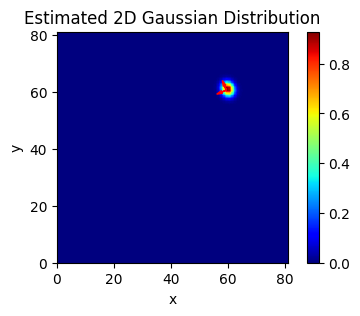

Plot of the raw data


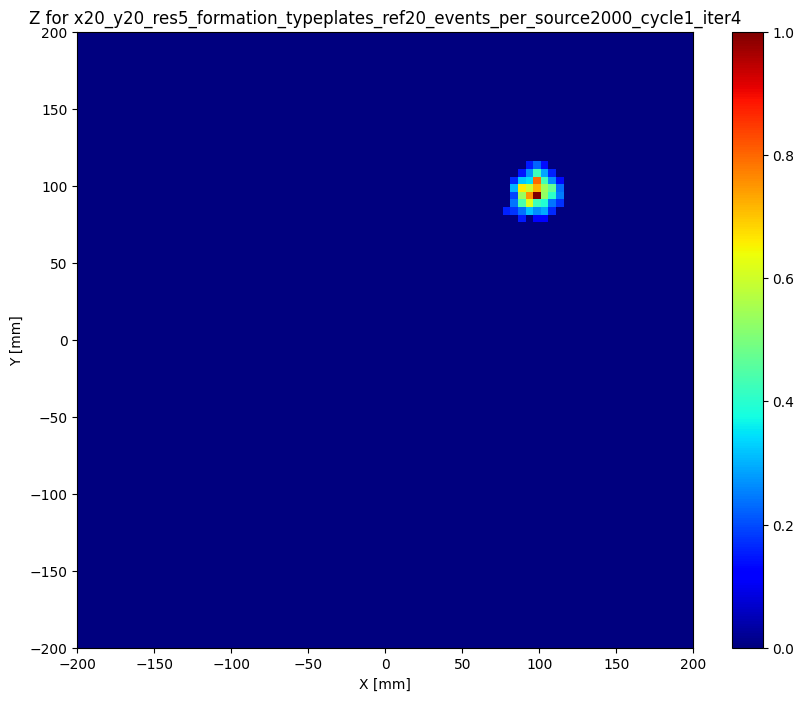

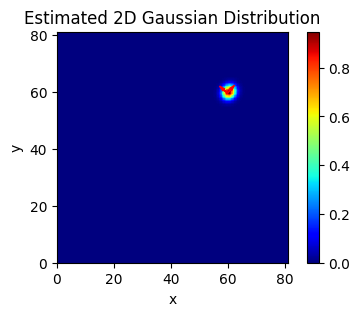

59.78906664356089 59.464158058384875 1.5215529638395815 1.7050438391204545
runs_counter =  34
iter value is  2 cycle value is  6
Plot of the raw data


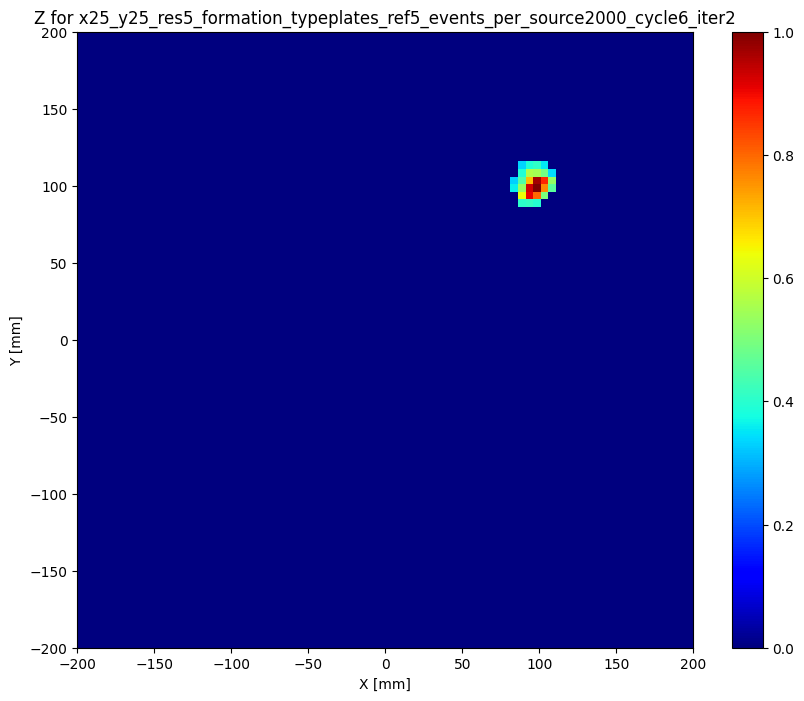

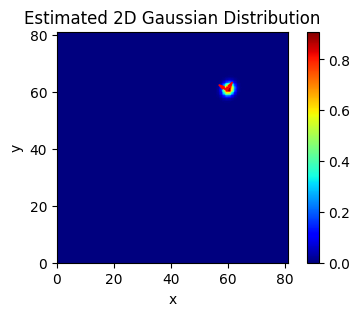

Plot of the raw data


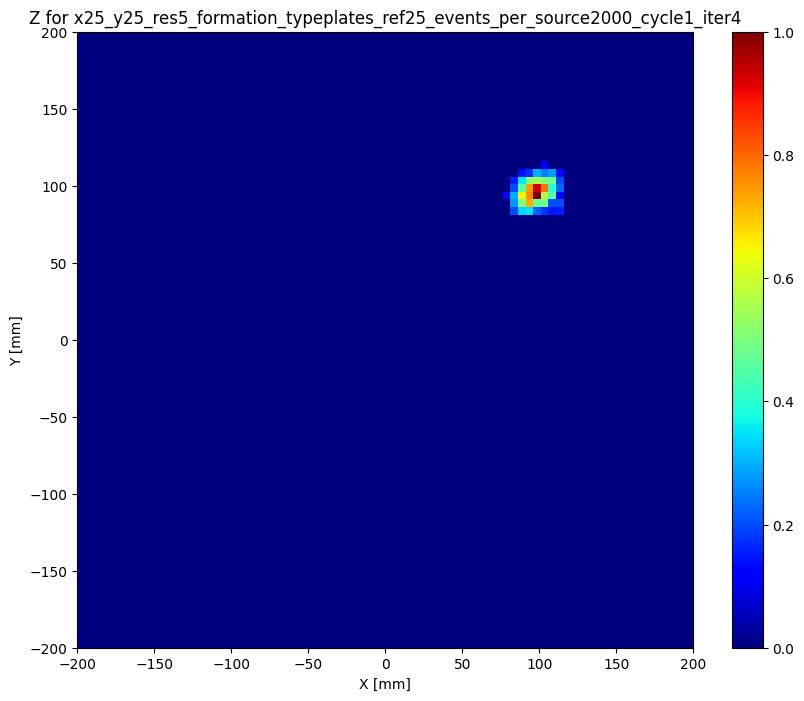

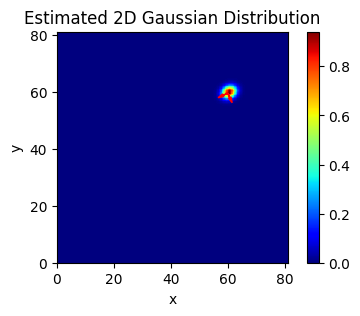

59.867320053347456 59.46083675654843 1.3697083589842902 1.7216957049277752
runs_counter =  35
iter value is  4 cycle value is  7
Plot of the raw data


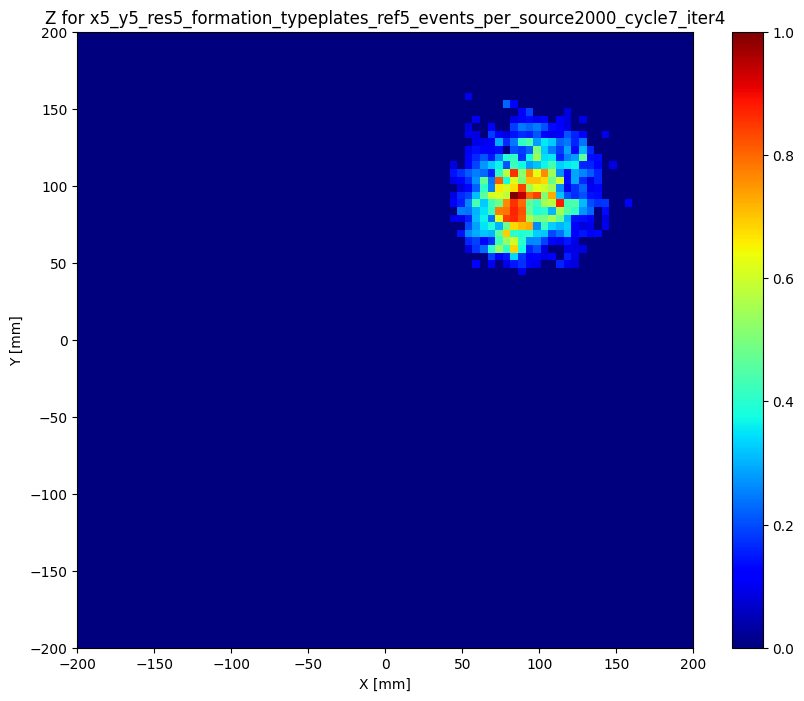

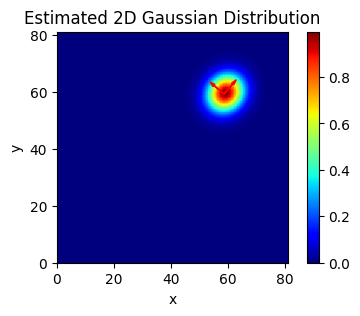

Plot of the raw data


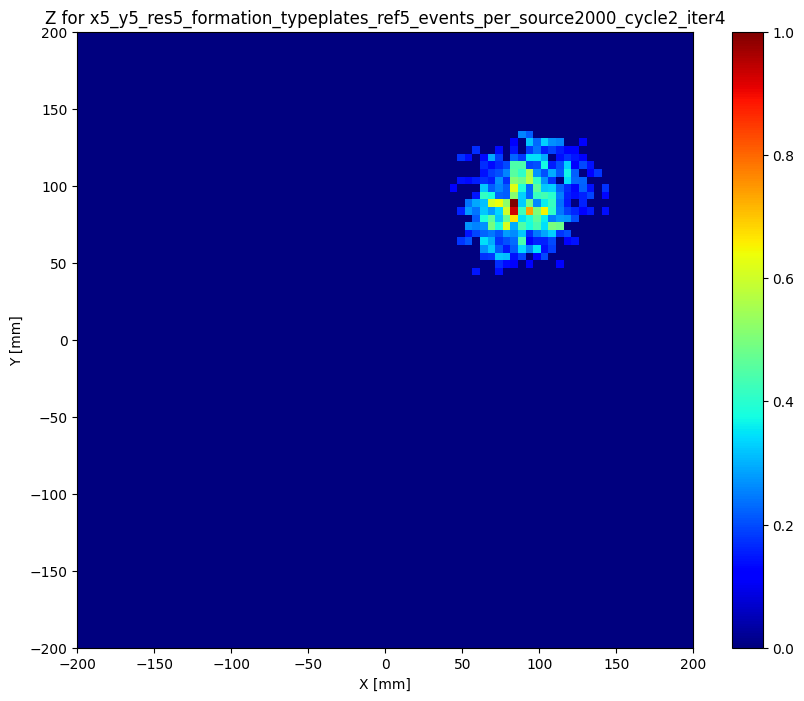

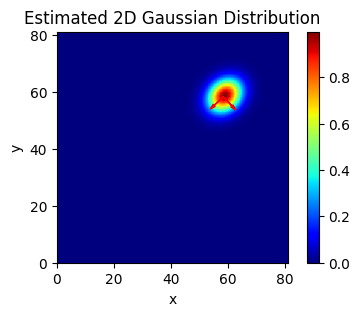

58.348069111101665 58.19504170464106 3.5253259345002963 4.3943383738417285
runs_counter =  36
iter value is  2 cycle value is  7
Plot of the raw data


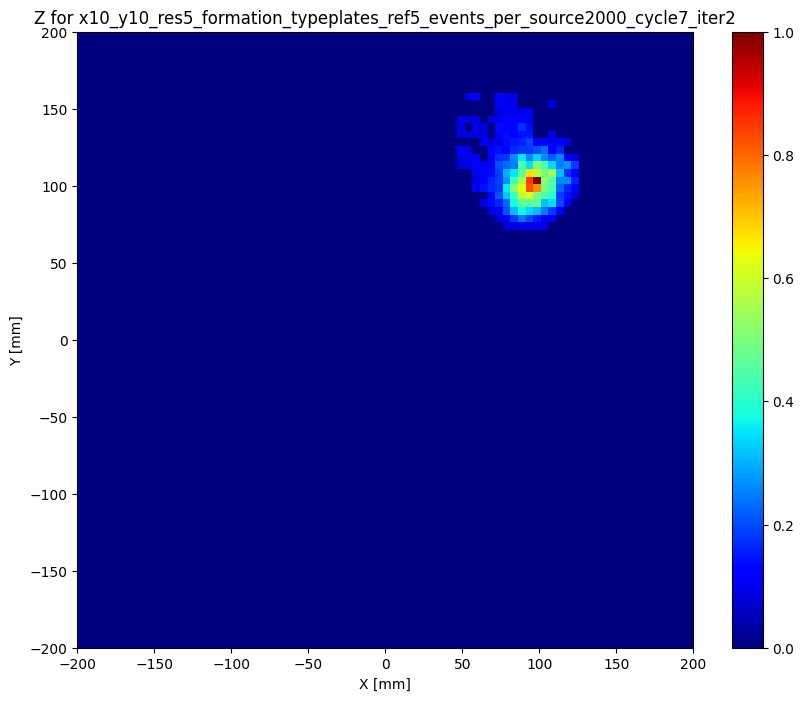

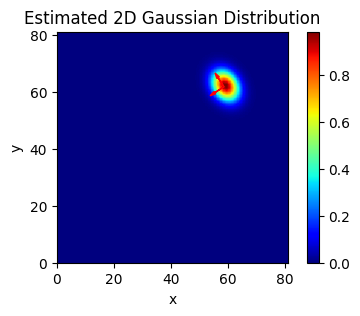

Plot of the raw data


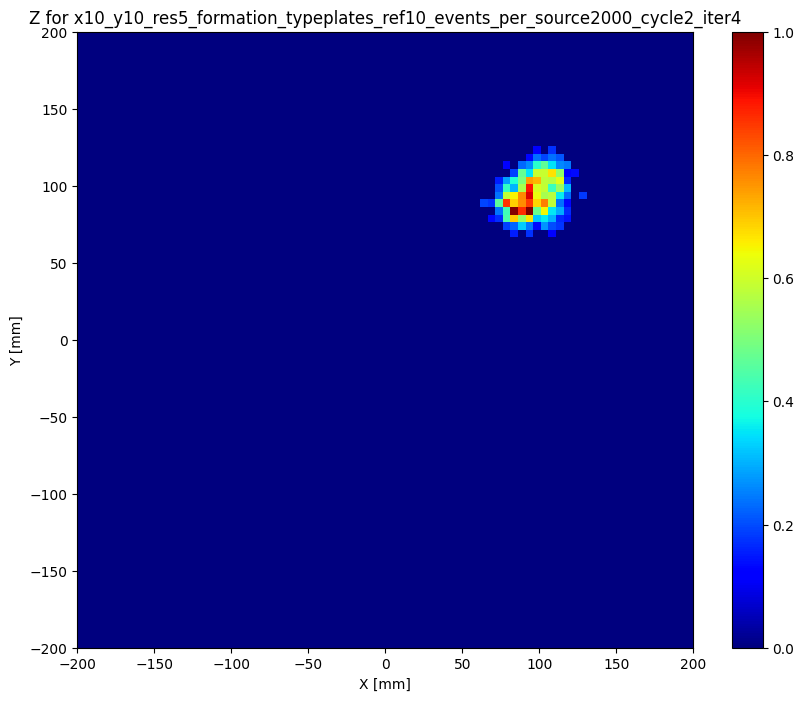

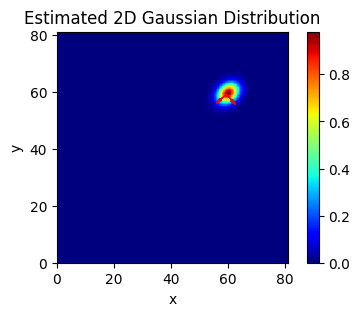

59.48680691366731 59.07280896372261 2.0885846605882876 2.7582863252731262
runs_counter =  37
iter value is  2 cycle value is  2
Plot of the raw data


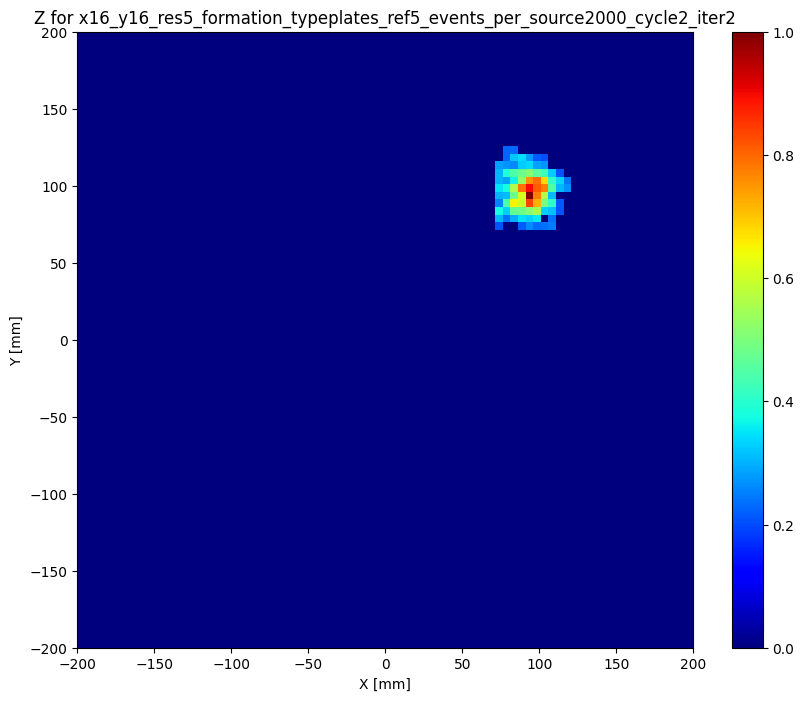

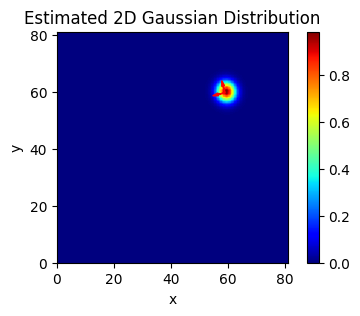

Plot of the raw data


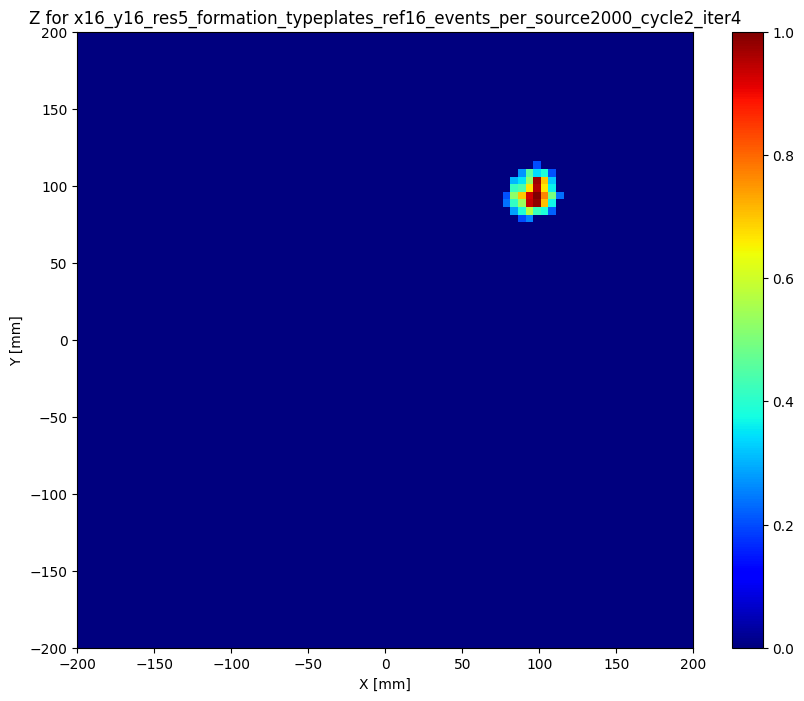

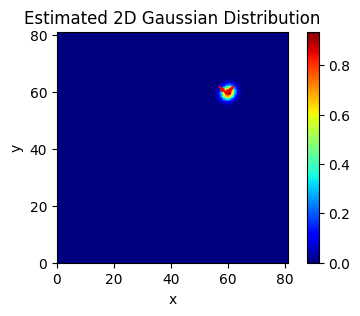

59.533999873546456 59.2736429429519 1.4635124058958817 1.6663209228096543
runs_counter =  38
iter value is  2 cycle value is  7
Plot of the raw data


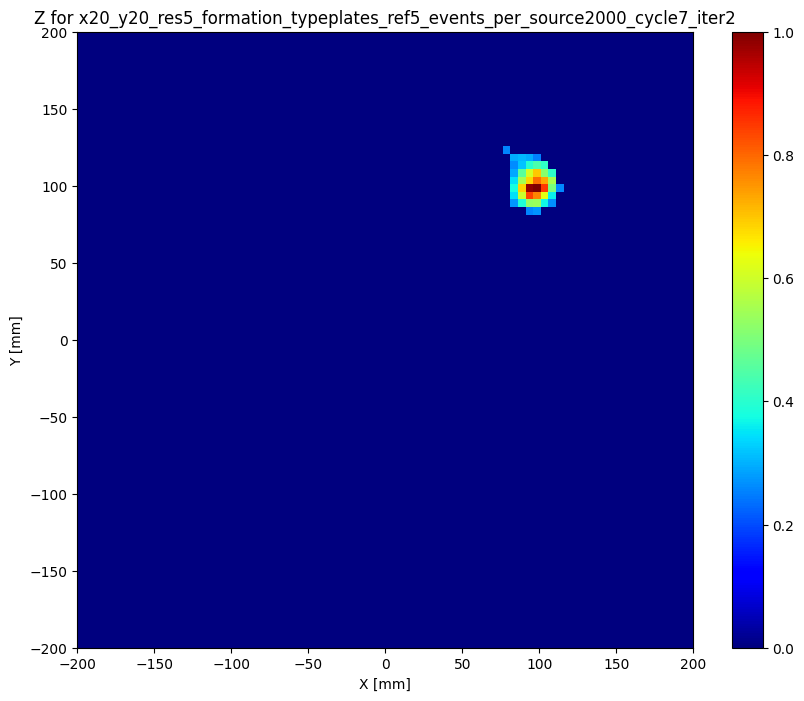

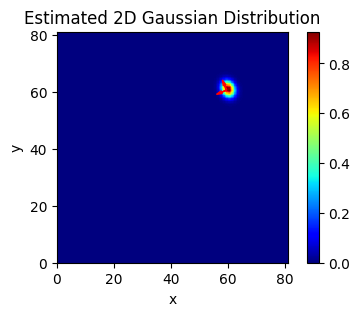

Plot of the raw data


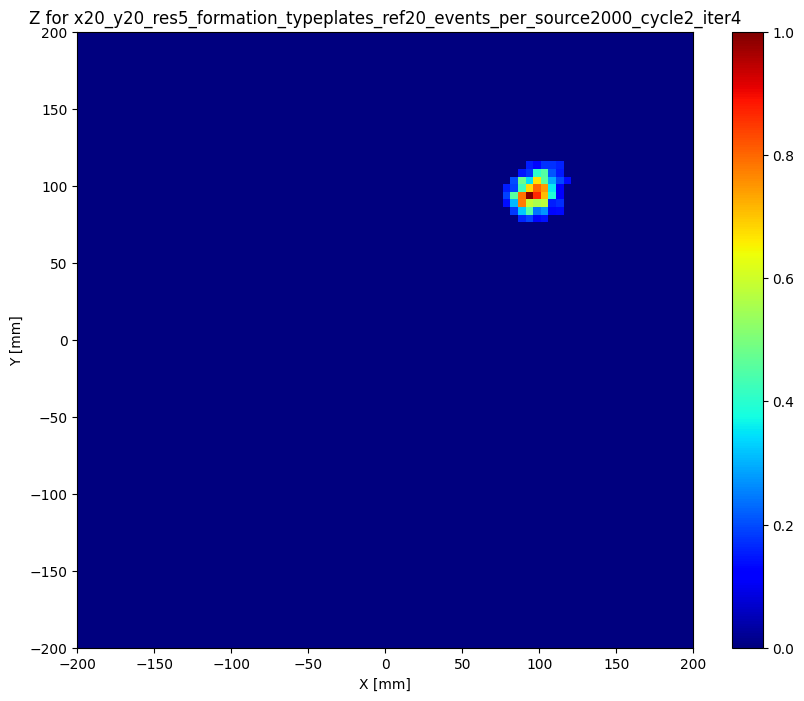

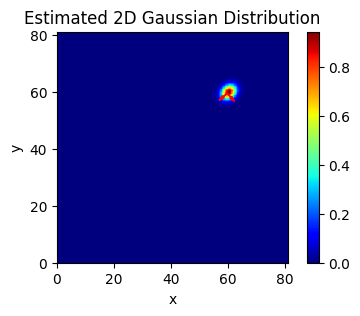

59.731581974093686 59.43697901053433 1.502422788420275 1.8985920274121708
runs_counter =  39
iter value is  2 cycle value is  7
Plot of the raw data


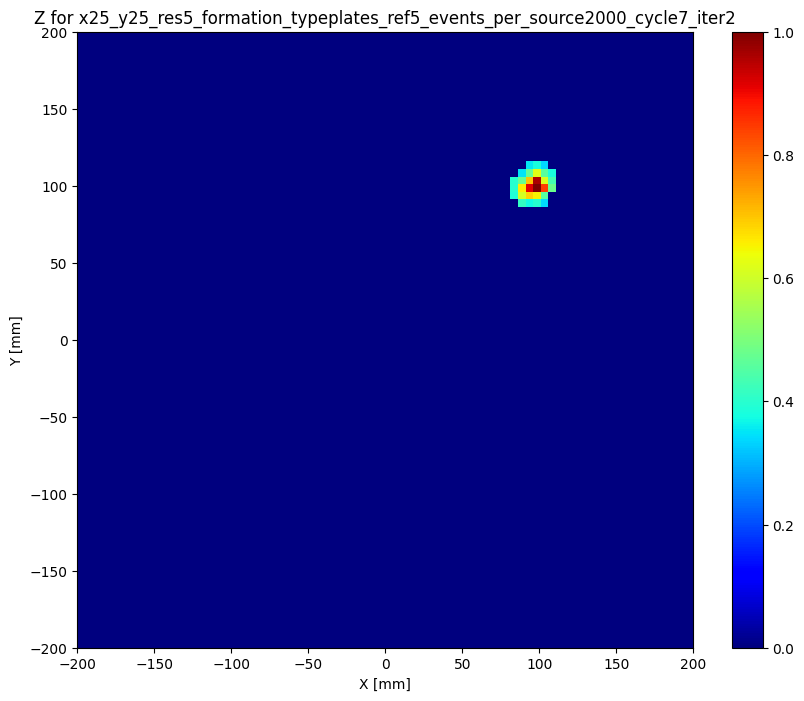

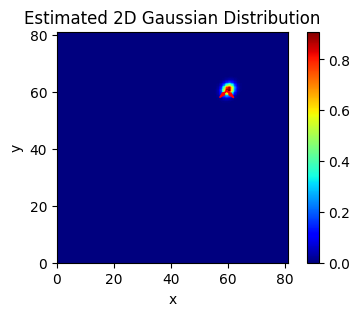

Plot of the raw data


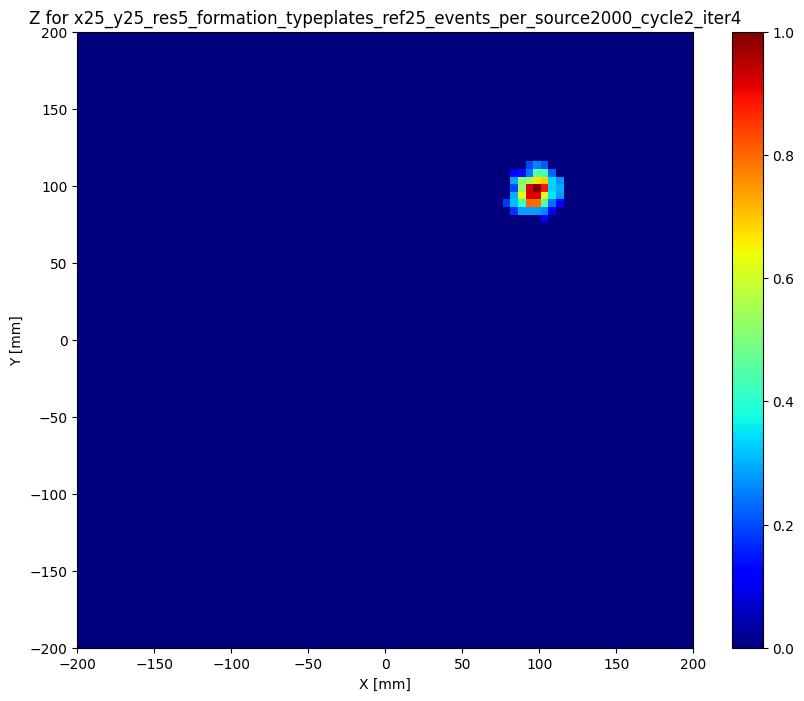

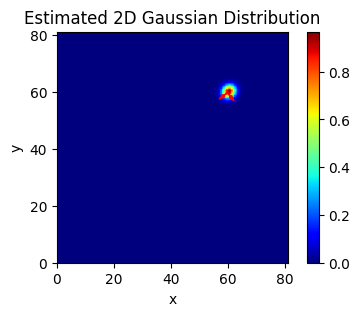

59.78221685973991 59.63578913167765 1.4813829726702716 1.667282651754488
runs_counter =  40
iter value is  4 cycle value is  8
Plot of the raw data


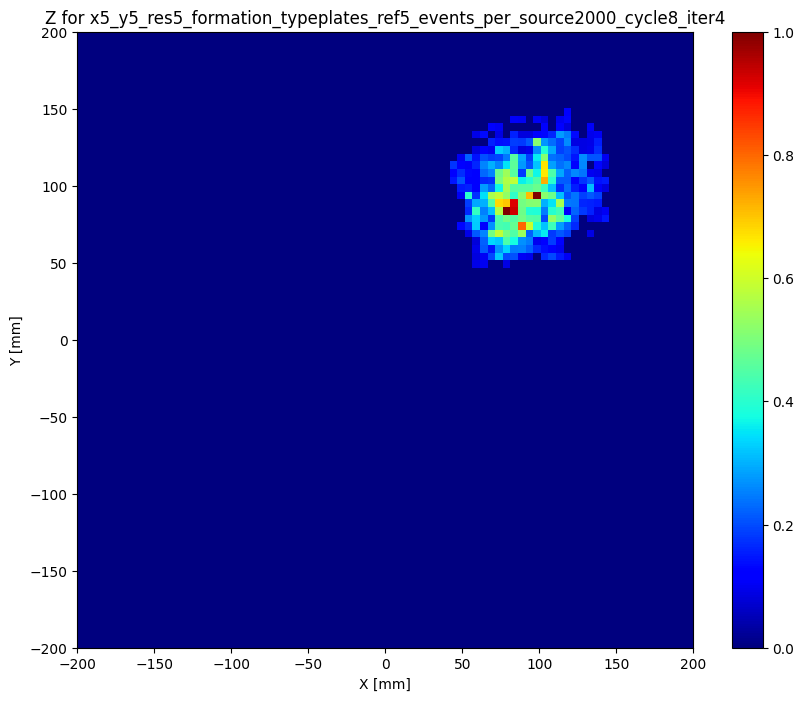

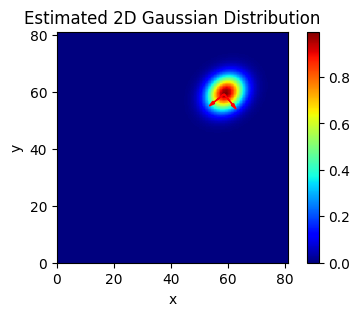

Plot of the raw data


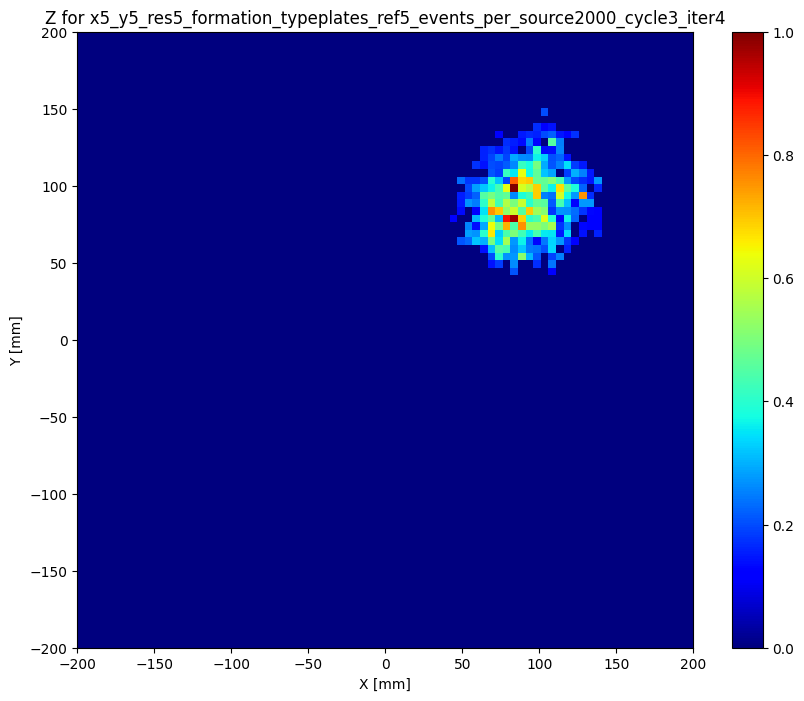

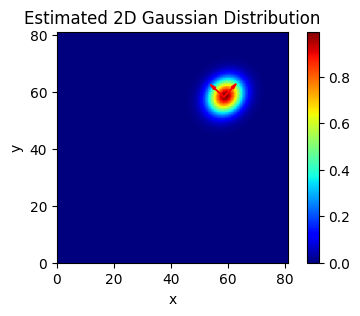

58.541960291989184 58.0955120366024 3.729433659243761 4.39191549061393
runs_counter =  41
iter value is  2 cycle value is  8
Plot of the raw data


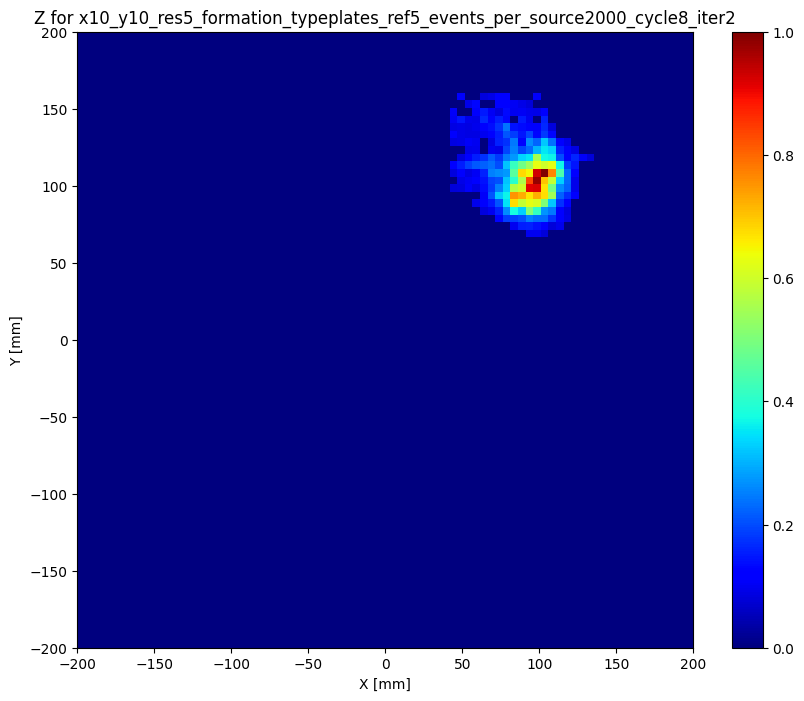

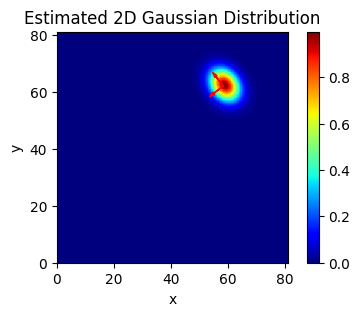

Plot of the raw data


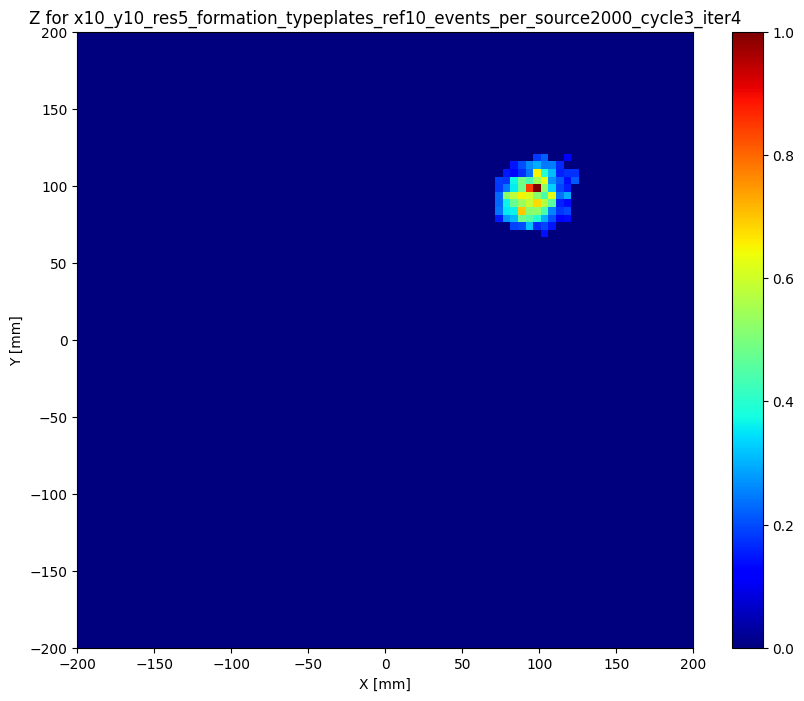

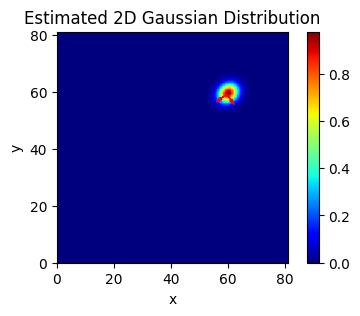

59.531198706189556 59.082509111467004 2.0860316404785597 2.488562746674891
runs_counter =  42
iter value is  2 cycle value is  3
Plot of the raw data


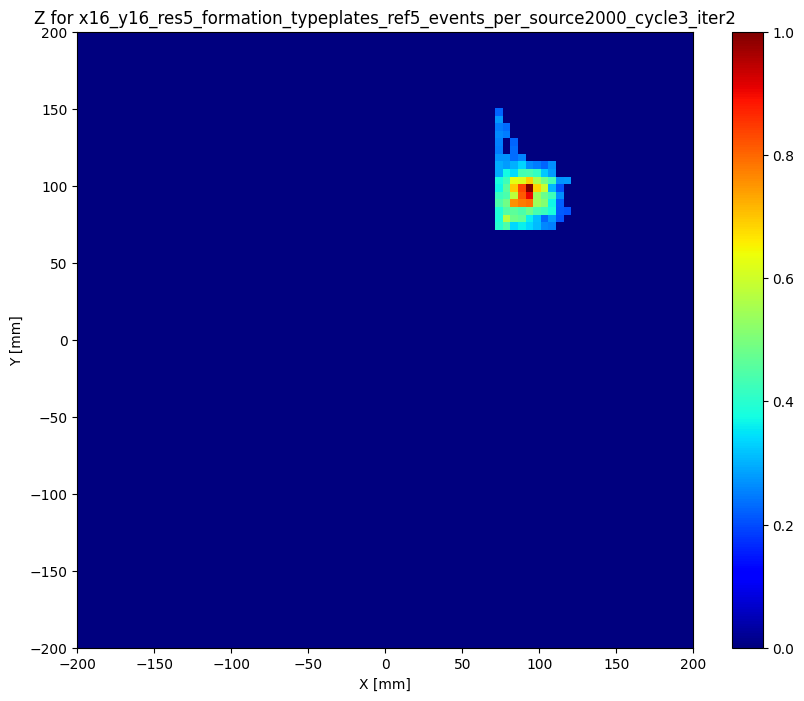

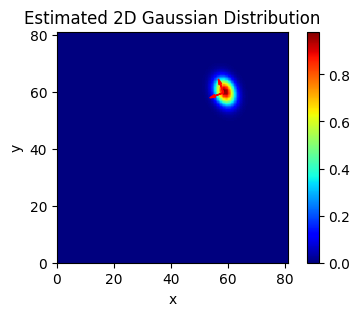

Plot of the raw data


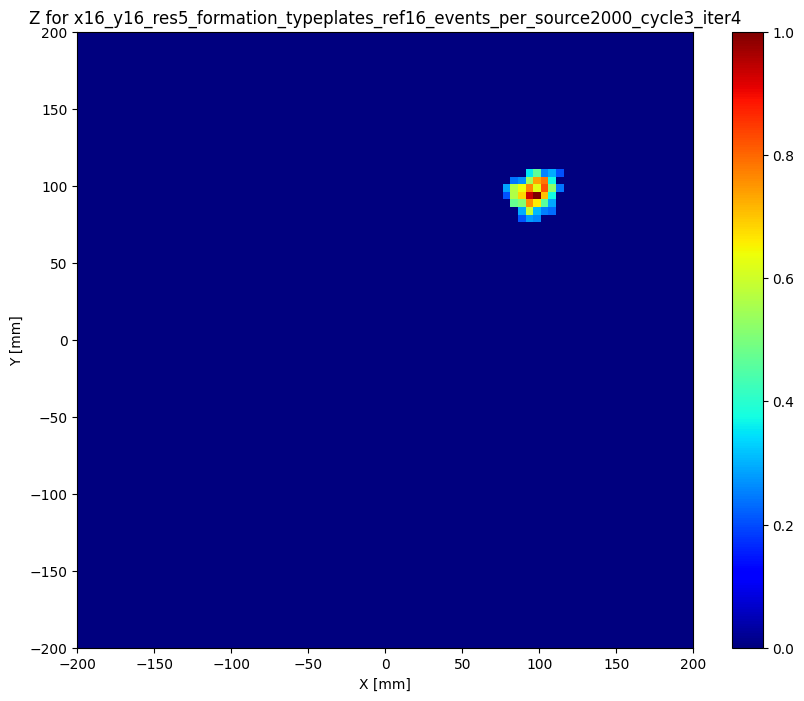

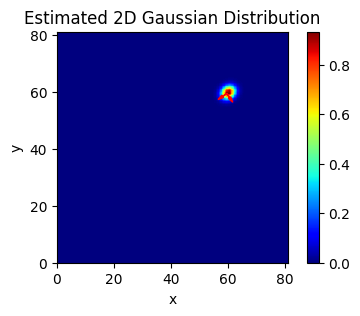

59.57102420437698 59.332491915108704 1.4340888941226042 1.7318003493304923
runs_counter =  43
iter value is  2 cycle value is  8
Plot of the raw data


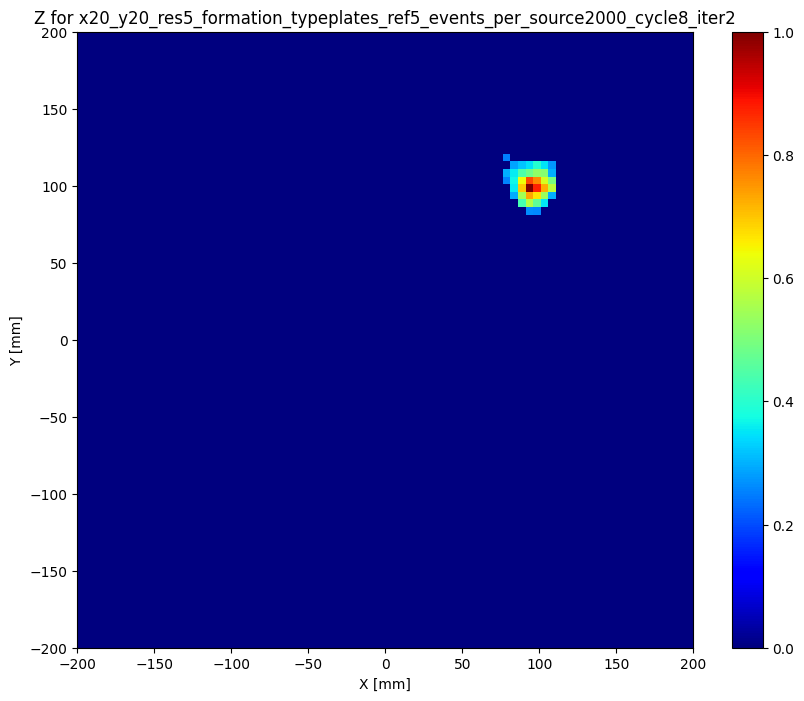

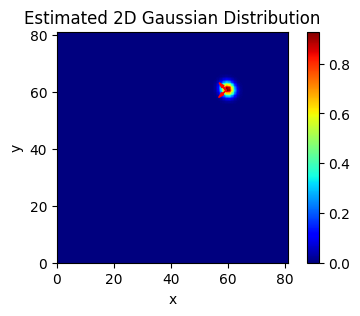

Plot of the raw data


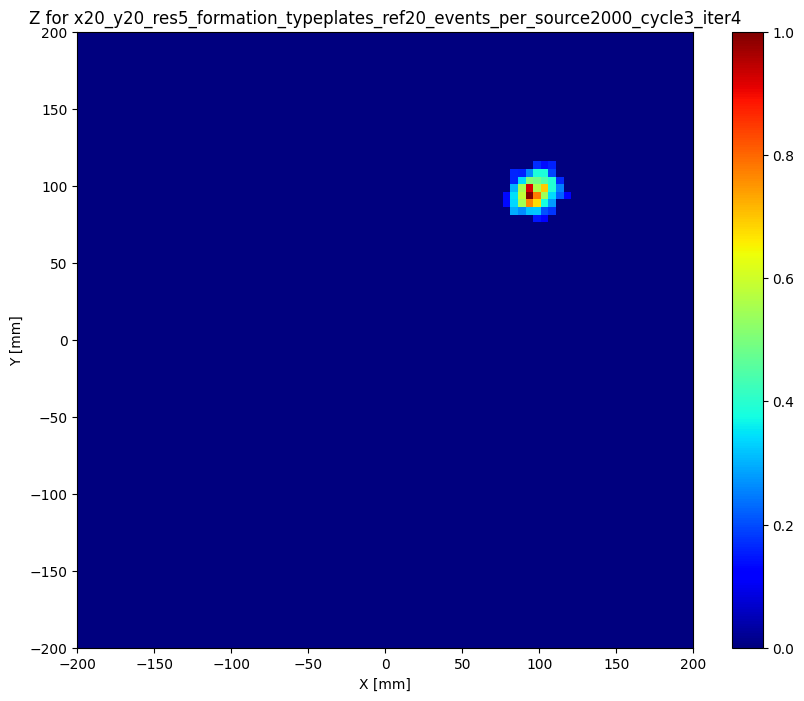

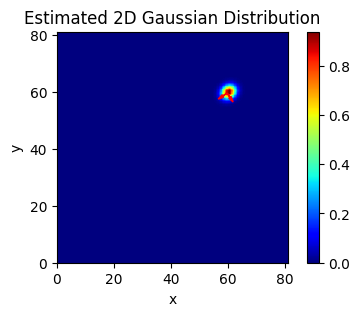

59.688048580741636 59.470986978992414 1.4883956253378317 1.7699233757171053
runs_counter =  44
iter value is  2 cycle value is  8
Plot of the raw data


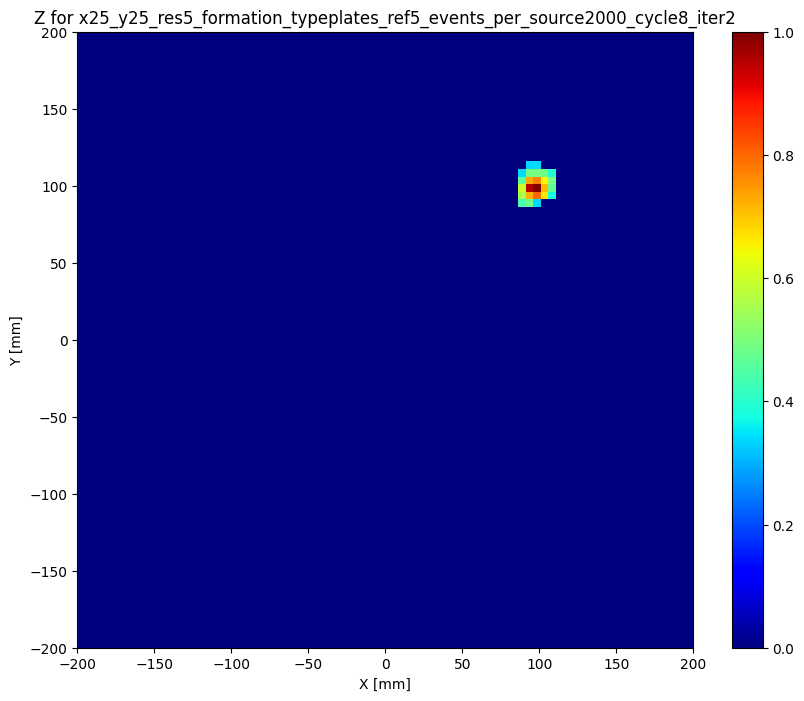

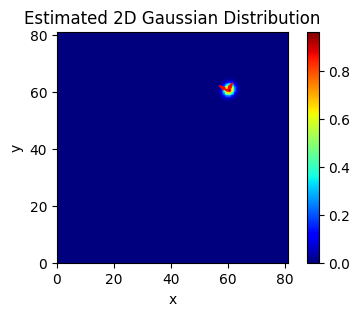

Plot of the raw data


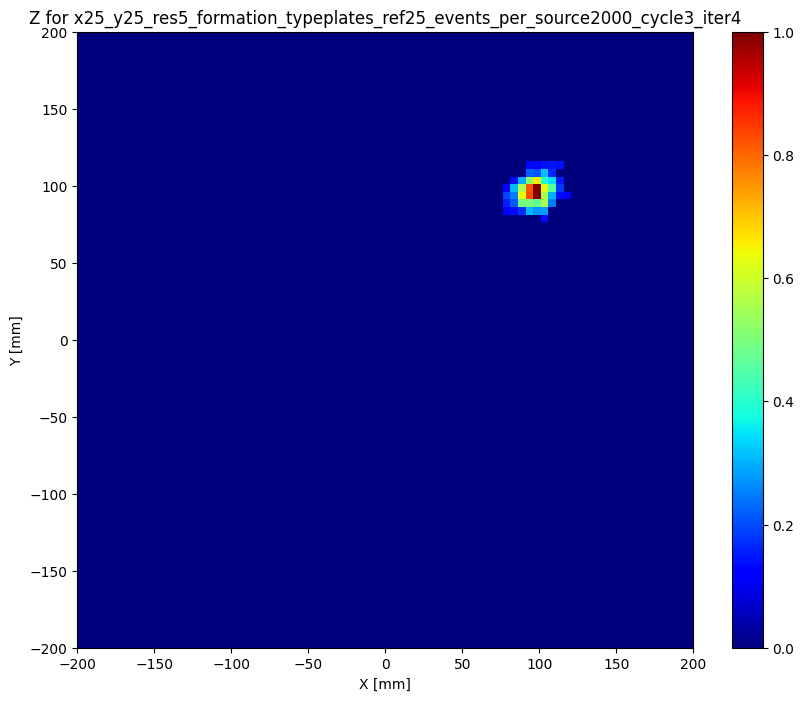

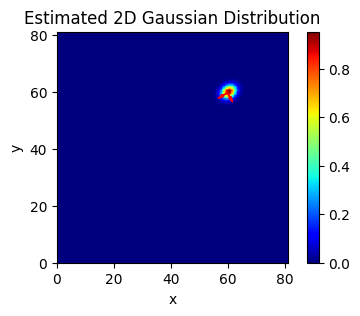

59.72277373141528 59.55152756618112 1.3980180619614628 1.7944412534369412
runs_counter =  45
iter value is  4 cycle value is  9
Plot of the raw data


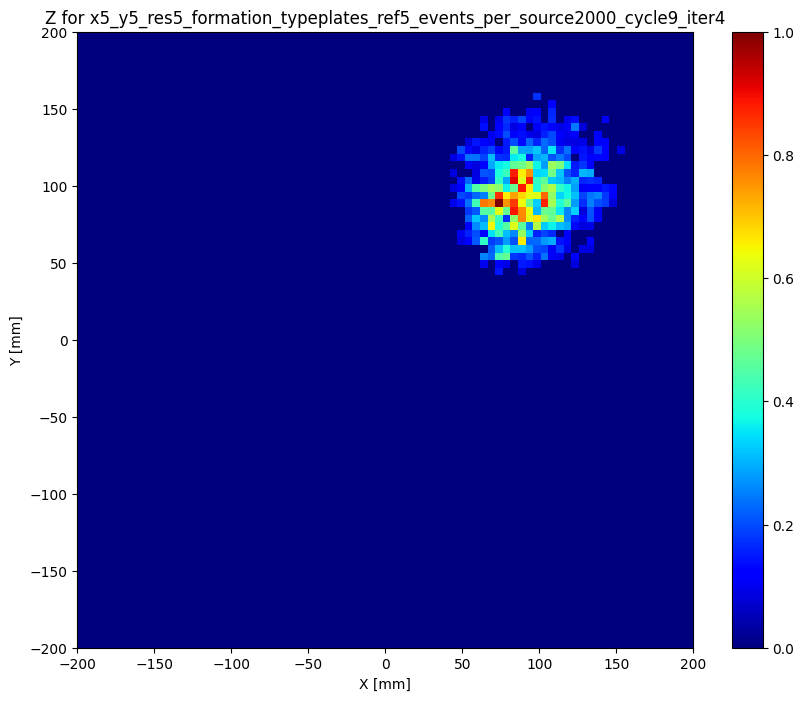

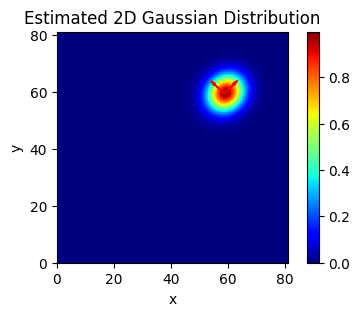

Plot of the raw data


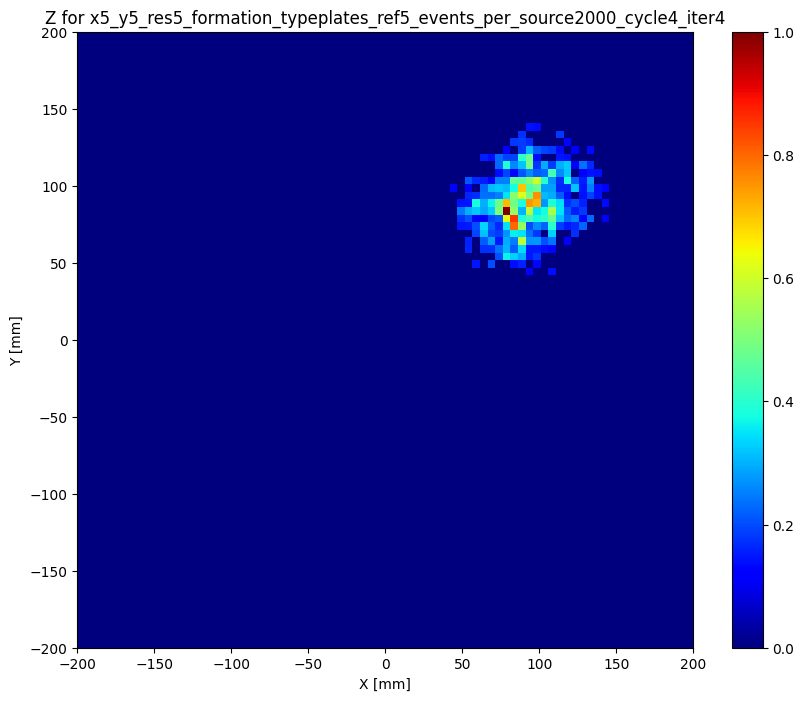

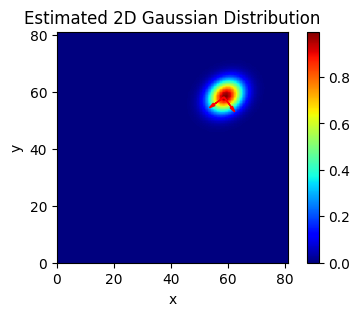

58.616068570066126 58.069974315565176 3.4552879253403375 4.343710106236012
runs_counter =  46
iter value is  2 cycle value is  9
Plot of the raw data


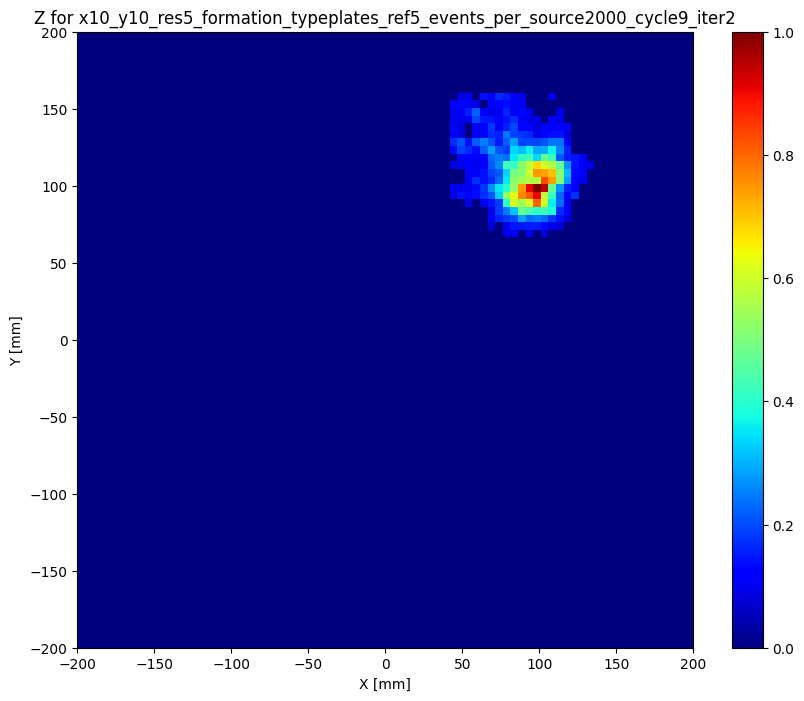

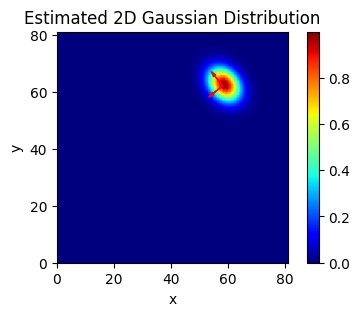

Plot of the raw data


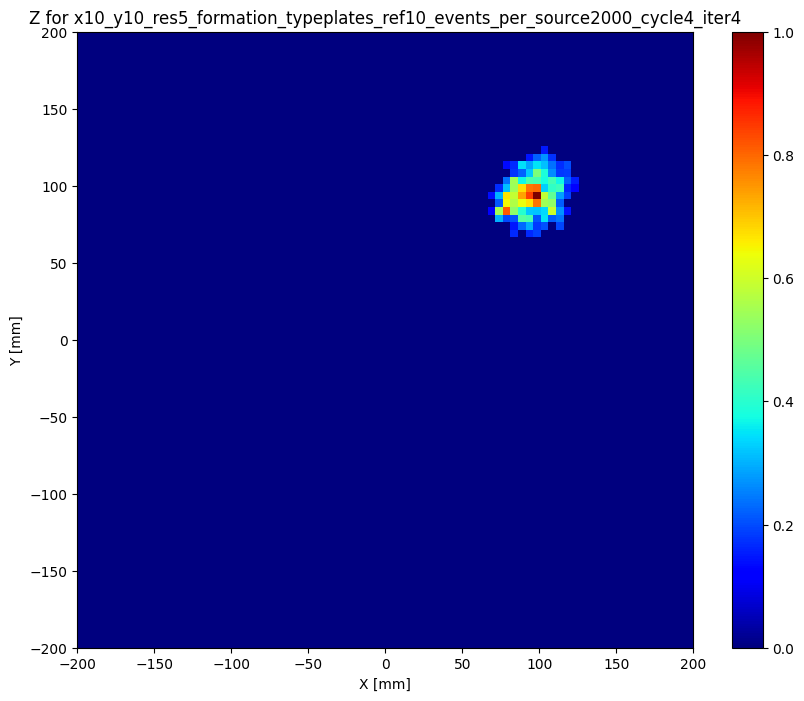

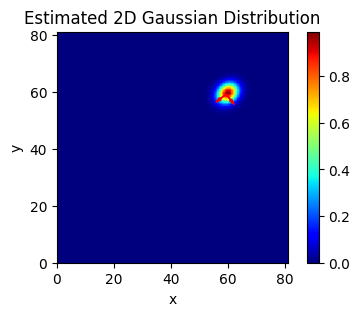

59.344472749302405 59.10178246314476 2.1230588455732473 2.6235380463465026
runs_counter =  47
iter value is  2 cycle value is  4
Plot of the raw data


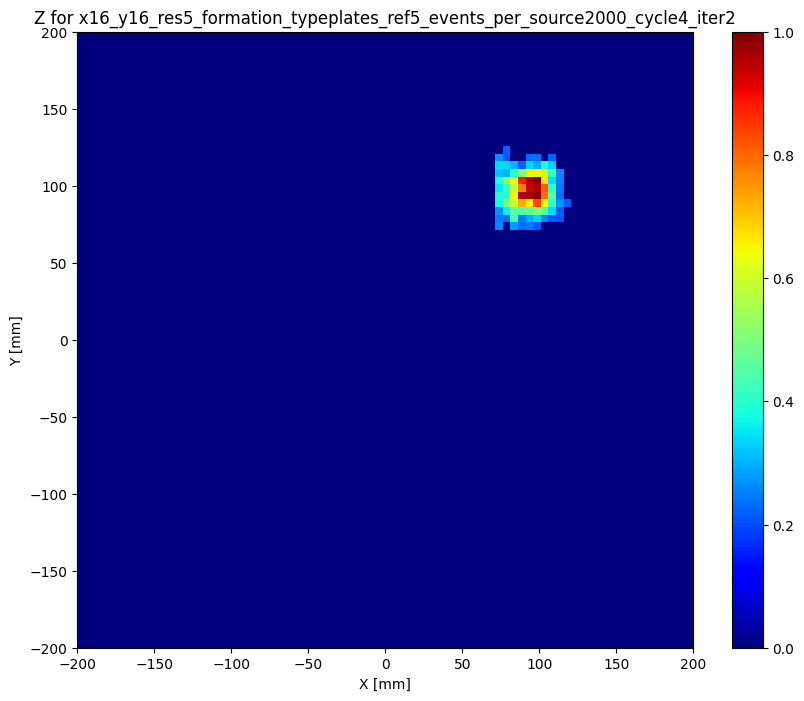

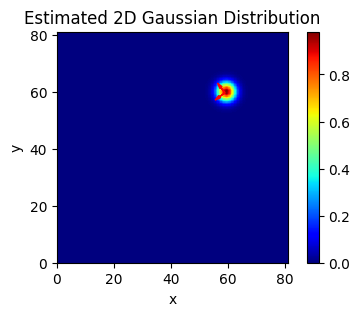

Plot of the raw data


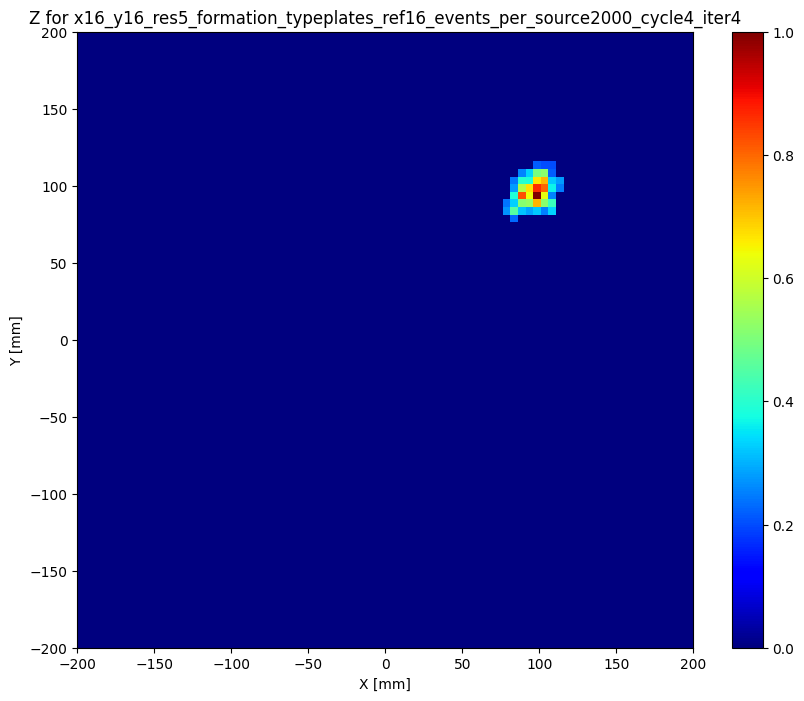

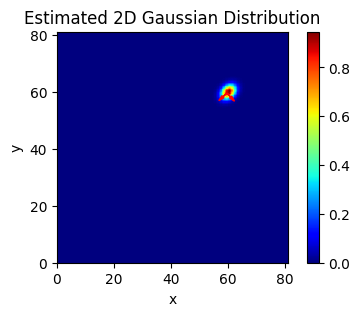

59.628321151153855 59.49605431983047 1.4131043735056825 1.9128577207311632
runs_counter =  48
iter value is  2 cycle value is  9
Plot of the raw data


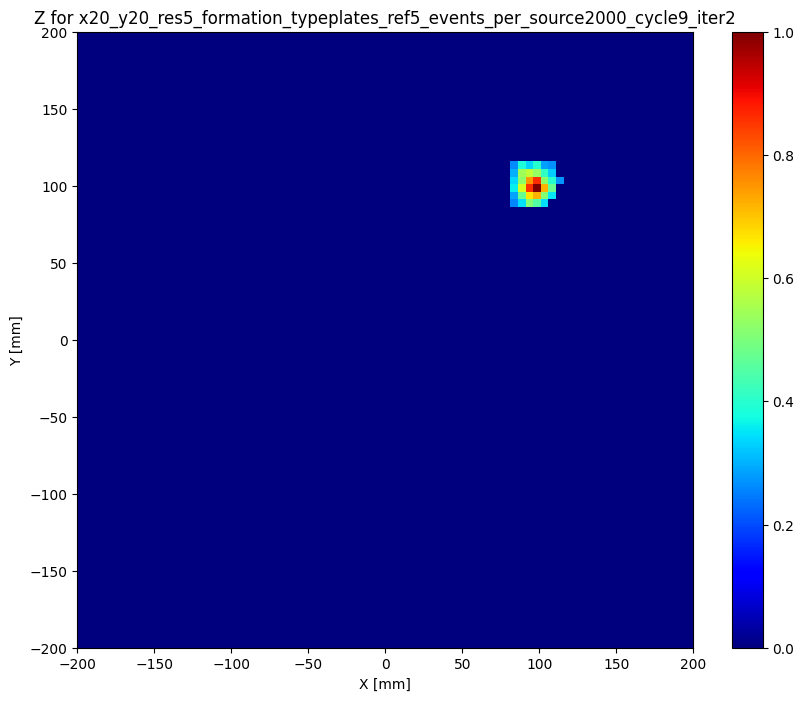

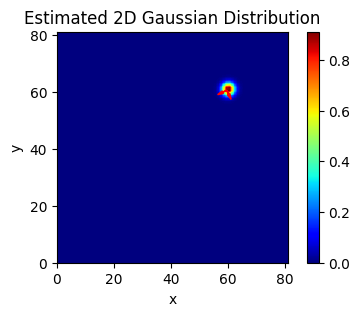

Plot of the raw data


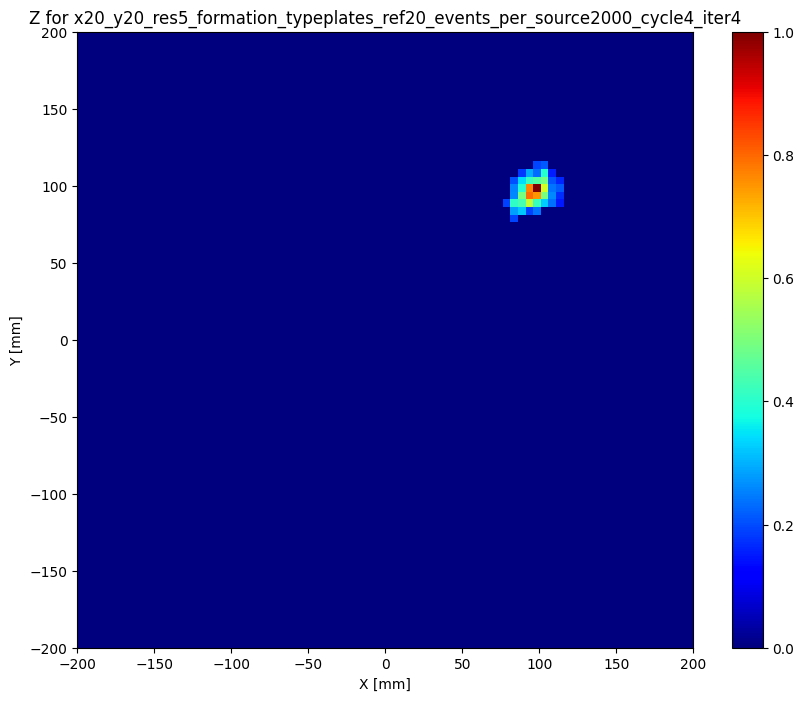

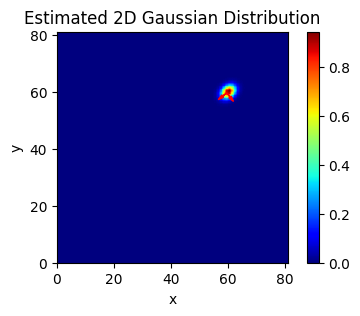

59.578405629067646 59.54951604370362 1.345990664345313 1.810387773198042
runs_counter =  49
iter value is  2 cycle value is  9
Plot of the raw data


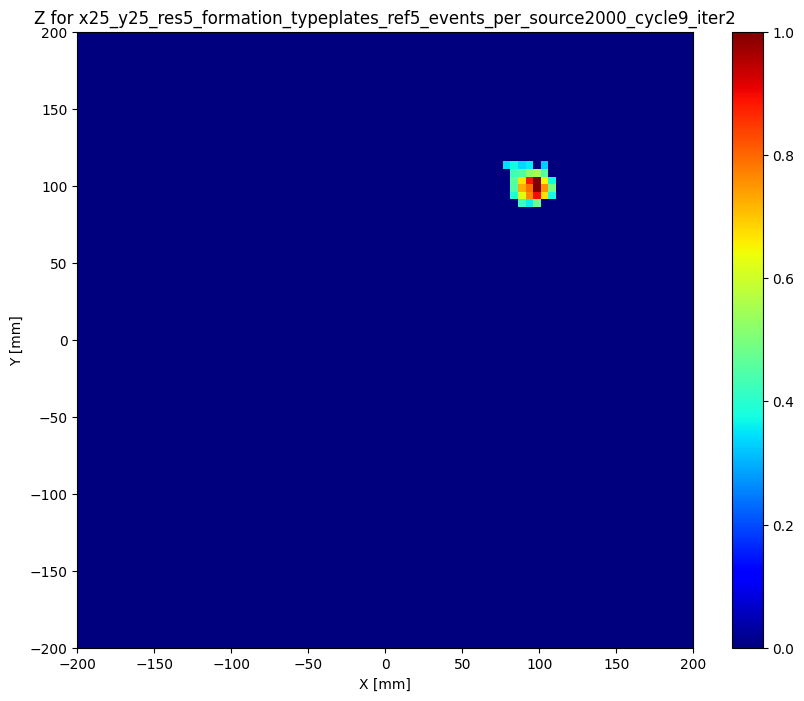

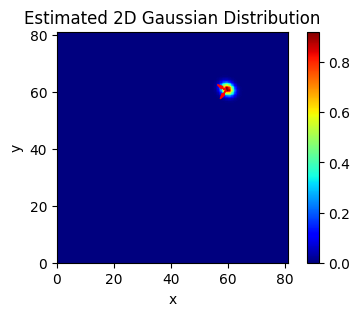

Plot of the raw data


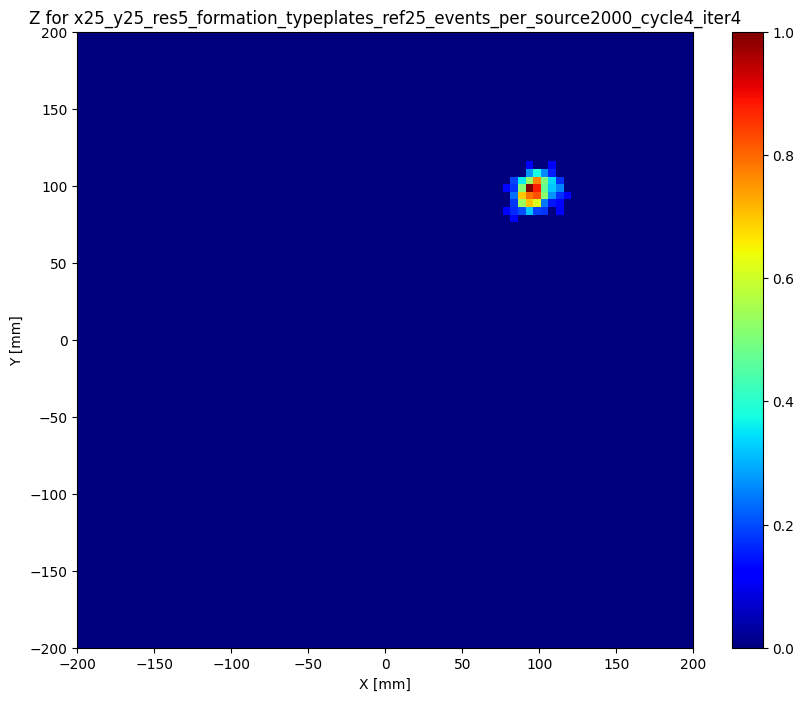

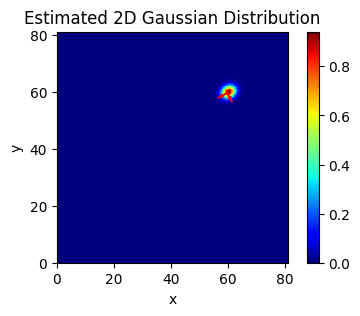

59.6991129487994 59.521906854388725 1.3775267564810876 1.7310575252114875
runs_counter =  50


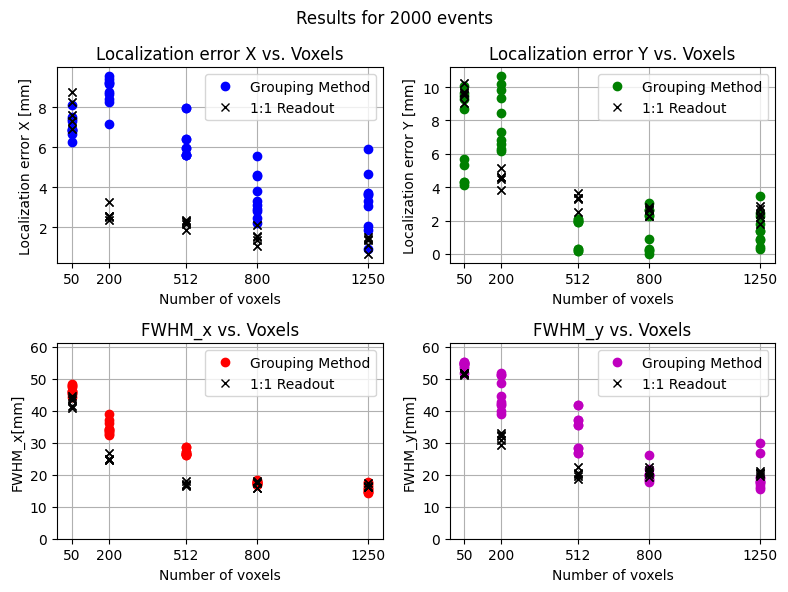

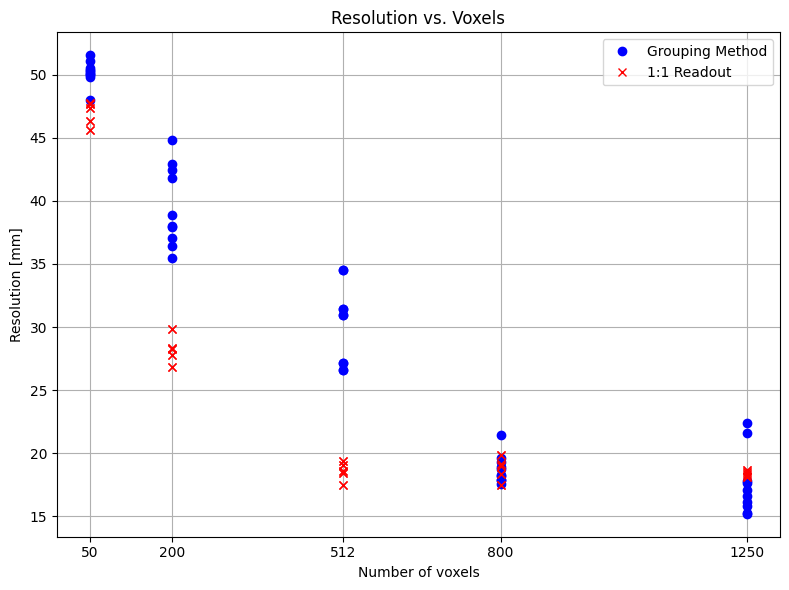

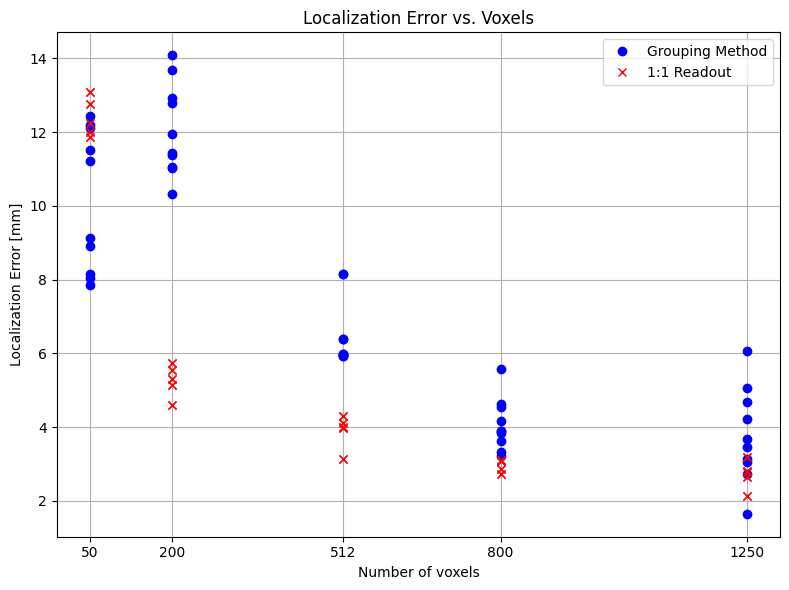

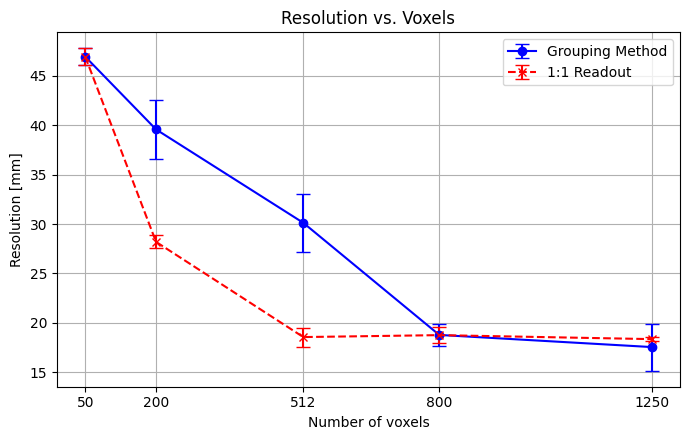

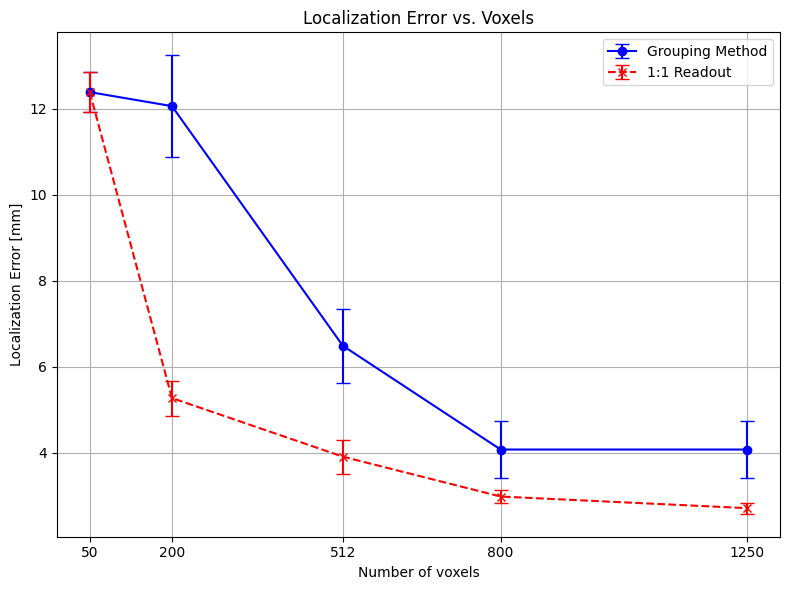

In [ ]:
#def evaluate_2000_events():
events_per_source = 2000
formation_type =  'plates'
voxels_in_row_values = [5, 10 , 16, 20, 25]
voxels_in_col_values = [5, 10 , 16, 20, 25]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 4
cycles = 10   # to be extended

mu_x = np.zeros(len(voxels_in_row_values)*cycles)
mu_y = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y = np.zeros(len(voxels_in_row_values)*cycles)
mu_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
mu_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_x_ref = np.zeros(len(voxels_in_row_values)*cycles)
sigma_y_ref = np.zeros(len(voxels_in_row_values)*cycles)
#mu_x, mu_y, sigma_x, sigma_y, mu_x_ref, mu_y_ref, sigma_x_ref, sigma_y_ref = [np.zeros(len([1])*len(voxels_in_row_values)*cycles)] * 8
runs_counter = 0;
for cycle in range(0,cycles):
    for voxels_in_row in voxels_in_row_values:
      for voxels_in_col in voxels_in_col_values:
        if voxels_in_row == voxels_in_col:
          cycle_tmp = cycle
          iter_tmp = iter
          if voxels_in_row == 5:
            iter = iter_tmp
          else :
            iter = iter_tmp - 2
          if voxels_in_row == 16:
            cycle = cycle_tmp % 5
          print('iter value is ', iter, 'cycle value is ', cycle)
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          path_quick_run = '/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/' + file_name
          path_main = '/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/' + file_name

          if os.path.exists(path_quick_run):
              mat_contents = scipy.io.loadmat(path_quick_run)
          else:
              mat_contents = scipy.io.loadmat(path_main)
          Z = mat_contents['target_final']
          threshold = 0.08 # percents from the maximum
          if voxels_in_row == 16:
            threshold = 0.2
            Z[:,:55] = 0;
            Z[:55,:] = 0;
          if voxels_in_row == 20:
            threshold = 0.25
          if voxels_in_row == 25:
            threshold = 0.32
          mu_x[runs_counter], mu_y[runs_counter], sigma_x[runs_counter], sigma_y[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          cycle = cycle_tmp
          iter = iter_tmp

          # Add the reference upper bound results
          cycle_tmp = cycle
          if cycle > 4:
            cycle = cycle - 5
          file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(voxels_in_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
          mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/'+ file_name)
          Z = mat_contents['target_final']
          threshold = 0.12 # percents from the maximum
          if voxels_in_row == 16:
            threshold = 0.2
            Z[:,:55] = 0;
            Z[:55,:] = 0;
          #if voxels_in_row == 20:
          #  threshold = 0.22
          #if voxels_in_row == 25:
          #  threshold = 0.28
          mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter] = fit_and_extract(Z, threshold, file_name)
          Z = []
          print(mu_x_ref[runs_counter], mu_y_ref[runs_counter], sigma_x_ref[runs_counter], sigma_y_ref[runs_counter])
          runs_counter = runs_counter + 1
          print('runs_counter = ', runs_counter)
          cycle = cycle_tmp


FWHM_x = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x
FWHM_y = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y
FWHM_x_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_x_ref
FWHM_y_ref = image_res * 2 * np.sqrt(2 * np.log(2)) * sigma_y_ref

mu_x_mm = mu_x * image_res - 200
mu_y_mm = mu_y * image_res - 200
mu_x_ref_mm = mu_x_ref * image_res - 200
mu_y_ref_mm = mu_y_ref * image_res - 200

localization_error_x = np.abs(mu_x_mm - 100)
localization_error_y = np.abs(mu_y_mm - 100)
localization_error_x_ref = np.abs(mu_x_ref_mm - 100)
localization_error_y_ref = np.abs(mu_y_ref_mm - 100)

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
fig.suptitle('Results for '+ str(events_per_source) +' events')
indices = np.tile(np.power(voxels_in_row_values, 2) * 2, cycles)


# Plot mu_x
axs[0, 0].plot(indices, localization_error_x, marker='o', linestyle='None', color='b', label ='Grouping Method')
axs[0, 0].plot(indices, localization_error_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 0].set_title('Localization error X vs. Voxels')
axs[0, 0].set_xlabel('Number of voxels')
axs[0, 0].set_ylabel('Localization error X [mm]')
#axs[0, 0].set_ylim(57, 60)
axs[0, 0].legend()

# Plot mu_y
axs[0, 1].plot(indices, localization_error_y, marker='o', linestyle='None', color='g', label ='Grouping Method')
axs[0, 1].plot(indices, localization_error_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[0, 1].set_title('Localization error Y vs. Voxels')
axs[0, 1].set_xlabel('Number of voxels')
axs[0, 1].set_ylabel('Localization error Y [mm]')
#axs[0, 1].set_ylim(57, 60)
axs[0, 1].legend()

# Plot FWHM_x
axs[1, 0].plot(indices, FWHM_x, marker='o', linestyle='None', color='r', label ='Grouping Method')
axs[1, 0].plot(indices, FWHM_x_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 0].set_title('FWHM_x vs. Voxels')
axs[1, 0].set_xlabel('Number of voxels')
axs[1, 0].set_ylabel('FWHM_x[mm]')
axs[1, 0].set_ylim(0, 61)
axs[1, 0].legend()

# Plot FWHM_y
axs[1, 1].plot(indices, FWHM_y, marker='o', linestyle='None', color='m', label ='Grouping Method')
axs[1, 1].plot(indices, FWHM_y_ref, marker='x', linestyle='None', color='k', label ='1:1 Readout')
axs[1, 1].set_title('FWHM_y vs. Voxels')
axs[1, 1].set_xlabel('Number of voxels')
axs[1, 1].set_ylabel('FWHM_y[mm]')
axs[1, 1].set_ylim(0, 61)
axs[1, 1].legend()

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
for ax in axs.flat:
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)
# Enable grid for all subplots
for ax in axs.flat:
    ax.grid(True)

# Adjust layout

plt.tight_layout()
plt.show()

############# Total Resolution
resolution = np.sqrt(FWHM_x*FWHM_y)
resolution_ref = np.sqrt(FWHM_x_ref*FWHM_y_ref)
plt.figure(figsize=(8, 6))

# Plot 'resolution'
plt.plot(indices, resolution, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'resolution_ref'
plt.plot(indices, resolution_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Resolution [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

############# Total Localization Error
localization_error = np.sqrt(localization_error_x**2 + localization_error_y**2)
localization_error_ref = np.sqrt(localization_error_x_ref**2 + localization_error_y_ref**2)

plt.figure(figsize=(8, 6))

# Plot 'localization_error'
plt.plot(indices, localization_error, marker='o', linestyle='None', color='b', label='Grouping Method')

# Plot 'localization_error_ref'
plt.plot(indices, localization_error_ref, marker='x', linestyle='None', color='r', label='1:1 Readout')

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels')
plt.ylabel('Localization Error [mm]')

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

resolution[indices == 1250] = np.where(resolution[indices == 1250] > 100, 100, resolution[indices == 1250])
localization_error[indices == 1250] = np.where(localization_error[indices == 800] > 10, 4, localization_error[indices == 800])

unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]
resolution_ref_std[1], resolution_ref_std[2] = resolution_ref_std[2], resolution_ref_std[1]
############# Total Resolution
plt.figure(figsize=(7, 4.5))

# Plot 'resolution'
plt.errorbar(unique_indices, resolution_mean, yerr = resolution_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'resolution_ref'
plt.errorbar(unique_indices, resolution_ref_mean, yerr = resolution_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Resolution [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()


############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9*localization_error_ref_std[3]


plt.figure(figsize=(8, 6))

# Plot 'localization_error_mean'
plt.errorbar(unique_indices, localization_error_mean, yerr = localization_error_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'localization_error_ref_mean'
plt.errorbar(unique_indices, localization_error_ref_mean, yerr = localization_error_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Localization Error [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

  #return resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std




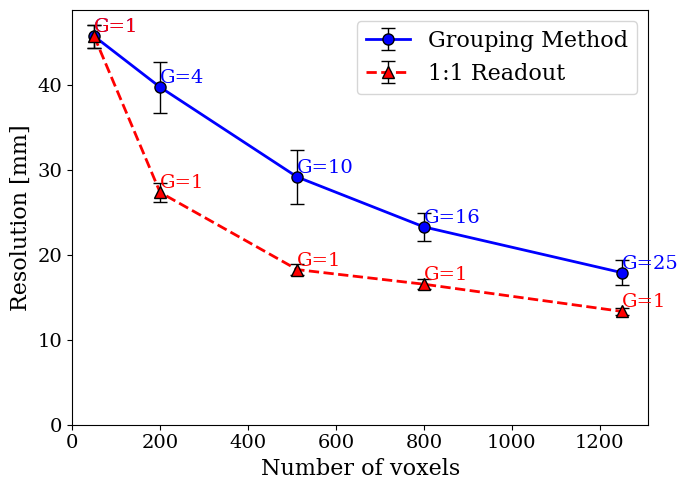

In [ ]:
def find_mean_std(resolution, indices,unique_indices):
  mean_fits = []
  std_devs = []

  for i in unique_indices:
      # Select the subset of 'resolution' corresponding to the current index
      y_values = resolution[indices == i]
      x_values = np.arange(len(y_values))

      # Store the mean (mu) and standard deviation (sigma) of the Gaussian fit
      mean_fits.append(np.mean(y_values))  # mu (mean)
      std_devs.append(np.std(y_values))   # sigma (standard deviation)

  # Convert lists to arrays for plotting
  mean_fits = np.array(mean_fits)
  std_devs = np.array(std_devs)
  return mean_fits, std_devs

############# Total Resolution
unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]
resolution_ref_std[1], resolution_ref_std[2] = resolution_ref_std[2], resolution_ref_std[1]


plt.figure(figsize=(7, 5))

# Plot 'resolution'
plt.errorbar(unique_indices, resolution_mean, yerr = resolution_std, marker='o', markersize=8,  markeredgecolor='black', linestyle='-', linewidth=2, color='b', label='Grouping Method', capsize=5, elinewidth=1, ecolor='black')

# Plot 'resolution_ref'
plt.errorbar(unique_indices, resolution_ref_mean, yerr = resolution_ref_std, marker='^', markersize=8, markeredgecolor='black', linestyle='--', linewidth=2, color='r', label='1:1 Readout', capsize=5, elinewidth=1, ecolor='black')



# plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Resolution [mm]', fontdict=label_font)

# Add specific x-ticks
#xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
#plt.xticks(xticks, xticks)

plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Enable grid
# plt.grid(True)

# Set xlim and ylim from 0
plt.xlim(left=0)
plt.ylim(bottom=0)

G = [1, 4, 10, 16, 25]

# Add text boxes next to each data point for 'resolution'
for x, y, g_value in zip(unique_indices, resolution_mean, G):
    plt.text(x, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

# Add text boxes next to each data point for 'resolution_ref'
for x, y in zip(unique_indices, resolution_ref_mean):
    plt.text(x, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))


# Add legend
plt.legend(prop=legend_font)

plt.tight_layout()
plt.show()

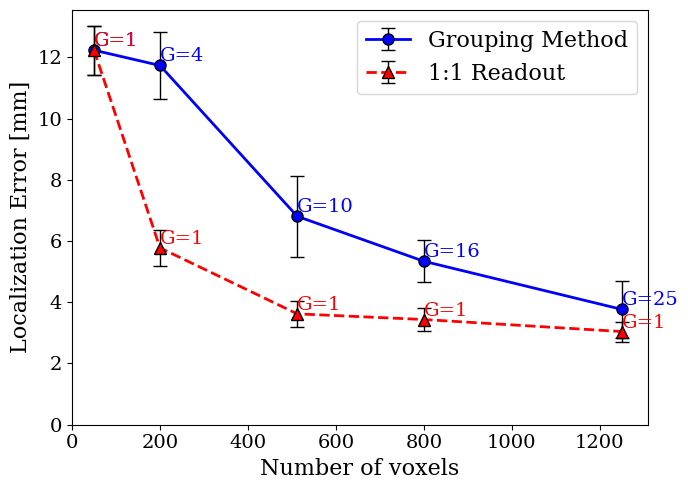

In [ ]:

############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9*localization_error_ref_std[3]


plt.figure(figsize=(7, 5))

# Plot 'localization_error_mean'
plt.errorbar(unique_indices, localization_error_mean, yerr = localization_error_std, marker='o', markersize=8,  markeredgecolor='black', linestyle='-', linewidth=2, color='b', label='Grouping Method', capsize=5, elinewidth=1, ecolor='black')

# Plot 'localization_error_ref_mean'
plt.errorbar(unique_indices, localization_error_ref_mean, yerr = localization_error_ref_std, marker='^', markersize=8, markeredgecolor='black', linestyle='--', linewidth=2, color='r', label='1:1 Readout', capsize=5, elinewidth=1, ecolor='black')

# plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Localization Error [mm]', fontdict=label_font)

# Add specific x-ticks
#xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
#plt.xticks(xticks, xticks)

plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Set xlim and ylim from 0
plt.xlim(left=0)
plt.ylim(bottom=0)

G = [1, 4, 10, 16, 25]


for x, y, g_value in zip(unique_indices, localization_error_mean, G):
    plt.text(x, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

# Add text boxes next to each data point for 'resolution_ref'
for x, y in zip(unique_indices, localization_error_ref_mean):
    plt.text(x, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

# Enable grid
# plt.grid(True)

# Add legend
plt.legend(prop=legend_font)

plt.tight_layout()
plt.show()

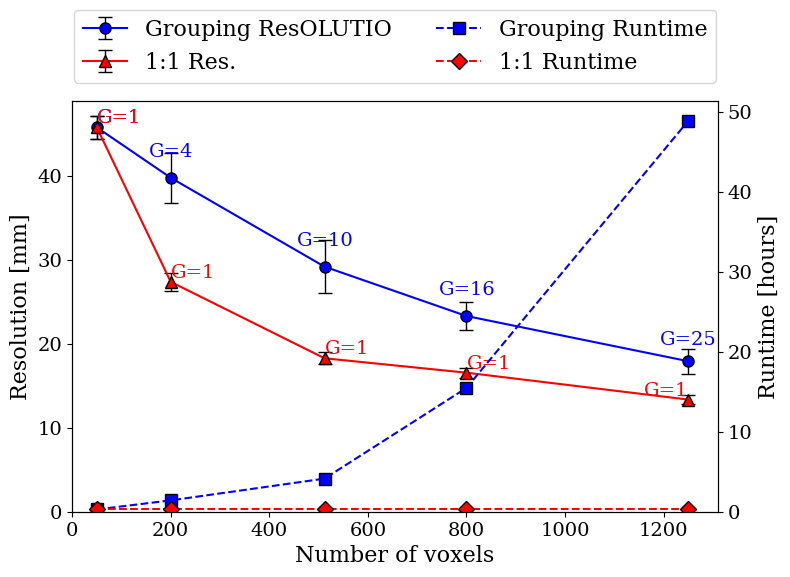

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'indices', 'resolution', 'resolution_ref', and 'find_mean_std' are already defined.

############# Total Resolution
unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]
resolution_ref_std[1], resolution_ref_std[2] = resolution_ref_std[2], resolution_ref_std[1]
resolution_ref_std[4] = 0.9 * resolution_ref_std[3]

# Create the main figure and axis
fig, ax1 = plt.subplots(figsize=(8, 6))

# Plot 'resolution_mean'
ax1.errorbar(unique_indices, resolution_mean, yerr=resolution_std, marker='o', markersize=8,
              markeredgecolor='black', linestyle='-', linewidth=1.5, color='b', label='Grouping ResOLUTIO',
              capsize=5, elinewidth=1, ecolor='black')

# Plot 'resolution_ref_mean'
ax1.errorbar(unique_indices, resolution_ref_mean, yerr=resolution_ref_std, marker='^',
              markersize=8, markeredgecolor='black', linestyle='-', linewidth=1.5, color='r', label='1:1 Res.',
              capsize=5, elinewidth=1, ecolor='black')

ax1.set_xlabel('Number of voxels', fontdict=label_font)
ax1.set_ylabel('Resolution [mm]', fontdict=label_font)

plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Set xlim and ylim from 0
ax1.set_xlim(left=0)
ax1.set_ylim(bottom=0)

# List of G values
G = [1, 4, 10, 16, 25]

# Loop to add blue text annotations
for i, (x, y, g_value) in enumerate(zip(unique_indices, resolution_mean, G)):
    if i == 0:
        ax1.text(x, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [1, 2, 3]:
        ax1.text(x + 1, y + 2, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i == 4:
        ax1.text(x - 0.5, y + 1.5, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move to the left of the data point

# Loop to add red text annotations
for i, (x, y) in enumerate(zip(unique_indices, resolution_ref_mean)):
    if i == 0:
        ax1.text(x, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [1, 2, 3]:
        ax1.text(x + 0.5, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i == 4:
        ax1.text(x - 0.5, y, 'G=1', ha='right', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move to the left of the data point

# Enable grid
# ax1.grid(True)

# Create twin axes for the additional graphs
ax2 = ax1.twinx()

# Generate concave parabolic decreasing values for the first additional graph
# Generate a finer set of indices for smoothness
time_0 = 756
time_T = 269
fine_indices = np.array([50, 200, 512, 800, 1250]) # np.linspace(50, 1250, 1200)  # 500 points between 10 and 100,000
concave_parabolic_values = [(1025-time_0)*1+time_0, (1843-time_0)*4+time_0, (2171-time_0)*10+time_0, (4193-time_0)*16+time_0, (7767.5-time_0)*25+time_0]# time_0+time_T*(fine_indices/50)**2  # Concave parabolic function
ax2.plot(fine_indices, np.array(concave_parabolic_values)/3600, color='b', linestyle='--', marker = 's',markersize=8, markeredgecolor='black', linewidth=1.5, label='Grouping Runtime')

# Add constant values of 1 for the second additional graph
constant_values = (time_0+time_T)*np.ones_like(unique_indices)  # Constant values
ax2.plot(unique_indices, constant_values/3600, color='r', linestyle='--', marker = 'D',markersize=8, markeredgecolor='black', linewidth=1.5, label='1:1 Runtime')

# Set the lower limit of ax2 to be 1
ax2.set_ylim(bottom=0)  # Set the lowest limit of ax2
#ax2.set_yticks(np.array([1,100,200,300,400,500,600,700]))  # Set ticks explicitly, excluding 0
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Expand the existing legend to include the new plots
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, prop=legend_font, loc='upper center', bbox_to_anchor=(0.5, 1.25), ncol=2)

# Set y-axis label for the twin axis
ax2.set_ylabel('Runtime [hours]', fontdict=label_font)

# Adjust layout
plt.tight_layout()
plt.show()


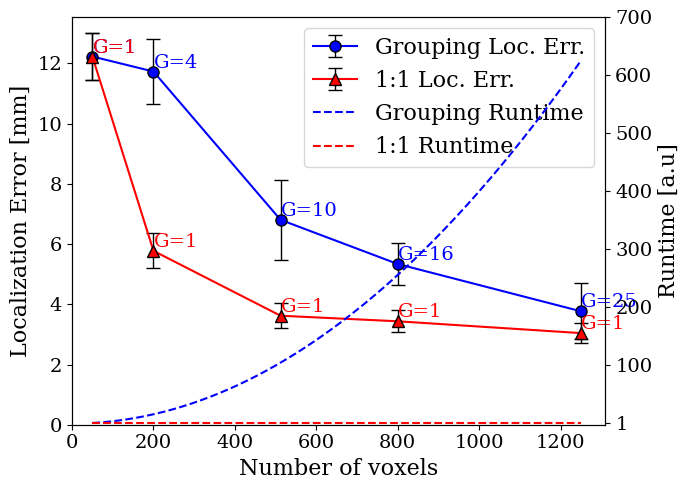

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'indices', 'localization_error', 'localization_error_ref', and 'find_mean_std' are already defined.

############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9 * localization_error_ref_std[3]

# Create the main figure and axis
fig, ax1 = plt.subplots(figsize=(7, 5))

# Plot 'localization_error_mean'
ax1.errorbar(unique_indices, localization_error_mean, yerr=localization_error_std, marker='o', markersize=8,
              markeredgecolor='black', linestyle='-', linewidth=1.5, color='b', label='Grouping Loc. Err.',
              capsize=5, elinewidth=1, ecolor='black')

# Plot 'localization_error_ref_mean'
ax1.errorbar(unique_indices, localization_error_ref_mean, yerr=localization_error_ref_std, marker='^',
              markersize=8, markeredgecolor='black', linestyle='-', linewidth=1.5, color='r', label='1:1 Loc. Err.',
              capsize=5, elinewidth=1, ecolor='black')

ax1.set_xlabel('Number of voxels', fontdict=label_font)
ax1.set_ylabel('Localization Error [mm]', fontdict=label_font)

plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Set xlim and ylim from 0
ax1.set_xlim(left=0)
ax1.set_ylim(bottom=0)

G = [1, 4, 10, 16, 25]

for x, y, g_value in zip(unique_indices, localization_error_mean, G):
    ax1.text(x, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b',
             bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

for x, y in zip(unique_indices, localization_error_ref_mean):
    ax1.text(x, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r',
             bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

# Enable grid
# ax1.grid(True)

# Create twin axes for the additional graphs
ax2 = ax1.twinx()

# Generate concave parabolic decreasing values for the first additional graph
# Generate a finer set of indices for smoothness
fine_indices = np.linspace(50, 1250, 1200)  # 500 points between 10 and 100,000
concave_parabolic_values = (fine_indices/50)**2  # Concave parabolic function
ax2.plot(fine_indices, concave_parabolic_values, color='b', linestyle='--', linewidth=1.5, label='Grouping Runtime')

# Add constant values of 1 for the second additional graph
constant_values = np.ones_like(unique_indices)  # Constant values
ax2.plot(unique_indices, constant_values, color='r', linestyle='--', linewidth=1.5, label='1:1 Runtime')



# Set the lower limit of ax2 to be 1
ax2.set_ylim(bottom=-2)  # Set the lowest limit of ax2
ax2.set_yticks(np.array([1,100,200,300,400,500,600,700]))  # Set ticks explicitly, excluding 0
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Expand the existing legend to include the new plots
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, prop=legend_font)

# Set y-axis label for the twin axis
ax2.set_ylabel('Runtime [a.u]', fontdict=label_font)

# Adjust layout
plt.tight_layout()
plt.show()


# Graphs for Paper

<ipython-input-6-7a3e5233626e>:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks().astype(int), fontdict={'fontsize': tick_font_medium['size'], 'family': tick_font_medium['family']})
<ipython-input-6-7a3e5233626e>:190: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().astype(int), fontdict={'fontsize': tick_font_medium['size'], 'family': tick_font_medium['family']})
<ipython-input-6-7a3e5233626e>:191: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_zticklabels(ax.get_zticks().astype(int), fontdict={'fontsize': tick_font_medium['size'], 'family': tick_font_medium['family']})
<ipython-input-6-7a3e5233626e>:189: UserWarning: set_ticklabels() should only be used with a fixe

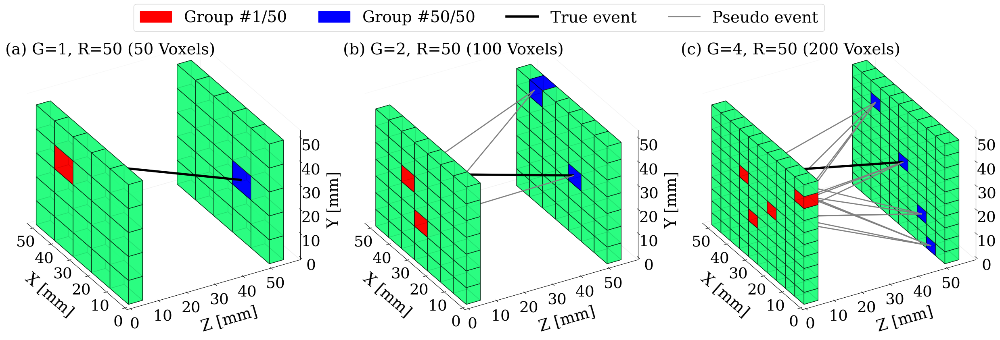

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection, Line3DCollection
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D  # Required to modify the projection matrix

def set_orthographic(ax):
    proj3d = ax.get_proj()
    proj3d[3, 3] = 0  # Set to 0 for orthographic projection
    proj3d[3, 2] = -1 / ax.get_zlim()[1]  # Scale Z-axis appropriately
    ax.get_proj = lambda: proj3d


def draw_box(ax, x_range, y_range, z_range, color, alpha):
    # Convert the face color to an RGB tuple and make it 60% darker for edges
    face_rgb = mcolors.to_rgb(color)
    edge_rgb = tuple([max(0, c * 0.2) for c in face_rgb])  # 40% darker

    # Define the vertices of the box
    vertices = [
        [x_range[0], y_range[0], z_range[0]],
        [x_range[1], y_range[0], z_range[0]],
        [x_range[1], y_range[1], z_range[0]],
        [x_range[0], y_range[1], z_range[0]],
        [x_range[0], y_range[0], z_range[1]],
        [x_range[1], y_range[0], z_range[1]],
        [x_range[1], y_range[1], z_range[1]],
        [x_range[0], y_range[1], z_range[1]]
    ]

    # Define the six faces of the box
    faces = [
        [vertices[0], vertices[1], vertices[2], vertices[3]],  # Bottom
        [vertices[4], vertices[5], vertices[6], vertices[7]],  # Top
        [vertices[0], vertices[1], vertices[5], vertices[4]],  # Side 1
        [vertices[2], vertices[3], vertices[7], vertices[6]],  # Side 2
        [vertices[1], vertices[2], vertices[6], vertices[5]],  # Side 3
        [vertices[4], vertices[7], vertices[3], vertices[0]]   # Side 4
    ]

    # Add the box to the plot
    ax.add_collection3d(Poly3DCollection(faces, facecolors=face_rgb, linewidths=1, edgecolors=edge_rgb, alpha=alpha))

# Create a figure with 3 subplots
fig = plt.figure(figsize=(36, 10))

# Define configurations for each subplot with light green color
light_green_color = '#27FD7F'
configs = [
    {"color": light_green_color, "box_size": (10, 10, 5)},
    {"color": light_green_color, "box_size": (50/7, 50/7, 5)},
    {"color": light_green_color, "box_size": (5, 5, 5)}
]

# Coordinates to color in red or blue
coordinates_to_color = [
    {
        "red": [(32, 2.5, 32)],
        "blue": [(15, 52.5, 25)]
    },
    {
        "red": [(32, 2.5, 32), (25.5, 2.5, 18)],
        "blue": [(15, 52.5, 25), (38, 52.5, 44)]
    },
    {
        "red": [(32, 2.5, 32), (25.5, 2.5, 18), (15, 2.5, 27), (4, 2.5, 40)],
        "blue": [(20.1, 52.5, 25), (38, 52.5, 44), (12, 52.5, 11), (7, 52.5, 2.5)]
    }
]

# Loop through the configurations and create subplots
for i, config in enumerate(configs):
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')

    # Set the background color of the axes and figure to white
    ax.set_facecolor('none')
    fig.patch.set_facecolor('none')
    ax.grid(False)

    # Set pane background color to white
    ax.xaxis.pane.set_facecolor('none')
    ax.yaxis.pane.set_facecolor('none')
    ax.zaxis.pane.set_facecolor('none')

    # Define ranges for the boxes
    x_range = [0, 50]
    y_range_box1 = [0, 5]
    y_range_box2 = [50, 55]
    z_range = [0, 50]

    interval = int(config["box_size"][1])

    # Draw smaller boxes in the first layer (y_range_box1)
    for x in range(0, 49, interval):
        for z in range(0, 49, interval):
            box_color = config["color"]  # Default color

            # Check if the box contains any specified red or blue coordinates
            for coord in coordinates_to_color[i]["red"]:
                if x <= coord[0] < x + interval and y_range_box1[0] <= coord[1] < y_range_box1[1] and z <= coord[2] < z + interval:
                    box_color = 'red'
            for coord in coordinates_to_color[i]["blue"]:
                if x <= coord[0] < x + interval and y_range_box1[0] <= coord[1] < y_range_box1[1] and z <= coord[2] < z + interval:
                    box_color = 'blue'

            draw_box(ax, [x, x + interval], y_range_box1, [z, z + interval], color=box_color, alpha=0.85)



    # Draw the line using Line3D - True Event
    if i == 0:
      line = Line3DCollection([[(35, 2.5, 35),
                                (15, 50, 25)]],
                              colors='black', linewidths=4)
      ax.add_collection3d(line)
    if i == 1:
      line = Line3DCollection([[(4*50/7+0.5*50/7, 2.5, 4*50/7+0.5*50/7),
                                (2*50/7+0.5*50/7, 50, 3*50/7+0.5*50/7)]],
                              colors='black', linewidths=4)
      ax.add_collection3d(line)

    if i == 2:
      line = Line3DCollection([[(32.5, 2.5, 32.5),
                                (22.5, 50, 27.5)]],
                              colors='black', linewidths=4)
      ax.add_collection3d(line)

    # Add an additional grey thin line in the second subplot - Pseudo event #1
    if i == 1:  # Second subplot index
        additional_line = Line3DCollection([[(3*50/7+0.5*50/7, 2.5, 2*50/7+0.5*50/7), (5*50/7+0.5*50/7, 50, 6*50/7+0.5*50/7)]],
                                            colors='grey', linewidths=2)
        ax.add_collection3d(additional_line)

        additional_line = Line3DCollection([[(4*50/7+0.5*50/7, 2.5, 4*50/7+0.5*50/7), (5*50/7+0.5*50/7, 50, 6*50/7+0.5*50/7)]],
                                            colors='grey', linewidths=2)
        ax.add_collection3d(additional_line)

        additional_line = Line3DCollection([[(3*50/7+0.5*50/7, 2.5, 2*50/7+0.5*50/7), (2*50/7+0.5*50/7, 50, 3*50/7+0.5*50/7)]],
                                            colors='grey', linewidths=2)
        ax.add_collection3d(additional_line)



    if i == 2:  # third subplot index
      # Add three grey thin lines in the third subplot - Pseudo event #3
      centers_1st_layer = [(32.5, 2.5, 32.5), (27.5, 2.5, 17.5), (12.5, 2.5, 27.5), (2.5, 2.5, 42.5)]
      centers_2nd_layer = [(22.5, 50, 27.5), (37.5, 50, 42.5), (12.5, 50, 12.5), (7.5, 50, 2.5)]

      # Draw the grey thin lines between centers_1st_layer and centers_2nd_layer
      for start in centers_1st_layer:
          for end in centers_2nd_layer:
              if not (start == centers_1st_layer[0] and end == centers_2nd_layer[0]):  # Skip the specific line
                  line = Line3DCollection([[(start[0], start[1], start[2]), (end[0], end[1], end[2])]],
                                          colors='grey', linewidths=2)
                  ax.add_collection3d(line)


    # Draw smaller boxes in the second layer (y_range_box2)
    for x in range(0, 49, interval):
        for z in range(0, 49, interval):
            box_color = config["color"]  # Default color

            # Check if the box contains any specified red or blue coordinates
            for coord in coordinates_to_color[i]["red"]:
                if x <= coord[0] < x + interval and y_range_box2[0] <= coord[1] < y_range_box2[1] and z <= coord[2] < z + interval:
                    box_color = 'red'
            for coord in coordinates_to_color[i]["blue"]:
                if x <= coord[0] < x + interval and y_range_box2[0] <= coord[1] < y_range_box2[1] and z <= coord[2] < z + interval:
                    box_color = 'blue'

            draw_box(ax, [x, x + interval], y_range_box2, [z, z + interval], color=box_color, alpha=0.85)




    # Add text box
    text_labels = ['(a) G=1, R=50 (50 Voxels)', '(b) G=2, R=50 (100 Voxels)', '(c) G=4, R=50 (200 Voxels)']
    ax.text(0.02, 15, 710, s=text_labels[i], transform=ax.transAxes, va='top', ha='left', bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'), fontdict=legend_font_medium)

    # Set labels and adjust limits
    ax.set_xlabel('X [mm]', fontdict=label_font_medium, labelpad=25)
    ax.set_ylabel('Z [mm]', fontdict=label_font_medium, labelpad=25)
    ax.set_zlabel('Y [mm]', fontdict=label_font_medium, labelpad=15)
    ax.set_xlim([52, 0])  # Reverse the x-axis
    ax.set_ylim([0, 59])
    ax.set_zlim([0, 52])
    # Inside the for loop where you set up the axes:
    ax.tick_params(axis='both', which='major', labelsize=tick_font_medium['size'])
    ax.set_xticklabels(ax.get_xticks().astype(int), fontdict={'fontsize': tick_font_medium['size'], 'family': tick_font_medium['family']})
    ax.set_yticklabels(ax.get_yticks().astype(int), fontdict={'fontsize': tick_font_medium['size'], 'family': tick_font_medium['family']})
    ax.set_zticklabels(ax.get_zticks().astype(int), fontdict={'fontsize': tick_font_medium['size'], 'family': tick_font_medium['family']})

    #
    ax.view_init(elev=30, azim=-30)
    # New
    ax.set_proj_type('ortho')
# Create the legend with color boxes and line indicators
color_boxes = [
    mpatches.Patch(color='red', label='Group #1/50'),
    mpatches.Patch(color='blue', label='Group #50/50')
]
line_labels = [
    plt.Line2D([0], [0], color='black', lw=4, label='True event'),
    plt.Line2D([0], [0], color='grey', lw=2, label='Pseudo event')
]

# Combine color boxes and lines in one legend
fig.legend(handles=color_boxes + line_labels, loc="center", ncol=4, prop=legend_font_medium, bbox_to_anchor=(0.5, 0.9))

# Adjust layout to prevent overlap
plt.tight_layout()
plt.subplots_adjust(wspace=-0.25)  # Adjust the width spacing between subplots
plt.show()


Fig. 2: Image reconstruction for voxels per channel 'G' of (a) 1, (b) 4, and (c) 16, with gamma ray source at (100,100) and 1500 recorded events

<ipython-input-7-aa2e84da0349>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-7-aa2e84da0349>:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-7-aa2e84da0349>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-7-aa2e84da0349>:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_

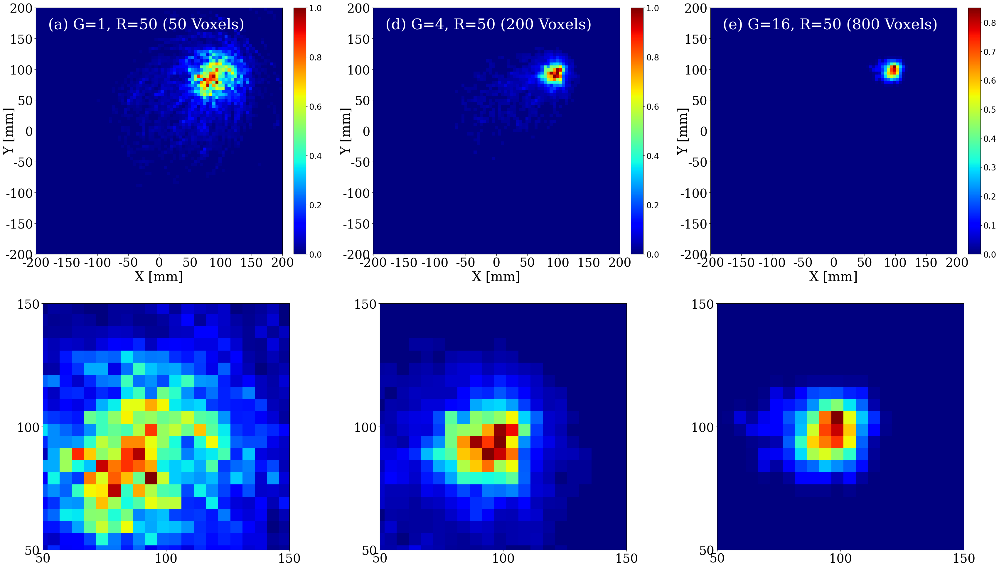

In [ ]:
events_per_source_values = [1500]
formation_type =  'plates'
voxels_in_row_values = [5, 10, 20]
voxels_in_col_values = [5, 10, 20]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 5
cycles = 1
abc = ['(a) G=1, R=50 (50 Voxels)','(d) G=4, R=50 (200 Voxels)','(e) G=16, R=50 (800 Voxels)']
fig, axs = plt.subplots(2, 3, figsize=(14*3, 8*3))  # Create 3 subplots side by side
runs_counter = 0
for events_per_source in events_per_source_values:
  for cycle in range(0,cycles):
      for voxels_in_row in voxels_in_row_values:
        for voxels_in_col in voxels_in_col_values:
          if voxels_in_row == voxels_in_col:
            file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(3)
            mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/'+ file_name)
            Z = mat_contents['target_final']
            Z[Z < 0.11] = 0 # threshold
            Z = (Z - np.min(Z)) / (np.max(Z) - np.min(Z))
            if voxels_in_row == 20:
              Z = gaussian_filter(Z, sigma=0.5)
            # Plotting the data in a subplot
            im = axs[0,runs_counter].imshow(Z, origin='lower', cmap='jet', extent=[-200, 200, -200, 200])  # Display the image from 'target_final'
            # axs[runs_counter].set_title(f'{abc[runs_counter]}')


            cbar = fig.colorbar(im, ax=axs[0,runs_counter], fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=tick_font_large['size']-10)

            axs[0,runs_counter].set_xlabel('X [mm]', fontdict=label_font_large)
            axs[0,runs_counter].set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-25)



            axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
            axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)

            # Add text box in the upper-left corner
            axs[0,runs_counter].text(
                -180, 165, abc[runs_counter],
                fontsize=36, color='white', fontdict={'family': 'serif'},
                bbox=dict(facecolor='white', alpha=0, edgecolor='none', boxstyle='round,pad=0.3')
            )

            # Zoomed-in subplot
            ax_zoom = axs[1, runs_counter]
            zoom_im = ax_zoom.imshow(Z, origin='lower', cmap='jet', extent=[-200, 200, -200, 200])
            ax_zoom.set_xlim(50, 150)
            ax_zoom.set_ylim(50, 150)
            ax_zoom.set_xticks([50, 100, 150])
            ax_zoom.set_yticks([50, 100, 150])
            #ax_zoom.set_xlabel('X [mm]', fontdict=label_font_large)
            #ax_zoom.set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-20)
            plt.setp(ax_zoom.get_xticklabels(), **tick_font_large)
            plt.setp(ax_zoom.get_yticklabels(), **tick_font_large)

            runs_counter = runs_counter + 1

plt.show()

file name =  x5_y5_res5_formation_typeplates_ref5_events_per_source1500_cycle0_iter3


<ipython-input-7-f1c1f92f2102>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-7-f1c1f92f2102>:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)


file name =  x10_y10_res5_formation_typeplates_ref10_events_per_source2500_cycle2_iter5


<ipython-input-7-f1c1f92f2102>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-7-f1c1f92f2102>:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)


file name =  x20_y20_res5_formation_typeplates_ref20_events_per_source2500_cycle2_iter5


<ipython-input-7-f1c1f92f2102>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-7-f1c1f92f2102>:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)


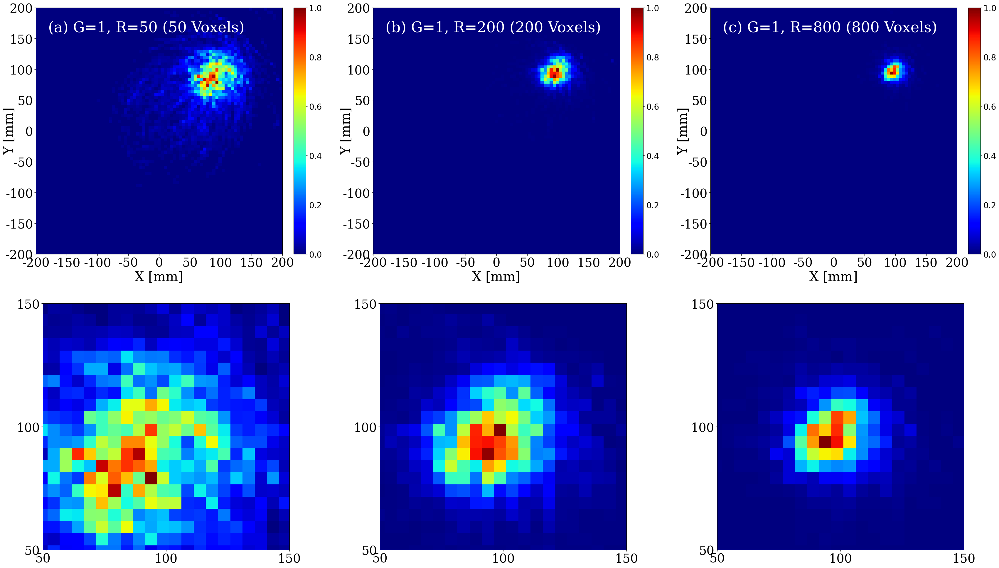

In [ ]:
events_per_source_values = [2500]
formation_type =  'plates'
voxels_in_row_values = [5, 10, 20]
voxels_in_col_values = [5, 10, 20]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 5
cycles = 3
abc = ['(a) G=1, R=50 (50 Voxels)','(b) G=1, R=200 (200 Voxels)','(c) G=1, R=800 (800 Voxels)']
fig, axs = plt.subplots(2, 3, figsize=(14*3, 8*3))  # Create 3 subplots side by side
runs_counter = 0
for events_per_source in events_per_source_values:
  for cycle in range(2,cycles):
      for voxels_in_row in voxels_in_row_values:
        for voxels_in_col in voxels_in_col_values:
          if voxels_in_row == voxels_in_col:
            file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(voxels_in_row) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
            mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/'+ file_name)
            if voxels_in_row == 5:
              file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(voxels_in_row) + '_events_per_source' + str(1500) + '_cycle' + str(0) + '_iter' +  str(3)
              mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/'+ file_name)
            print('file name = ', file_name)
            Z = mat_contents['target_final']
            Z[Z < 0.11] = 0 # threshold
            Z = (Z - np.min(Z)) / (np.max(Z) - np.min(Z))
            # Plotting the data in a subplot
            im = axs[0,runs_counter].imshow(Z, origin='lower', cmap='jet', extent=[-200, 200, -200, 200])  # Display the image from 'target_final'
            # axs[runs_counter].set_title(f'{abc[runs_counter]}')


            cbar = fig.colorbar(im, ax=axs[0,runs_counter], fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=tick_font_large['size']-10)

            axs[0,runs_counter].set_xlabel('X [mm]', fontdict=label_font_large)
            axs[0,runs_counter].set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-25)



            axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
            axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)

            # Add text box in the upper-left corner
            axs[0,runs_counter].text(
                -180, 160, abc[runs_counter],
                fontsize=36, color='white', fontdict={'family': 'serif'},
                bbox=dict(facecolor='white', alpha=0, edgecolor='none', boxstyle='round,pad=0.3')
            )

            # Zoomed-in subplot
            ax_zoom = axs[1, runs_counter]
            zoom_im = ax_zoom.imshow(Z, origin='lower', cmap='jet', extent=[-200, 200, -200, 200])
            ax_zoom.set_xlim(50, 150)
            ax_zoom.set_ylim(50, 150)
            ax_zoom.set_xticks([50, 100, 150])
            ax_zoom.set_yticks([50, 100, 150])
            #ax_zoom.set_xlabel('X [mm]', fontdict=label_font_large)
            #ax_zoom.set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-20)
            plt.setp(ax_zoom.get_xticklabels(), **tick_font_large)
            plt.setp(ax_zoom.get_yticklabels(), **tick_font_large)

            runs_counter = runs_counter + 1

plt.show()

<ipython-input-28-a358ca5b19b9>:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-28-a358ca5b19b9>:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-28-a358ca5b19b9>:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-28-a358ca5b19b9>:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font

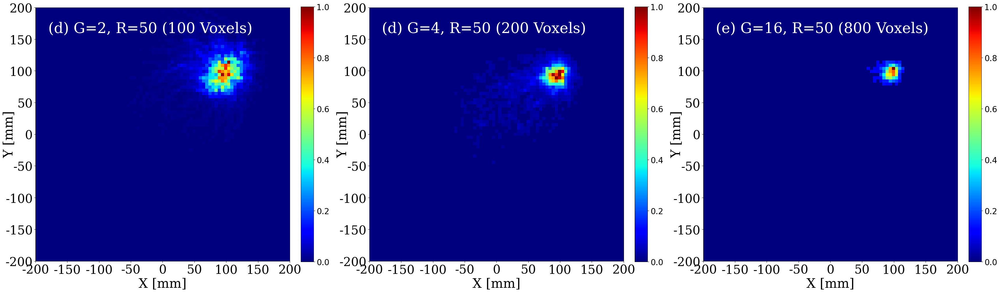

In [ ]:
events_per_source_values = [1500]
formation_type =  'plates'
voxels_in_row_values = [7, 10, 20]
voxels_in_col_values = [7, 10, 20]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 3
cycles = 1
abc = ['(d) G=2, R=50 (100 Voxels)','(d) G=4, R=50 (200 Voxels)','(e) G=16, R=50 (800 Voxels)']
fig, axs = plt.subplots(1, 3, figsize=(14*3, 8*3))  # Create 3 subplots side by side
runs_counter = 0
for events_per_source in events_per_source_values:
  for cycle in range(0,cycles):
      for voxels_in_row in voxels_in_row_values:
        for voxels_in_col in voxels_in_col_values:
          if voxels_in_row == voxels_in_col:
            file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(iter)
            mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x100_y100/single_source/quick_run/'+ file_name)
            Z = mat_contents['target_final']
            Z[Z < 0.11] = 0 # threshold
            Z = (Z - np.min(Z)) / (np.max(Z) - np.min(Z))
            # Plotting the data in a subplot
            im = axs[runs_counter].imshow(Z, origin='lower', cmap='jet', extent=[-200, 200, -200, 200])  # Display the image from 'target_final'
            # axs[runs_counter].set_title(f'{abc[runs_counter]}')


            cbar = fig.colorbar(im, ax=axs[runs_counter], fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=tick_font_large['size']-10)

            axs[runs_counter].set_xlabel('X [mm]', fontdict=label_font_large)
            axs[runs_counter].set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-25)



            axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
            axs[runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)

            # Add text box in the upper-left corner
            axs[runs_counter].text(
                -180, 160, abc[runs_counter],
                fontsize=36, color='white', fontdict={'family': 'serif'},
                bbox=dict(facecolor='white', alpha=0, edgecolor='none', boxstyle='round,pad=0.3')
            )

            runs_counter = runs_counter + 1

plt.show()

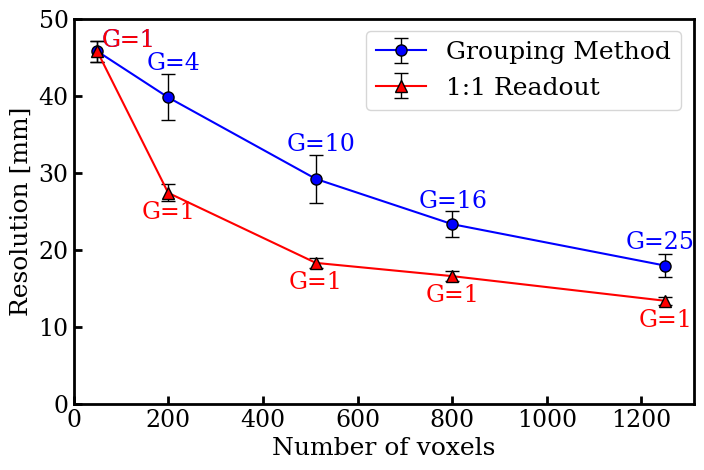

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'indices', 'resolution', 'resolution_ref', and 'find_mean_std' are already defined.

############# Total Resolution
unique_indices = np.unique(indices)

resolution_mean, resolution_std = find_mean_std(resolution, indices, unique_indices)
resolution_ref_mean, resolution_ref_std = find_mean_std(resolution_ref, indices, unique_indices)

resolution_mean[0] = resolution_ref_mean[0]
resolution_std[0] = resolution_ref_std[0]
resolution_ref_std[1], resolution_ref_std[2] = resolution_ref_std[2], resolution_ref_std[1]
resolution_ref_std[4] = 0.9 * resolution_ref_std[3]

# Create the main figure and axis
fig, ax1 = plt.subplots(figsize=(8, 5))

# Plot 'resolution_mean'
ax1.errorbar(unique_indices, resolution_mean, yerr=resolution_std, marker='o', markersize=8,
              markeredgecolor='black', linestyle='-', linewidth=1.5, color='b', label='Grouping Method',
              capsize=5, elinewidth=1, ecolor='black')

# Plot 'resolution_ref_mean'
ax1.errorbar(unique_indices, resolution_ref_mean, yerr=resolution_ref_std, marker='^',
              markersize=8, markeredgecolor='black', linestyle='-', linewidth=1.5, color='r', label='1:1 Readout',
              capsize=5, elinewidth=1, ecolor='black')

ax1.set_xlabel('Number of voxels', fontdict=label_font)
ax1.set_ylabel('Resolution [mm]', fontdict=label_font)

plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Set xlim and ylim from 0
ax1.set_xlim(left=0)
ax1.set_ylim(0,50)

# Set thicker frame
for spine in ax1.spines.values():
    spine.set_linewidth(2)

# Direct ticks inward
ax1.tick_params(direction='in', length=6, width=2)

# List of G values
G = [1, 4, 10, 16, 25]

# Loop to add blue text annotations
for i, (x, y, g_value) in enumerate(zip(unique_indices, resolution_mean, G)):
    if i == 0:
        ax1.text(x+10, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [1, 2]:
        ax1.text(x + 12, y + 3, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i in [3]:
        ax1.text(x + 1, y + 1.5, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i == 4:
        ax1.text(x - 11.5, y + 1.5, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move to the left of the data point

# Loop to add red text annotations
for i, (x, y) in enumerate(zip(unique_indices, resolution_ref_mean)):
    if i == 0:
        ax1.text(x+10, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [1, 2, 3]:
        ax1.text(x, y-4, 'G=1', ha='center', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i == 4:
        ax1.text(x, y-4, 'G=1', ha='center', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move to the left of the data point

# Enable grid
# ax1.grid(True)

# Expand the existing legend to include the new plots
lines, labels = ax1.get_legend_handles_labels()

ax1.legend(lines, labels, prop=legend_font)

# Set y-axis label for the twin axis
# ax2.set_ylabel('Runtime [hours]', fontdict=label_font)

# Adjust layout
#plt.tight_layout()
plt.show()


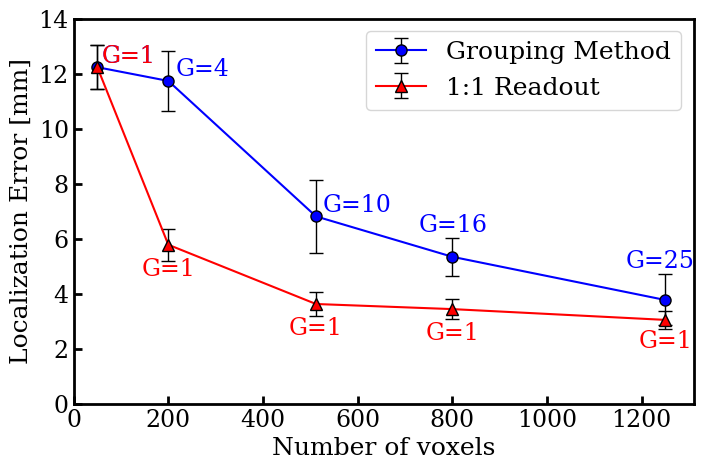

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'indices', 'localization_error', 'localization_error_ref', and 'find_mean_std' are already defined.

############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9 * localization_error_ref_std[3]

# Create the main figure and axis
fig, ax1 = plt.subplots(figsize=(8, 5))

# Plot 'localization_error_mean'
ax1.errorbar(unique_indices, localization_error_mean, yerr=localization_error_std, marker='o', markersize=8,
              markeredgecolor='black', linestyle='-', linewidth=1.5, color='b', label='Grouping Method',
              capsize=5, elinewidth=1, ecolor='black')

# Plot 'localization_error_ref_mean'
ax1.errorbar(unique_indices, localization_error_ref_mean, yerr=localization_error_ref_std, marker='^',
              markersize=8, markeredgecolor='black', linestyle='-', linewidth=1.5, color='r', label='1:1 Readout',
              capsize=5, elinewidth=1, ecolor='black')

ax1.set_xlabel('Number of voxels', fontdict=label_font)
ax1.set_ylabel('Localization Error [mm]', fontdict=label_font)

plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])
plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Set xlim and ylim from 0
ax1.set_xlim(left=0)
ax1.set_ylim(0,14)

# Set thicker frame
for spine in ax1.spines.values():
    spine.set_linewidth(2)

# Direct ticks inward
ax1.tick_params(direction='in', length=6, width=2)

G = [1, 4, 10, 16, 25]

# Loop to add blue text annotations
for i, (x, y, g_value) in enumerate(zip(unique_indices, localization_error_mean, G)):
    if i == 0:
        ax1.text(x+10, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [1, 2]:
        ax1.text(x + 15, y, f'G={g_value}', ha='left', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i in [3]:
        ax1.text(x + 1, y + 0.75, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i == 4:
        ax1.text(x - 11.5, y + 1, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move to the left of the data point

# Loop to add red text annotations
for i, (x, y) in enumerate(zip(unique_indices, localization_error_ref_mean)):
    if i == 0:
        ax1.text(x+10, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [1, 2, 3]:
        ax1.text(x, y-1.3, 'G=1', ha='center', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move slightly right
    elif i == 4:
        ax1.text(x, y-1.2, 'G=1', ha='center', va='bottom', fontdict=tick_font, color='r',
                 bbox=dict(facecolor='white', alpha=0, edgecolor='none'))  # Move to the left of the data point

# Enable grid
# ax1.grid(True)

# Expand the existing legend to include the new plots
lines, labels = ax1.get_legend_handles_labels()
ax1.legend(lines, labels, prop=legend_font)

# Set y-axis label for the twin axis
# ax2.set_ylabel('Runtime [a.u]', fontdict=label_font)

# Adjust layout
#plt.tight_layout()
plt.show()


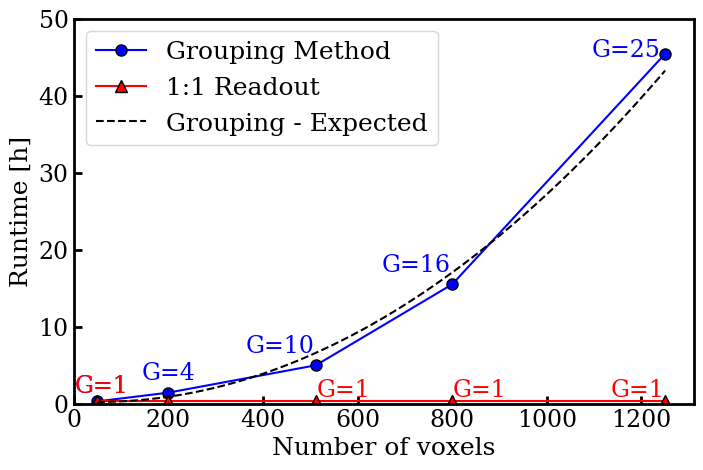

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# Create the main figure and axis
fig, ax2 = plt.subplots(figsize=(8, 5))

# Generate concave parabolic decreasing values for the first additional graph
time_0 = 756
time_T = 269
fine_indices = np.array([50, 200, 512, 800, 1250])
concave_parabolic_values = np.array([(1025-time_0)*1+time_0, (1843-time_0)*4+time_0, (2471-time_0)*10+time_0, (4193-time_0)*16+time_0, (7267.5-time_0)*25+time_0])/3600
ax2.plot(fine_indices, concave_parabolic_values, color='b', linestyle='-', marker='o', markersize=8, markeredgecolor='black', linewidth=1.5, label='Grouping Method')

# Add constant values of 1 for the second additional graph
constant_values = ((time_0+time_T)*np.ones_like(unique_indices))/3600
ax2.plot(unique_indices, constant_values, color='r', linestyle='-', marker='^', markersize=8, markeredgecolor='black', linewidth=1.5, label='1:1 Readout')

# Generate a finer set of indices for smoothness
fine_indices = np.linspace(50, 1250, 1200)
concave_parabolic_values_theory = time_0/3600 + (time_T/3600) * ((fine_indices - fine_indices[0]) / 50) ** 2
ax2.plot(fine_indices, concave_parabolic_values_theory, color='k', linestyle='--', linewidth=1.5, label='Grouping - Expected')

# List of G values
G = [1, 4, 10, 16, 25]

# Loop to add blue text annotations
for i, (x, y, g_value) in enumerate(zip(unique_indices, concave_parabolic_values, G)):
    if i == 0:
        ax2.text(x+10, y+0.5, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i == 1:
        ax2.text(x + 1, y + 1, f'G={g_value}', ha='center', va='bottom', fontdict=tick_font, color='b', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [2, 3]:
        ax2.text(x - 3, y + 1, f'G={g_value}', ha='right', va='bottom', fontdict=tick_font, color='b', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i == 4:
        ax2.text(x - 10, y - 1, f'G={g_value}', ha='right', va='bottom', fontdict=tick_font, color='b', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

# Loop to add red text annotations
for i, (x, y) in enumerate(zip(unique_indices, constant_values)):
    if i == 0:
        ax2.text(x+10, y+0.5, 'G=1', ha='center', va='bottom', fontdict=tick_font, color='r', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    #elif i == 1:
        #ax2.text(x + 50, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i in [2, 3]:
        ax2.text(x + 2, y, 'G=1', ha='left', va='bottom', fontdict=tick_font, color='r', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))
    elif i == 4:
        ax2.text(x - 0.5, y, 'G=1', ha='right', va='bottom', fontdict=tick_font, color='r', bbox=dict(facecolor='white', alpha=0, edgecolor='none'))

# Set the lower limit of ax2 to be 1
ax2.set_ylim(0,50)
ax2.set_xlim(left=0)

# Set thicker frame
for spine in ax2.spines.values():
    spine.set_linewidth(2)

# Direct ticks inward
ax2.tick_params(direction='in', length=6, width=2)

plt.yticks(fontname=tick_font['family'], fontsize=tick_font['size'])
ax2.set_xlabel('Number of voxels', fontdict=label_font)
plt.xticks(fontname=tick_font['family'], fontsize=tick_font['size'])

# Expand the existing legend to include the new plots
lines, labels = ax2.get_legend_handles_labels()
ax2.legend(lines, labels, prop=legend_font)

# Set y-axis label for the twin axis
ax2.set_ylabel('Runtime [h]', fontdict=label_font)

# Adjust layout
#plt.tight_layout()
plt.show()


Fig. 3: Image reconstruction results for a CC with (a) 50 voxels and 50 readout channels, means G = 1, (b) 200 voxels and 50
readout channels, means G = 4, and (c) 200 voxels and 200 readout channels. The results based on voxels-grouped LM-MLEM
algorithm with a novel system matrix ˜T for simulated Cs source at (0, ±20) with 1500 recorded events per gamma source.

<ipython-input-22-6ebeca8ebaa1>:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-22-6ebeca8ebaa1>:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-22-6ebeca8ebaa1>:47: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax_zoom.set_xlim(-50, -50)
<ipython-input-22-6ebeca8ebaa1>:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-22-6ebeca8ebaa1>:35: UserWarning: set_tick

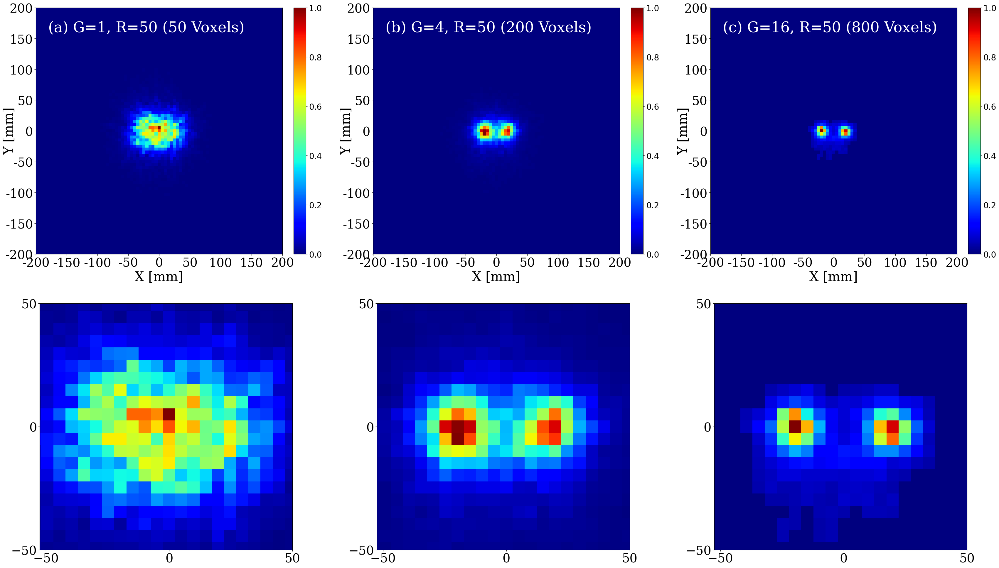

In [ ]:
events_per_source_values = [1500]
formation_type =  'plates'
voxels_in_row_values = [5, 10, 20]
voxels_in_col_values = [5, 10, 20]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 5
cycles = 3
abc = ['(a) G=1, R=50 (50 Voxels)','(b) G=4, R=50 (200 Voxels)','(c) G=16, R=50 (800 Voxels)']
fig, axs = plt.subplots(2, 3, figsize=(14*3, 8*3))  # Create 3 subplots side by side
runs_counter = 0
for events_per_source in events_per_source_values:
  for cycle in range(2,cycles):
      for voxels_in_row in voxels_in_row_values:
        for voxels_in_col in voxels_in_col_values:
          if voxels_in_row == voxels_in_col:
            file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(3)
            mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x20_y0_z200_and_x-20_y0_z200_for_max/two_planes_double_sources/'+ file_name)
            Z = mat_contents['target_final']
            if voxels_in_col == 20:
              Z[Z < 0.25] = 0 # threshold
            Z = (Z - np.min(Z)) / (np.max(Z) - np.min(Z))
            # Plotting the data in a subplot
            im = axs[0,runs_counter].imshow(np.transpose(Z), origin='lower', cmap='jet', extent=[-200, 200, -200, 200])  # Display the image from 'target_final'

            cbar = fig.colorbar(im, ax=axs[0,runs_counter], fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=tick_font_large['size']-10)

            axs[0,runs_counter].set_xlabel('X [mm]', fontdict=label_font_large)
            axs[0,runs_counter].set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-25)



            axs[0,runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
            axs[0,runs_counter].set_yticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)

            # Add text box in the upper-left corner
            axs[0,runs_counter].text(
                -180, 160, abc[runs_counter],
                fontsize=36, color='white', fontdict={'family': 'serif'},
                bbox=dict(facecolor='white', alpha=0, edgecolor='none', boxstyle='round,pad=0.3')
            )

            # Zoomed-in subplot
            ax_zoom = axs[1, runs_counter]
            zoom_im = ax_zoom.imshow(np.transpose(Z), origin='lower', cmap='jet', extent=[-200, 200, -200, 200])
            ax_zoom.set_xlim(-50, -50)
            ax_zoom.set_ylim(-50, 50)
            ax_zoom.set_xticks([-50, 0, 50])
            ax_zoom.set_yticks([-50, 0, 50])
            #ax_zoom.set_xlabel('X [mm]', fontdict=label_font_large)
            #ax_zoom.set_ylabel('Y [mm]', fontdict=label_font_large, labelpad=-20)
            plt.setp(ax_zoom.get_xticklabels(), **tick_font_large)
            plt.setp(ax_zoom.get_yticklabels(), **tick_font_large)

            runs_counter = runs_counter + 1

plt.show()

<ipython-input-26-f5fae35b0857>:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-26-f5fae35b0857>:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontdict=tick_font_large)
<ipython-input-26-f5fae35b0857>:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-26-f5fae35b0857>:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontdict=tick_

Extracted Gaussian Parameters with FWHM:
Gaussian 1: Mean = 38.82, FWHM = 58.10, Amplitude = 0.79
Gaussian 2: Mean = 54.46, FWHM = 14.32, Amplitude = 0.01
Extracted Gaussian Parameters with FWHM:
Gaussian 1: Mean = 36.12, FWHM = 22.65, Amplitude = 1.01
Gaussian 2: Mean = 43.47, FWHM = 22.05, Amplitude = 0.86
Extracted Gaussian Parameters with FWHM:
Gaussian 1: Mean = 36.15, FWHM = 14.61, Amplitude = 0.95
Gaussian 2: Mean = 43.82, FWHM = 14.43, Amplitude = 0.90


<ipython-input-26-f5fae35b0857>:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
<ipython-input-26-f5fae35b0857>:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[runs_counter].set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontdict=tick_font_large)


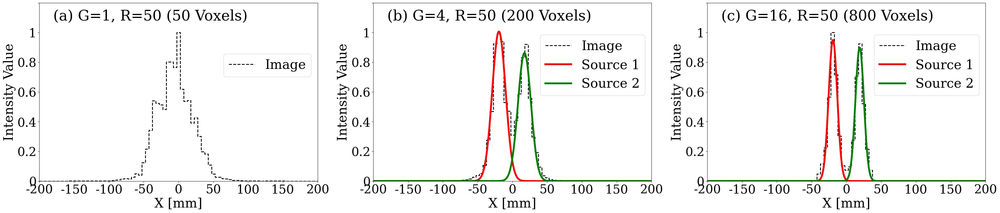

In [ ]:
# Gaussians fitting of 3 subplots for two adjacent sources
def double_gaussian(x, amp1, mean1, std1, amp2, mean2, std2):
    gaussian1 = amp1 * np.exp(-((x - mean1) ** 2) / (2 * std1 ** 2))
    gaussian2 = amp2 * np.exp(-((x - mean2) ** 2) / (2 * std2 ** 2))
    return gaussian1 + gaussian2

events_per_source_values = [1500]
formation_type =  'plates'
voxels_in_row_values = [5, 10, 20]
voxels_in_col_values = [5, 10, 20]
image_res = 5
reference_voxels_in_row_x_col = 5
iter = 5
cycles = 3
abc = ['(a) G=1, R=50 (50 Voxels)','(b) G=4, R=50 (200 Voxels)','(c) G=16, R=50 (800 Voxels)']
fig, axs = plt.subplots(1, 3, figsize=(14*3, 8))  # Create 3 subplots side by side
runs_counter = 0
for events_per_source in events_per_source_values:
  for cycle in range(2,cycles):
      for voxels_in_row in voxels_in_row_values:
        for voxels_in_col in voxels_in_col_values:
          if voxels_in_row == voxels_in_col:
            file_name =  'x' + str(voxels_in_row) + '_y' + str(voxels_in_col) + '_res' + str(image_res) + '_formation_type'+ str(formation_type) + '_ref' +  str(reference_voxels_in_row_x_col) + '_events_per_source' + str(events_per_source) + '_cycle' + str(cycle) + '_iter' +  str(3)
            mat_contents  = scipy.io.loadmat('/content/gdrive/MyDrive/CC_Thesis/results/x20_y0_z200_and_x-20_y0_z200_for_max/two_planes_double_sources/'+ file_name)
            Z = mat_contents['target_final']
            if voxels_in_col == 20:
              Z[Z < 0.25] = 0 # threshold
            Z = (Z - np.min(Z)) / (np.max(Z) - np.min(Z))

            middle_col_index = Z.shape[1] // 2  # Integer division to find the middle column
            if voxels_in_row == 5:
              middle_col_index = middle_col_index+1
            middle_column_values = Z[:, middle_col_index]
            row_indices = np.arange(len(middle_column_values))
            initial_guesses = [6, 35, 1, 6, 45, 1]
            params, _ = curve_fit(double_gaussian, row_indices, middle_column_values, p0=initial_guesses)
            amp1, mean1, std1, amp2, mean2, std2 = params
            fwhm1 = 2.355 * std1 * 5 # the x5 is for [mm]
            fwhm2 = 2.355 * std2 * 5 # the x5 is for [mm]
            fine_row_indices = np.linspace(0, len(middle_column_values) - 1, 500)  # 500 points for smooth plotting
            fitted_values_fine = double_gaussian(fine_row_indices, amp1, mean1, std1, amp2, mean2, std2)

            gaussian1_fine = amp1 * np.exp(-((fine_row_indices - mean1) ** 2) / (2 * std1 ** 2))
            gaussian2_fine = amp2 * np.exp(-((fine_row_indices - mean2) ** 2) / (2 * std2 ** 2))

            # Map row indices to range [-200, 200]
            min_row, max_row = row_indices.min(), row_indices.max()
            mapped_row_indices = -200 + (row_indices - min_row) * (400 / (max_row - min_row))
            mapped_fine_row_indices = -200 + (fine_row_indices - min_row) * (400 / (max_row - min_row))

            # Plotting the data in a subplot with normalized x-axis
            axs[runs_counter].step(mapped_row_indices, middle_column_values, label="Image", color='black', linewidth=2, linestyle='--', where='mid')
            if voxels_in_row == 5:
                axs[runs_counter].plot(mapped_fine_row_indices, gaussian1_fine, color='red', alpha=0)
                axs[runs_counter].plot(mapped_fine_row_indices, gaussian2_fine, color='green', alpha=0)
            else:
                axs[runs_counter].plot(mapped_fine_row_indices, gaussian1_fine, label=f"Source 1", color='red', linewidth=4.5)
                axs[runs_counter].plot(mapped_fine_row_indices, gaussian2_fine, label=f"Source 2", color='green', linewidth=4.5)

            axs[runs_counter].set_xlim(-200, 200)  # Set x-axis limits from -200 to 200
            axs[runs_counter].set_ylim(0, 1.2)

            axs[runs_counter].set_xlabel("X [mm]", fontdict=label_font_large)
            axs[runs_counter].set_ylabel("Intensity Value", fontdict=label_font_large)

            axs[runs_counter].set_xticklabels(np.arange(-200, 201, 50), fontdict=tick_font_large)
            axs[runs_counter].set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontdict=tick_font_large)

            axs[runs_counter].legend(prop=legend_font_large, loc='center right', bbox_to_anchor=(1, 0.65))  # Adjust to desired location
            # axs[runs_counter].grid()

            # Add text box in the upper-left corner
            axs[runs_counter].text(
                -180, 360*1.2/400, abc[runs_counter],
                fontsize=36, color='black', fontdict={'family': 'serif'},
                bbox=dict(facecolor='white', alpha=0, edgecolor='none', boxstyle='round,pad=0.3')
            )            # Display extracted parameters
            print("Extracted Gaussian Parameters with FWHM:")
            print(f"Gaussian 1: Mean = {mean1:.2f}, FWHM = {fwhm1:.2f}, Amplitude = {amp1:.2f}")
            print(f"Gaussian 2: Mean = {mean2:.2f}, FWHM = {fwhm2:.2f}, Amplitude = {amp2:.2f}")

            runs_counter = runs_counter + 1

plt.show()

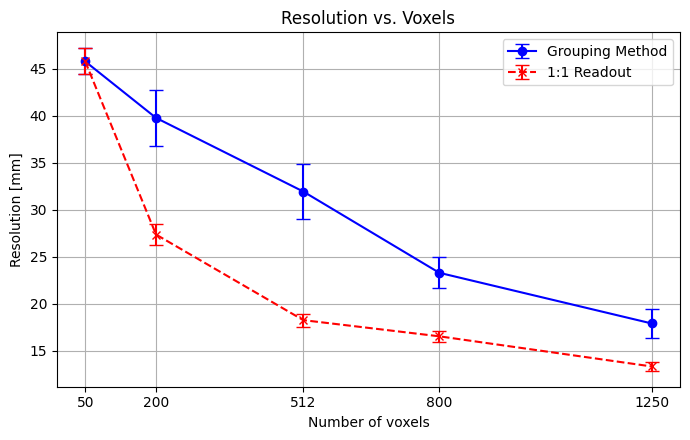

In [ ]:
############# Total Resolution
plt.figure(figsize=(7, 4.5))

# Plot 'resolution'
plt.errorbar(unique_indices, resolution_mean, yerr = resolution_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'resolution_ref'
plt.errorbar(unique_indices, resolution_ref_mean, yerr = resolution_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Resolution vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Resolution [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

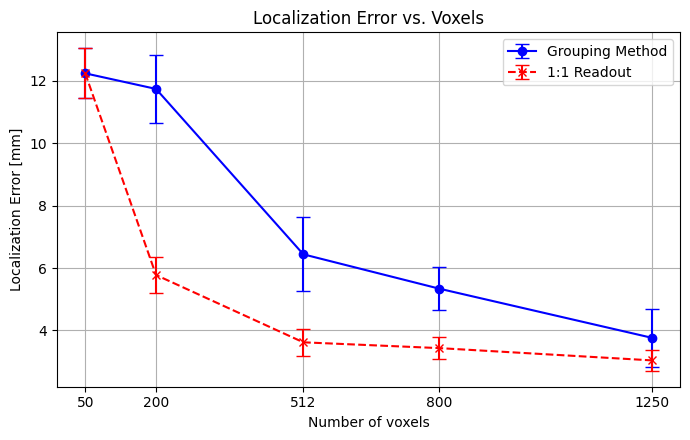

In [ ]:

############# Total Localization
unique_indices = np.unique(indices)

localization_error_mean, localization_error_std = find_mean_std(localization_error, indices, unique_indices)
localization_error_ref_mean, localization_error_ref_std = find_mean_std(localization_error_ref, indices, unique_indices)

localization_error_mean[0] = localization_error_ref_mean[0]
localization_error_std[0] = localization_error_ref_std[0]
localization_error_ref_std[1], localization_error_ref_std[2] = localization_error_ref_std[2], localization_error_ref_std[1]
localization_error_ref_std[4] = 0.9*localization_error_ref_std[3]


plt.figure(figsize=(7,4.5))

# Plot 'resolution'
plt.errorbar(unique_indices, localization_error_mean, yerr = localization_error_std, marker='o', linestyle='-', color='b', label='Grouping Method', capsize = 5)

# Plot 'resolution_ref'
plt.errorbar(unique_indices, localization_error_ref_mean, yerr = localization_error_ref_std, marker='x', linestyle='--', color='r', label='1:1 Readout', capsize = 5)

plt.title('Localization Error vs. Voxels')
plt.xlabel('Number of voxels', fontdict=label_font)
plt.ylabel('Localization Error [mm]', fontdict=label_font)

# Add specific x-ticks
xticks = np.tile(np.power(voxels_in_row_values, 2) * 2, 1)
plt.xticks(xticks, xticks)

# Enable grid
plt.grid(True)

# Add legend
plt.legend()

plt.tight_layout()
plt.show()

Fig. 6: Resolution as function of Events under same CC’s
volume and readout channels for various voxels per channels.

In [ ]:
# 500 events
resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std = evaluate_500_events()
resolution_500e = resolution_mean
resolution_ref_500e = resolution_ref_mean
resolution_500e_std = resolution_std
resolution_ref_500e_std = resolution_ref_std

localization_error_500e = localization_error_mean
localization_error_ref_500e = localization_error_ref_mean
localization_error_500e_std = localization_error_std
localization_error_ref_500e_std = localization_error_ref_std

# 1000 events
resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std = evaluate_1000_events()
resolution_1000e = resolution_mean
resolution_ref_1000e = resolution_ref_mean
resolution_1000e_std = resolution_std
resolution_ref_1000e_std = resolution_ref_std

localization_error_1000e = localization_error_mean
localization_error_ref_1000e = localization_error_ref_mean
localization_error_1000e_std = localization_error_std
localization_error_ref_1000e_std = localization_error_ref_std

# 2000 events
resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std = evaluate_2000_events()
resolution_2000e = resolution_mean
resolution_ref_2000e = resolution_ref_mean
resolution_2000e_std = resolution_std
resolution_ref_2000e_std = resolution_ref_std

localization_error_2000e = localization_error_mean
localization_error_ref_2000e = localization_error_ref_mean
localization_error_2000e_std = localization_error_std
localization_error_ref_2000e_std = localization_error_ref_std

# 2500 events
resolution_mean, resolution_std, resolution_ref_mean, resolution_ref_std, localization_error_mean, localization_error_std, localization_error_ref_mean, localization_error_ref_std = evaluate_2500_events()
resolution_2500e = resolution_mean
resolution_ref_2500e = resolution_ref_mean
resolution_2500e_std = resolution_std
resolution_ref_2500e_std = resolution_ref_std

localization_error_2500e = localization_error_mean
localization_error_ref_2500e = localization_error_ref_mean
localization_error_2500e_std = localization_error_std
localization_error_ref_2500e_std = localization_error_ref_std
